<a href="https://colab.research.google.com/github/20023170uhi/20023170_DataAnalytics/blob/main/20023170_assignment1_pt1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction
 
NYC emergency services have requested an assessment on the impact of weather conditions on a particular day on the number of traffic collisions in the city. This is to facilitate the creation of multiple models to predict the number of collisions, ensuring adequate resources are available. In this report, we investigate and analyse the available historical data dating from 2012, with a view to creating 2 regression models: a linear regression model and a Deep Neural Network regression model.  



# Methodology

## Initial data from Big Query

There are 2 sets of data required for this analysis:  
* Motor vehicle collisions
* Weather 

Both of these were sourced from public data sets found in the Big Query.  
The NYPD vehicle collisions from 2012 can be found at bigquery-public-data > new_york_mv_collisions. We created the first of our datasets based off this data.  
If we take an initial look at the data, we can see that there is an entry per incident, whereas we only require a count of the total amount of incidents per calendar day and the date.

  
![picture](https://drive.google.com/uc?id=1JbqZY07cpiE6RQmbmHZtLwvPfM0fVn5K)  
  

Therefore, we created a view that provided us with a count of the collisions for each day of the data. Within the SQL query run, we changed the collision date to date and created a column with the count on the items when grouped by collision date. We ran an additional query to add a weekday column to this view.  2 SQL queries below:  


![picture](https://drive.google.com/uc?id=1X_T59DPSnPJoA-iIrviOe-csVJ9k2Zru)


![picture](https://drive.google.com/uc?id=1kywT7BC_ne55-saX7T9IN-S01OIIavlK) 

Our collision data appeared as below.  

![picture](https://drive.google.com/uc?id=1WOIZ__yGAKH9wEmUOyxAOK29WfILf_Kg) 


Weather data was sourced from the dataset from the National Oceanic and Atmospheric Administration (NOAA) and can be found at big-query-public-data > noaa_gsod. There are multiple datasets, one for each year. As the collision data spans from 2012 until the present day, we extracted the weather data from the same years.  

The NOAA data is extensive, containing daily weather readings from up to a possible 29,000 different stations (not all live). The station selected was USAF 725060, located at Central Park in NYC. The weather variables selected were:


* Temperature (temp)
* Dew point (dewp) 
* Sea level pressure (slp)
* Visibility (visib) 
* Wind speed (wdsp)
* Maximum wind speed (mxpsd)
* Maximum wind gust (gust) 
* Maximum temperature (max) 
* Minimum temperature (min) 
* Precipitation (prcp)
* Snow depth (sndp) 
* Fog (fog)

We also selected day (da), month (mo), year and created a new date field (as a date), the last of which we would use to merge the data with the previously acquired collision data.
These variables were selected from each of the annual datasets from 2012 to 2020 and joined to create one dataset:  

![picture](https://drive.google.com/uc?id=1ck-oF4mbrCyl-7nVbamyVw9kJNTdF60L)  

As can be seen from this query, for one of the years our criteria differ slightly. Station 725060 is associated to multiple WBAN codes. In most years, this is not relevant. In the 2014 data we have an issue where there are multiple daily entries associated with station 725060 due there being weather data present from more than 1 of its WBAN codes. If we run the below query to count the number of entries in 2014 from this station, if returns 424 and not the 365 we would expect.  

  
![picture](https://drive.google.com/uc?id=1DwFGXhQlacIjwSpzG82tp8VnceqsHiWo)  


The data contains entries from WBAN 14756 and 14704. If we change the above query to WHERE stn = '725060' AND wban = '14704', we find this returns the additional 54 entries. Therefore, we also specified the WBAN as 14756 to ensure that we had no duplicate entries.  

Once we had both the collision and weather data, we could run our final SQL query to merge the 2 sets of data to produce a table to export and use in our analysis. The data was merged using the date field which also ensured that if any days of data were missing from our collision date, these would automatically be excluded.  

Below is the final view of our collated data:
  

![picture](https://drive.google.com/uc?id=1-Af6dnOzD3-5Yh0AO0hj15TY5G9NgLJE)  

This was exported and uploaded onto GitHub as a csv. file:  
<br>
day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
5,2020,01,24,2020-01-24,37.3,33.7,1028.5,6.5,3.3,8,999.9,46.0,19.9,0.0,999.9,1,523
2,2020,01,07,2020-01-07,39.0,26.6,1016.6,10.0,8,13,999.9,43.0,24.1,0.0,999.9,0,402
1,2020,01,13,2020-01-13,42.5,37.0,1029.6,9.5,9.2,13,999.9,57.0,39.9,0.01,999.9,0,473
3,2020,01,15,2020-01-15,43.9,38.3,1019.4,8.2,5.4,14,15.0,51.1,35.1,0.02,999.9,1,506
5,2020,01,03,2020-01-03,45.8,42.9,1010.3,7.0,10.3,15,999.9,46.9,33.1,0.0,999.9,1,452
1,2020,01,06,2020-01-06,33.5,24.0,1013.2,9.9,5.3,15,999.9,43.0,24.1,0.01,999.9,1,455
4,2020,01,30,2020-01-30,31.6,19.4,1023.4,10.0,9.4,15,999.9,37.0,21.9,0.0,999.9,0,522
7,2020,01,26,2020-01-26,44.3,40.7,1006.4,6.5,13,19,28.0,51.1,36.0,0.44,999.9,1,395




## Primary Data Analysis

### Full Data  
We begin by reading the raw data in and taking a look at the summary to see if there anything potentially unusual or incorrect with the data distribution.  


In [1105]:
colldata <- read.csv("https://raw.githubusercontent.com/20023170uhi/20023170_DataAnalytics/main/results-20201204-201034.csv", stringsAsFactors = TRUE)

In [1106]:
head(colldata)

,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,5,2020,1,24,2020-01-24,37.3,33.7,1028.5,6.5,3.3,8,999.9,46.0,19.9,0.00,999.9,1,523
2,2,2020,1,7,2020-01-07,39.0,26.6,1016.6,10.0,8.0,13,999.9,43.0,24.1,0.00,999.9,0,402
3,1,2020,1,13,2020-01-13,42.5,37.0,1029.6,9.5,9.2,13,999.9,57.0,39.9,0.01,999.9,0,473
4,3,2020,1,15,2020-01-15,43.9,38.3,1019.4,8.2,5.4,14,15.0,51.1,35.1,0.02,999.9,1,506
5,5,2020,1,3,2020-01-03,45.8,42.9,1010.3,7.0,10.3,15,999.9,46.9,33.1,0.00,999.9,1,452
6,1,2020,1,6,2020-01-06,33.5,24.0,1013.2,9.9,5.3,15,999.9,43.0,24.1,0.01,999.9,1,455


In [1107]:
summary(colldata)

      day         year            mo               da           collision_date
 Min.   :1   Min.   :2012   Min.   : 1.000   Min.   : 1.00   2012-07-01:   1  
 1st Qu.:2   1st Qu.:2014   1st Qu.: 4.000   1st Qu.: 8.00   2012-07-02:   1  
 Median :4   Median :2016   Median : 7.000   Median :16.00   2012-07-03:   1  
 Mean   :4   Mean   :2016   Mean   : 6.646   Mean   :15.73   2012-07-04:   1  
 3rd Qu.:6   3rd Qu.:2018   3rd Qu.:10.000   3rd Qu.:23.00   2012-07-05:   1  
 Max.   :7   Max.   :2020   Max.   :12.000   Max.   :31.00   2012-07-06:   1  
                                                             (Other)   :3069  
      temp            dewp               slp            visib       
 Min.   : 5.80   Min.   :   -6.70   Min.   :  989   Min.   : 0.200  
 1st Qu.:41.30   1st Qu.:   32.75   1st Qu.: 1012   1st Qu.: 7.100  
 Median :52.70   Median :   45.80   Median : 1017   Median : 9.400  
 Mean   :52.35   Mean   :   48.02   Mean   : 1023   Mean   : 8.307  
 3rd Qu.:64.80   3rd Qu

We can clearly see some anomalies in the summary which we will need to take a look at. A number of the weather variables have maximum values well above the main distribution. Slp, dewp, mxpsd, gust, and prcp all have this issue. They all also have maximum values which are 999.99 or 99.99 which would suggest these might be default values. Visibility has both 3rd quartile and maximum as 10.00 which is unusual. Snow depth again has a maximum value of 999.99, but this value is also the mean and 1st and 3rd quartiles, which suggests a large amount of missing or erroneous data. Fog also only has a range of 0 to 1.  


Let’s take a look at the information available on the weather datasets in Big Query to clarify these variables:  
<br>

**dewp** - *Missing = 9999.9*  

**slp** - *Missing = 9999.9*  

**wdsp** - *Missing = 999.9*  

**mxpsd** - *Missing = 999.9*  

**gust** - *Missing = 999.9*  

**prcp** - *Missing = 99.99 Note: Many stations do not report '0' on days with no precipitation--therefore, '99.99' will often appear on these days.*  

**visib** - *Missing = 999.9* 

**sndp** - *Missing = 999.9 Note: Most stations do not report '0' on days with no snow on the ground--therefore, '999.9' will often appear on these days*  

**fog** - *Indicators (1 = yes, 0 = no/not reported) for the occurrence during the day*  
<br>
  

We can see that for dewp, slp, wdsp, mxpsd, gust and prcp, these maximum values are invalid and should either be removed or amended to 0.00. We shall keep this in mind when plotting our variables.  
Fog has 2 absoulte values of 1 (YES) and 0 (NO), which make it unsuitable for a linear regression model. We will exclude it from the analysis for now.  
Snow also has missing / invalid values at 999.99 but we have 2 issues here. One, is that unlike most of the other criteria where this is an indication of *missing* data, here is can equate to either 0.00 or just be invalid. The other issue we have is that even considering this, the distribution is still very skewed towards this value. If we look at the unique values as per below, we see that there is only 1 measurement of snow, which is incorrect. After the initial analysis, we will source valid data from another station.  



In [1108]:
unique(colldata$sndp)

[1] 999.9   3.9

Finally, with visibility we have no issues with missing values, but we do have an anomaly as to how this variable is calculated. The maximum visibility you can have as per meteorological measurements is 10.00 miles (NOAA, 2021), hence the distribution we are seeing here. We will look at this data as the rest and see what it yields.  


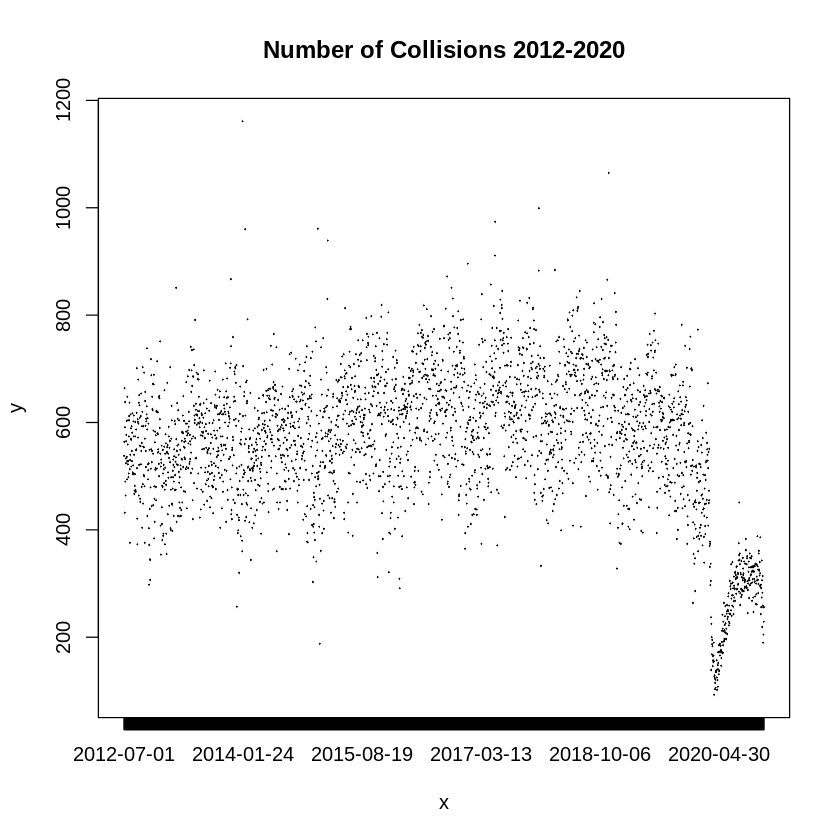

In [1109]:
plot(colldata$collision_date, colldata$NUM_COLLISIONS, main = "Number of Collisions 2012-2020")

Here we have plotted the number of collisions over the entire period 2012 to 2020. We can see a general annual pattern which shows a slow increase over the years until around 2017 / 2018. 2020 is showing a completely different distribution from the rest. Below we have the data plotted again but with the years clearly defined.  


In [1110]:
library(tidyverse)

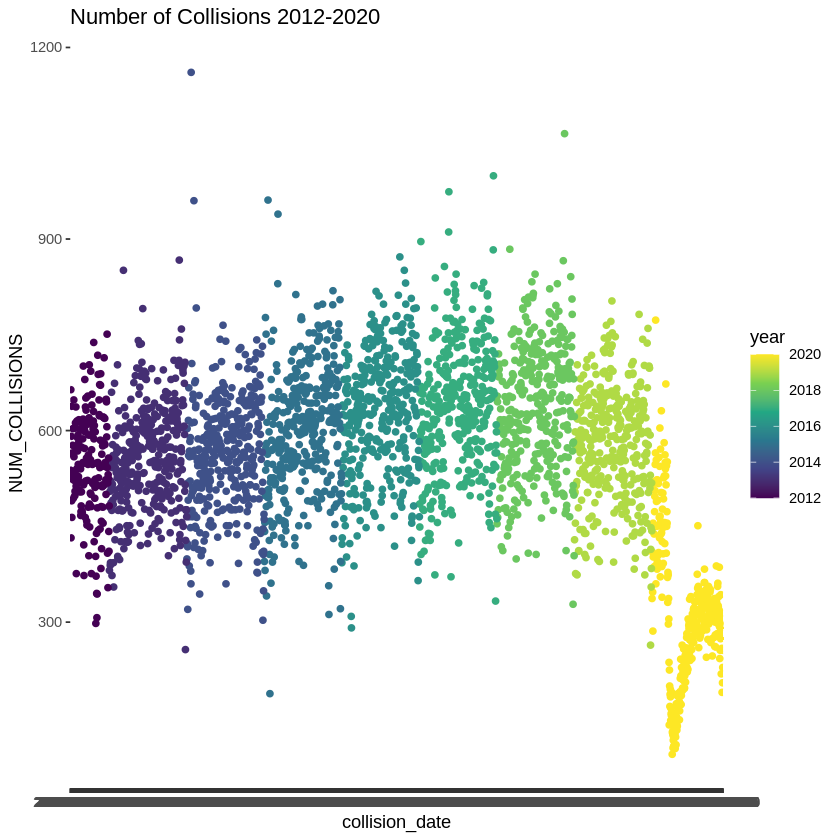

In [1111]:
ggplot(colldata, aes(collision_date, NUM_COLLISIONS, colour = year)) +
  geom_point() +
  scale_colour_viridis_c() +
  labs(title = "Number of Collisions 2012-2020")

As we can see, 2020 is an anomaly. This is caused by the COVID-19 pandemic and the lockdowns in NYC (we can see the large drop in collisions around March / April when the first lockdown occurred).  This will likely skew our data and should be excluded. We shall plot the variables with and without 2020 and ascertain its impact.  


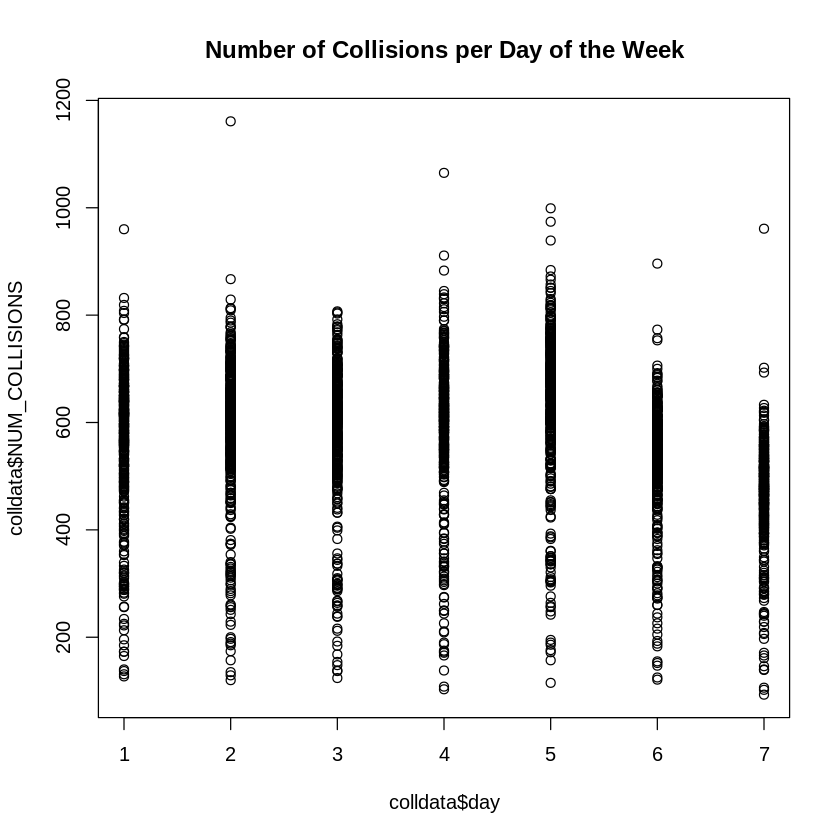

In [1112]:
plot(colldata$day, colldata$NUM_COLLISIONS, main = "Number of Collisions per Day of the Week")

In [1113]:
cor(colldata$day, colldata$NUM_COLLISIONS)

[1] -0.1944291

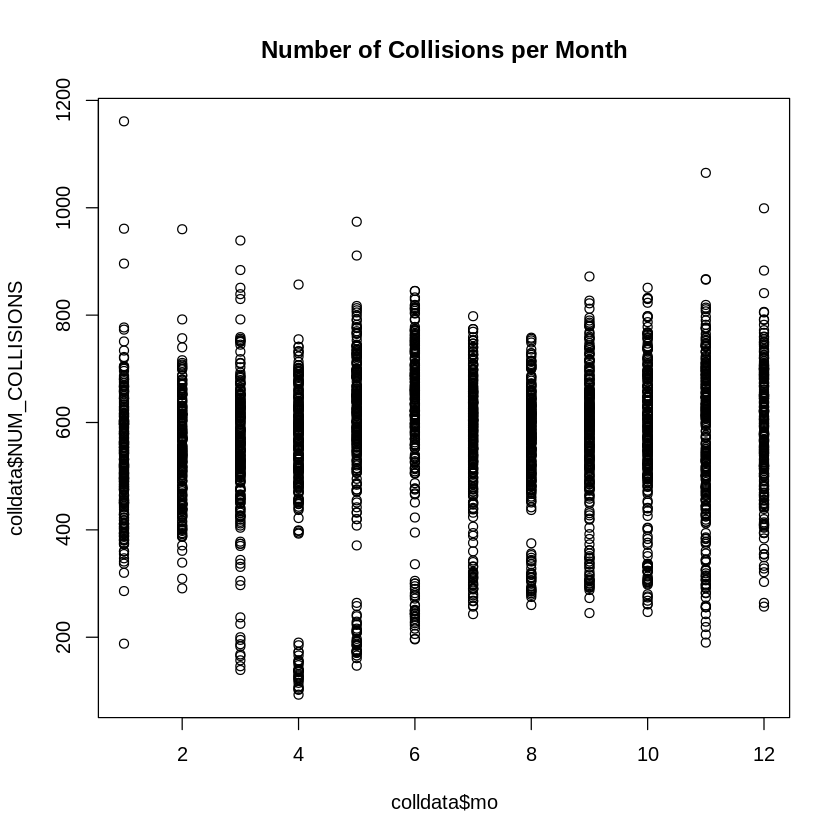

In [1114]:
plot(colldata$mo, colldata$NUM_COLLISIONS, main = "Number of Collisions per Month")

In [1115]:
cor(colldata$mo, colldata$NUM_COLLISIONS)

[1] 0.09352636

In the plot of weekdays we see a gradual increase over Monday to Friday followed by a decline over the weekend. In the plot for months, we do not see a clear pattern at the moment. For both of these were seeing indication on outliers. Especially in the months plot we can see a collection of points further down than the rest for months 3-6 (March - June) and 8 (August). These are again most likely due to the lower number of trips during the COVID lockdowns in 2020. In the weekdays, we can see the distribution is quite board and tappers off towards the bottom.  


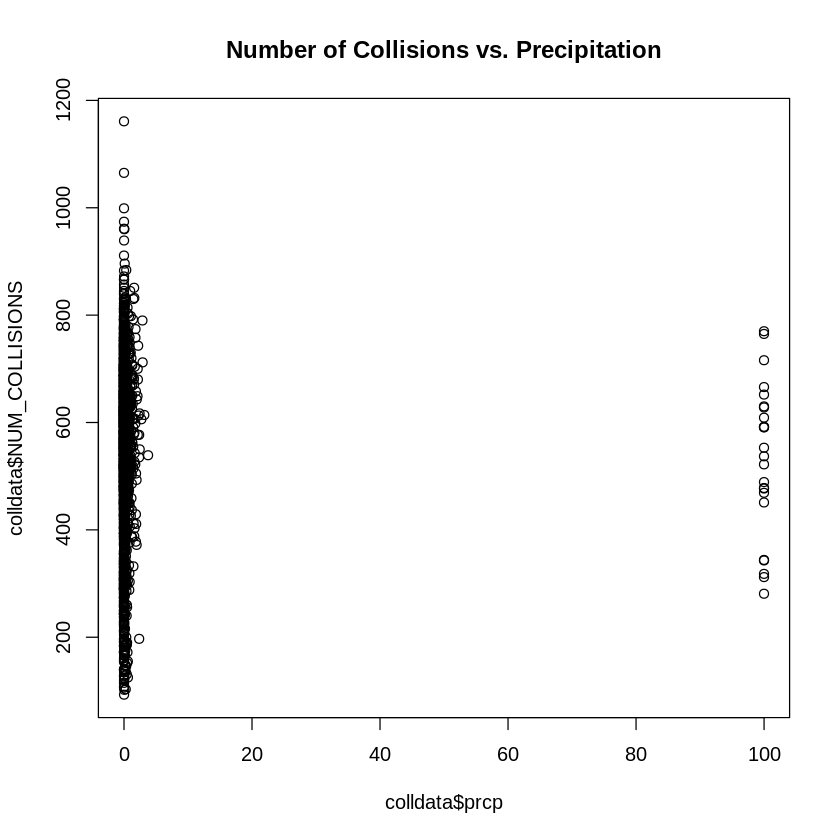

In [1116]:
plot(colldata$prcp, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. Precipitation")

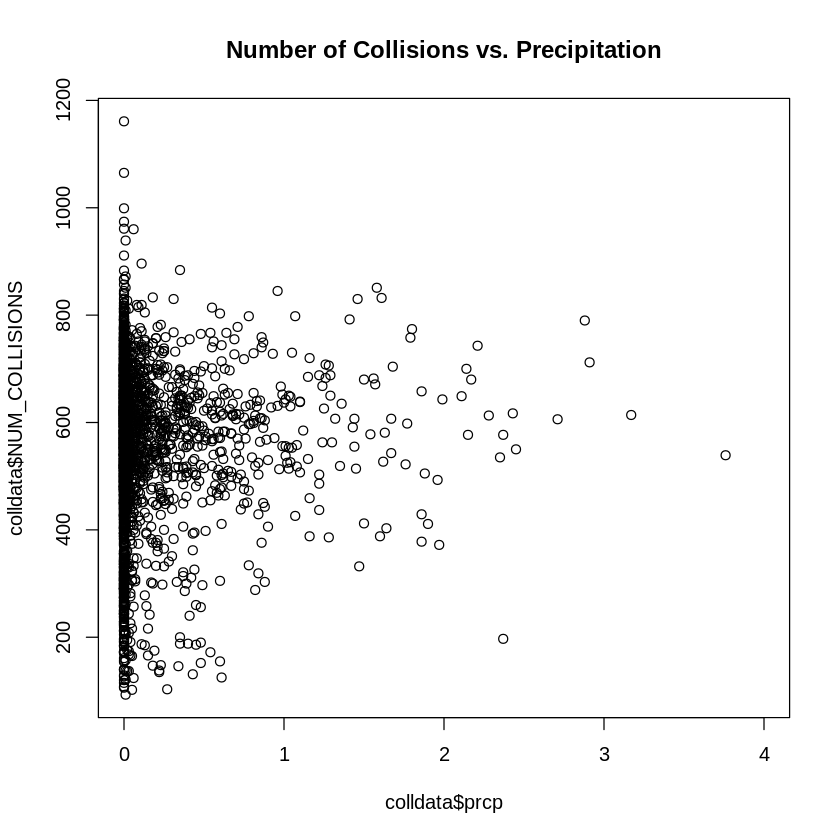

In [1117]:
plot(colldata$prcp, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. Precipitation", xlim=c(0,4)) 
# taking outliers at 99.99 out - days with no value

In [1118]:
cor(colldata$prcp, colldata$NUM_COLLISIONS)

[1] -0.02015417

For precipitation there does not appear to be any relationship. The correlation is low and there is no indication of a relationship on the plot even with the invalid values at 99.99 removed.

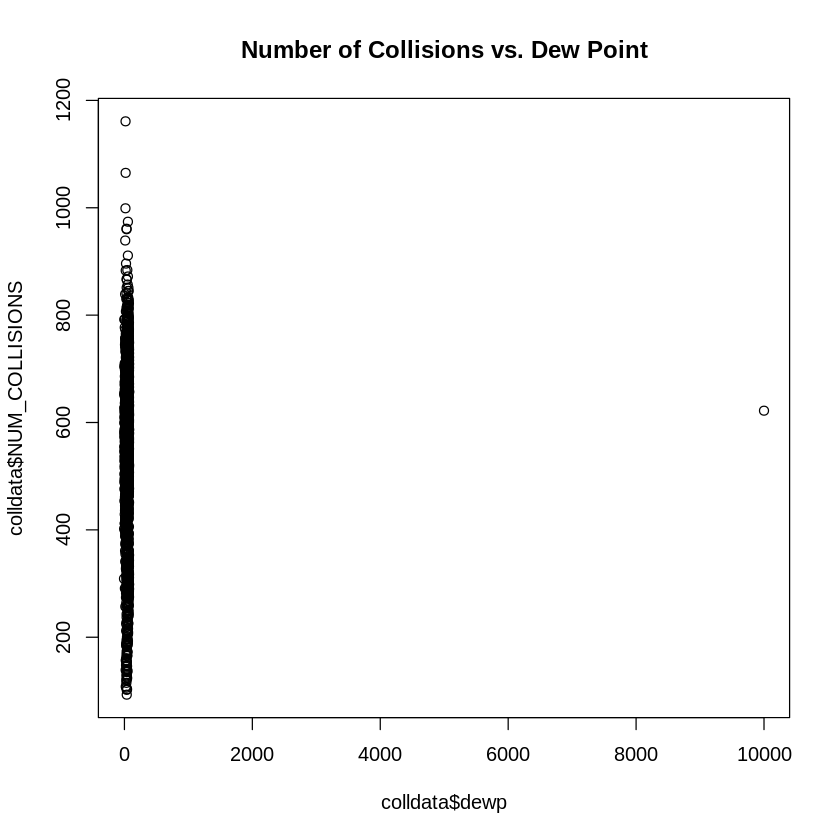

In [1119]:
plot(colldata$dewp, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. Dew Point")

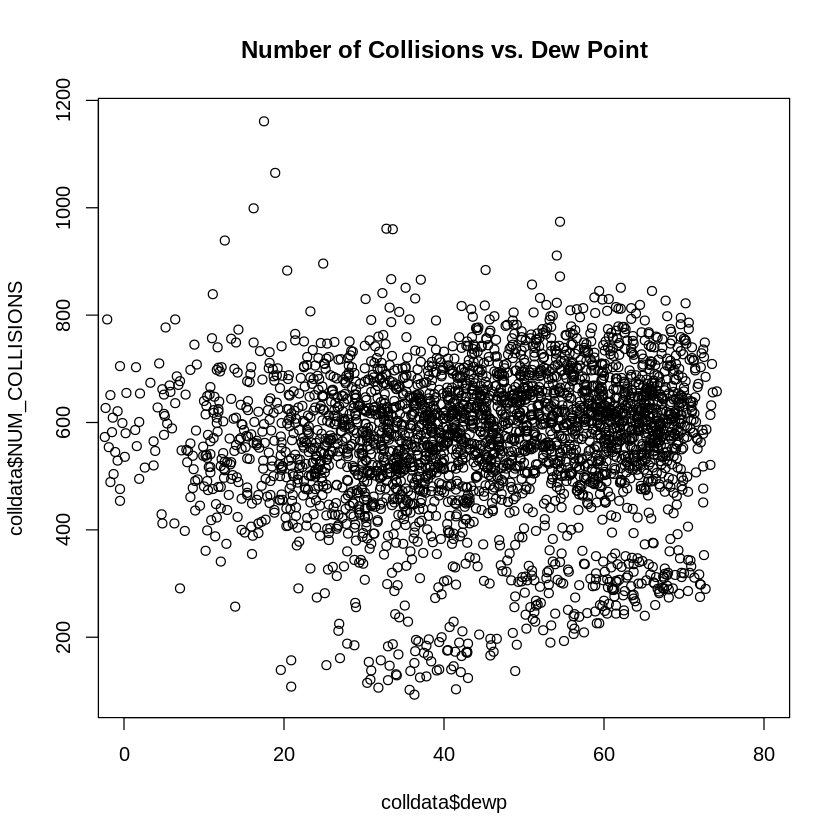

In [1120]:
plot(colldata$dewp, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. Dew Point", xlim = c(0,80))
# taking the outliers at 9999.99 out - days with no value

In [1121]:
cor(colldata$dewp, colldata$NUM_COLLISIONS)

[1] 0.01434563

For dew point there does not appear to be a relationship, although we can see a grouping of a large number of outliers in the plot with less collisions. Again, possibly the impact of 2020 on the data.

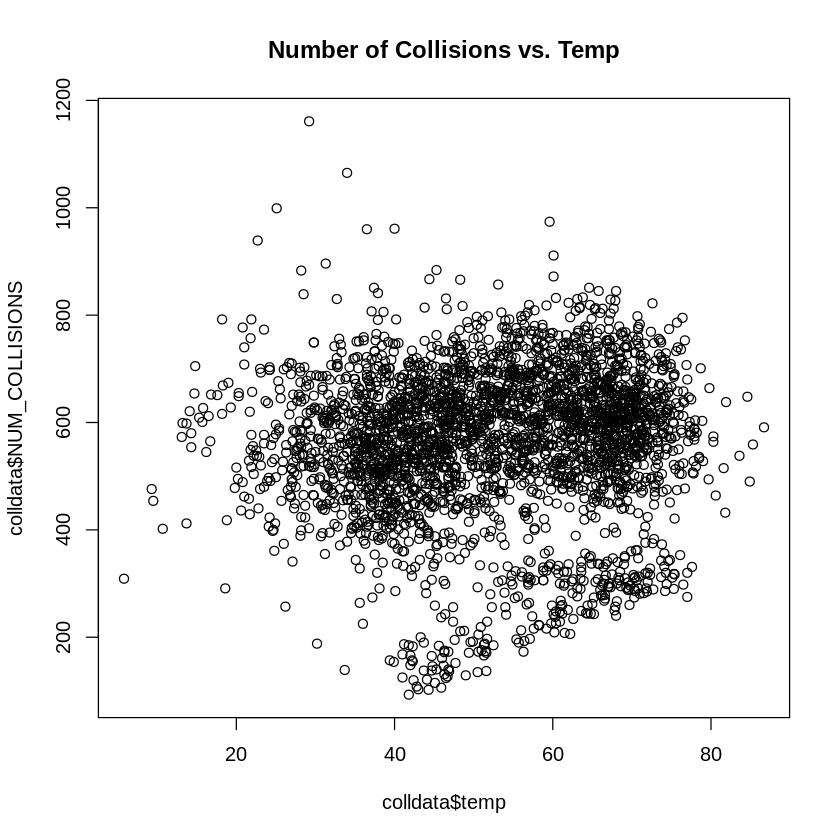

In [1122]:
plot(colldata$temp, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. Temp")

In [1123]:
cor(colldata$temp, colldata$NUM_COLLISIONS)

[1] 0.06194725

There is a stronger relationship with temperature than in any of the variables seen thus far. Again, we are seeing a group of outliers just down from the main distribution.

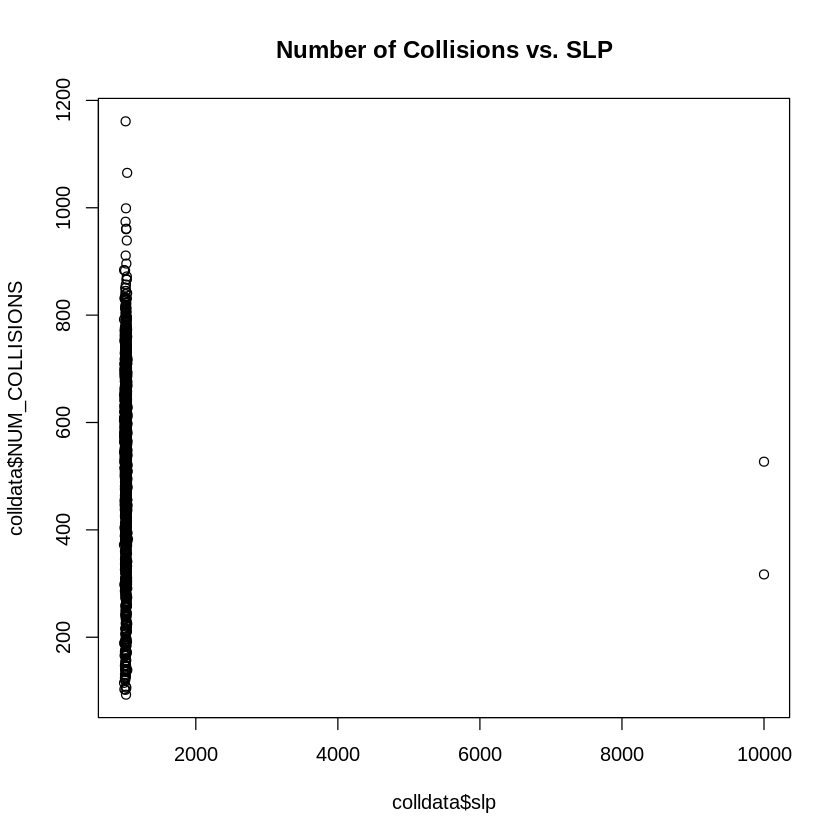

In [1124]:
plot(colldata$slp, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. SLP")

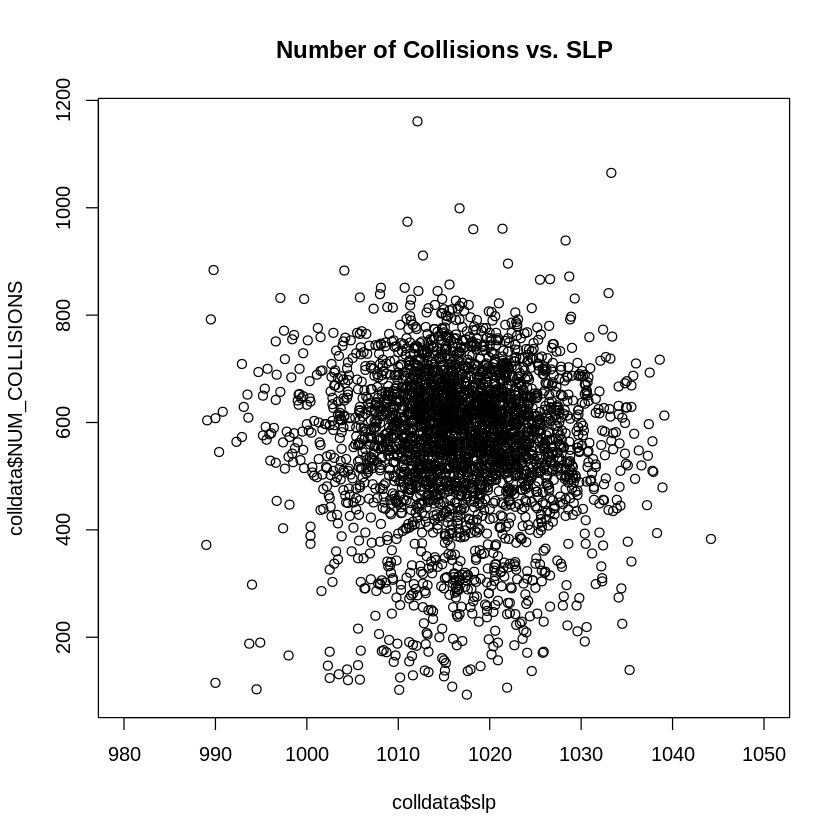

In [1125]:
plot(colldata$slp, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. SLP", xlim = c(980,1050))
# taking the outliers at 9999.99 out - days with no value

In [1126]:
cor(colldata$slp, colldata$NUM_COLLISIONS)

[1] -0.02760388

Mean sea level pressure also shows no relationship.

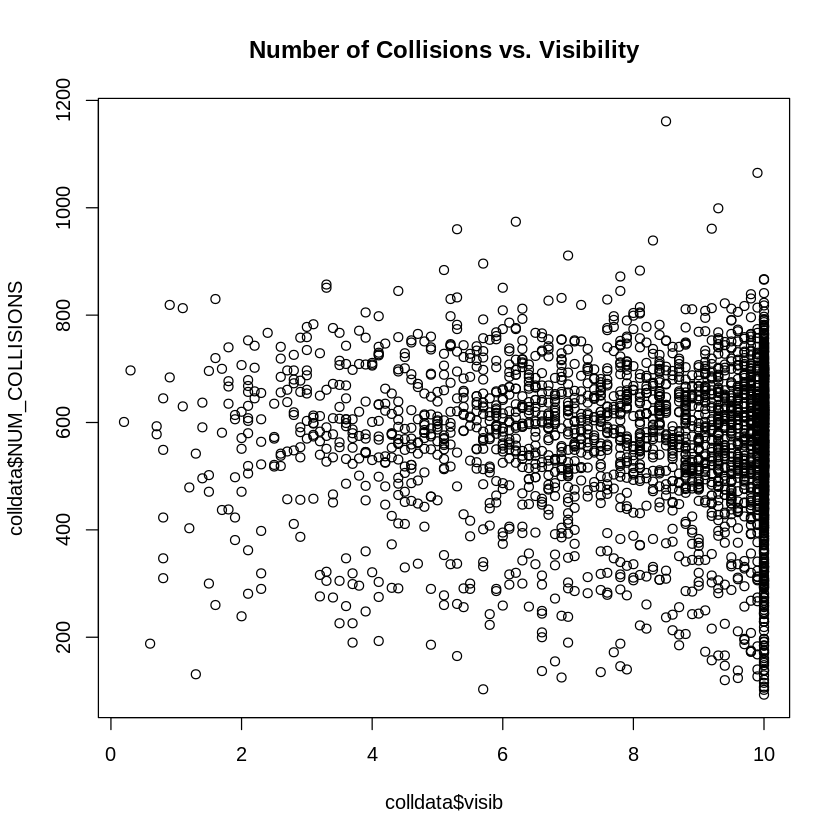

In [1127]:
plot(colldata$visib, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. Visibility")

In [1128]:
cor(colldata$visib, colldata$NUM_COLLISIONS)

[1] -0.0363416

For visibility we can see the concentration of points as a line at the 10-mile mark. There appears to be no relationship, but we shall remove these points to see if it improves the correlation. Again, we can see evidence of 2020 outliers on the plot.

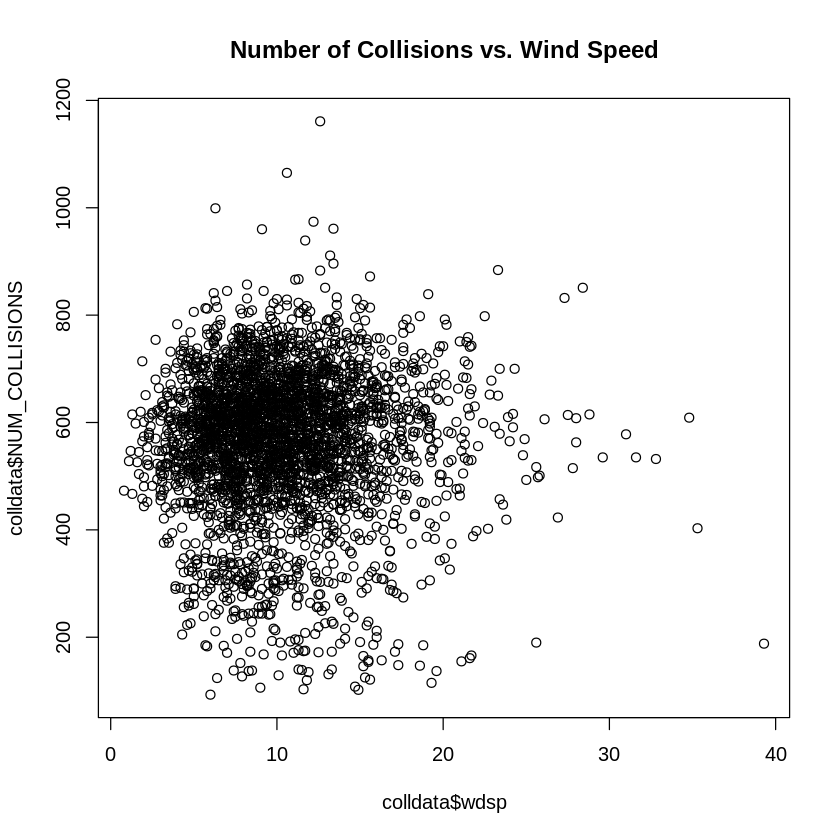

In [1129]:
plot(colldata$wdsp, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. Wind Speed")

In [1130]:
cor(colldata$wdsp, colldata$NUM_COLLISIONS)

[1] 0.00122965

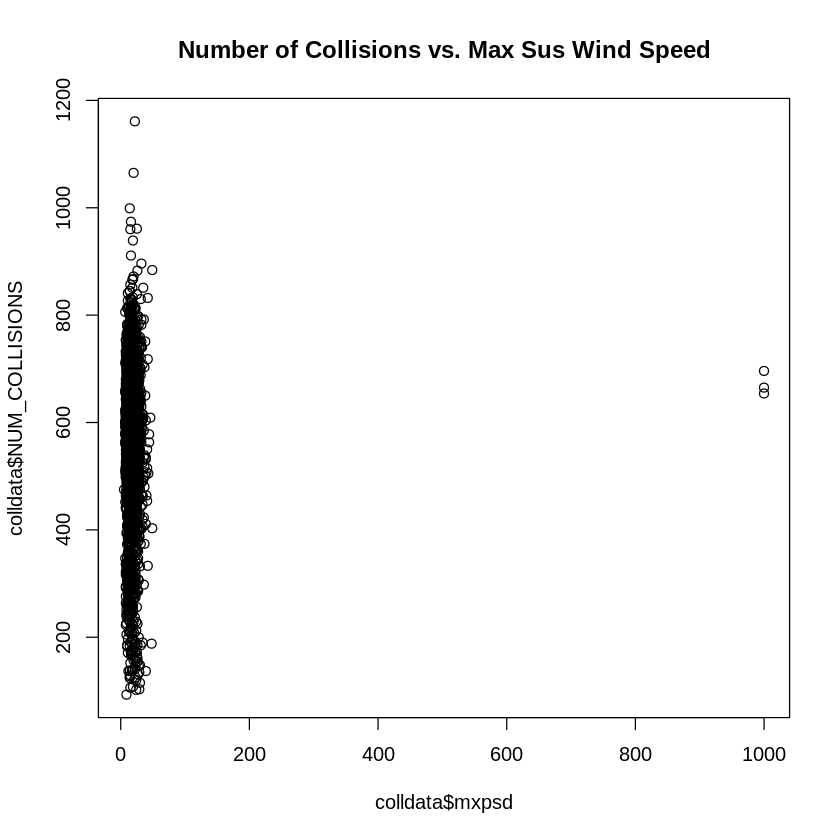

In [1131]:
plot(colldata$mxpsd, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. Max Sus Wind Speed")

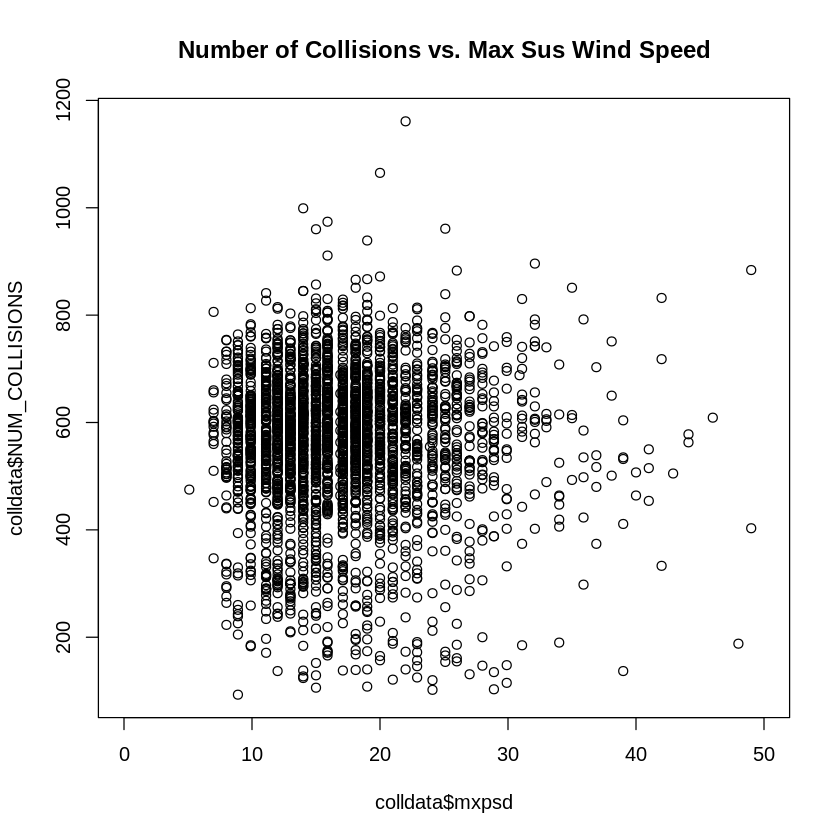

In [1132]:
plot(colldata$mxpsd, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. Max Sus Wind Speed", xlim = c(0,50))
# taking the outliers at 999.99 out - days with no value

In [1133]:
cor(colldata$mxpsd, colldata$NUM_COLLISIONS)

[1] 0.02298199

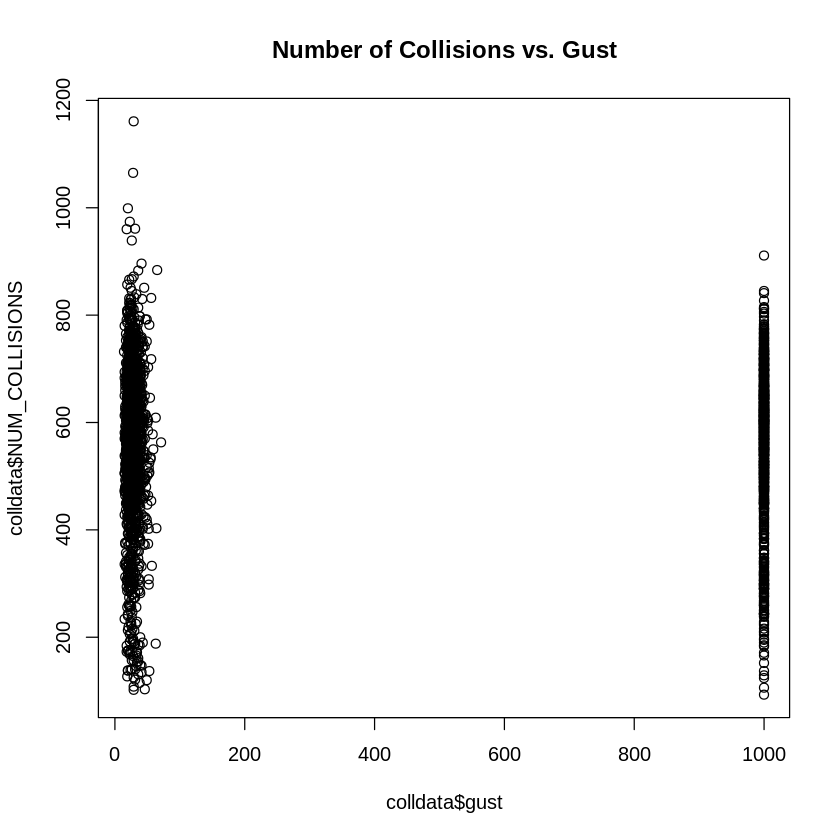

In [1134]:
plot(colldata$gust, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. Gust")

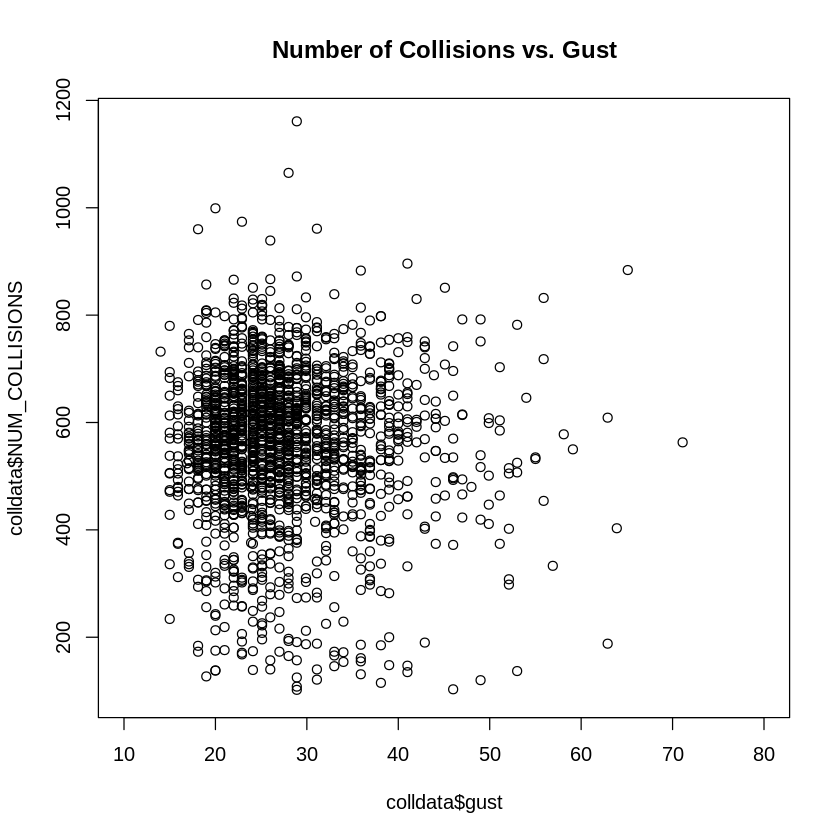

In [1135]:
plot(colldata$gust, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. Gust", xlim = c(10,80))
# taking the outliers at 999.99 out - days with no value

In [1136]:
cor(colldata$gust, colldata$NUM_COLLISIONS)

[1] -0.003869988

We are not seeing relationships with any of the 3 wind variables.  

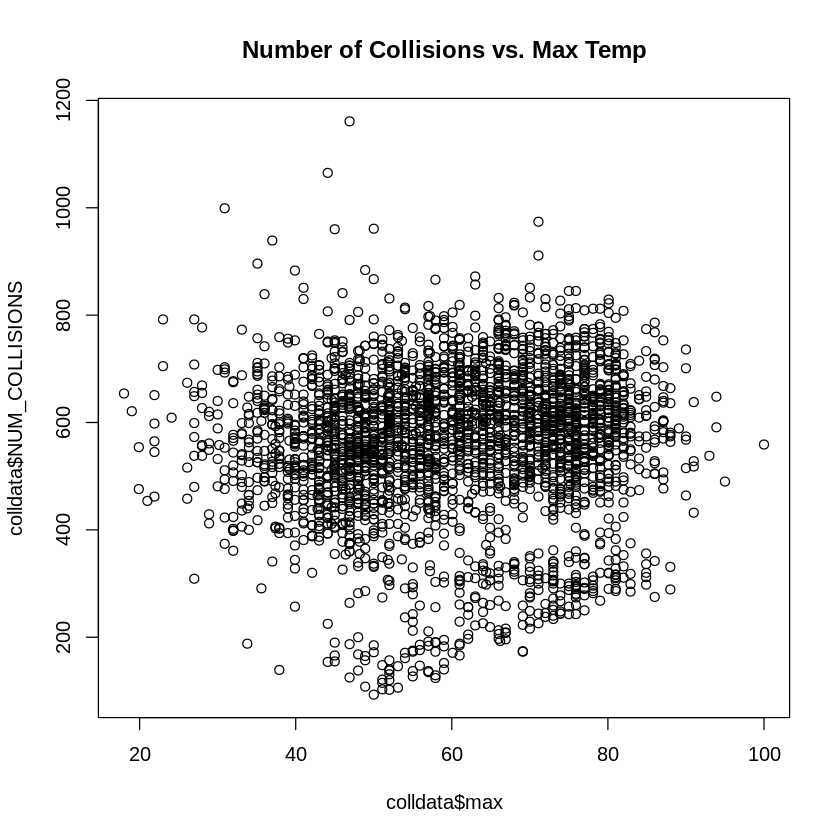

In [1137]:
plot(colldata$max, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. Max Temp")

In [1138]:
cor(colldata$max, colldata$NUM_COLLISIONS)

[1] 0.06919316

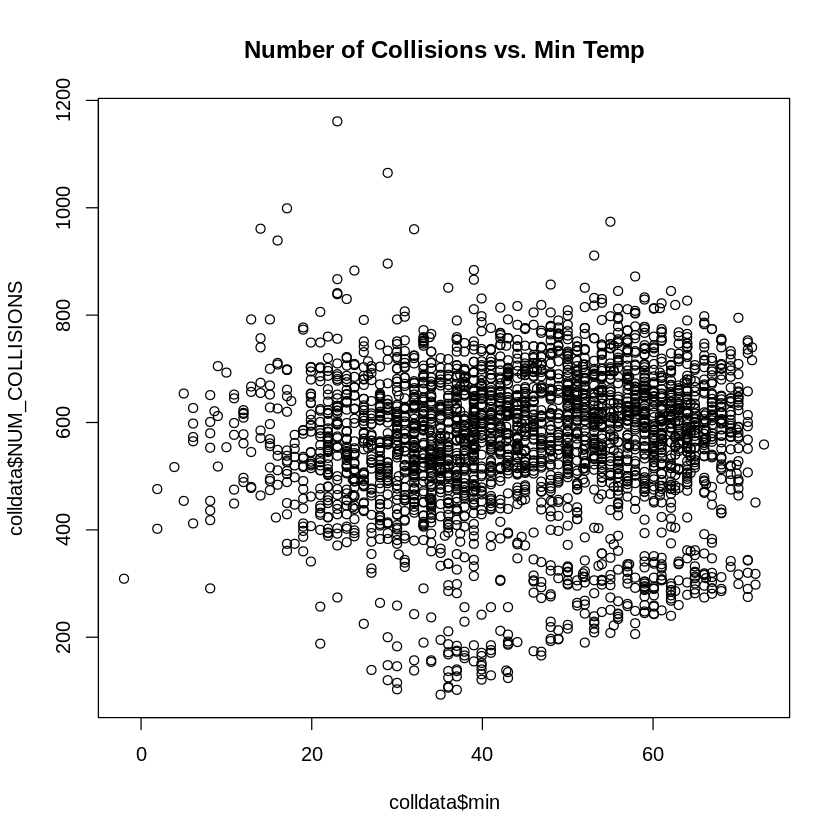

In [1139]:
plot(colldata$min, colldata$NUM_COLLISIONS, main = "Number of Collisions vs. Min Temp")

In [1140]:
cor(colldata$min, colldata$NUM_COLLISIONS)

[1] 0.055394

As with temperature, we are seeing more of a relationship with minimum and maximum temperature that with the other weather variables. Here we can also see outliers clearly on the plots.

### Data minus 2020

In [1141]:
colldata2 <- filter(colldata, !(year ==2020))

In [1142]:
summary(colldata2)

      day             year            mo               da       
 Min.   :1.000   Min.   :2012   Min.   : 1.000   Min.   : 1.00  
 1st Qu.:2.000   1st Qu.:2014   1st Qu.: 4.000   1st Qu.: 8.00  
 Median :4.000   Median :2016   Median : 7.000   Median :16.00  
 Mean   :3.999   Mean   :2016   Mean   : 6.724   Mean   :15.73  
 3rd Qu.:6.000   3rd Qu.:2018   3rd Qu.:10.000   3rd Qu.:23.00  
 Max.   :7.000   Max.   :2019   Max.   :12.000   Max.   :31.00  
                                                                
    collision_date      temp            dewp               slp       
 2012-07-01:   1   Min.   : 5.80   Min.   :   -6.70   Min.   :  989  
 2012-07-02:   1   1st Qu.:40.80   1st Qu.:   32.30   1st Qu.: 1012  
 2012-07-03:   1   Median :52.50   Median :   45.70   Median : 1017  
 2012-07-04:   1   Mean   :52.12   Mean   :   48.15   Mean   : 1020  
 2012-07-05:   1   3rd Qu.:64.70   3rd Qu.:   58.90   3rd Qu.: 1022  
 2012-07-06:   1   Max.   :86.70   Max.   : 9999.90   Max.  

We have now created another dataset with 2020 removed as per the summary above (year max is now 2019). Below we can now see the redrawn plot from before with the new version of the data. We can now see uniformity across all the years. Let us take a look at the variables again and see if the outliers issue has been resolved and the correlation values improved.  


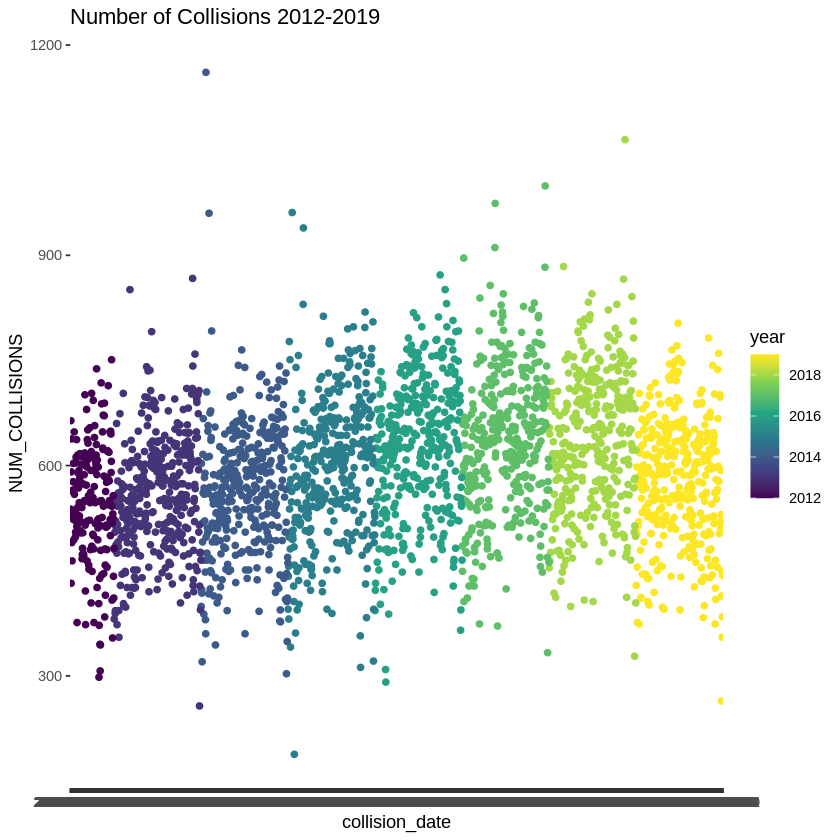

In [1143]:
ggplot(colldata2, aes(collision_date, NUM_COLLISIONS, colour = year)) +
  geom_point() +
  scale_colour_viridis_c() +
  labs(title = "Number of Collisions 2012-2019")

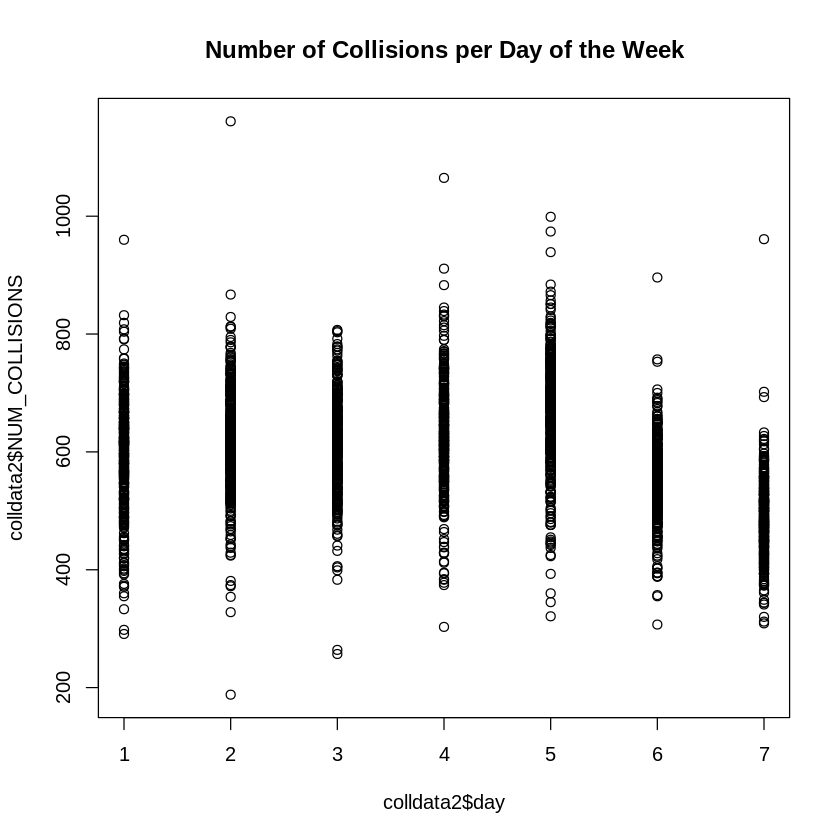

In [1144]:
plot(colldata2$day, colldata2$NUM_COLLISIONS, main = "Number of Collisions per Day of the Week")

In [1145]:
cor(colldata2$day, colldata2$NUM_COLLISIONS)

[1] -0.2858465

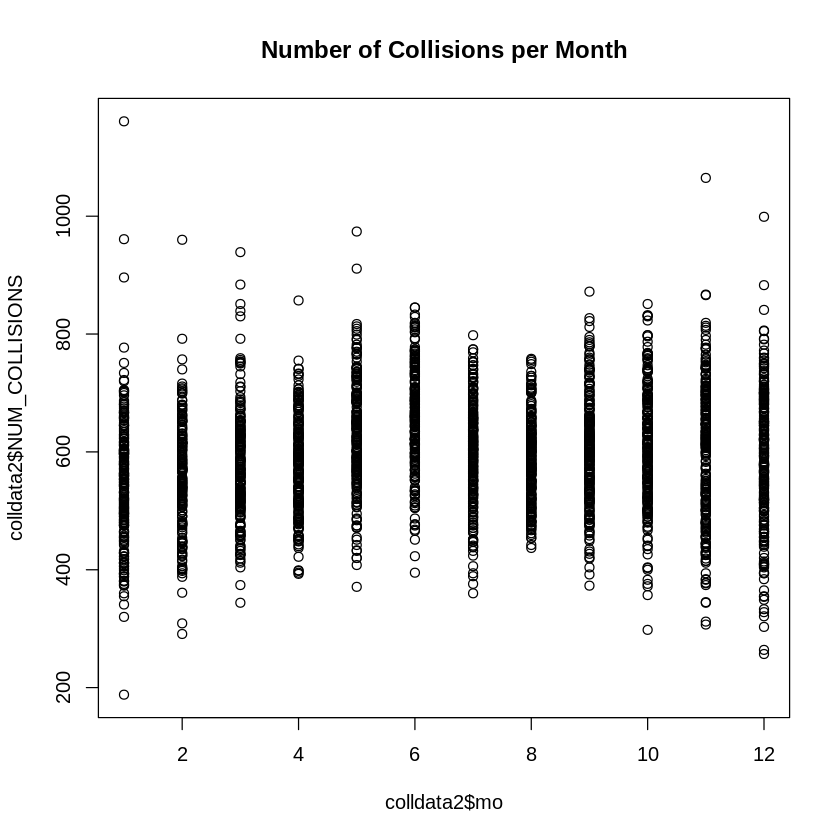

In [1146]:
plot(colldata2$mo, colldata2$NUM_COLLISIONS, main = "Number of Collisions per Month")

In [1147]:
cor(colldata2$mo, colldata2$NUM_COLLISIONS)

[1] 0.1122112

The data towards the bottom of the plots down the y-axis is now gone as these were the suspected 2020 anomalous data. Correlation for both weekdays and months have significantly improved.  The pattern for weekdays remains and should consider re-organising the days to better fit a linear relationship if this persists further on in the analysis.  

We shall now review the weather variables.



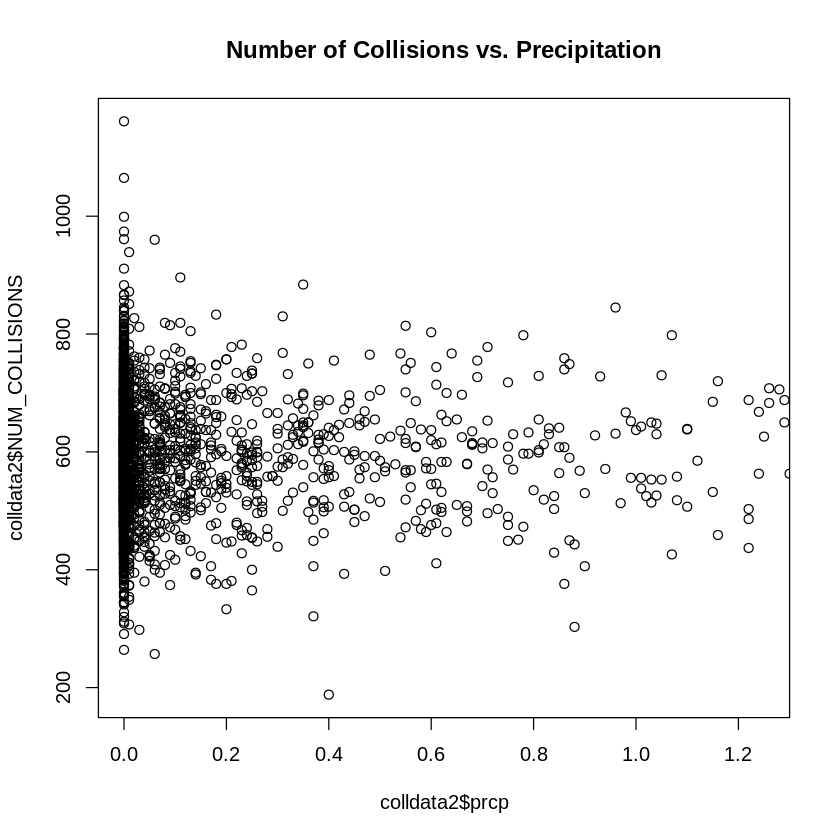

In [1148]:
plot(colldata2$prcp, colldata2$NUM_COLLISIONS, main = "Number of Collisions vs. Precipitation", xlim=c(0,1.25)) 

In [1149]:
cor(colldata2$prcp, colldata2$NUM_COLLISIONS)

[1] 0.0006979082

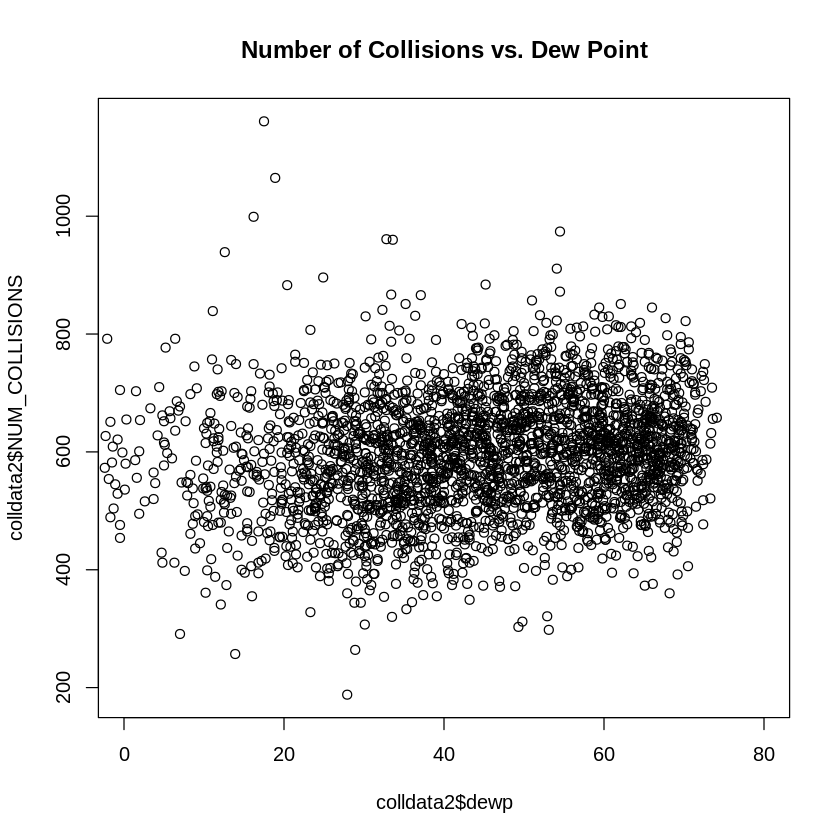

In [1150]:
plot(colldata2$dewp, colldata2$NUM_COLLISIONS, main = "Number of Collisions vs. Dew Point", xlim = c(0,80))

In [1151]:
cor(colldata2$dewp, colldata2$NUM_COLLISIONS)

[1] 0.02091168

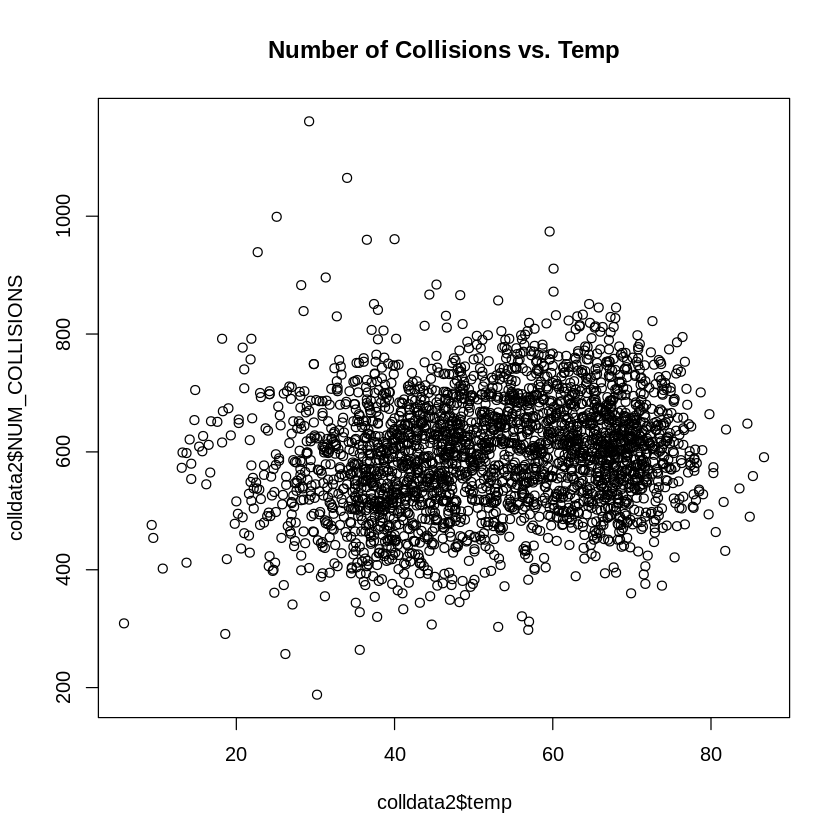

In [1152]:
plot(colldata2$temp, colldata2$NUM_COLLISIONS, main = "Number of Collisions vs. Temp")

In [1153]:
cor(colldata2$temp, colldata2$NUM_COLLISIONS)

[1] 0.1707221

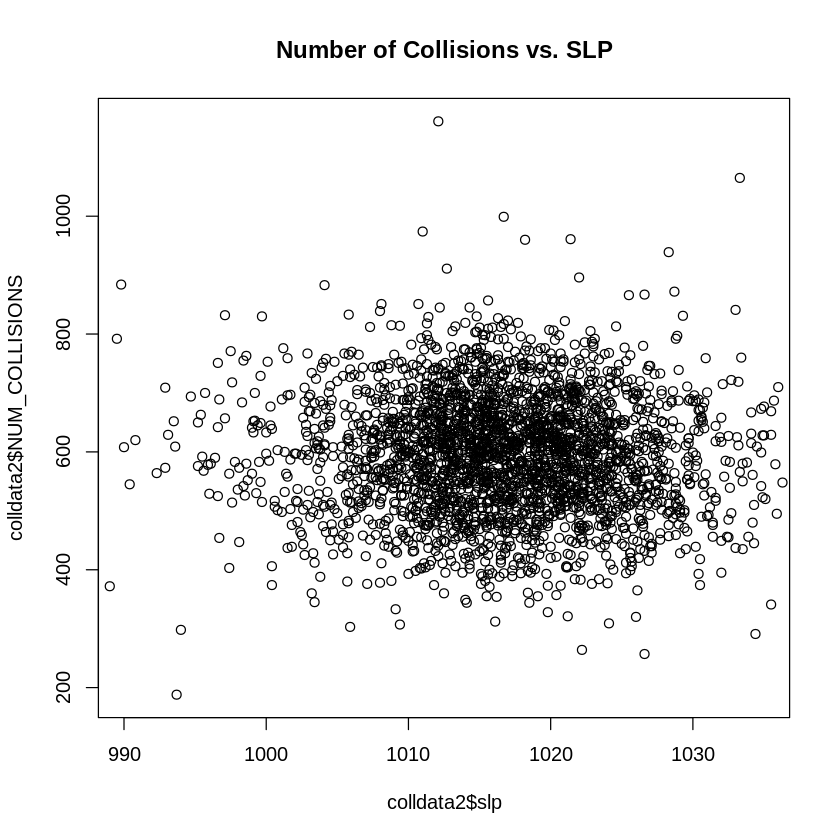

In [1154]:
plot(colldata2$slp, colldata2$NUM_COLLISIONS, main = "Number of Collisions vs. SLP", xlim = c(990,1035))

In [1155]:
cor(colldata2$slp, colldata2$NUM_COLLISIONS)

[1] -0.01510761

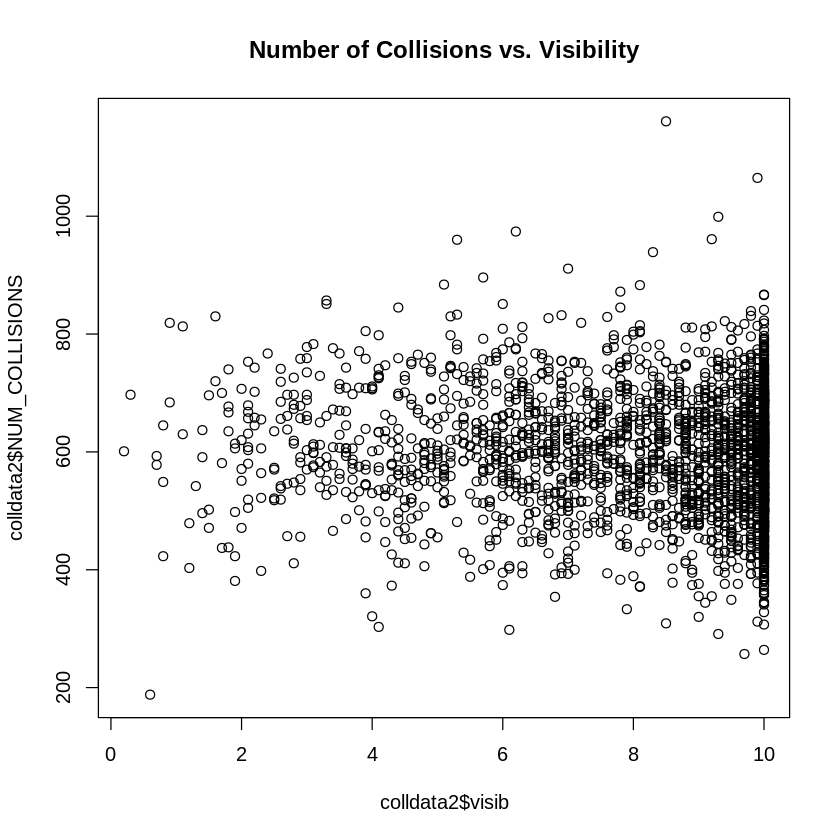

In [1156]:
plot(colldata2$visib, colldata2$NUM_COLLISIONS, main = "Number of Collisions vs. Visibility")

In [1157]:
cor(colldata2$visib, colldata2$NUM_COLLISIONS)

[1] -0.07743646

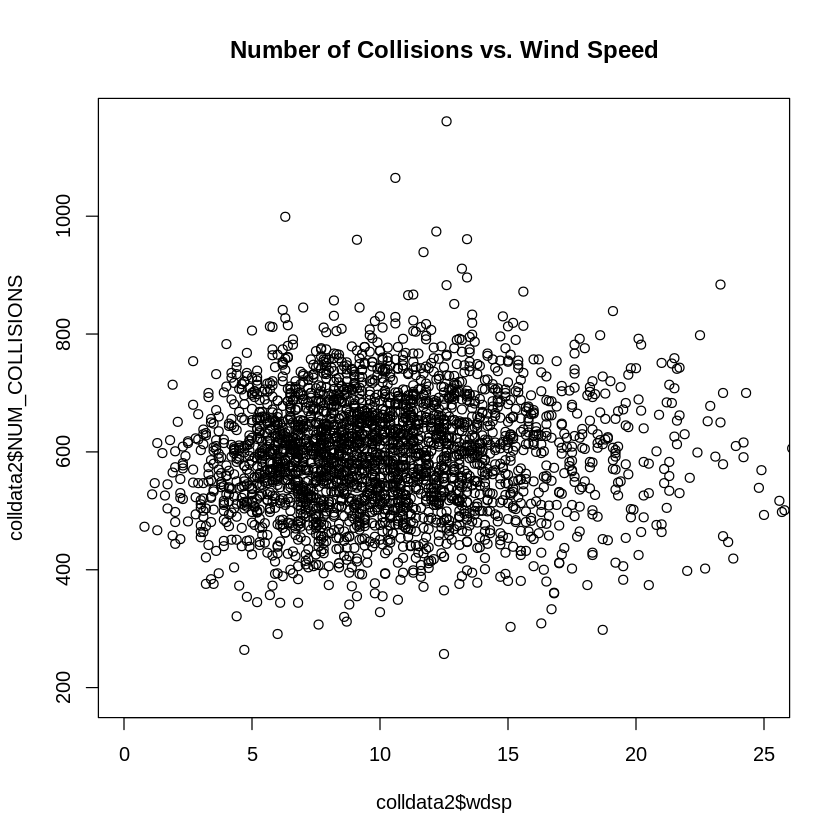

In [1158]:
plot(colldata2$wdsp, colldata2$NUM_COLLISIONS, main = "Number of Collisions vs. Wind Speed", xlim = c(0,25))

In [1159]:
cor(colldata2$wdsp, colldata2$NUM_COLLISIONS)

[1] 0.02963262

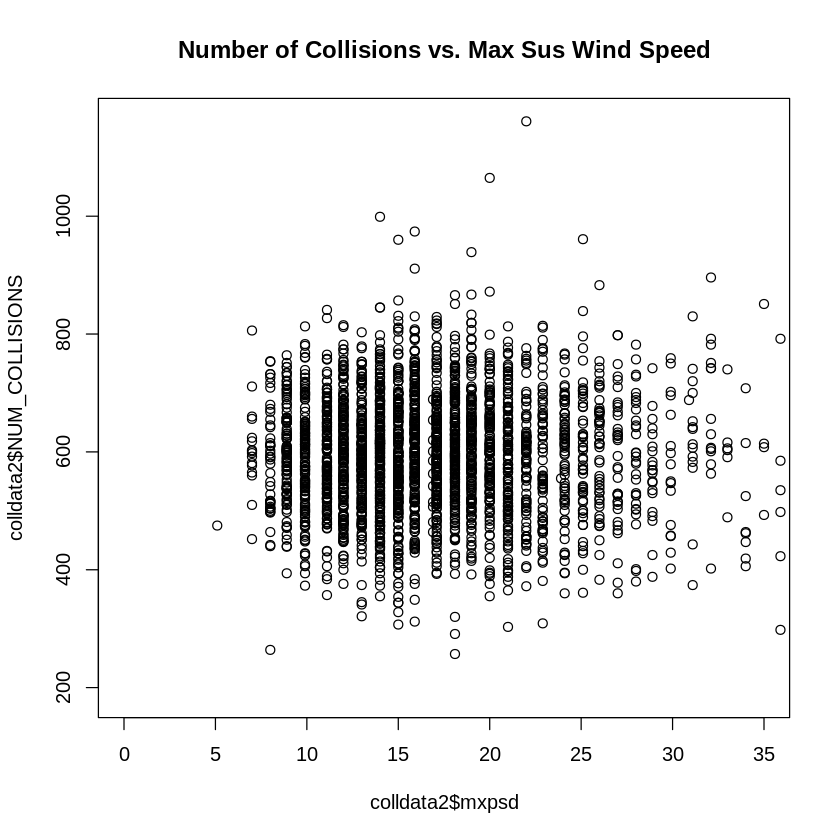

In [1160]:
plot(colldata2$mxpsd, colldata2$NUM_COLLISIONS, main = "Number of Collisions vs. Max Sus Wind Speed", xlim = c(0,35))

In [1161]:
cor(colldata2$mxpsd, colldata2$NUM_COLLISIONS)

[1] 0.02117602

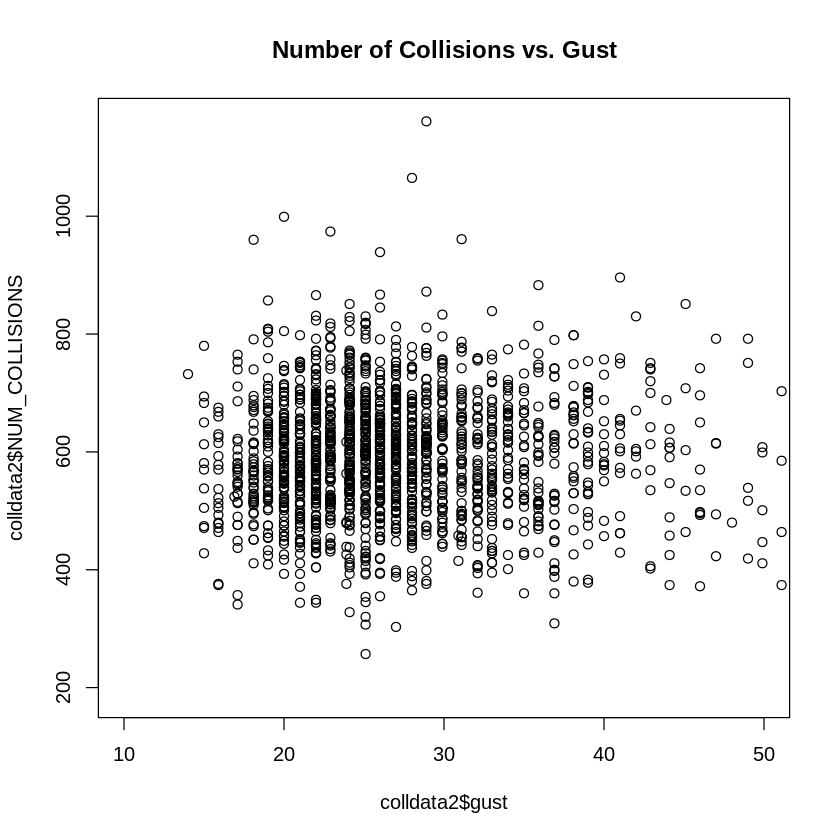

In [1162]:
plot(colldata2$gust, colldata2$NUM_COLLISIONS, main = "Number of Collisions vs. Gust", xlim = c(10,50))

In [1163]:
cor(colldata2$gust, colldata2$NUM_COLLISIONS)

[1] 0.03650184

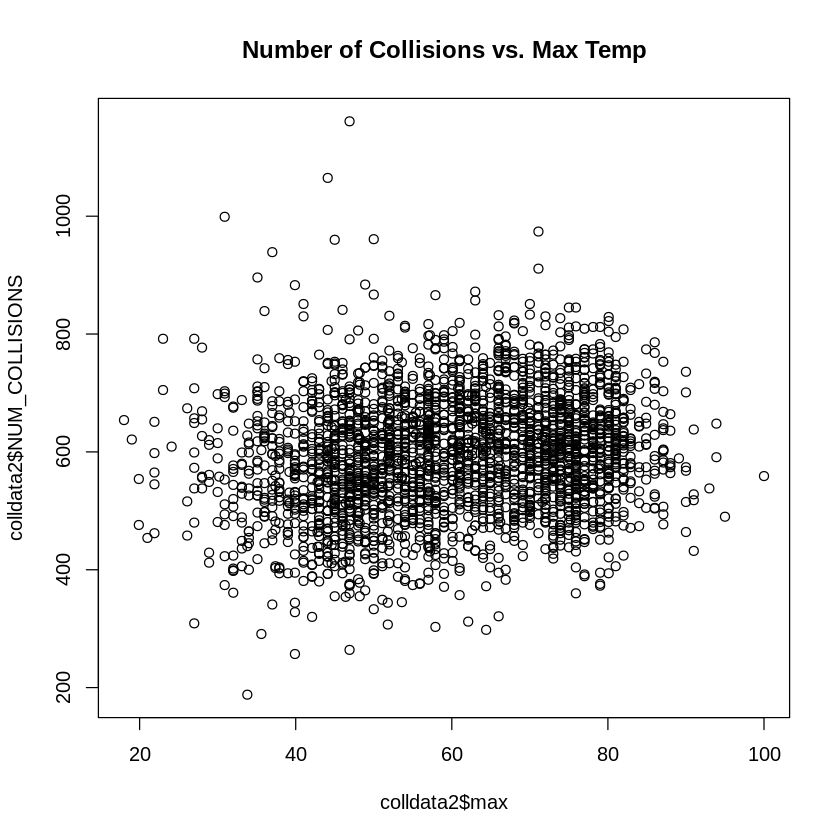

In [1164]:
plot(colldata2$max, colldata2$NUM_COLLISIONS, main = "Number of Collisions vs. Max Temp")

In [1165]:
cor(colldata2$max, colldata2$NUM_COLLISIONS)

[1] 0.173658

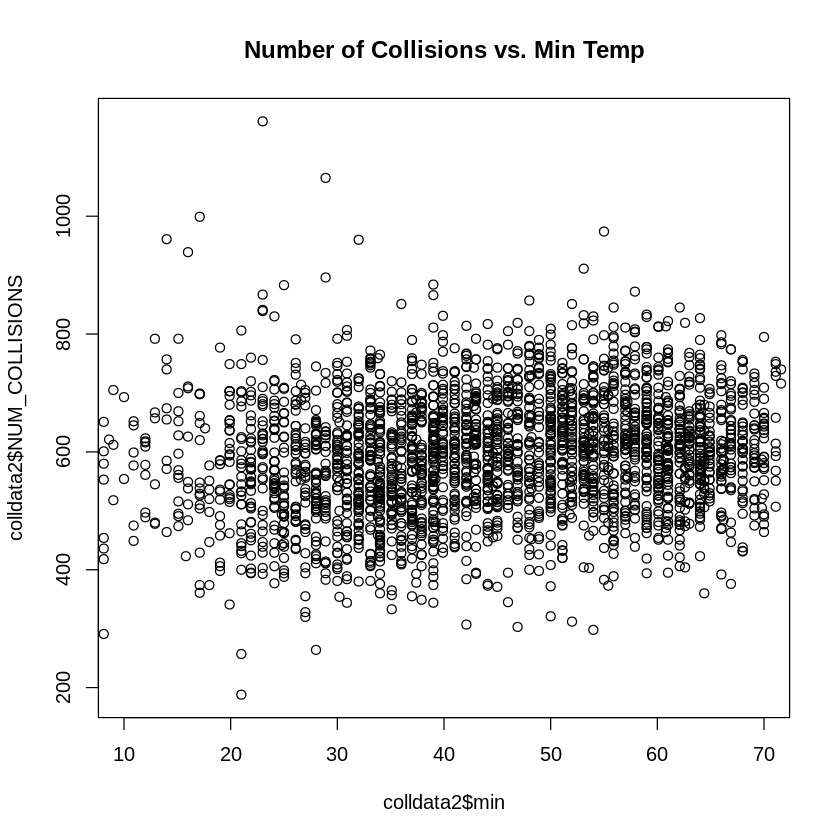

In [1166]:
plot(colldata2$min, colldata2$NUM_COLLISIONS, main = "Number of Collisions vs. Min Temp", xlim = c(10,70))

In [1167]:
cor(colldata2$min, colldata2$NUM_COLLISIONS)

[1] 0.1693177

In all the new plots above we can see the removal of the previously mentioned outliers. 

Precipitation and sea level pressure have worsened values than before. Dew point, visibility and the 3 wind variables have improved, but remain poor. The 3 temperature variables are all significantly improved and are the best candidates for linear regression. There is not a significant difference between the 3, therefore we shall move forward with the mean temperature (temp) alone.  

Earlier it was noted that some of the variables are impacted by large numbers of missing and/or invalid values. At first glance, none of these variables have a significant enough relationship with number of collisions to warrant further analysis, but let us remove these values and recalculate the correlation coefficients.  




In [1168]:
prcp_test <- filter(colldata2, prcp < 1.25)
cor(prcp_test$prcp, prcp_test$NUM_COLLISIONS)

dewp_test <- filter(colldata2, dewp < 80)
cor(dewp_test$dewp, dewp_test$NUM_COLLISIONS)

mxpsd_test <- filter(colldata2, mxpsd < 35)
cor(mxpsd_test$mxpsd, mxpsd_test$NUM_COLLISIONS)

slp_test <- filter(colldata2, slp < 1035, slp > 990)
cor(slp_test$slp, slp_test$NUM_COLLISIONS)

gust_test <- filter(colldata2, gust < 50, gust > 10)
cor(gust_test$gust, gust_test$NUM_COLLISIONS)

visib_test <- filter(colldata2, visib < 10)
cor(visib_test$visib, visib_test$NUM_COLLISIONS)

[1] -0.02240844

[1] 0.1790559

[1] 0.003140185

[1] -0.03569137

[1] 0.002004768

[1] -0.05117511

Almost all of these remain very poor with no relationship evident. Dew point on the other hand is markedly improved from 0.02 to 0.17.  

We shall move forward to the next stage of our analysis with temperature, dew point, weekday and month.



## Additional Data from Big Query


To source our replacement snow data, we must investigate which other stations are best located to provide weather data for the area. Within the NOAA public data sets there is a section on stations where they are referred to by their USAF number (i.e. stn = 725060 in the weather data equates to usaf = 725060). Running the query below provides the relevant information for the station.  

![picture](https://drive.google.com/uc?id=17QxHZEiRALN7XdSSIiCCyzIxd2SgbDBk)  


Using this, we can then run a new query to search for any weather stations with country = US and state = NY.  

![picture](https://drive.google.com/uc?id=1CRrt1Ed5URuBbzVJlud6FVEJY5SbDI1S)  


There are over 130 stations with these criteria, many of which are no longer live and producing data. A couple were selected as being near to Central Park and queries run to check for any data against the file containing 2019. Both usaf 725035 and 725033 yielded no results, but 744860 which is at JFK Airport was successful.  
We ran the original weather data query again but this time with stn=744860 and only selecting weather criteria sndp. We also excluded the data for 2020 as we had already ascertained this was not inline with the remaining years.  

![picture](https://drive.google.com/uc?id=1iL0fKX9JFpM5kP5VMrucNbwc7z_6StR0)  


As before, we now merged this new weather data with the collisions data we had sourced earlier to create a new dataset which was then uploaded to GitHub.  

![picture](https://drive.google.com/uc?id=1fZtzZG2ZnDUjWPWUMcbA4ElQT8sSkjrH)


## Primary Analysis of Snow Data

In [1169]:
snowcoll <- read.csv("https://raw.githubusercontent.com/20023170uhi/20023170_DataAnalytics/main/snowresults.csv", stringsAsFactors = TRUE)

In [1170]:
head(snowcoll)

,day,year,mo,da,collision_date,sndp,NUM_COLLISIONS
,<int>,<int>,<int>,<int>,<fct>,<dbl>,<int>
1,4,2012,7,26,2012-07-26,999.9,604
2,3,2012,7,11,2012-07-11,999.9,565
3,4,2012,7,19,2012-07-19,999.9,522
4,1,2012,7,23,2012-07-23,999.9,505
5,6,2012,7,14,2012-07-14,999.9,536
6,7,2012,7,22,2012-07-22,999.9,498


In [1171]:
summary(snowcoll)

      day             year            mo               da       
 Min.   :1.000   Min.   :2012   Min.   : 1.000   Min.   : 1.00  
 1st Qu.:2.000   1st Qu.:2014   1st Qu.: 4.000   1st Qu.: 8.00  
 Median :4.000   Median :2016   Median : 7.000   Median :16.00  
 Mean   :3.999   Mean   :2016   Mean   : 6.724   Mean   :15.73  
 3rd Qu.:6.000   3rd Qu.:2018   3rd Qu.:10.000   3rd Qu.:23.00  
 Max.   :7.000   Max.   :2019   Max.   :12.000   Max.   :31.00  
                                                                
    collision_date      sndp       NUM_COLLISIONS  
 2012-07-01:   1   Min.   :  1.2   Min.   : 188.0  
 2012-07-02:   1   1st Qu.:999.9   1st Qu.: 527.0  
 2012-07-03:   1   Median :999.9   Median : 598.0  
 2012-07-04:   1   Mean   :914.1   Mean   : 595.6  
 2012-07-05:   1   3rd Qu.:999.9   3rd Qu.: 660.0  
 2012-07-06:   1   Max.   :999.9   Max.   :1161.0  
 (Other)   :2734                                   

In [1172]:
unique(snowcoll$sndp)

[1] 999.9   2.0   1.2   3.1   5.9   5.1   7.1   9.1   3.9   9.8   7.9  22.8
[13]  11.8  16.9  27.2

Reviewing the summary, we still see most of the distribution points as being 999.99.  Most of the year there will not be any snow, so we would expect the summary to be skewed at least in part to this value. Checking the unique values, we see we have far more data points than before although we likely still have missing data.  

Below we have the plotted new data and the with the data with the 999.99 values changed to 0.00.  




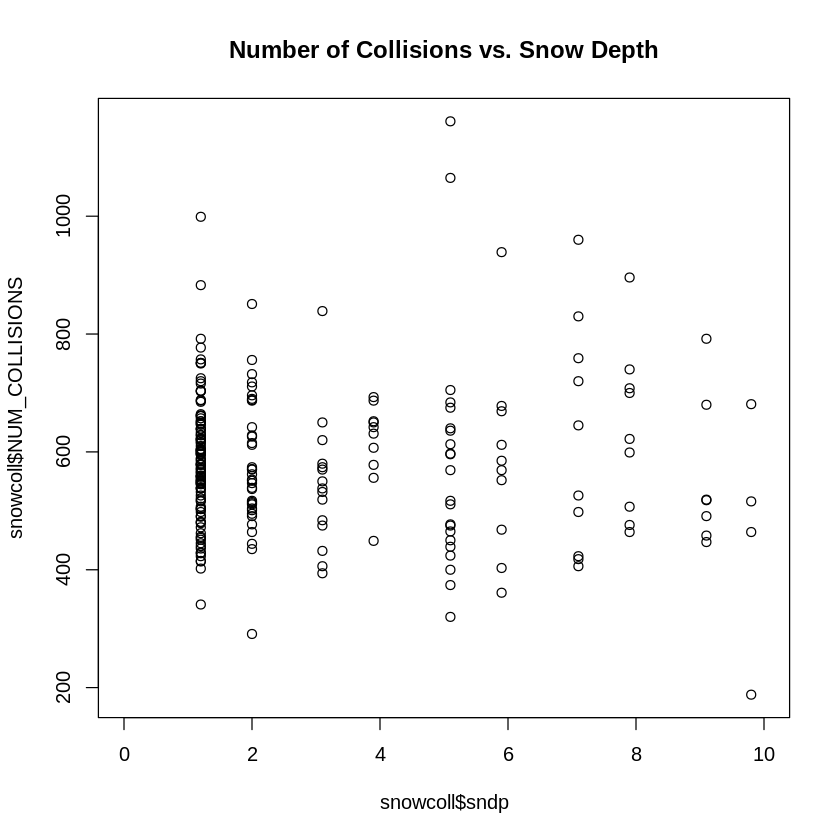

In [1173]:
plot(snowcoll$sndp, snowcoll$NUM_COLLISIONS, main = "Number of Collisions vs. Snow Depth", xlim = c(0,10))

In [1174]:
snowcoll <- replace(snowcoll, snowcoll == 999.9, 0)

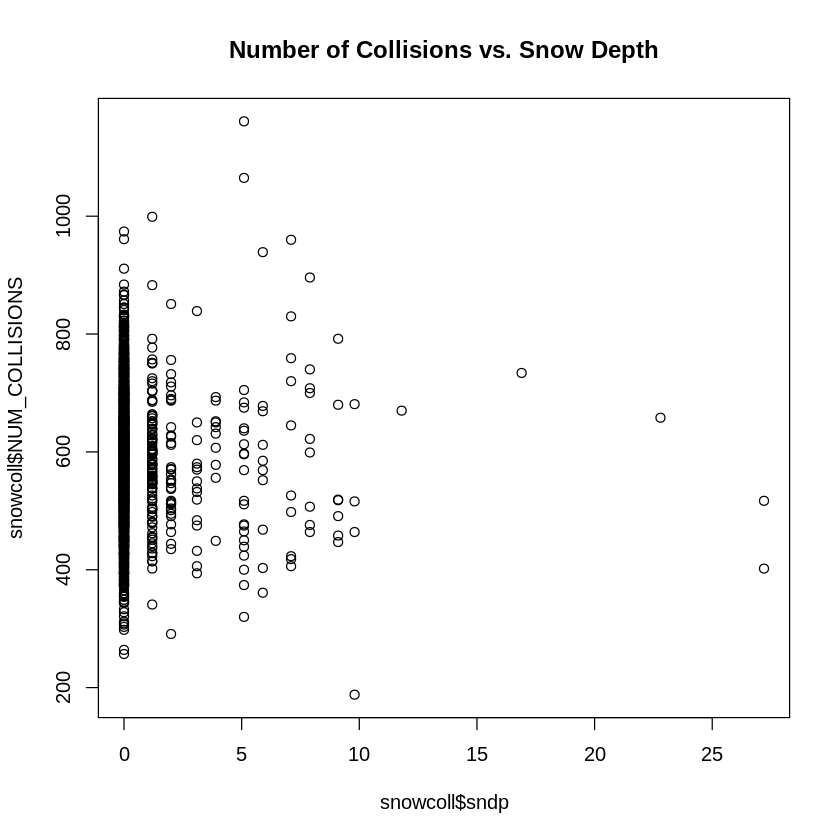

In [1175]:
plot(snowcoll$sndp, snowcoll$NUM_COLLISIONS, main = "Number of Collisions vs. Snow Depth")

In [1176]:
cor(snowcoll$sndp, snowcoll$NUM_COLLISIONS)

[1] -0.03151078

The correlation is still poor, let us check the distribution of these points over the entire time period and annually.  


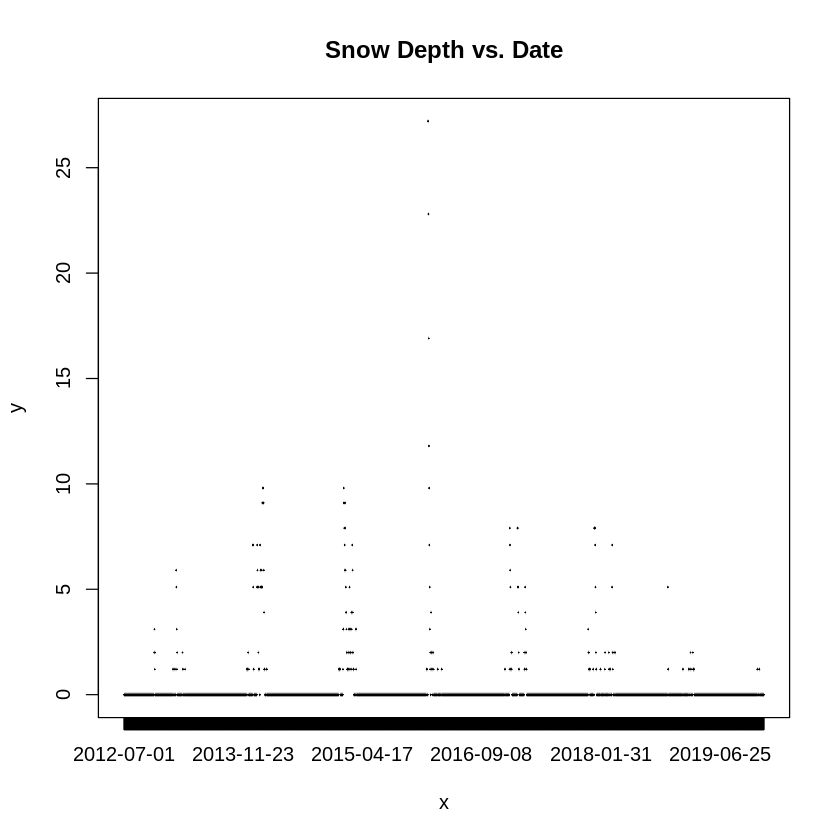

In [1177]:
plot(snowcoll$collision_date, snowcoll$sndp, main = "Snow Depth vs. Date")

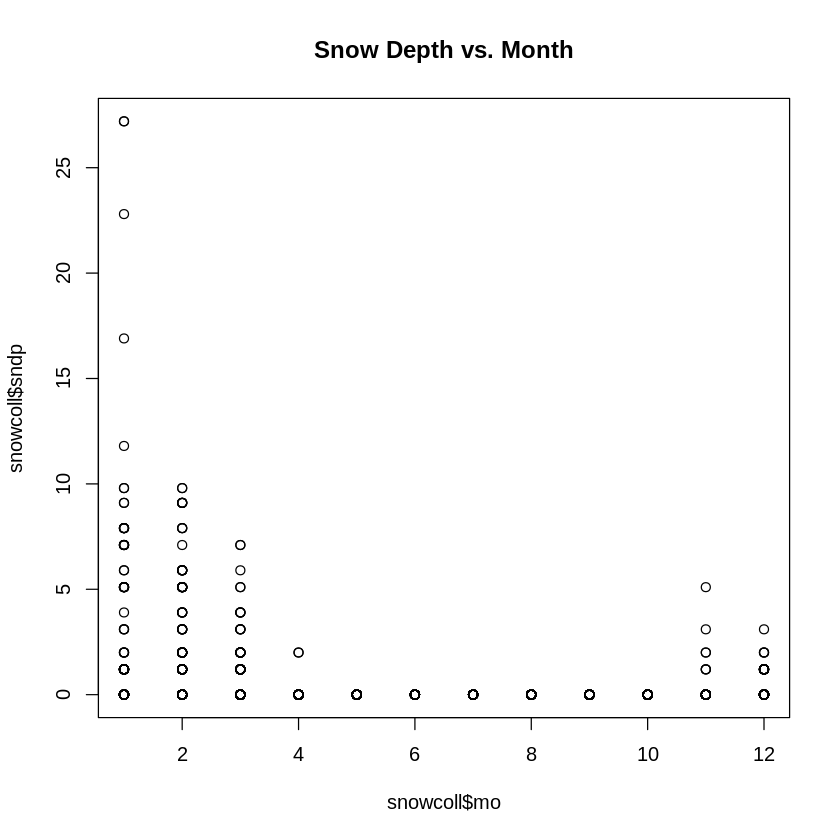

In [1178]:
plot(snowcoll$mo, snowcoll$sndp, main = "Snow Depth vs. Month")

Most of the points are between November and March, with no snow readings for May to October. Snow will not play a factor in a model for these months so we can remove these and take a look at the rest.  



In [1179]:
snowcoll2 <- filter(snowcoll, mo %in% c(1, 2, 3, 11, 12))
summary(snowcoll2)

      day             year            mo               da       
 Min.   :1.000   Min.   :2012   Min.   : 1.000   Min.   : 1.00  
 1st Qu.:2.000   1st Qu.:2014   1st Qu.: 2.000   1st Qu.: 8.00  
 Median :4.000   Median :2016   Median : 3.000   Median :16.00  
 Mean   :4.012   Mean   :2016   Mean   : 6.147   Mean   :15.64  
 3rd Qu.:6.000   3rd Qu.:2018   3rd Qu.:11.000   3rd Qu.:23.00  
 Max.   :7.000   Max.   :2019   Max.   :12.000   Max.   :31.00  
                                                                
    collision_date      sndp         NUM_COLLISIONS
 2012-11-01:   1   Min.   : 0.0000   Min.   : 188  
 2012-11-02:   1   1st Qu.: 0.0000   1st Qu.: 503  
 2012-11-03:   1   Median : 0.0000   Median : 574  
 2012-11-04:   1   Mean   : 0.7196   Mean   : 576  
 2012-11-05:   1   3rd Qu.: 0.0000   3rd Qu.: 649  
 2012-11-06:   1   Max.   :27.2000   Max.   :1161  
 (Other)   :1113                                   

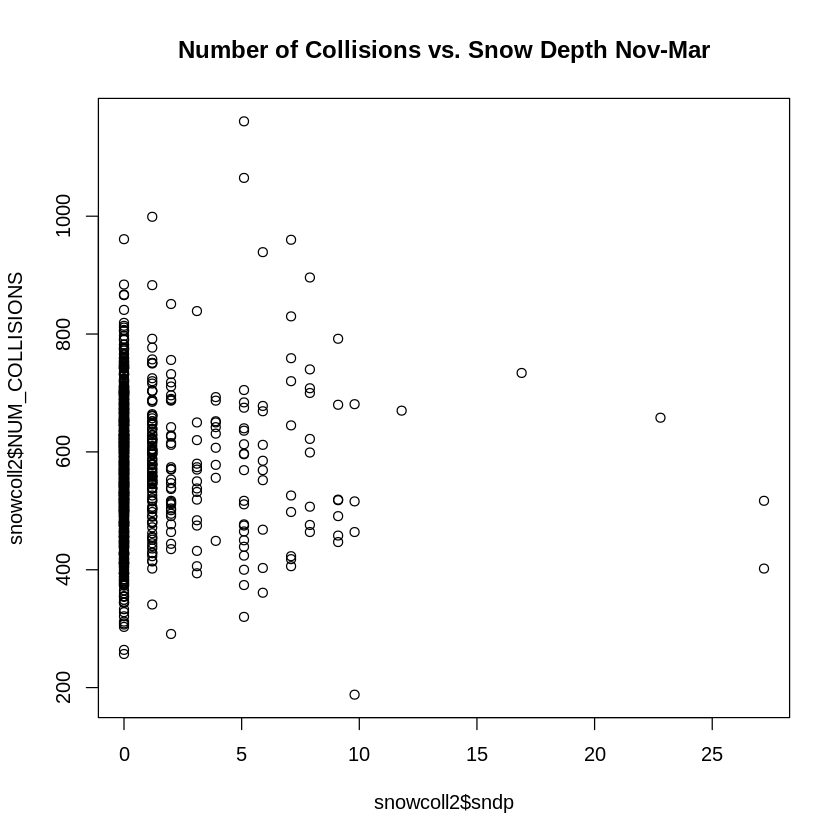

In [1180]:
plot(snowcoll2$sndp, snowcoll2$NUM_COLLISIONS, main = "Number of Collisions vs. Snow Depth Nov-Mar")

In [1181]:
cor(snowcoll2$sndp, snowcoll2$NUM_COLLISIONS)

[1] 0.01285181

The correlation has worsened.  We can split out the data by specific months and check whether there are differences in the strength of the relationship between them.  

We can also assume that the 999.99 values were not zero but missing values and completely remove these to see if there is an impact. 




In [1182]:
mo1 <- filter(snowcoll, mo == 1)
mo2 <- filter(snowcoll, mo == 2)
mo3 <- filter(snowcoll, mo == 3)
mo11 <- filter(snowcoll, mo == 11)
mo12 <- filter(snowcoll, mo == 12)

cor(mo1$sndp, mo1$NUM_COLLISIONS)
cor(mo2$sndp, mo2$NUM_COLLISIONS)
cor(mo3$sndp, mo3$NUM_COLLISIONS)
cor(mo11$sndp, mo11$NUM_COLLISIONS)
cor(mo12$sndp, mo12$NUM_COLLISIONS)

[1] 0.05943198

[1] 0.05273566

[1] 0.2557522

[1] 0.1860007

[1] 0.07904931

In [1183]:
snowcoll0 <- filter(snowcoll2, sndp != 0)
summary(snowcoll0)  

      day             year            mo               da       
 Min.   :1.000   Min.   :2012   Min.   : 1.000   Min.   : 1.00  
 1st Qu.:2.000   1st Qu.:2014   1st Qu.: 1.000   1st Qu.: 8.00  
 Median :4.000   Median :2015   Median : 2.000   Median :12.50  
 Mean   :4.081   Mean   :2016   Mean   : 3.171   Mean   :14.12  
 3rd Qu.:6.000   3rd Qu.:2017   3rd Qu.: 3.000   3rd Qu.:20.00  
 Max.   :7.000   Max.   :2019   Max.   :12.000   Max.   :31.00  
                                                                
    collision_date      sndp        NUM_COLLISIONS  
 2012-11-07:  1    Min.   : 1.200   Min.   : 188.0  
 2012-11-08:  1    1st Qu.: 1.200   1st Qu.: 501.5  
 2012-11-09:  1    Median : 2.000   Median : 573.5  
 2012-11-10:  1    Mean   : 3.441   Mean   : 583.3  
 2013-01-26:  1    3rd Qu.: 5.100   3rd Qu.: 651.5  
 2013-01-27:  1    Max.   :27.200   Max.   :1161.0  
 (Other)   :228                                     

In [1184]:
cor(snowcoll0$sndp, snowcoll0$NUM_COLLISIONS)

[1] -0.02208485

Overall, there seems to be some correlation for some months and not for others. In November and March there is a stronger relationship, but for winter months it is poor. The relationship between snow and collisions is likely more complex, with heavier snow likely to impact the number of taxi rides as heavier snowfall might reduce the number of cabs on the road. Making assumptions on the meaning of the default value is also problematic as we can only assume either that they are all 0.00 or all missing and cannot ascertain which one is which.  


# Results  


## Further Analysis  

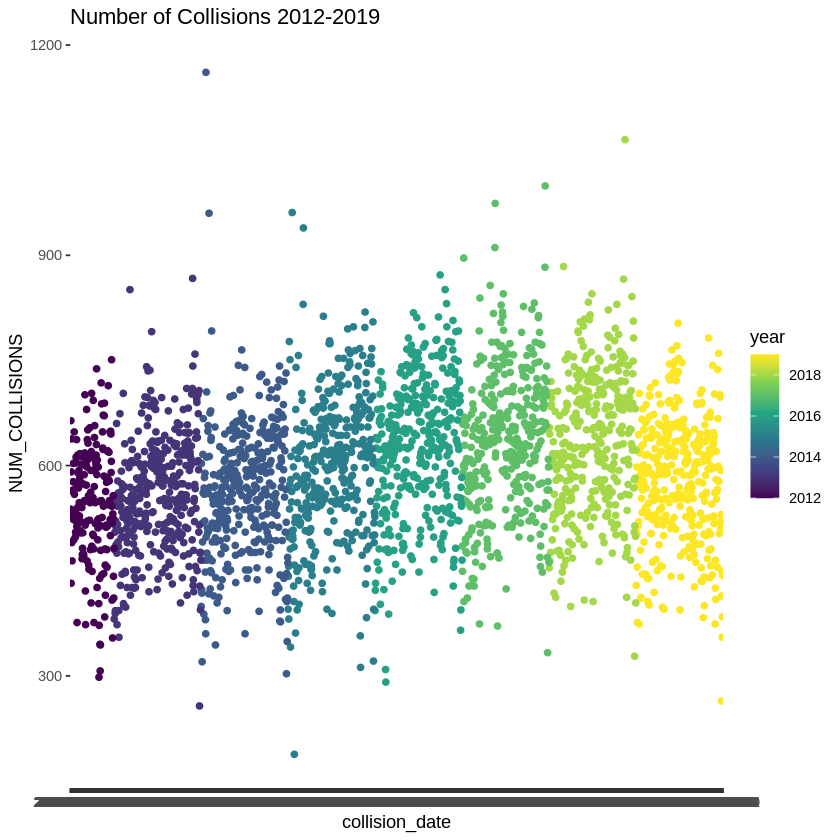

In [1185]:
ggplot(colldata2, aes(collision_date, NUM_COLLISIONS, colour = year)) +
  geom_point() +
  scale_colour_viridis_c() +
  labs(title = "Number of Collisions 2012-2019")

Revisiting the plot above, we see a clear pattern across each year with a gradual rise year on year until 2017.  From here on, the seasonality pattern remains but the numbers are decreasing.  


In [1186]:
coll2012 <- filter(colldata2, year == 2012)
coll2013 <- filter(colldata2, year == 2013)
coll2014 <- filter(colldata2, year == 2014)
coll2015 <- filter(colldata2, year == 2015)
coll2016 <- filter(colldata2, year == 2016)
coll2017 <- filter(colldata2, year == 2017)
coll2018 <- filter(colldata2, year == 2018)
coll2019 <- filter(colldata2, year == 2019)

summary(coll2012$NUM_COLLISIONS)
summary(coll2013$NUM_COLLISIONS)
summary(coll2014$NUM_COLLISIONS)
summary(coll2015$NUM_COLLISIONS)
summary(coll2016$NUM_COLLISIONS)
summary(coll2017$NUM_COLLISIONS)
summary(coll2018$NUM_COLLISIONS)
summary(coll2019$NUM_COLLISIONS)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  298.0   500.0   548.5   546.4   604.5   751.0 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  257.0   505.0   558.0   558.2   613.0   867.0 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  303.0   510.0   568.0   564.5   623.0  1161.0 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  188.0   532.0   601.0   596.4   666.0   961.0 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  291.0   568.2   635.0   628.0   696.8   872.0 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  333.0   570.0   636.0   632.9   700.0   999.0 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  328.0   562.0   634.0   634.4   706.0  1065.0 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  264.0   522.0   589.0   579.4   641.0   803.0 

In [1187]:

nrow(coll2012)
nrow(coll2013)
nrow(coll2014)
nrow(coll2015)
nrow(coll2016)
nrow(coll2017)
nrow(coll2018)
nrow(coll2019)

[1] 184

[1] 365

[1] 365

[1] 365

[1] 366

[1] 365

[1] 365

[1] 365

The summaries of the number of collisions per year confirm this, with the 1st quartiles, mean, median and 3rd quartile values all increasing each year 2012 – 2017 and then decreasing 2017-2019. This raises the possibility that the way the data is being reported has changed and indicates a change in trend which could impact our model. Counting the days in each year also shows 2012 as being an incomplete year. We shall remove 2012, 2018 and 2019.  



In [1188]:
colldata3 <- filter(colldata2, year %in% c(2013:2017))
nrow(colldata3)
 

[1] 1826

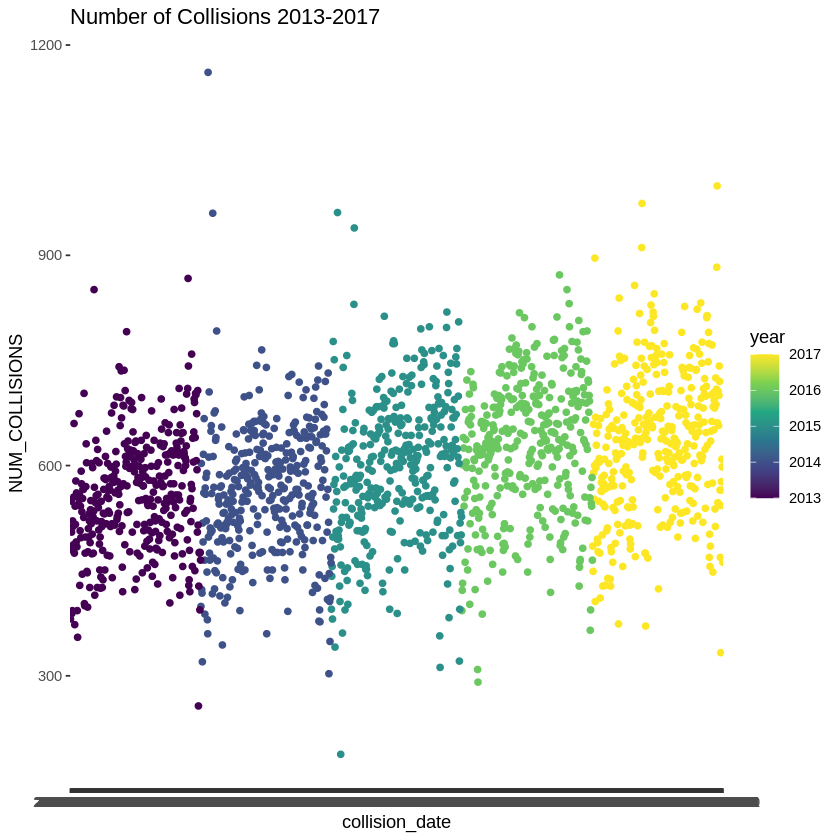

In [1189]:
ggplot(colldata3, aes(collision_date, NUM_COLLISIONS, colour = year)) +
  geom_point() +
  scale_colour_viridis_c() +
  labs(title = "Number of Collisions 2013-2017")

Our plot is now improved with the seasonality trend clearly shown. Let’s once again take a look at our variables.  

[1] -0.2863711

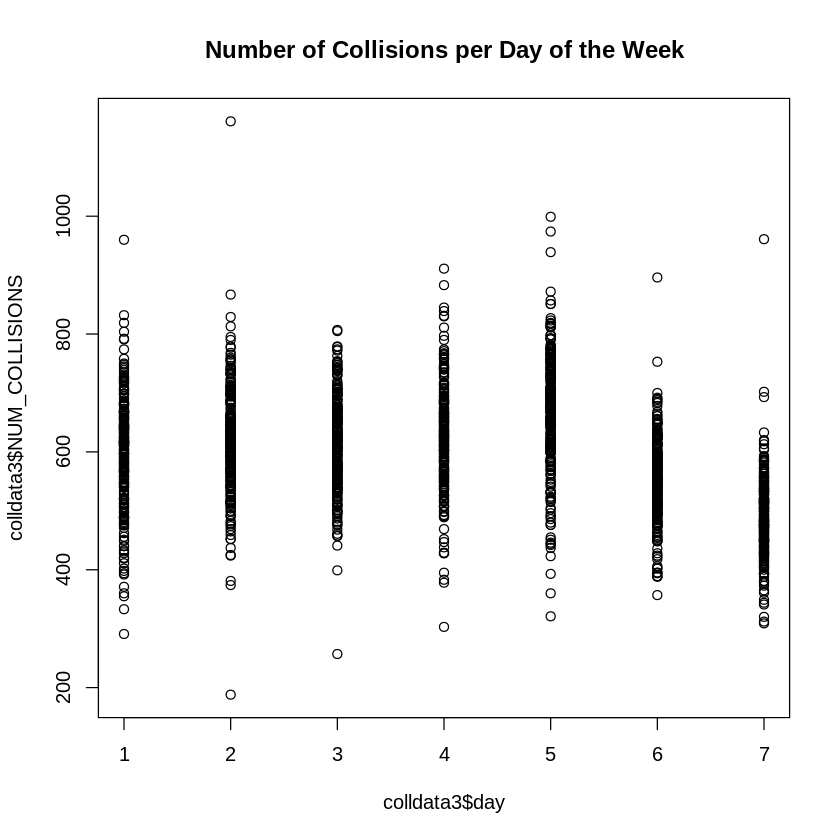

In [1190]:
plot(colldata3$day, colldata3$NUM_COLLISIONS, main = "Number of Collisions per Day of the Week")
cor(colldata3$day, colldata3$NUM_COLLISIONS)

[1] 0.1804399

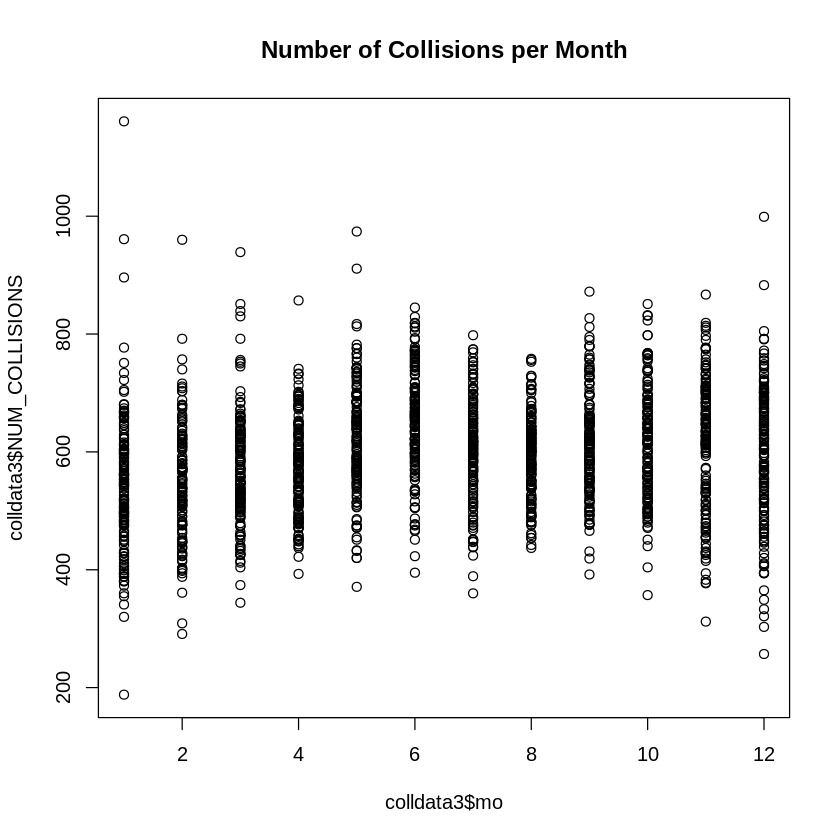

In [1191]:
plot(colldata3$mo, colldata3$NUM_COLLISIONS, main = "Number of Collisions per Month")
cor(colldata3$mo, colldata3$NUM_COLLISIONS)

[1] 0.215938

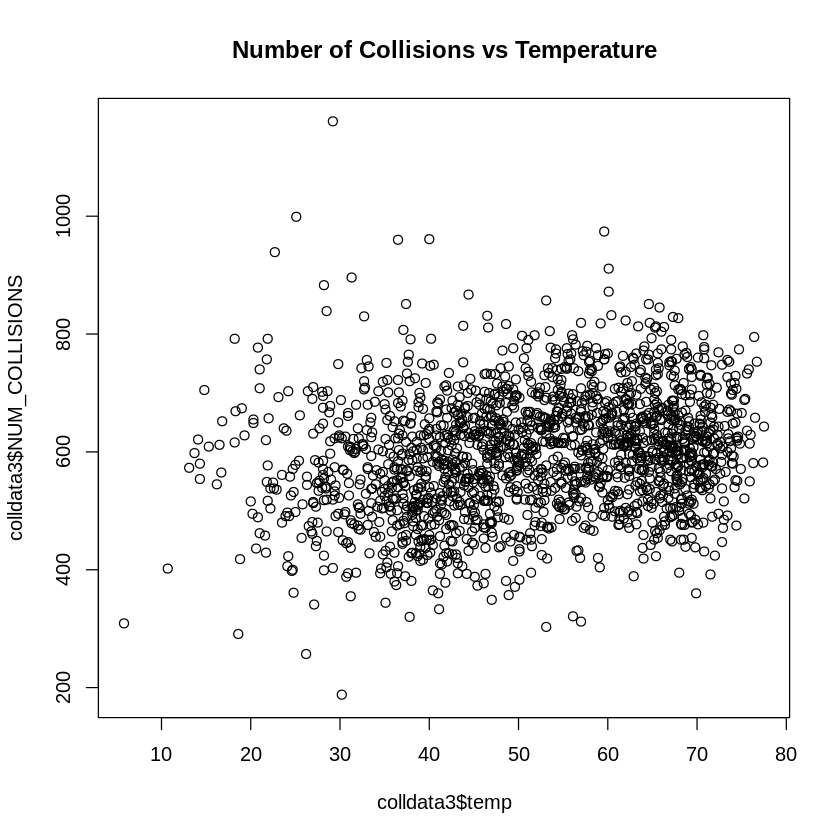

In [1192]:
plot(colldata3$temp, colldata3$NUM_COLLISIONS, main = "Number of Collisions vs Temperature")
cor(colldata3$temp, colldata3$NUM_COLLISIONS)

[1] 0.2065281

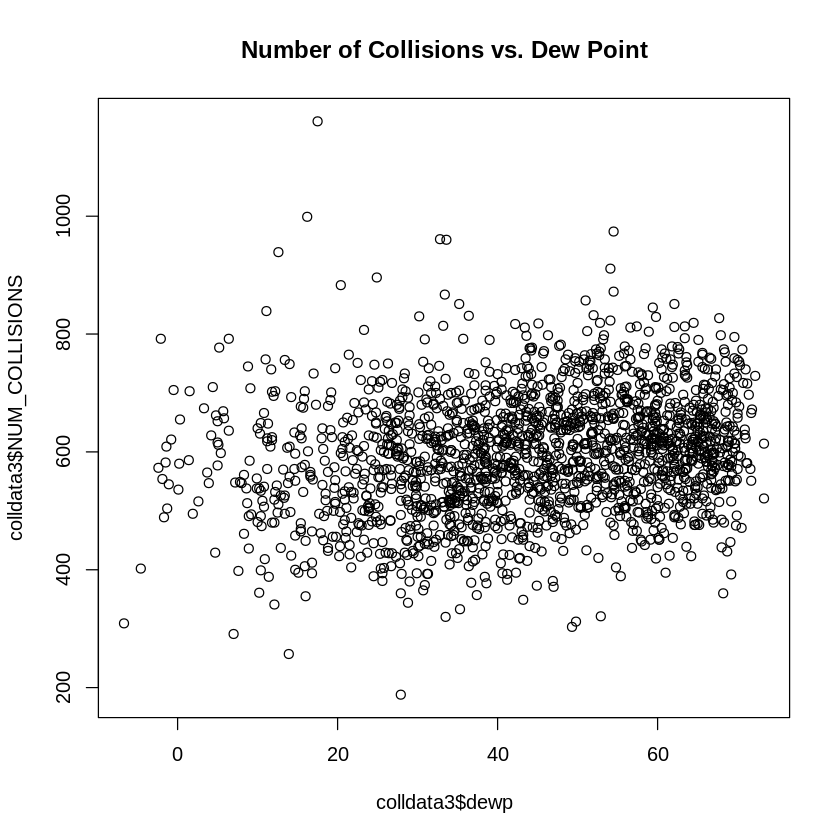

In [1193]:
plot(colldata3$dewp, colldata3$NUM_COLLISIONS, main = "Number of Collisions vs. Dew Point")
cor(colldata3$dewp, colldata3$NUM_COLLISIONS)

The correlation coefficients across all variables have improved. We can take a look at each year individually to assess the seasonal pattern and variability within the years. Reducing the dataset to smaller section can potentially improve our coefficients further by removing the year-on-year variability.  


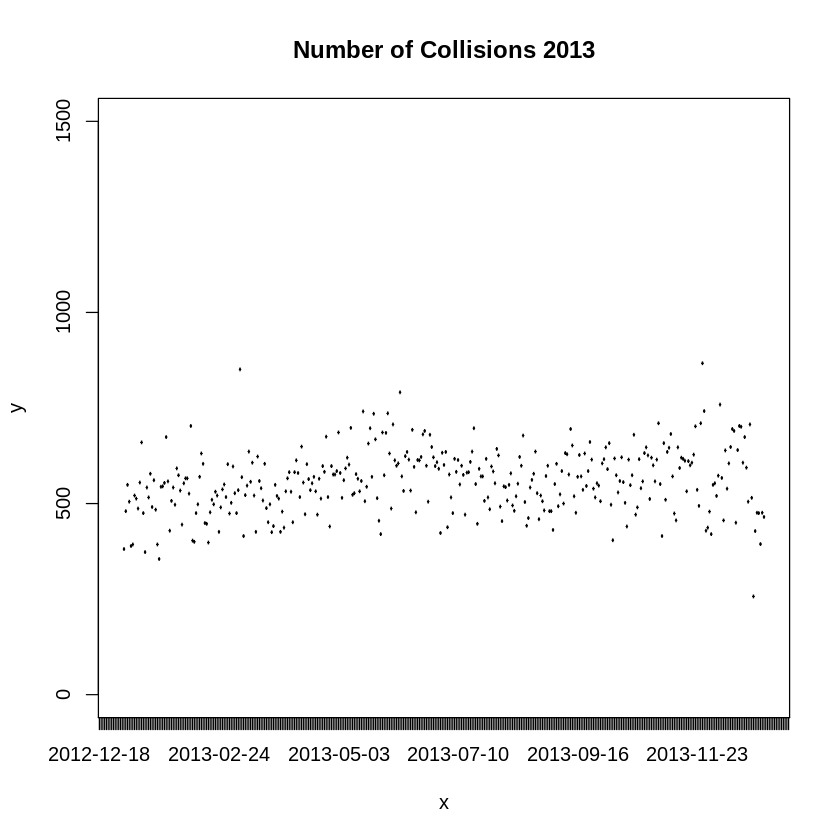

In [1194]:
plot(coll2013$collision_date, coll2013$NUM_COLLISIONS, main = "Number of Collisions 2013", xlim = c(185, 549), ylim = c(0, 1500))

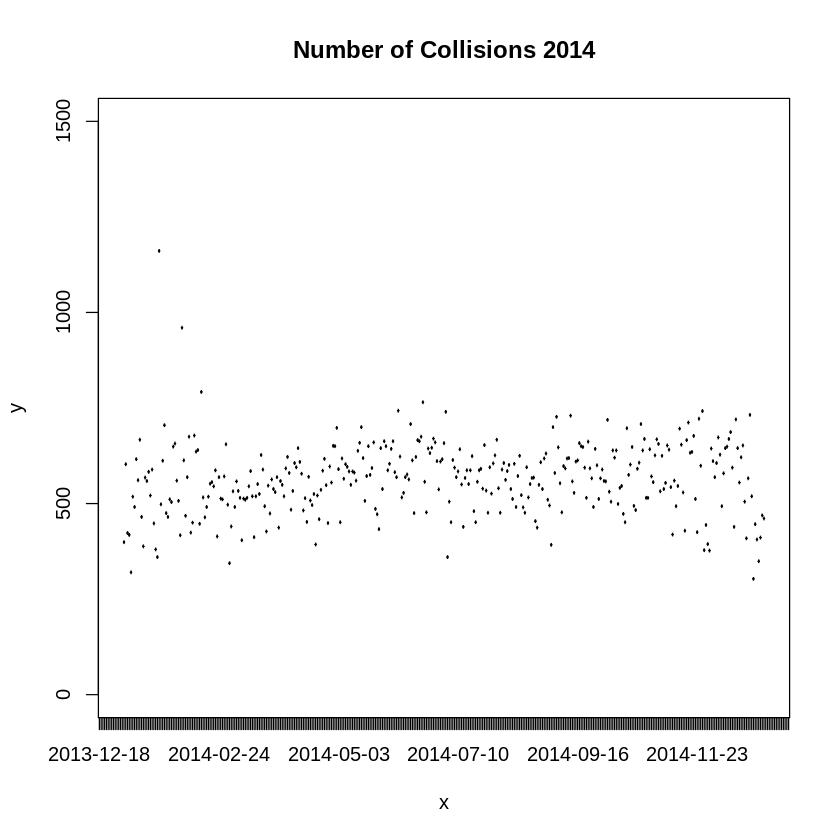

In [1195]:
plot(coll2014$collision_date, coll2014$NUM_COLLISIONS, main = "Number of Collisions 2014", xlim = c(550, 914), ylim = c(0, 1500))

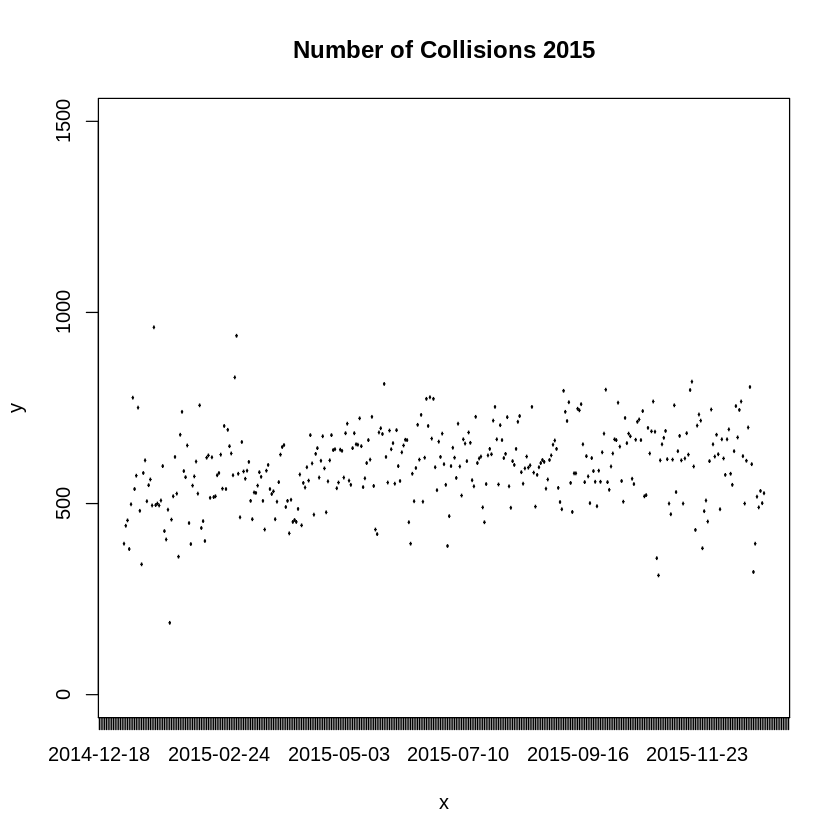

In [1196]:
plot(coll2015$collision_date, coll2015$NUM_COLLISIONS, main = "Number of Collisions 2015", xlim = c(915, 1279), ylim = c(0, 1500))

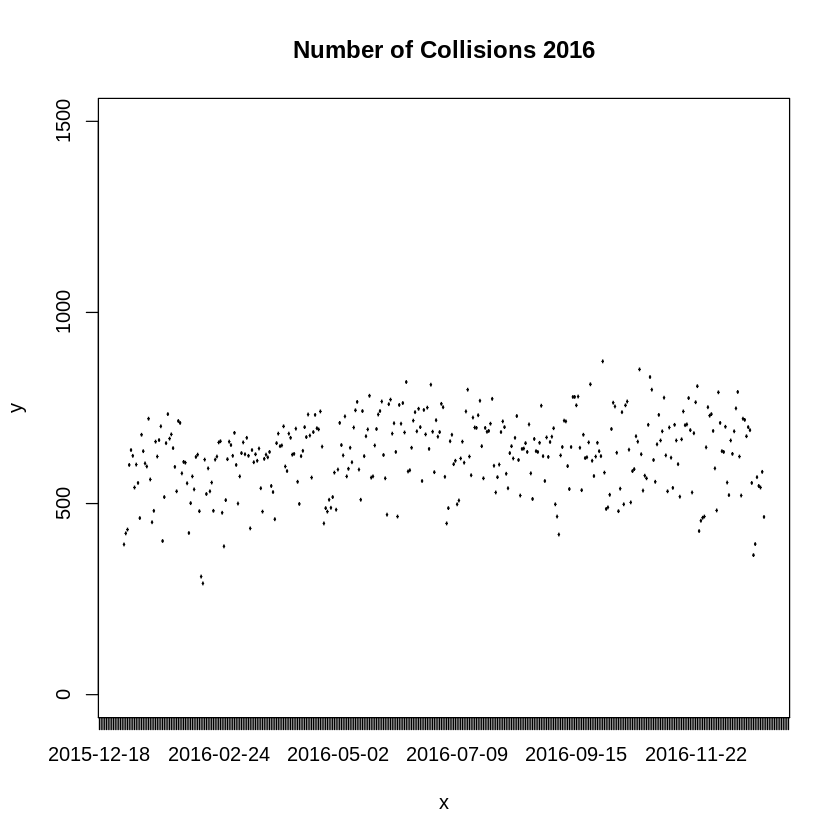

In [1197]:
plot(coll2016$collision_date, coll2016$NUM_COLLISIONS, main = "Number of Collisions 2016", xlim = c(1280, 1645), ylim = c(0, 1500))

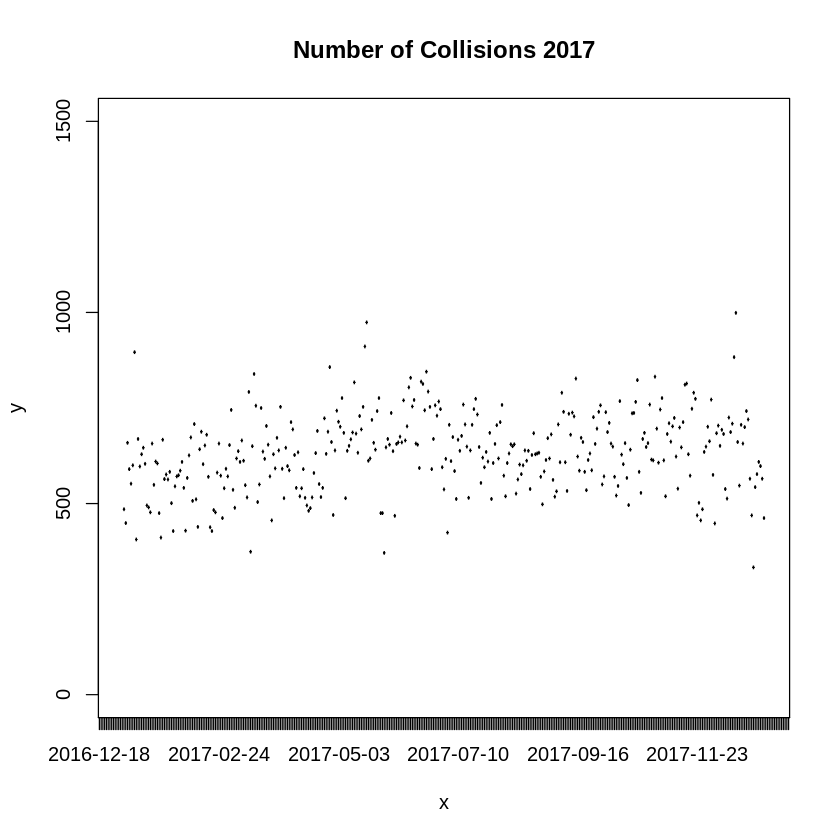

In [1198]:
plot(coll2017$collision_date, coll2017$NUM_COLLISIONS, main = "Number of Collisions 2017", xlim = c(1646, 2010), ylim = c(0, 1500))

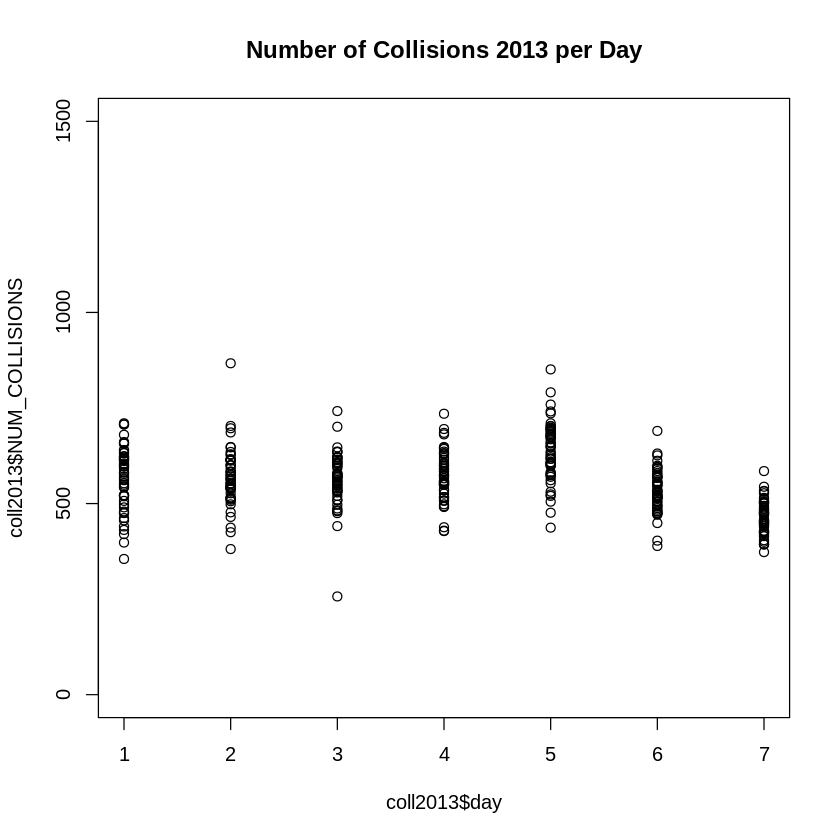

In [1199]:
plot(coll2013$day, coll2013$NUM_COLLISIONS, main = "Number of Collisions 2013 per Day", ylim = c(0, 1500))

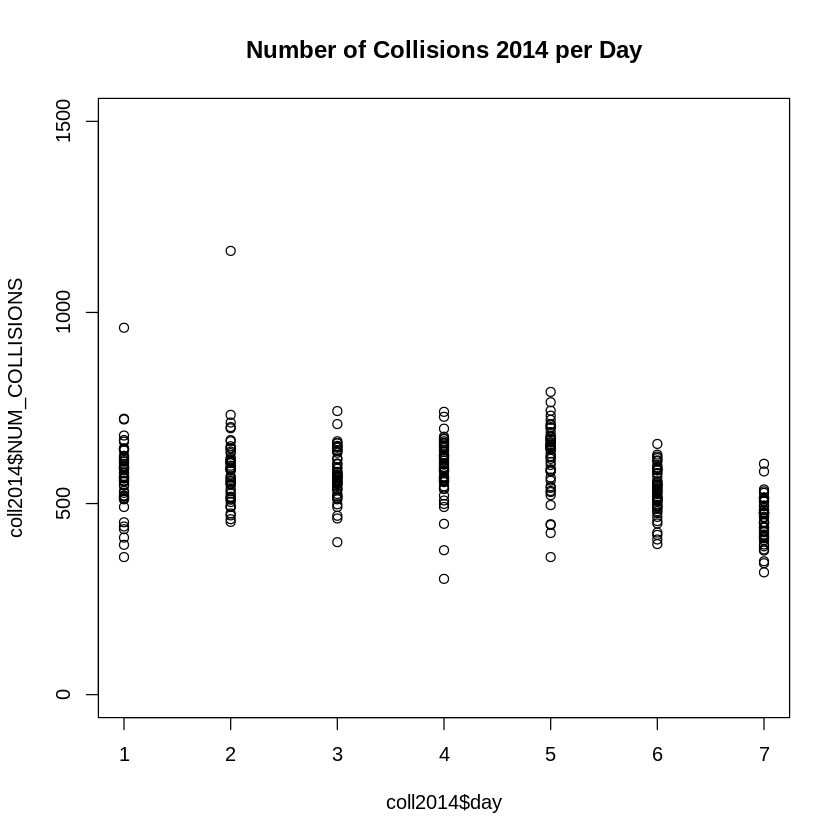

In [1200]:
plot(coll2014$day, coll2014$NUM_COLLISIONS, main = "Number of Collisions 2014 per Day", ylim = c(0, 1500))

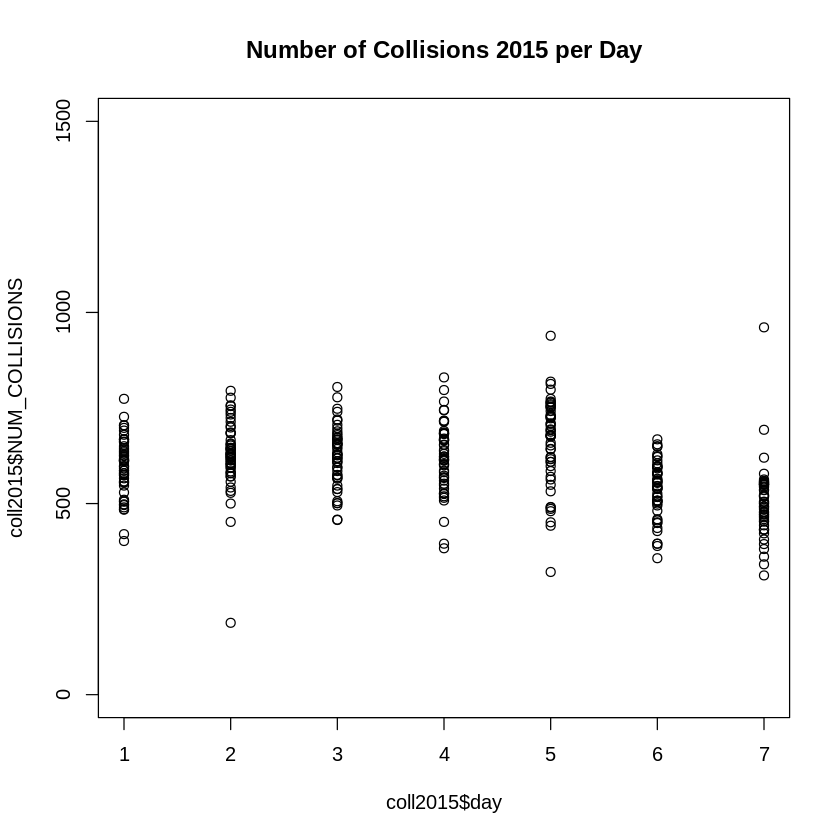

In [1201]:
plot(coll2015$day, coll2015$NUM_COLLISIONS, main = "Number of Collisions 2015 per Day", ylim = c(0, 1500))

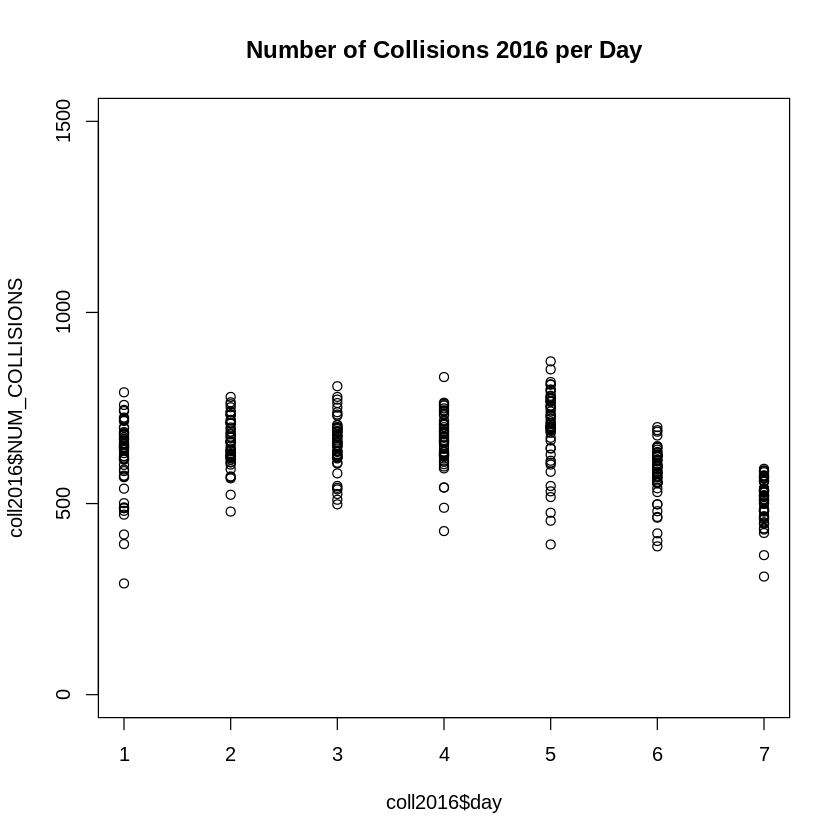

In [1202]:
plot(coll2016$day, coll2016$NUM_COLLISIONS, main = "Number of Collisions 2016 per Day", ylim = c(0, 1500))

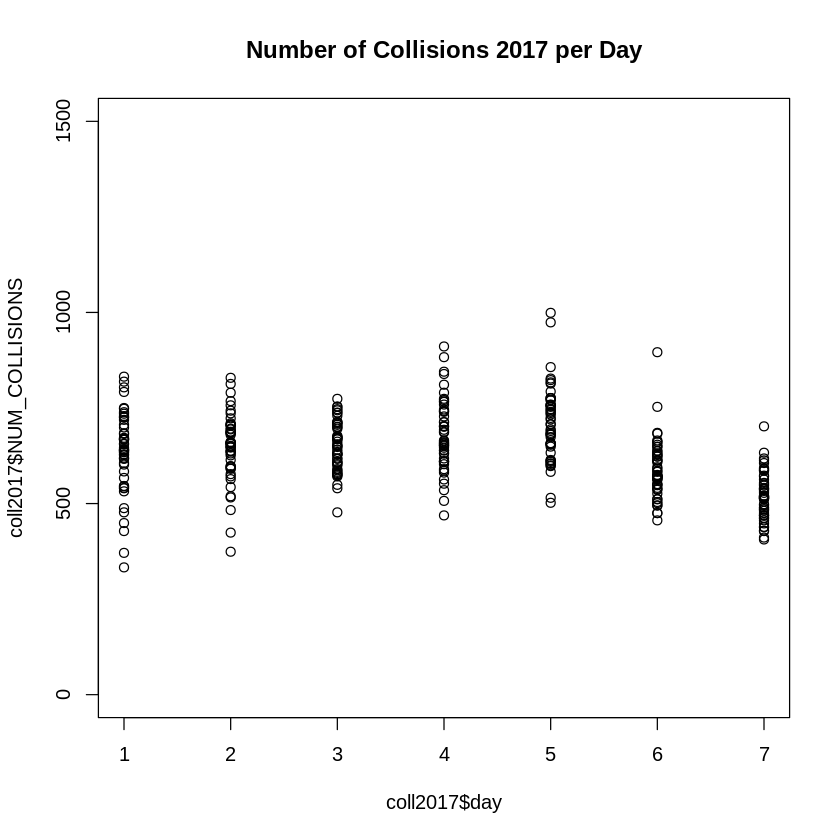

In [1203]:
plot(coll2017$day, coll2017$NUM_COLLISIONS, main = "Number of Collisions 2017 per Day", ylim = c(0, 1500))

In [1204]:
cor(coll2013$day, coll2013$NUM_COLLISIONS)
cor(coll2014$day, coll2014$NUM_COLLISIONS)
cor(coll2015$day, coll2015$NUM_COLLISIONS)
cor(coll2016$day, coll2016$NUM_COLLISIONS)
cor(coll2017$day, coll2017$NUM_COLLISIONS)

[1] -0.2659958

[1] -0.3278191

[1] -0.2914501

[1] -0.3342659

[1] -0.290975

In [1205]:
cor(coll2013$temp, coll2013$NUM_COLLISIONS)
cor(coll2014$temp, coll2014$NUM_COLLISIONS)
cor(coll2015$temp, coll2015$NUM_COLLISIONS)
cor(coll2016$temp, coll2016$NUM_COLLISIONS)
cor(coll2017$temp, coll2017$NUM_COLLISIONS)

[1] 0.1981793

[1] 0.1577755

[1] 0.2482423

[1] 0.2648656

[1] 0.2073728

In [1206]:
cor(coll2013$dewp, coll2013$NUM_COLLISIONS)
cor(coll2014$dewp, coll2014$NUM_COLLISIONS)
cor(coll2015$dewp, coll2015$NUM_COLLISIONS)
cor(coll2016$dewp, coll2016$NUM_COLLISIONS)
cor(coll2017$dewp, coll2017$NUM_COLLISIONS)

[1] 0.1891508

[1] 0.1430246

[1] 0.2426074

[1] 0.2474369

[1] 0.1875244

Variability is reduced with individual years with the correlation far better than that for the amalgamated data, especially for weekdays.  

There are more outliers at the beginning and the end of year and around the mid-year mark. For some years the greatest variability is most of the first half of the year. For the weather variables, 2014 shows the poorest relationship with the best being 2015-16.  

To further reduce variability, we shall select a small subset of the year that seems the most stable across the years and analyse this. Mid-July to the end of August appears to be relatively similar across the years.  





In [1207]:
coll2013 <- arrange(coll2013, collision_date)
coll2014 <- arrange(coll2014, collision_date)
coll2015 <- arrange(coll2015, collision_date)
coll2016 <- arrange(coll2016, collision_date)
coll2017 <- arrange(coll2017, collision_date)

coll2013$collision_date[196:243]
coll2014$collision_date[196:243]
coll2015$collision_date[196:243]
coll2016$collision_date[197:244]
coll2017$collision_date[196:243]

[1] 2013-07-15 2013-07-16 2013-07-17 2013-07-18 2013-07-19 2013-07-20
 [7] 2013-07-21 2013-07-22 2013-07-23 2013-07-24 2013-07-25 2013-07-26
[13] 2013-07-27 2013-07-28 2013-07-29 2013-07-30 2013-07-31 2013-08-01
[19] 2013-08-02 2013-08-03 2013-08-04 2013-08-05 2013-08-06 2013-08-07
[25] 2013-08-08 2013-08-09 2013-08-10 2013-08-11 2013-08-12 2013-08-13
[31] 2013-08-14 2013-08-15 2013-08-16 2013-08-17 2013-08-18 2013-08-19
[37] 2013-08-20 2013-08-21 2013-08-22 2013-08-23 2013-08-24 2013-08-25
[43] 2013-08-26 2013-08-27 2013-08-28 2013-08-29 2013-08-30 2013-08-31
3075 Levels: 2012-07-01 2012-07-02 2012-07-03 2012-07-04 ... 2020-11-30

[1] 2014-07-15 2014-07-16 2014-07-17 2014-07-18 2014-07-19 2014-07-20
 [7] 2014-07-21 2014-07-22 2014-07-23 2014-07-24 2014-07-25 2014-07-26
[13] 2014-07-27 2014-07-28 2014-07-29 2014-07-30 2014-07-31 2014-08-01
[19] 2014-08-02 2014-08-03 2014-08-04 2014-08-05 2014-08-06 2014-08-07
[25] 2014-08-08 2014-08-09 2014-08-10 2014-08-11 2014-08-12 2014-08-13
[31] 2014-08-14 2014-08-15 2014-08-16 2014-08-17 2014-08-18 2014-08-19
[37] 2014-08-20 2014-08-21 2014-08-22 2014-08-23 2014-08-24 2014-08-25
[43] 2014-08-26 2014-08-27 2014-08-28 2014-08-29 2014-08-30 2014-08-31
3075 Levels: 2012-07-01 2012-07-02 2012-07-03 2012-07-04 ... 2020-11-30

[1] 2015-07-15 2015-07-16 2015-07-17 2015-07-18 2015-07-19 2015-07-20
 [7] 2015-07-21 2015-07-22 2015-07-23 2015-07-24 2015-07-25 2015-07-26
[13] 2015-07-27 2015-07-28 2015-07-29 2015-07-30 2015-07-31 2015-08-01
[19] 2015-08-02 2015-08-03 2015-08-04 2015-08-05 2015-08-06 2015-08-07
[25] 2015-08-08 2015-08-09 2015-08-10 2015-08-11 2015-08-12 2015-08-13
[31] 2015-08-14 2015-08-15 2015-08-16 2015-08-17 2015-08-18 2015-08-19
[37] 2015-08-20 2015-08-21 2015-08-22 2015-08-23 2015-08-24 2015-08-25
[43] 2015-08-26 2015-08-27 2015-08-28 2015-08-29 2015-08-30 2015-08-31
3075 Levels: 2012-07-01 2012-07-02 2012-07-03 2012-07-04 ... 2020-11-30

[1] 2016-07-15 2016-07-16 2016-07-17 2016-07-18 2016-07-19 2016-07-20
 [7] 2016-07-21 2016-07-22 2016-07-23 2016-07-24 2016-07-25 2016-07-26
[13] 2016-07-27 2016-07-28 2016-07-29 2016-07-30 2016-07-31 2016-08-01
[19] 2016-08-02 2016-08-03 2016-08-04 2016-08-05 2016-08-06 2016-08-07
[25] 2016-08-08 2016-08-09 2016-08-10 2016-08-11 2016-08-12 2016-08-13
[31] 2016-08-14 2016-08-15 2016-08-16 2016-08-17 2016-08-18 2016-08-19
[37] 2016-08-20 2016-08-21 2016-08-22 2016-08-23 2016-08-24 2016-08-25
[43] 2016-08-26 2016-08-27 2016-08-28 2016-08-29 2016-08-30 2016-08-31
3075 Levels: 2012-07-01 2012-07-02 2012-07-03 2012-07-04 ... 2020-11-30

[1] 2017-07-15 2017-07-16 2017-07-17 2017-07-18 2017-07-19 2017-07-20
 [7] 2017-07-21 2017-07-22 2017-07-23 2017-07-24 2017-07-25 2017-07-26
[13] 2017-07-27 2017-07-28 2017-07-29 2017-07-30 2017-07-31 2017-08-01
[19] 2017-08-02 2017-08-03 2017-08-04 2017-08-05 2017-08-06 2017-08-07
[25] 2017-08-08 2017-08-09 2017-08-10 2017-08-11 2017-08-12 2017-08-13
[31] 2017-08-14 2017-08-15 2017-08-16 2017-08-17 2017-08-18 2017-08-19
[37] 2017-08-20 2017-08-21 2017-08-22 2017-08-23 2017-08-24 2017-08-25
[43] 2017-08-26 2017-08-27 2017-08-28 2017-08-29 2017-08-30 2017-08-31
3075 Levels: 2012-07-01 2012-07-02 2012-07-03 2012-07-04 ... 2020-11-30

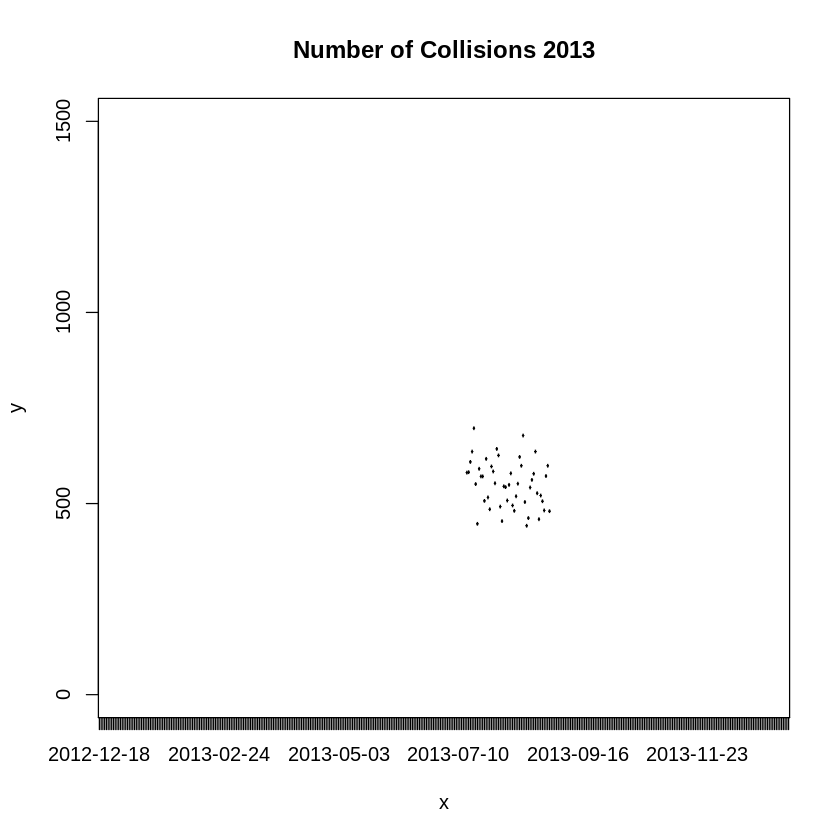

In [1208]:
plot(coll2013$collision_date[196:243], coll2013$NUM_COLLISIONS[196:243], main = "Number of Collisions 2013", xlim = c(185, 549), ylim = c(0, 1500))

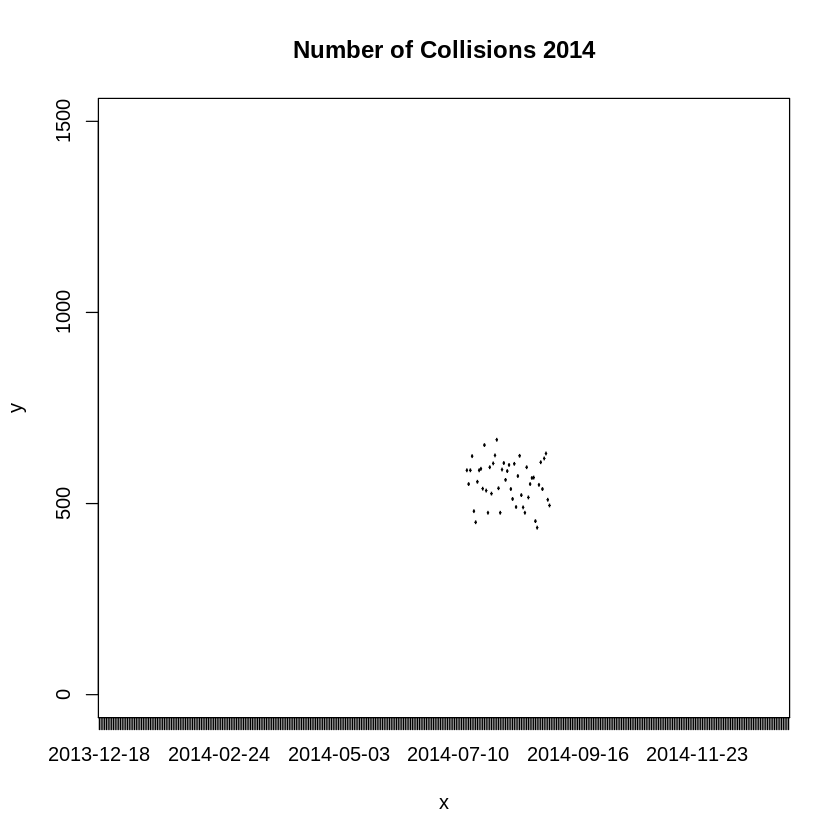

In [1209]:
plot(coll2014$collision_date[196:243], coll2014$NUM_COLLISIONS[196:243], main = "Number of Collisions 2014", xlim = c(550, 914), ylim = c(0, 1500))

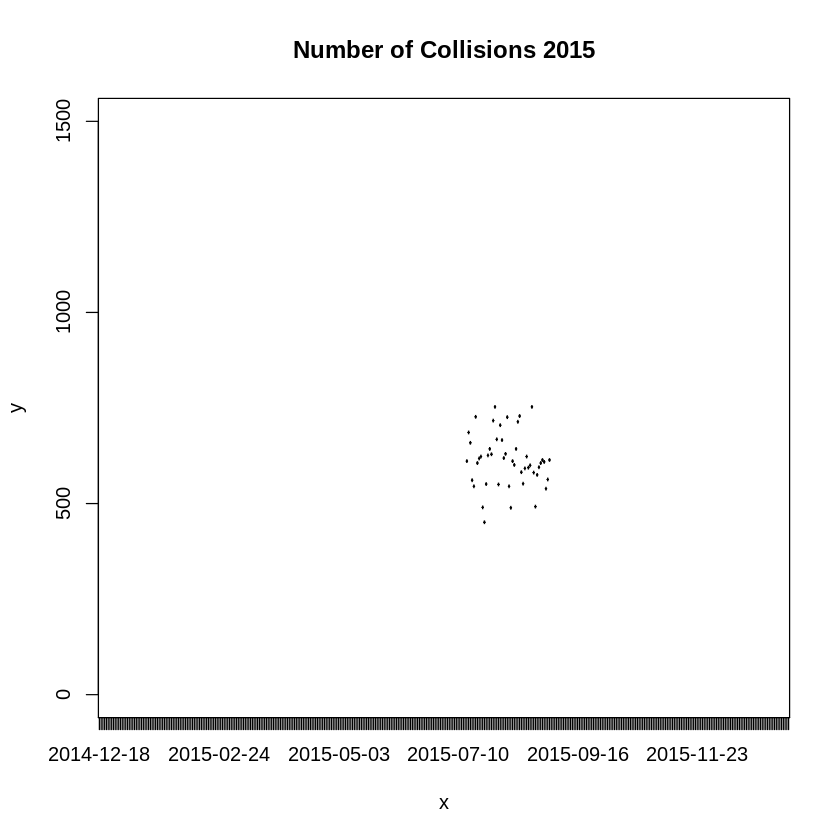

In [1210]:
plot(coll2015$collision_date[196:243], coll2015$NUM_COLLISIONS[196:243], main = "Number of Collisions 2015", xlim = c(915, 1279), ylim = c(0, 1500))

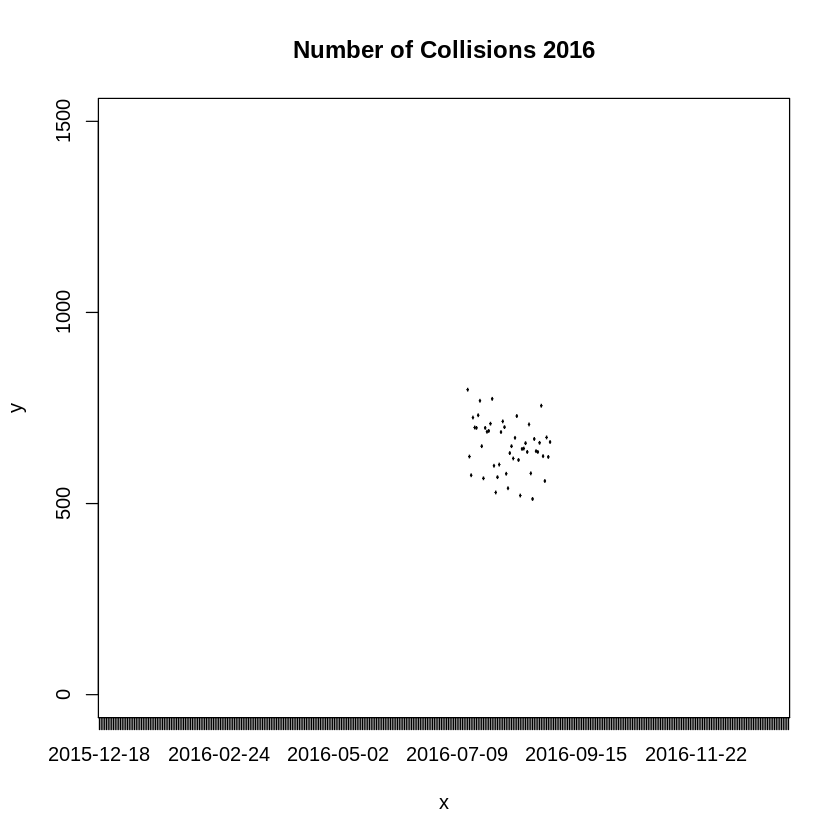

In [1211]:
plot(coll2016$collision_date[197:244], coll2016$NUM_COLLISIONS[197:244], main = "Number of Collisions 2016", xlim = c(1280, 1645), ylim = c(0, 1500))

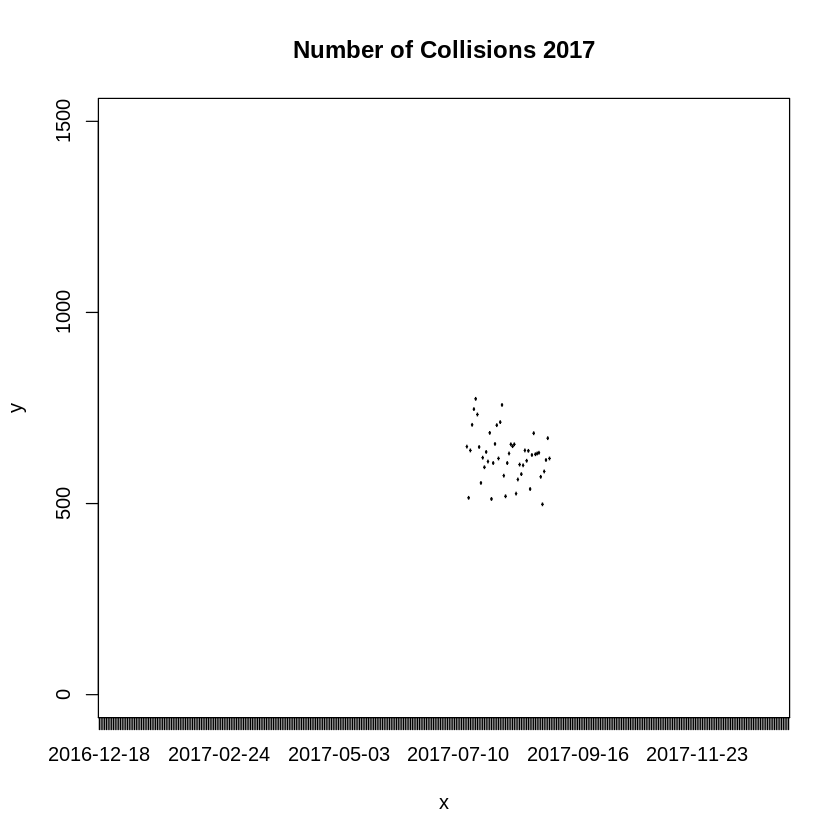

In [1212]:
plot(coll2017$collision_date[196:243], coll2017$NUM_COLLISIONS[196:243], main = "Number of Collisions 2017", xlim = c(1646, 2010), ylim = c(0, 1500))

These sections are not all perfect but are generally more stable than other regions across the years. Let's plot each of our variables for this subset of each year.

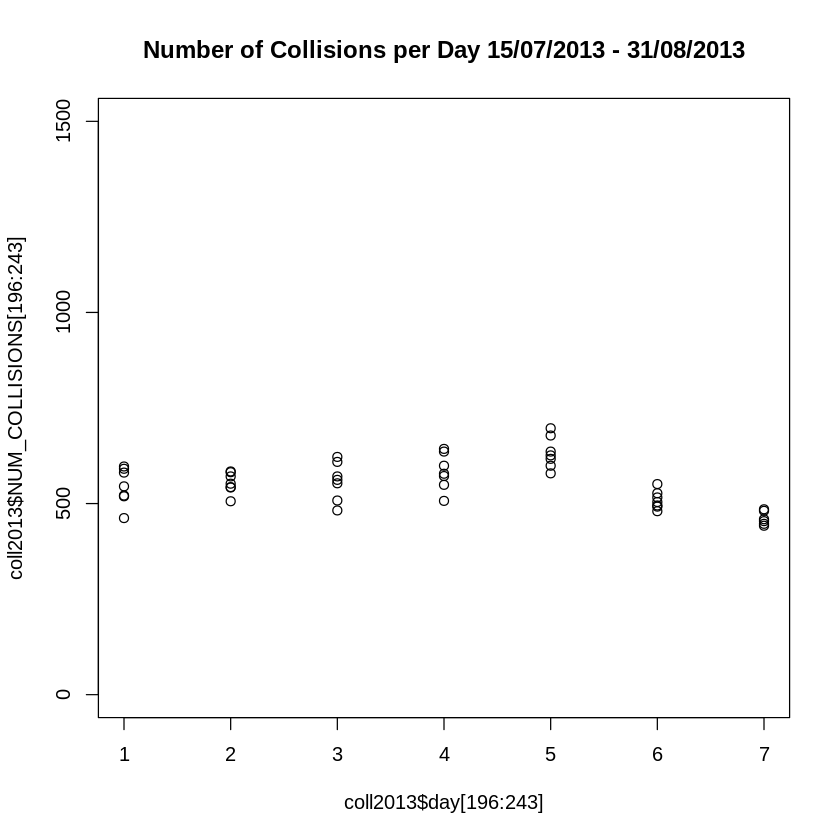

In [1213]:
plot(coll2013$day[196:243], coll2013$NUM_COLLISIONS[196:243], main = "Number of Collisions per Day 15/07/2013 - 31/08/2013", ylim = c(0, 1500))

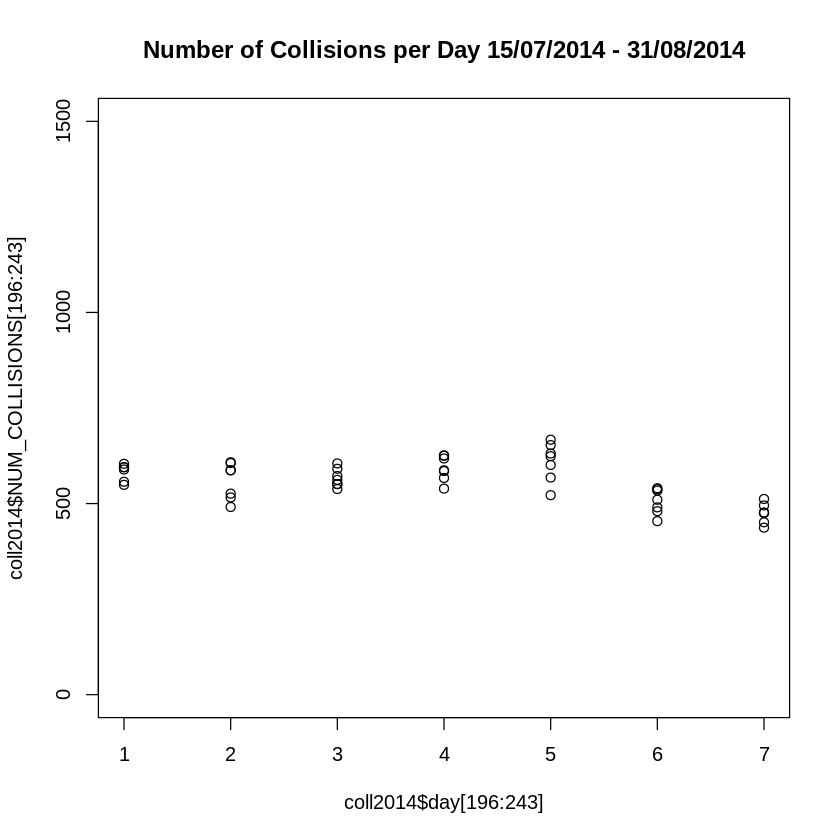

In [1214]:
plot(coll2014$day[196:243], coll2014$NUM_COLLISIONS[196:243], main = "Number of Collisions per Day 15/07/2014 - 31/08/2014", ylim = c(0, 1500))

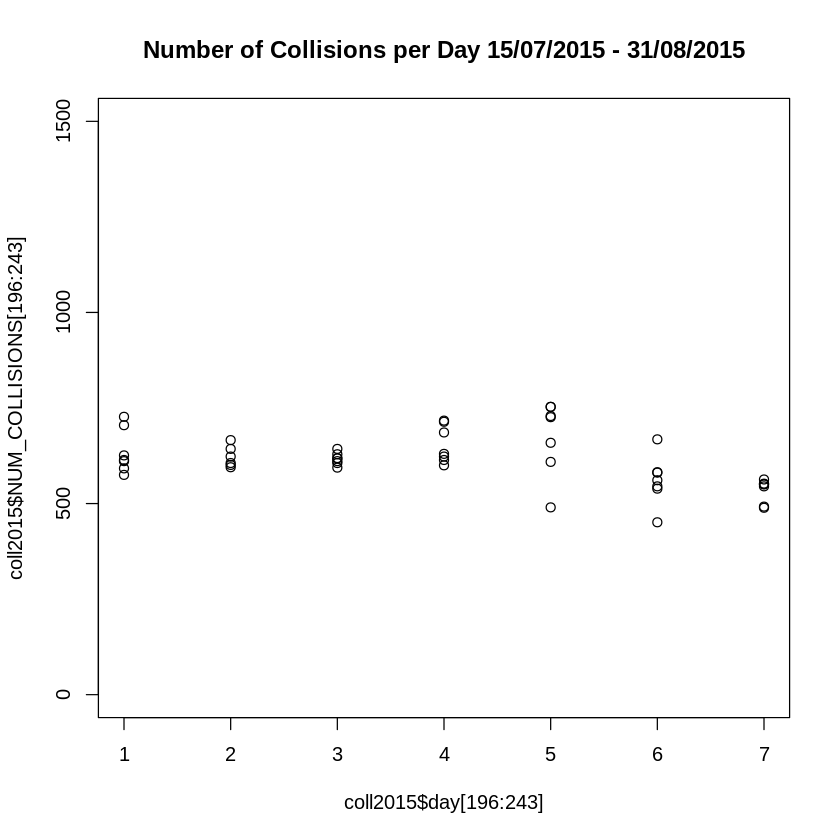

In [1215]:
plot(coll2015$day[196:243], coll2015$NUM_COLLISIONS[196:243], main = "Number of Collisions per Day 15/07/2015 - 31/08/2015", ylim = c(0, 1500))

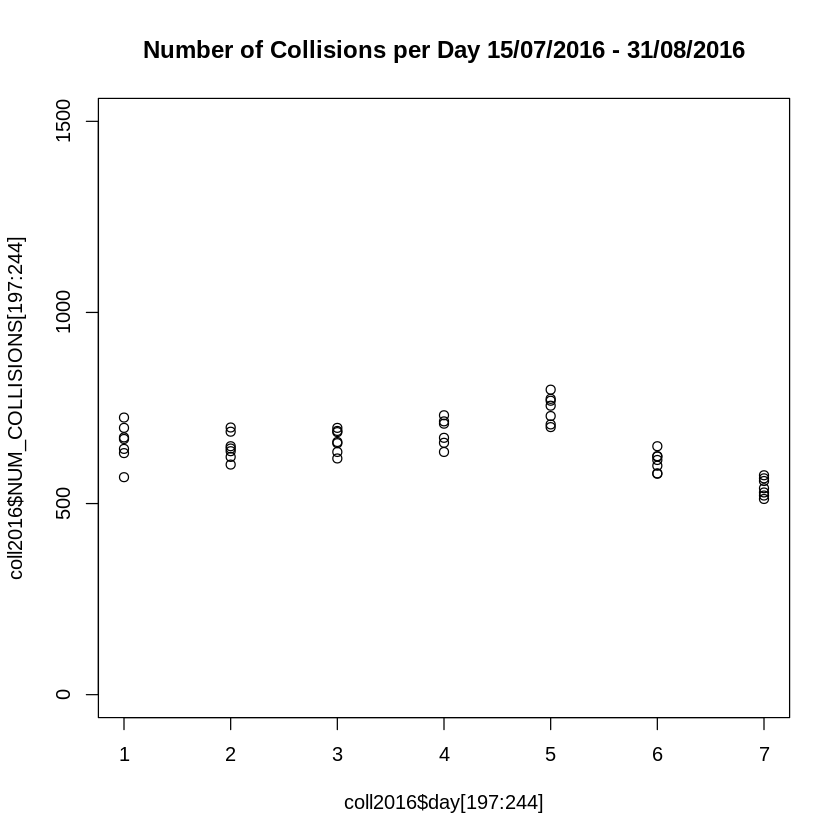

In [1216]:
plot(coll2016$day[197:244], coll2016$NUM_COLLISIONS[197:244], main = "Number of Collisions per Day 15/07/2016 - 31/08/2016", ylim = c(0, 1500))

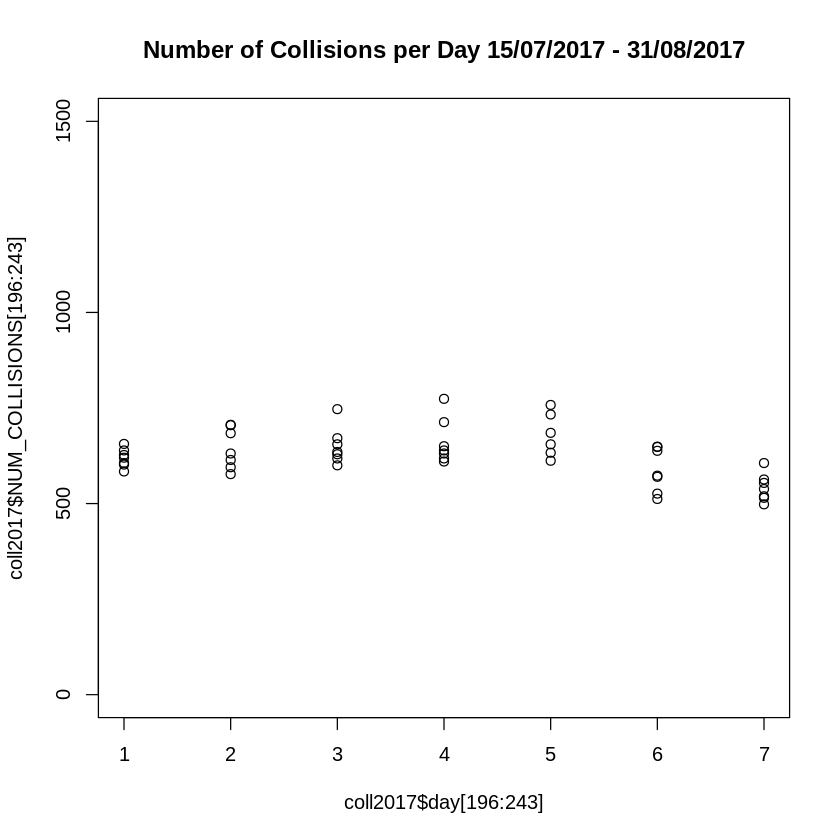

In [1217]:
plot(coll2017$day[196:243], coll2017$NUM_COLLISIONS[196:243], main = "Number of Collisions per Day 15/07/2017 - 31/08/2017", ylim = c(0, 1500))

In [1218]:
cor(coll2013$day[196:243], coll2013$NUM_COLLISIONS[196:243])
cor(coll2014$day[196:243], coll2014$NUM_COLLISIONS[196:243])
cor(coll2015$day[196:243], coll2015$NUM_COLLISIONS[196:243])
cor(coll2016$day[197:244], coll2016$NUM_COLLISIONS[197:244])
cor(coll2017$day[196:243], coll2017$NUM_COLLISIONS[196:243])

[1] -0.275958

[1] -0.4956355

[1] -0.3849407

[1] -0.3650062

[1] -0.3695646

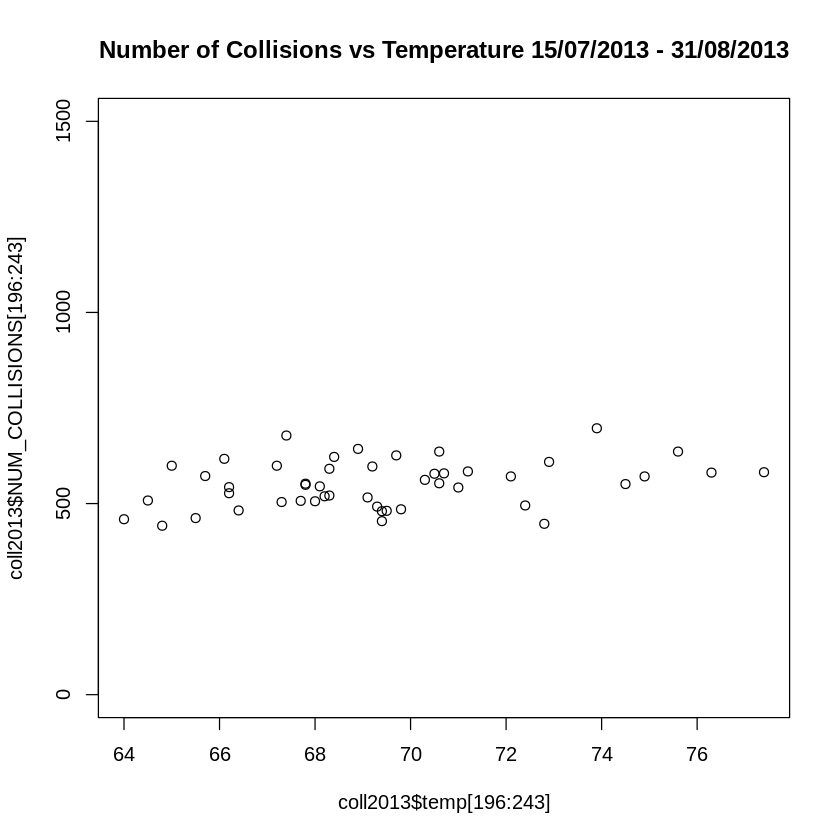

In [1219]:
plot(coll2013$temp[196:243], coll2013$NUM_COLLISIONS[196:243], main = "Number of Collisions vs Temperature 15/07/2013 - 31/08/2013", ylim = c(0, 1500))

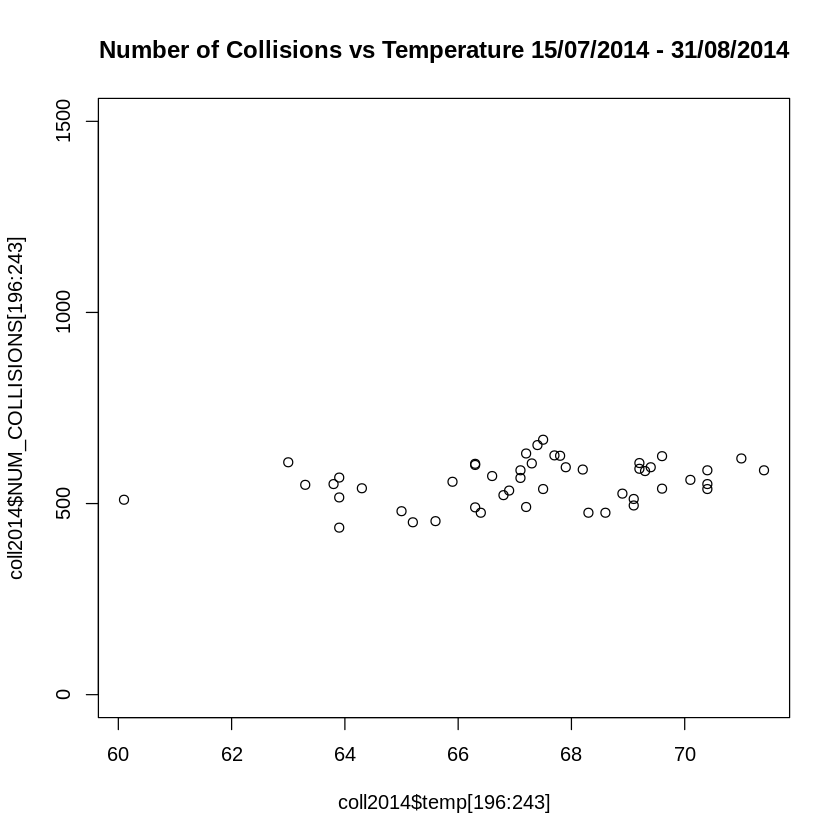

In [1220]:
plot(coll2014$temp[196:243], coll2014$NUM_COLLISIONS[196:243], main = "Number of Collisions vs Temperature 15/07/2014 - 31/08/2014", ylim = c(0, 1500))

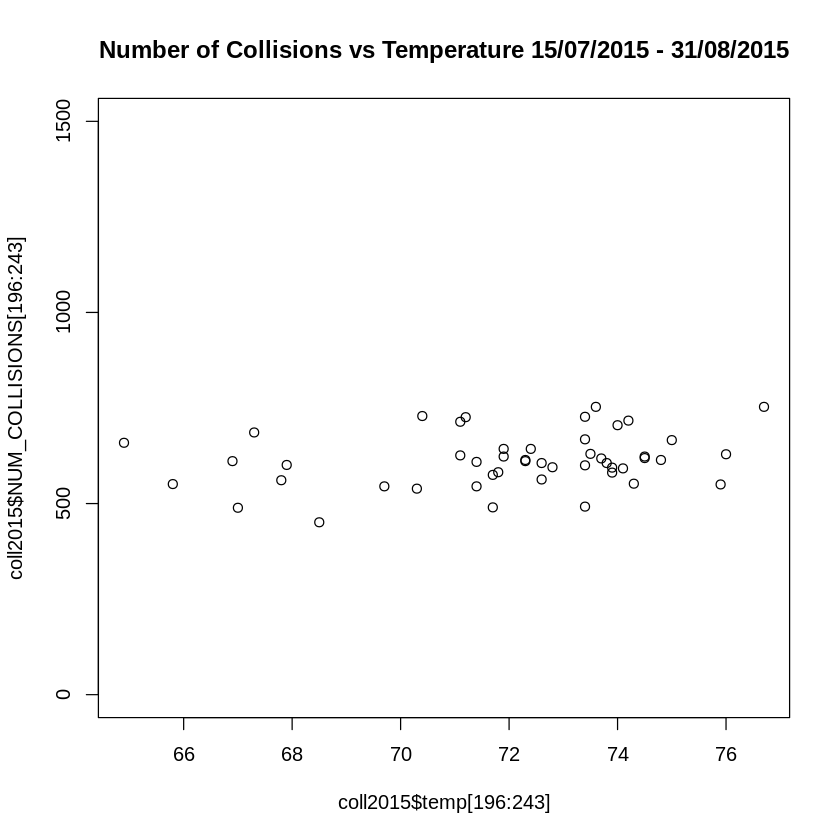

In [1221]:
plot(coll2015$temp[196:243], coll2015$NUM_COLLISIONS[196:243], main = "Number of Collisions vs Temperature 15/07/2015 - 31/08/2015", ylim = c(0, 1500))

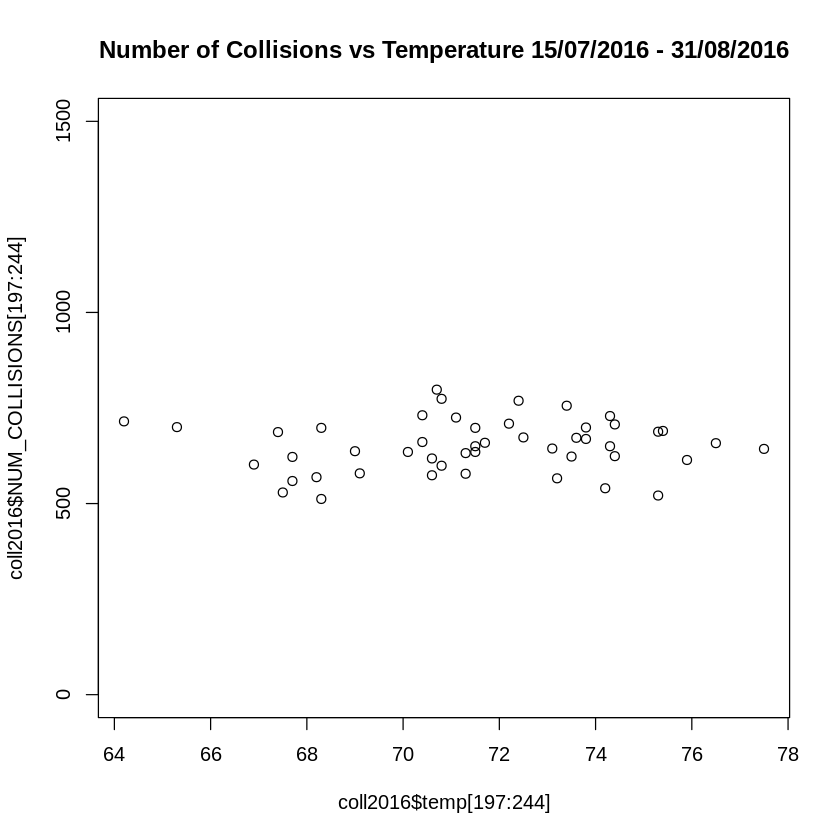

In [1222]:
plot(coll2016$temp[197:244], coll2016$NUM_COLLISIONS[197:244], main = "Number of Collisions vs Temperature 15/07/2016 - 31/08/2016", ylim = c(0, 1500))

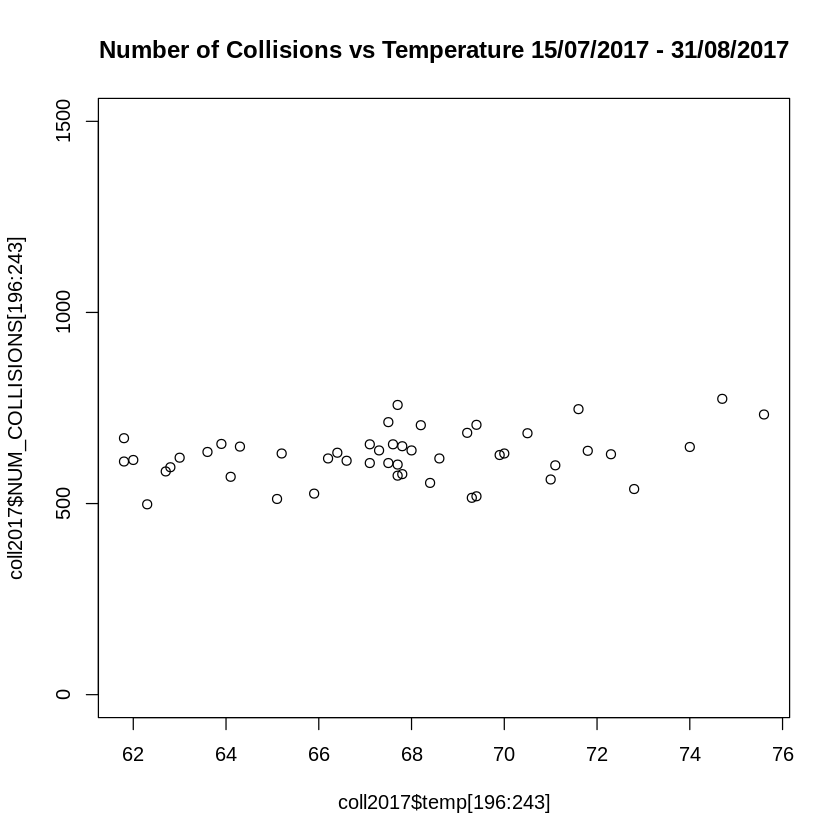

In [1223]:
plot(coll2017$temp[196:243], coll2017$NUM_COLLISIONS[196:243], main = "Number of Collisions vs Temperature 15/07/2017 - 31/08/2017", ylim = c(0, 1500))

In [1224]:
cor(coll2013$temp[196:243], coll2013$NUM_COLLISIONS[196:243])
cor(coll2014$temp[196:243], coll2014$NUM_COLLISIONS[196:243])
cor(coll2015$temp[196:243], coll2015$NUM_COLLISIONS[196:243])
cor(coll2016$temp[197:244], coll2016$NUM_COLLISIONS[197:244])
cor(coll2017$temp[196:243], coll2017$NUM_COLLISIONS[196:243])

[1] 0.3111794

[1] 0.2932805

[1] 0.2485436

[1] 0.0885857

[1] 0.3104195

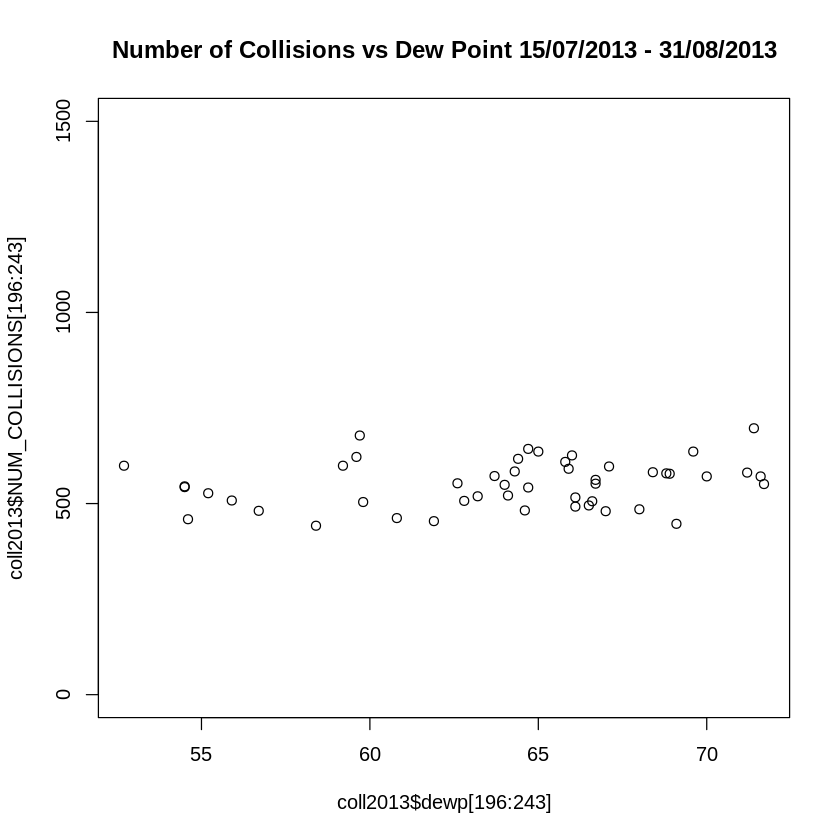

In [1225]:
plot(coll2013$dewp[196:243], coll2013$NUM_COLLISIONS[196:243], main = "Number of Collisions vs Dew Point 15/07/2013 - 31/08/2013", ylim = c(0, 1500))

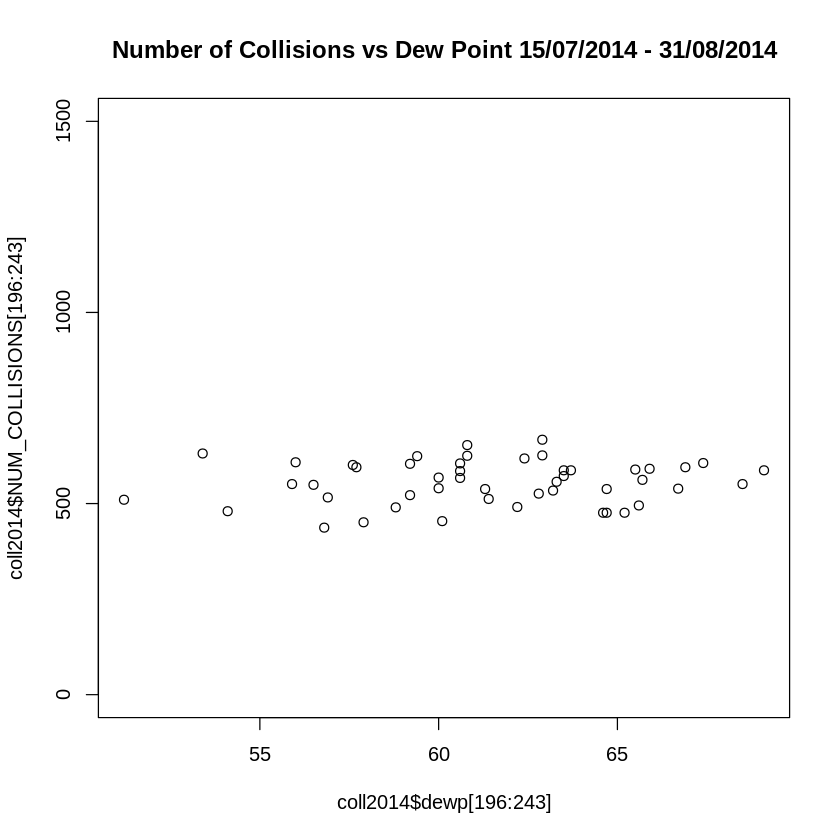

In [1226]:
plot(coll2014$dewp[196:243], coll2014$NUM_COLLISIONS[196:243], main = "Number of Collisions vs Dew Point 15/07/2014 - 31/08/2014", ylim = c(0, 1500))

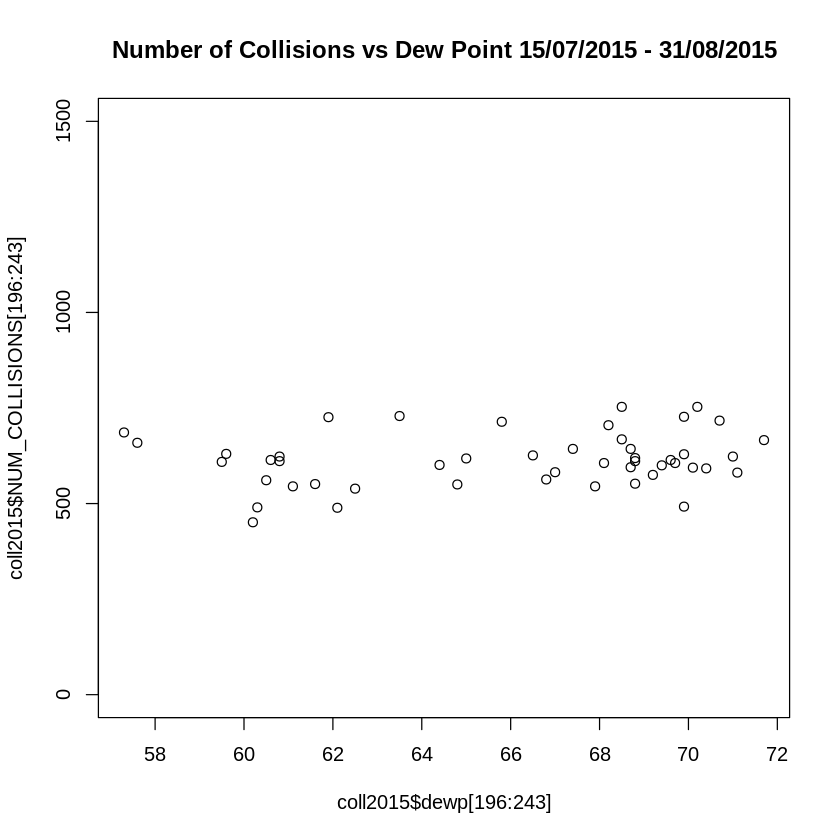

In [1227]:
plot(coll2015$dewp[196:243], coll2015$NUM_COLLISIONS[196:243], main = "Number of Collisions vs Dew Point 15/07/2015 - 31/08/2015", ylim = c(0, 1500))

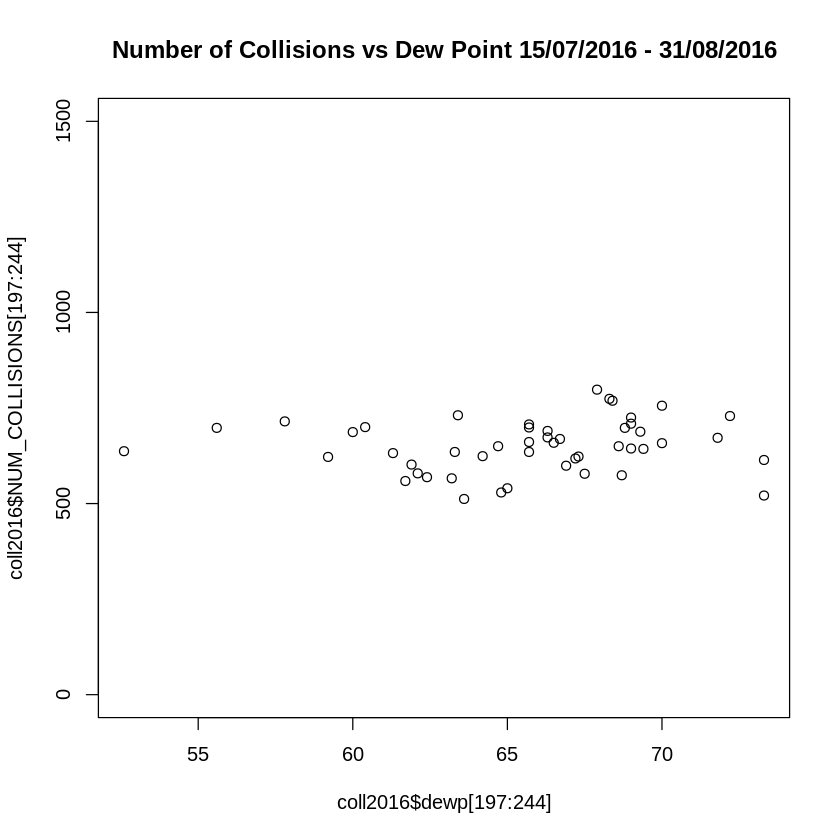

In [1228]:
plot(coll2016$dewp[197:244], coll2016$NUM_COLLISIONS[197:244], main = "Number of Collisions vs Dew Point 15/07/2016 - 31/08/2016", ylim = c(0, 1500))

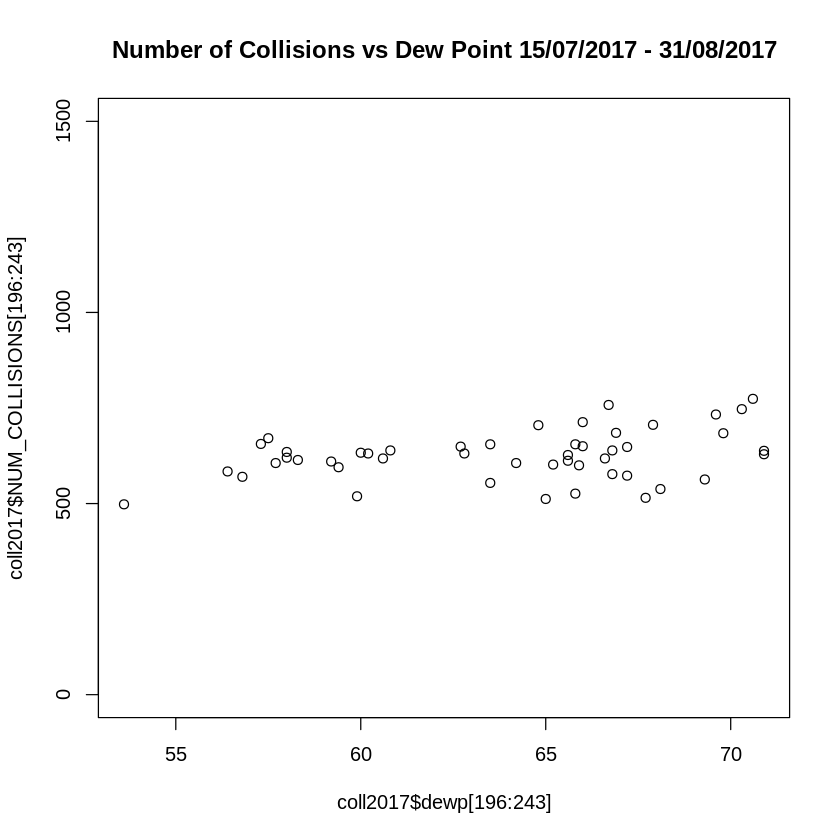

In [1229]:
plot(coll2017$dewp[196:243], coll2017$NUM_COLLISIONS[196:243], main = "Number of Collisions vs Dew Point 15/07/2017 - 31/08/2017", ylim = c(0, 1500))

In [1230]:
cor(coll2013$dewp[196:243], coll2013$NUM_COLLISIONS[196:243])
cor(coll2014$dewp[196:243], coll2014$NUM_COLLISIONS[196:243])
cor(coll2015$dewp[196:243], coll2015$NUM_COLLISIONS[196:243])
cor(coll2016$dewp[197:244], coll2016$NUM_COLLISIONS[197:244])
cor(coll2017$dewp[196:243], coll2017$NUM_COLLISIONS[196:243])

[1] 0.2349924

[1] 0.1061747

[1] 0.2007412

[1] 0.1214561

[1] 0.3326028

Even though the correlation numbers are improved for the day of the week, they are inconsistent and generally lower for temperature and dew point. Even though the data does seem to contain less variability in terms of overall number of collisions over time, potentially temperature and dew point are less likely to impact the numbers during the height of summer.  

Let us pick another subset of the year and run the correlation coefficients again to see if they change/improve.  





In [1231]:
cor(coll2013$temp[274:304], coll2013$NUM_COLLISIONS[274:304])
cor(coll2014$temp[274:304], coll2014$NUM_COLLISIONS[274:304])
cor(coll2015$temp[274:304], coll2015$NUM_COLLISIONS[274:304])
cor(coll2016$temp[275:305], coll2016$NUM_COLLISIONS[275:305])
cor(coll2017$temp[274:304], coll2017$NUM_COLLISIONS[274:304])

[1] 0.03704849

[1] 0.1228286

[1] 0.393823

[1] -0.1978854

[1] -0.2389282

In [1232]:
cor(coll2013$dewp[274:304], coll2013$NUM_COLLISIONS[274:304])
cor(coll2014$dewp[274:304], coll2014$NUM_COLLISIONS[274:304])
cor(coll2015$dewp[274:304], coll2015$NUM_COLLISIONS[274:304])
cor(coll2016$dewp[275:305], coll2016$NUM_COLLISIONS[275:305])
cor(coll2017$dewp[274:304], coll2017$NUM_COLLISIONS[274:304])

[1] -0.03891005

[1] 0.2330218

[1] 0.3280725

[1] -0.1031568

[1] -0.3826828

This did not improve our situation as the weather variability is still too high during the month selected and the data will require pruning to remove outliers and reduce variability. The relationship between different years has completely changed and does validate idea that the relationship will change at different times of year and seasonality should be a variable in our models.  


## Removing Outliers

In [1233]:
dayofyear <- 1*seq_len(nrow(coll2013))
dayindex <- 1*seq_len(nrow(coll2013))
coll2013a <- cbind(dayindex, dayofyear, coll2013)

In [1234]:
head(coll2013a)
tail(coll2013a)

,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,1,1,2,2013,1,1,2013-01-01,38.0,25.6,1008.8,10.0,15.0,21.0,28.0,41.0,33.1,0.00,999.9,0,381
2,2,2,3,2013,1,2,2013-01-02,27.5,12.1,1013.4,10.0,12.4,15.9,25.1,33.1,21.9,0.00,999.9,0,480
3,3,3,4,2013,1,3,2013-01-03,21.8,7.8,1018.1,10.0,9.8,18.1,24.1,28.9,16.0,0.00,999.9,0,549
4,4,4,5,2013,1,4,2013-01-04,32.2,21.1,1015.2,10.0,11.3,22.0,29.9,41.0,24.1,0.00,999.9,0,505
5,5,5,6,2013,1,5,2013-01-05,37.3,24.5,1017.3,10.0,13.2,20.0,28.0,42.1,30.9,0.00,999.9,0,389
6,6,6,7,2013,1,6,2013-01-06,35.7,31.3,1019.7,9.8,5.9,15.0,20.0,44.1,23.0,0.01,999.9,0,393


,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
360,360,360,4,2013,12,26,2013-12-26,33.3,26.8,1029.1,9.3,7.8,15.0,22.0,43,21.0,0.00,999.9,0,428
361,361,361,5,2013,12,27,2013-12-27,33.1,22.7,1023.9,10.0,10.0,15.9,22.0,43,23.0,0.22,999.9,0,476
362,362,362,6,2013,12,28,2013-12-28,39.3,29.8,1022.2,9.9,10.4,18.1,24.1,50,27.0,0.00,999.9,0,475
363,363,363,7,2013,12,29,2013-12-29,43.2,40.6,1016.7,6.9,7.8,24.1,32.1,50,27.0,0.00,999.9,0,394
364,364,364,1,2013,12,30,2013-12-30,42.5,36.9,1008.3,8.8,14.1,25.1,34.0,54,35.1,0.75,999.9,0,476
365,365,365,2,2013,12,31,2013-12-31,28.5,16.8,1018.8,9.4,10.1,15.0,20.0,34,24.8,0.00,999.9,0,465


In [1235]:
dayofyear <- 1*seq_len(nrow(coll2014))
dayindex <- 1*seq_len(nrow(coll2014)) + 365
coll2014a <- cbind(dayindex, dayofyear, coll2014)

In [1236]:
head(coll2014a)
tail(coll2014a)

,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,366,1,3,2014,1,1,2014-01-01,28.2,10.4,1025.6,10.0,11.3,21.0,28.9,32.0,25.0,0.00,999.9,0,399
2,367,2,4,2014,1,2,2014-01-02,31.1,22.4,1020.8,5.8,10.9,25.1,34.0,35.6,26.1,0.00,999.9,0,603
3,368,3,5,2014,1,3,2014-01-03,24.2,20.2,1007.0,0.8,26.9,35.9,47.0,30.9,15.8,0.15,999.9,1,423
4,369,4,6,2014,1,4,2014-01-04,18.8,10.9,1030.5,9.3,12.1,21.0,26.0,35.1,8.1,0.01,999.9,0,418
5,370,5,7,2014,1,5,2014-01-05,37.8,33.5,1026.0,9.0,8.6,18.1,25.1,42.1,27.0,0.00,999.9,0,320
6,371,6,1,2014,1,6,2014-01-06,46.3,45.1,1007.0,2.5,14.8,20.0,26.0,52.0,41.0,0.04,999.9,1,518


,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
360,725,360,5,2014,12,26,2014-12-26,44.8,33.5,1018.9,10.0,10.4,15.9,21.0,57.9,39.0,0.20,999.9,0,446
361,726,361,6,2014,12,27,2014-12-27,43.7,36.4,1021.8,10.0,7.4,11.1,999.9,51.1,37.9,0.00,999.9,0,406
362,727,362,7,2014,12,28,2014-12-28,47.0,43.2,1014.0,9.5,10.7,15.9,22.0,51.1,37.9,0.01,999.9,0,349
363,728,363,1,2014,12,29,2014-12-29,41.2,27.8,1017.9,9.9,8.4,12.0,18.1,51.1,36.0,0.01,999.9,0,411
364,729,364,2,2014,12,30,2014-12-30,32.1,15.4,1024.3,10.0,11.9,15.9,25.1,44.1,27.0,0.00,999.9,0,469
365,730,365,3,2014,12,31,2014-12-31,26.9,8.3,1025.3,9.9,7.5,12.0,999.9,37.0,21.9,0.00,999.9,0,461


In [1237]:
dayofyear <- 1*seq_len(nrow(coll2015))
dayindex <- 1*seq_len(nrow(coll2015)) + 730
coll2015a <- cbind(dayindex, dayofyear, coll2015)

In [1238]:
head(coll2015a)
tail(coll2015a)

,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,731,1,4,2015,1,1,2015-01-01,31.8,15.1,1018.6,9.9,13.6,24.1,33.0,39.9,21.9,0.00,999.9,0,395
2,732,2,5,2015,1,2,2015-01-02,40.4,21.5,1018.3,10.0,13.1,19.0,31.1,45.0,28.0,0.00,999.9,0,442
3,733,3,6,2015,1,3,2015-01-03,34.5,19.8,1033.9,9.5,11.1,17.1,26.0,45.0,30.0,0.00,999.9,0,456
4,734,4,7,2015,1,4,2015-01-04,48.6,46.9,1015.4,1.9,15.5,22.9,28.9,54.0,30.0,0.21,999.9,1,381
5,735,5,1,2015,1,5,2015-01-05,44.0,32.1,1012.9,7.6,16.3,28.9,39.0,55.0,28.9,0.27,999.9,0,498
6,736,6,2,2015,1,6,2015-01-06,20.8,5.2,1025.2,8.8,10.3,21.0,31.1,28.0,19.0,0.00,999.9,0,777


,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
360,1090,360,6,2015,12,26,2015-12-26,51.4,42.3,1032.0,8.9,11.3,20.0,27.0,66,46.0,0.07,999.9,0,395
361,1091,361,7,2015,12,27,2015-12-27,52.9,49.0,1013.0,4.5,13.1,19.0,24.1,57,46.0,0.03,999.9,1,518
362,1092,362,1,2015,12,28,2015-12-28,40.9,30.0,1030.6,9.3,18.5,22.9,33.0,57,33.1,0.10,999.9,0,490
363,1093,363,2,2015,12,29,2015-12-29,42.8,35.9,1020.0,6.1,15.6,24.1,33.0,57,33.1,0.13,999.9,1,533
364,1094,364,3,2015,12,30,2015-12-30,44.8,40.6,1026.3,9.4,8.8,18.1,25.1,57,36.0,0.58,999.9,0,501
365,1095,365,4,2015,12,31,2015-12-31,46.5,41.8,9999.9,9.5,11.0,15.0,999.9,48,45.0,0.00,999.9,0,527


In [1239]:
dayofyear <- 1*seq_len(nrow(coll2016))
dayindex <- 1*seq_len(nrow(coll2016)) + 1095
coll2016a <- cbind(dayindex, dayofyear, coll2016)

In [1240]:
head(coll2016a)
tail(coll2016a)

,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,1096,1,5,2016,1,1,2016-01-01,41.2,28.0,1015.1,9.8,10.2,17.1,24.1,44.1,37.4,0.43,999.9,0,393
2,1097,2,6,2016,1,2,2016-01-02,37.7,22.9,1014.3,10.0,12.5,19.0,25.1,44.1,34.0,0.03,999.9,0,422
3,1098,3,7,2016,1,3,2016-01-03,44.4,29.4,1010.4,10.0,15.5,22.9,33.0,52.0,34.0,0.00,999.9,0,432
4,1099,4,1,2016,1,4,2016-01-04,38.2,27.4,1011.5,10.0,13.5,24.1,31.1,52.0,34.0,0.00,999.9,0,601
5,1100,5,2,2016,1,5,2016-01-05,27.7,18.1,1028.5,7.9,20.3,28.9,39.0,43.0,24.1,0.00,999.9,0,640
6,1101,6,3,2016,1,6,2016-01-06,33.5,19.3,1033.1,10.0,8.3,17.1,999.9,45.0,21.0,0.00,999.9,0,625


,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
361,1456,361,1,2016,12,26,2016-12-26,36.4,25.6,1038.3,10.0,10.2,15.0,999.9,46.0,28.9,0.00,999.9,0,394
362,1457,362,2,2016,12,27,2016-12-27,49.8,46.9,1013.8,4.4,17.5,25.1,35.0,53.1,44.1,0.00,999.9,1,569
363,1458,363,3,2016,12,28,2016-12-28,39.1,26.8,1014.2,10.0,9.8,17.1,22.0,53.1,34.0,0.06,999.9,0,546
364,1459,364,4,2016,12,29,2016-12-29,37.3,29.4,1016.5,8.6,10.3,24.1,33.0,48.9,24.1,0.00,999.9,0,542
365,1460,365,5,2016,12,30,2016-12-30,40.4,29.9,999.5,9.5,18.2,28.0,39.0,50.0,24.1,0.63,999.9,0,583
366,1461,366,6,2016,12,31,2016-12-31,35.8,21.1,1016.6,10.0,14.1,22.9,35.0,44.1,30.0,0.00,999.9,0,465


In [1241]:
dayofyear <- 1*seq_len(nrow(coll2017))
dayindex <- 1*seq_len(nrow(coll2017)) + 1461
coll2017a <- cbind(dayindex, dayofyear, coll2017)

In [1242]:
head(coll2017a)
tail(coll2017a)

,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,1462,1,7,2017,1,1,2017-01-01,44.4,33.6,1017.4,9.0,13.4,18.1,27.0,48.0,39.0,0.03,999.9,0,485
2,1463,2,1,2017,1,2,2017-01-02,37.4,28.7,1032.0,10.0,7.1,12.0,999.9,50.0,26.1,0.03,999.9,0,449
3,1464,3,2,2017,1,3,2017-01-03,44.3,40.7,1020.7,5.4,15.2,21.0,31.1,48.9,42.1,0.11,999.9,0,659
4,1465,4,3,2017,1,4,2017-01-04,46.5,43.7,996.4,6.2,13.6,21.0,28.0,53.1,42.1,0.87,999.9,1,590
5,1466,5,4,2017,1,5,2017-01-05,36.4,19.7,1007.8,10.0,15.4,22.9,33.0,48.0,32.0,0.00,999.9,0,552
6,1467,6,5,2017,1,6,2017-01-06,31.7,25.8,1015.2,6.1,8.9,13.0,999.9,41.0,28.9,0.03,999.9,1,600


,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
360,1821,360,2,2017,12,26,2017-12-26,29.5,12.4,1023.4,10.0,13.1,19.0,26.0,50.0,25.0,0.01,999.9,0,543
361,1822,361,3,2017,12,27,2017-12-27,21.9,5.0,1029.7,10.0,11.0,15.9,22.0,32.0,18.0,0.00,999.9,0,577
362,1823,362,4,2017,12,28,2017-12-28,15.3,-1.4,1027.8,10.0,17.5,22.0,33.0,24.1,12.0,0.00,999.9,0,609
363,1824,363,5,2017,12,29,2017-12-29,13.7,5.4,1024.3,9.5,11.0,18.1,25.1,21.9,6.1,0.00,999.9,0,598
364,1825,364,6,2017,12,30,2017-12-30,16.7,3.7,1019.3,9.3,10.5,17.1,24.1,21.9,6.1,0.00,999.9,0,565
365,1826,365,7,2017,12,31,2017-12-31,21.0,17.9,1013.1,4.9,10.5,14.0,19.0,21.9,19.9,0.01,999.9,0,462


We now have additional columns with a day index numbering the days over the entire 5-year period and the day of the year. This enables us to plot the years superimposed over each other and side by side to facilitate identifying outliers.  


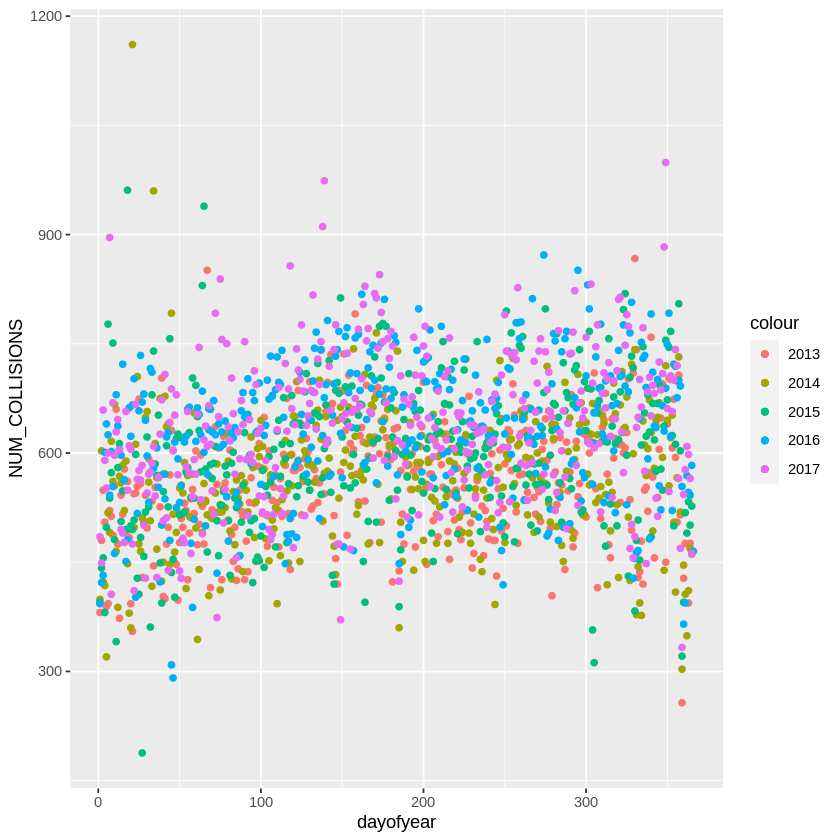

In [1243]:
ggplot() +
  geom_point(data = coll2013a, aes(dayofyear, NUM_COLLISIONS, color="2013")) +
  geom_point(data = coll2014a, aes(dayofyear, NUM_COLLISIONS, color="2014")) +
  geom_point(data = coll2015a, aes(dayofyear, NUM_COLLISIONS, color="2015")) +
  geom_point(data = coll2016a, aes(dayofyear, NUM_COLLISIONS, color="2016")) +
  geom_point(data = coll2017a, aes(dayofyear, NUM_COLLISIONS, color="2017"))

The seasonality is more clearly represented with peaks at the beginning and end of the years and around the end of June (midyear). There is a trough around September with a narrower range of values here and March – May. The higher variability during the winter months can also be seen.  


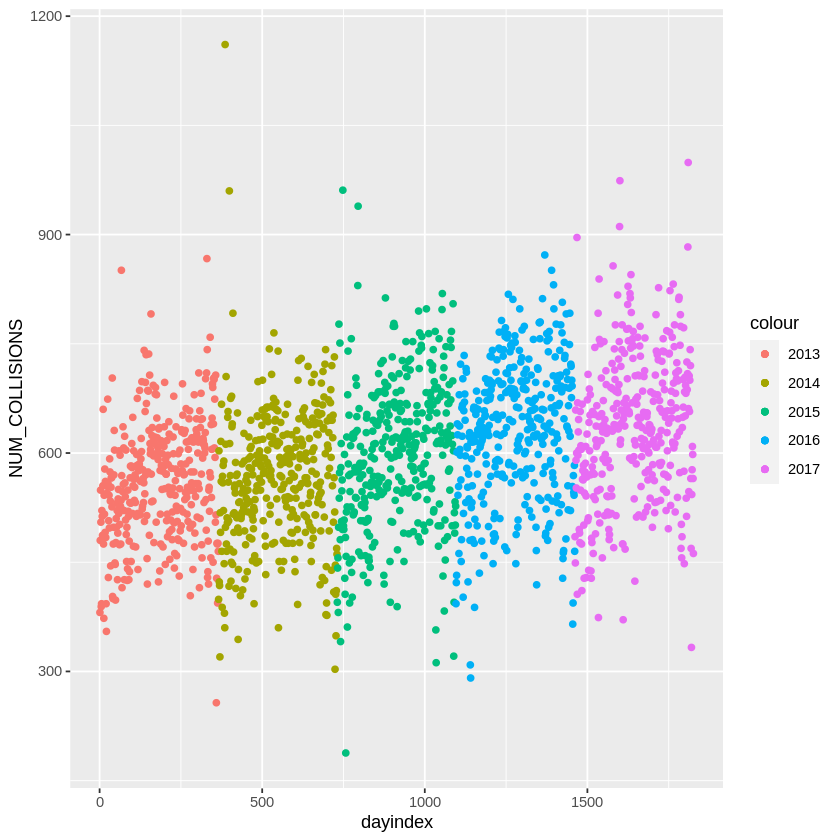

In [1244]:
ggplot() +
  geom_point(data = coll2013a, aes(dayindex, NUM_COLLISIONS, color="2013")) +
  geom_point(data = coll2014a, aes(dayindex, NUM_COLLISIONS, color="2014")) +
  geom_point(data = coll2015a, aes(dayindex, NUM_COLLISIONS, color="2015")) +
  geom_point(data = coll2016a, aes(dayindex, NUM_COLLISIONS, color="2016")) +
  geom_point(data = coll2017a, aes(dayindex, NUM_COLLISIONS, color="2017"))

In the plot above with the years side by side we can see a large number of outliers in multiple years. We shall execute an initial pruning by limiting the range of the collisions from 375 and 850.  


In [1245]:
coll2013b <- coll2013a[which(coll2013a$NUM_COLLISIONS >= 375), ]
coll2014b <- coll2014a[which(coll2014a$NUM_COLLISIONS >= 375), ]
coll2015b <- coll2015a[which(coll2015a$NUM_COLLISIONS >= 375), ]
coll2016b <- coll2016a[which(coll2016a$NUM_COLLISIONS >= 375), ]
coll2017b <- coll2017a[which(coll2017a$NUM_COLLISIONS >= 375), ]

coll2013c <- coll2013b[which(coll2013b$NUM_COLLISIONS <= 850), ]
coll2014c <- coll2014b[which(coll2014b$NUM_COLLISIONS <= 850), ]
coll2015c <- coll2015b[which(coll2015b$NUM_COLLISIONS <= 850), ]
coll2016c <- coll2016b[which(coll2016b$NUM_COLLISIONS <= 850), ]
coll2017c <- coll2017b[which(coll2017b$NUM_COLLISIONS <= 850), ]

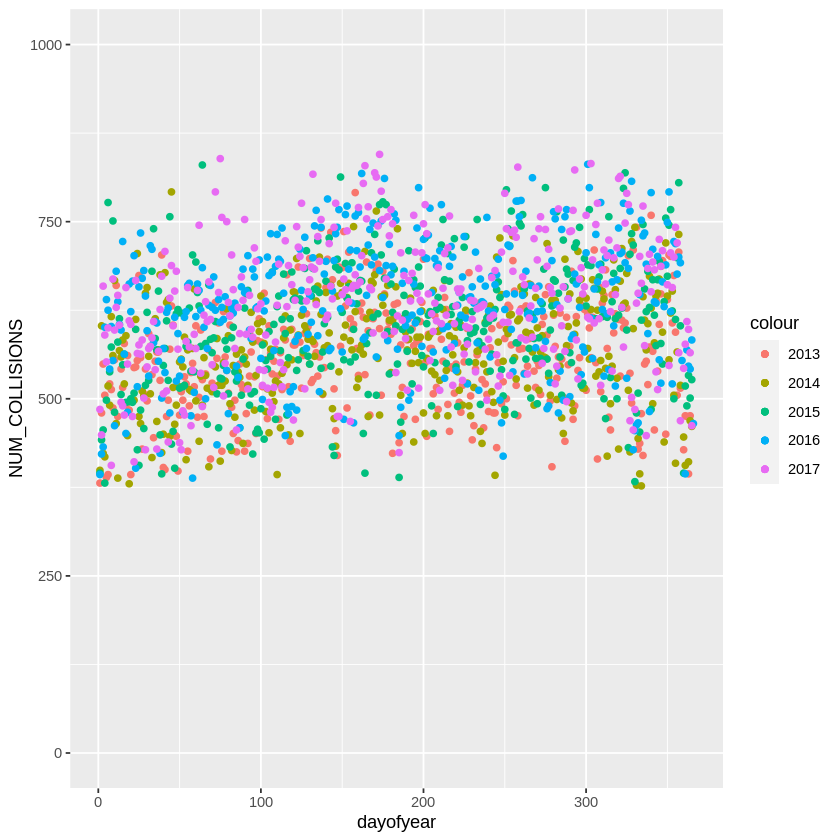

In [1246]:
plot1 <- ggplot() +
  geom_point(data = coll2013c, aes(dayofyear, NUM_COLLISIONS, color="2013")) +
  geom_point(data = coll2014c, aes(dayofyear, NUM_COLLISIONS, color="2014")) +
  geom_point(data = coll2015c, aes(dayofyear, NUM_COLLISIONS, color="2015")) +
  geom_point(data = coll2016c, aes(dayofyear, NUM_COLLISIONS, color="2016")) +
  geom_point(data = coll2017c, aes(dayofyear, NUM_COLLISIONS, color="2017"))

plot1 + ylim(0,1000)

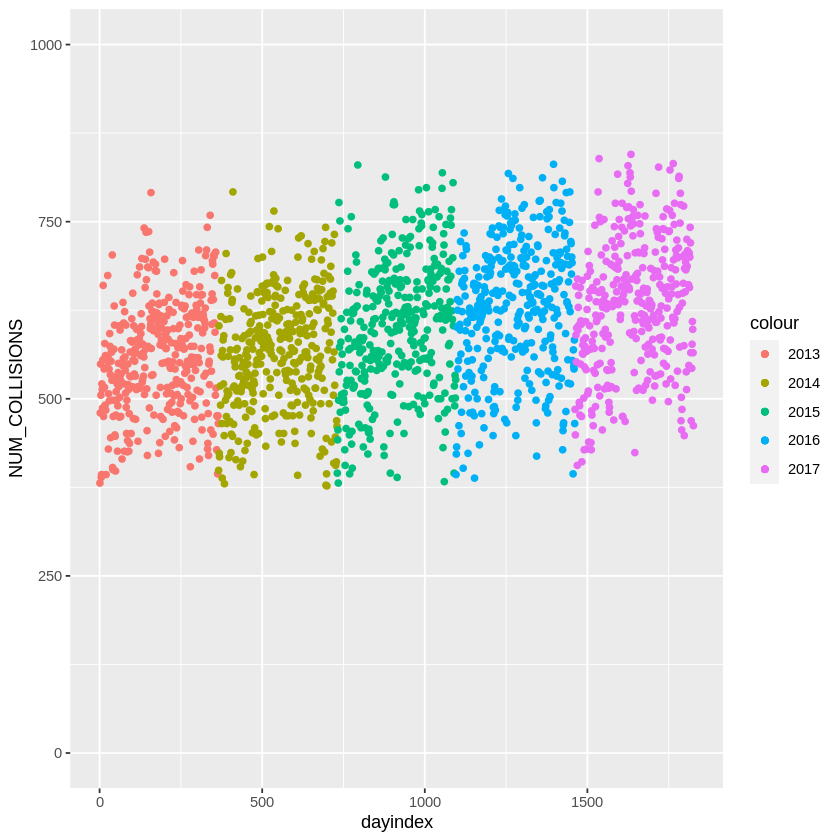

In [1247]:
plot2 <- ggplot() +
  geom_point(data = coll2013c, aes(dayindex, NUM_COLLISIONS, color="2013")) +
  geom_point(data = coll2014c, aes(dayindex, NUM_COLLISIONS, color="2014")) +
  geom_point(data = coll2015c, aes(dayindex, NUM_COLLISIONS, color="2015")) +
  geom_point(data = coll2016c, aes(dayindex, NUM_COLLISIONS, color="2016")) +
  geom_point(data = coll2017c, aes(dayindex, NUM_COLLISIONS, color="2017"))

  plot2 + ylim(0,1000)

Many of the outliers have been removed and the plots look far tidier, but we still have some additional points that could be removed from particular years. We shall now prune the data again as per below.  


In [1248]:
coll2015d <- coll2015c[which(coll2015c$NUM_COLLISIONS >= 400), ]
coll2016d <- coll2016c[which(coll2016c$NUM_COLLISIONS >= 425), ]
coll2017d <- coll2017c[which(coll2017c$NUM_COLLISIONS >= 435), ]

coll2013e <- coll2013c[which(coll2013c$NUM_COLLISIONS <= 740), ]
coll2014e <- coll2014c[which(coll2014c$NUM_COLLISIONS <= 750), ]
coll2015e <- coll2015d[which(coll2015d$NUM_COLLISIONS <= 810), ]
coll2016e <- coll2016d[which(coll2016d$NUM_COLLISIONS <= 810), ]
coll2017e <- coll2017d[which(coll2017d$NUM_COLLISIONS <= 825), ]

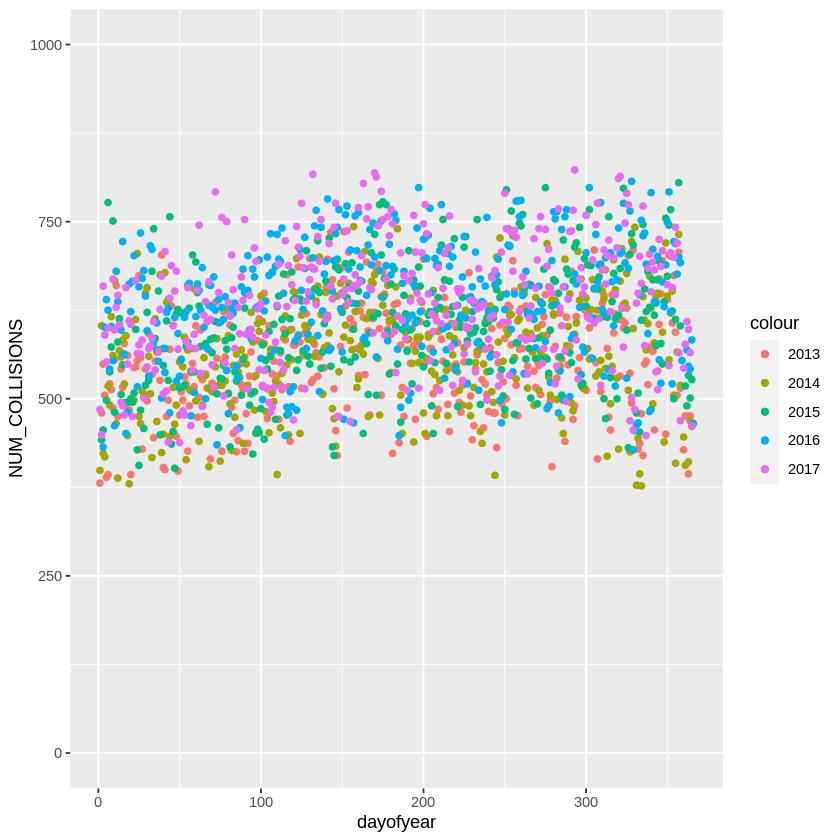

In [1249]:
plot3 <- ggplot() +
  geom_point(data = coll2013e, aes(dayofyear, NUM_COLLISIONS, color="2013")) +
  geom_point(data = coll2014e, aes(dayofyear, NUM_COLLISIONS, color="2014")) +
  geom_point(data = coll2015e, aes(dayofyear, NUM_COLLISIONS, color="2015")) +
  geom_point(data = coll2016e, aes(dayofyear, NUM_COLLISIONS, color="2016")) +
  geom_point(data = coll2017e, aes(dayofyear, NUM_COLLISIONS, color="2017"))

plot3 + ylim(0,1000)

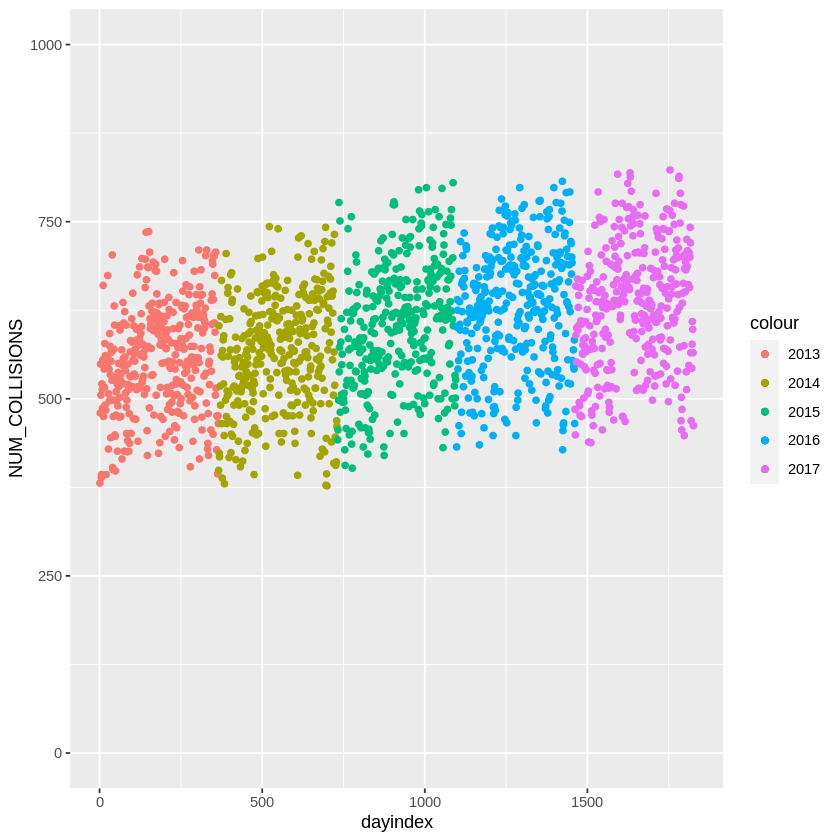

In [1250]:
plot4 <- ggplot() +
  geom_point(data = coll2013e, aes(dayindex, NUM_COLLISIONS, color="2013")) +
  geom_point(data = coll2014e, aes(dayindex, NUM_COLLISIONS, color="2014")) +
  geom_point(data = coll2015e, aes(dayindex, NUM_COLLISIONS, color="2015")) +
  geom_point(data = coll2016e, aes(dayindex, NUM_COLLISIONS, color="2016")) +
  geom_point(data = coll2017e, aes(dayindex, NUM_COLLISIONS, color="2017"))

  plot4 + ylim(0,1000)

In [1251]:
cor(coll2013e$day, coll2013e$NUM_COLLISIONS)
cor(coll2014e$day, coll2014e$NUM_COLLISIONS)
cor(coll2015e$day, coll2015e$NUM_COLLISIONS)
cor(coll2016e$day, coll2016e$NUM_COLLISIONS)
cor(coll2017e$day, coll2017e$NUM_COLLISIONS)

[1] -0.3094104

[1] -0.3320593

[1] -0.3122407

[1] -0.3875125

[1] -0.3858426

In [1252]:
cor(coll2013e$temp, coll2013e$NUM_COLLISIONS)
cor(coll2014e$temp, coll2014e$NUM_COLLISIONS)
cor(coll2015e$temp, coll2015e$NUM_COLLISIONS)
cor(coll2016e$temp, coll2016e$NUM_COLLISIONS)
cor(coll2017e$temp, coll2017e$NUM_COLLISIONS)

[1] 0.1998237

[1] 0.2224649

[1] 0.2879806

[1] 0.1705627

[1] 0.236272

In [1253]:
cor(coll2013e$dewp, coll2013e$NUM_COLLISIONS)
cor(coll2014e$dewp, coll2014e$NUM_COLLISIONS)
cor(coll2015e$dewp, coll2015e$NUM_COLLISIONS)
cor(coll2016e$dewp, coll2016e$NUM_COLLISIONS)
cor(coll2017e$dewp, coll2017e$NUM_COLLISIONS)

[1] 0.1837217

[1] 0.2087753

[1] 0.2798569

[1] 0.1559632

[1] 0.2123771

After the 2nd pruning, the plots are looking even better, but the correlation coefficients reveal a possibly issue. In the weekday figures we can see some good improvement, but this is not the case for temperature and dew point. 2016 has been heavily impacted by this and has gone from being the year with the strongest linear relationship to one of, if not the, weakest. Taking a look back at the plot of all the years together, it appears the pruning of the outliers might have been a little overzealous, especially in 2016 and 2017 where the seasonality pattern for the winter months has been flattened out. We will re-attempt a more conservative approach.  


In [1254]:
# TEST RE-PRUNE
coll2015dx <- coll2015c[which(coll2015c$NUM_COLLISIONS >= 400), ]

coll2013ex <- coll2013c[which(coll2013c$NUM_COLLISIONS <= 750), ]
coll2014ex <- coll2014c[which(coll2014c$NUM_COLLISIONS <= 760), ]
coll2015ex <- coll2015dx[which(coll2015dx$NUM_COLLISIONS <= 775), ]
coll2016ex <- coll2016c
coll2017ex <- coll2017c

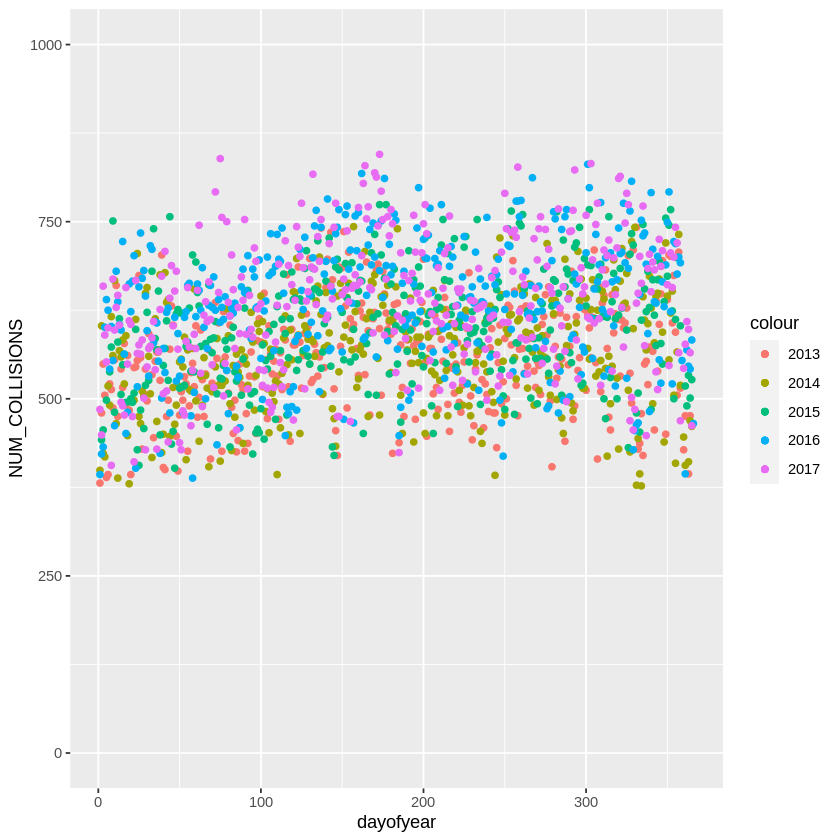

In [1255]:
plot5 <- ggplot() +
  geom_point(data = coll2013ex, aes(dayofyear, NUM_COLLISIONS, color="2013")) +
  geom_point(data = coll2014ex, aes(dayofyear, NUM_COLLISIONS, color="2014")) +
  geom_point(data = coll2015ex, aes(dayofyear, NUM_COLLISIONS, color="2015")) +
  geom_point(data = coll2016ex, aes(dayofyear, NUM_COLLISIONS, color="2016")) +
  geom_point(data = coll2017ex, aes(dayofyear, NUM_COLLISIONS, color="2017"))

plot5 + ylim(0,1000)

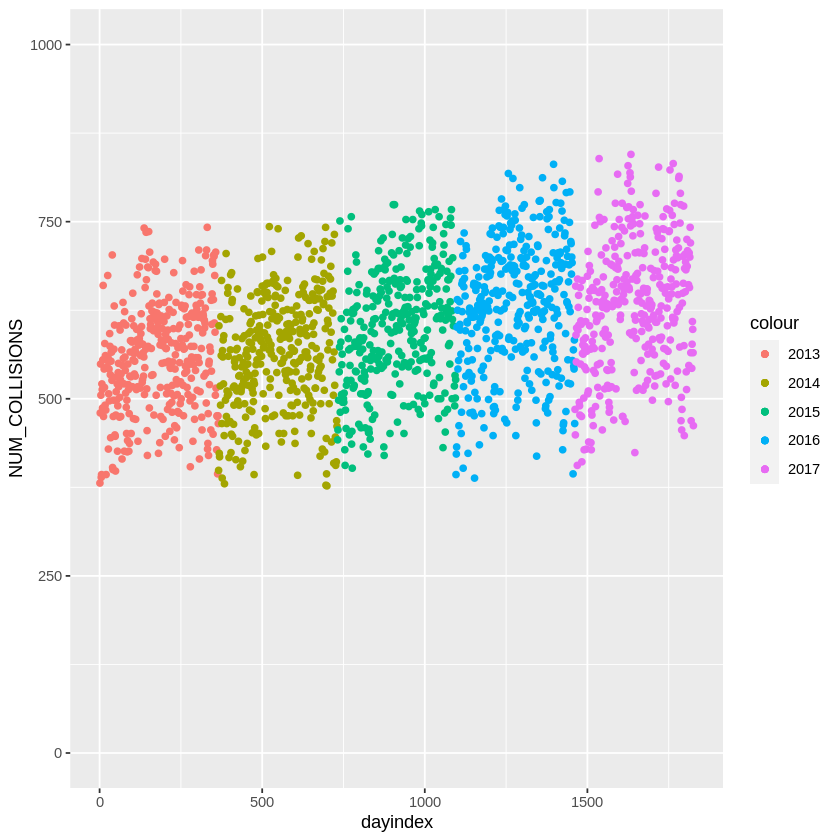

In [1256]:
plot6 <- ggplot() +
  geom_point(data = coll2013ex, aes(dayindex, NUM_COLLISIONS, color="2013")) +
  geom_point(data = coll2014ex, aes(dayindex, NUM_COLLISIONS, color="2014")) +
  geom_point(data = coll2015ex, aes(dayindex, NUM_COLLISIONS, color="2015")) +
  geom_point(data = coll2016ex, aes(dayindex, NUM_COLLISIONS, color="2016")) +
  geom_point(data = coll2017ex, aes(dayindex, NUM_COLLISIONS, color="2017"))

  plot6 + ylim(0,1000)

In [1257]:
cor(coll2013ex$day, coll2013ex$NUM_COLLISIONS)
cor(coll2014ex$day, coll2014ex$NUM_COLLISIONS)
cor(coll2015ex$day, coll2015ex$NUM_COLLISIONS)
cor(coll2016ex$day, coll2016ex$NUM_COLLISIONS)
cor(coll2017ex$day, coll2017ex$NUM_COLLISIONS)

[1] -0.3040603

[1] -0.3320593

[1] -0.312761

[1] -0.3545784

[1] -0.3821322

In [1258]:
cor(coll2013ex$temp, coll2013ex$NUM_COLLISIONS)
cor(coll2014ex$temp, coll2014ex$NUM_COLLISIONS)
cor(coll2015ex$temp, coll2015ex$NUM_COLLISIONS)
cor(coll2016ex$temp, coll2016ex$NUM_COLLISIONS)
cor(coll2017ex$temp, coll2017ex$NUM_COLLISIONS)

[1] 0.2006396

[1] 0.2224649

[1] 0.2984039

[1] 0.210545

[1] 0.2523307

In [1259]:
cor(coll2013ex$dewp, coll2013ex$NUM_COLLISIONS)
cor(coll2014ex$dewp, coll2014ex$NUM_COLLISIONS)
cor(coll2015ex$dewp, coll2015ex$NUM_COLLISIONS)
cor(coll2016ex$dewp, coll2016ex$NUM_COLLISIONS)
cor(coll2017ex$dewp, coll2017ex$NUM_COLLISIONS)

[1] 0.1839682

[1] 0.2087753

[1] 0.2879833

[1] 0.195462

[1] 0.2271278

Even though the superimposed years now show an increased variability, the side-by-side plot shows the seasonality pattern is now more uniform across the years. This approach has benefited the weather variables although the weekday correlation shows a more modest improvement. We shall keep both sets of data for the regression models and see how they fare.  


## Normalization

As the years contain the same pattern but show a gradual increase, we shall now normalize the data to mitigate this increase and change the number of collisions across the years to a common scale.  

Below we have created a normalization function which we have initially tested on one of the years. As per the summaries before and after, we can see that the range in the values of collisions has changed from 381 – 736 to 0 – 1. This has been applied to all the years for both datasets and confirmed via their summaries of number of collisions.  

Looking at the plots for both datasets again, we can now see the gradual increase has been adjusted for and the years are now in line with the season patterns unaffected.  





In [1260]:
nrow(coll2013e)
nrow(coll2014e)
nrow(coll2015e)
nrow(coll2016e)
nrow(coll2017e)

[1] 356

[1] 355

[1] 347

[1] 350

[1] 345

In [1261]:
nrow(coll2013ex)
nrow(coll2014ex)
nrow(coll2015ex)
nrow(coll2016ex)
nrow(coll2017ex)

[1] 358

[1] 355

[1] 341

[1] 361

[1] 356

In [1262]:
head(coll2013e)

,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
1,1,1,2,2013,1,1,2013-01-01,38.0,25.6,1008.8,10.0,15.0,21.0,28.0,41.0,33.1,0.00,999.9,0,381
2,2,2,3,2013,1,2,2013-01-02,27.5,12.1,1013.4,10.0,12.4,15.9,25.1,33.1,21.9,0.00,999.9,0,480
3,3,3,4,2013,1,3,2013-01-03,21.8,7.8,1018.1,10.0,9.8,18.1,24.1,28.9,16.0,0.00,999.9,0,549
4,4,4,5,2013,1,4,2013-01-04,32.2,21.1,1015.2,10.0,11.3,22.0,29.9,41.0,24.1,0.00,999.9,0,505
5,5,5,6,2013,1,5,2013-01-05,37.3,24.5,1017.3,10.0,13.2,20.0,28.0,42.1,30.9,0.00,999.9,0,389
6,6,6,7,2013,1,6,2013-01-06,35.7,31.3,1019.7,9.8,5.9,15.0,20.0,44.1,23.0,0.01,999.9,0,393


In [1263]:
summary(coll2013e$NUM_COLLISIONS)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  381.0   505.0   556.5   556.2   609.5   736.0 

In [1264]:
norm1 <- function(x) {
  rng <- range(x, na.rm = TRUE)
  (x - rng[1]) / (rng[2] - rng[1])
}

In [1265]:
coll2013f <- mutate(coll2013e, NUM_COLLISIONS = norm1(NUM_COLLISIONS))
head(coll2013f)

,dayindex,dayofyear,day,year,mo,da,collision_date,temp,dewp,slp,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
1,1,1,2,2013,1,1,2013-01-01,38.0,25.6,1008.8,10.0,15.0,21.0,28.0,41.0,33.1,0.00,999.9,0,0.00000000
2,2,2,3,2013,1,2,2013-01-02,27.5,12.1,1013.4,10.0,12.4,15.9,25.1,33.1,21.9,0.00,999.9,0,0.27887324
3,3,3,4,2013,1,3,2013-01-03,21.8,7.8,1018.1,10.0,9.8,18.1,24.1,28.9,16.0,0.00,999.9,0,0.47323944
4,4,4,5,2013,1,4,2013-01-04,32.2,21.1,1015.2,10.0,11.3,22.0,29.9,41.0,24.1,0.00,999.9,0,0.34929577
5,5,5,6,2013,1,5,2013-01-05,37.3,24.5,1017.3,10.0,13.2,20.0,28.0,42.1,30.9,0.00,999.9,0,0.02253521
6,6,6,7,2013,1,6,2013-01-06,35.7,31.3,1019.7,9.8,5.9,15.0,20.0,44.1,23.0,0.01,999.9,0,0.03380282


In [1266]:
summary(coll2013f$NUM_COLLISIONS)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.3493  0.4944  0.4934  0.6437  1.0000 

In [1267]:
coll2014f <- mutate(coll2014e, NUM_COLLISIONS = norm1(NUM_COLLISIONS))
coll2015f <- mutate(coll2015e, NUM_COLLISIONS = norm1(NUM_COLLISIONS))
coll2016f <- mutate(coll2016e, NUM_COLLISIONS = norm1(NUM_COLLISIONS))
coll2017f <- mutate(coll2017e, NUM_COLLISIONS = norm1(NUM_COLLISIONS))

coll2013fx <- mutate(coll2013ex, NUM_COLLISIONS = norm1(NUM_COLLISIONS))
coll2014fx <- mutate(coll2014ex, NUM_COLLISIONS = norm1(NUM_COLLISIONS))
coll2015fx <- mutate(coll2015ex, NUM_COLLISIONS = norm1(NUM_COLLISIONS))
coll2016fx <- mutate(coll2016ex, NUM_COLLISIONS = norm1(NUM_COLLISIONS))
coll2017fx <- mutate(coll2017ex, NUM_COLLISIONS = norm1(NUM_COLLISIONS))

In [1268]:
summary(coll2014f$NUM_COLLISIONS)
summary(coll2015f$NUM_COLLISIONS)
summary(coll2016f$NUM_COLLISIONS)
summary(coll2017f$NUM_COLLISIONS)

summary(coll2013fx$NUM_COLLISIONS)
summary(coll2014fx$NUM_COLLISIONS)
summary(coll2015fx$NUM_COLLISIONS)
summary(coll2016fx$NUM_COLLISIONS)
summary(coll2017fx$NUM_COLLISIONS)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.3689  0.5219  0.5117  0.6694  1.0000 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.3412  0.5062  0.4950  0.6551  1.0000 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.3773  0.5488  0.5370  0.7045  1.0000 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.3455  0.5117  0.5014  0.6623  1.0000 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.3442  0.4889  0.4881  0.6392  1.0000 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.3689  0.5219  0.5117  0.6694  1.0000 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.3683  0.5403  0.5273  0.6909  1.0000 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.4086  0.5576  0.5445  0.6953  1.0000 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.3736  0.5216  0.5111  0.6572  1.0000 

### Data1

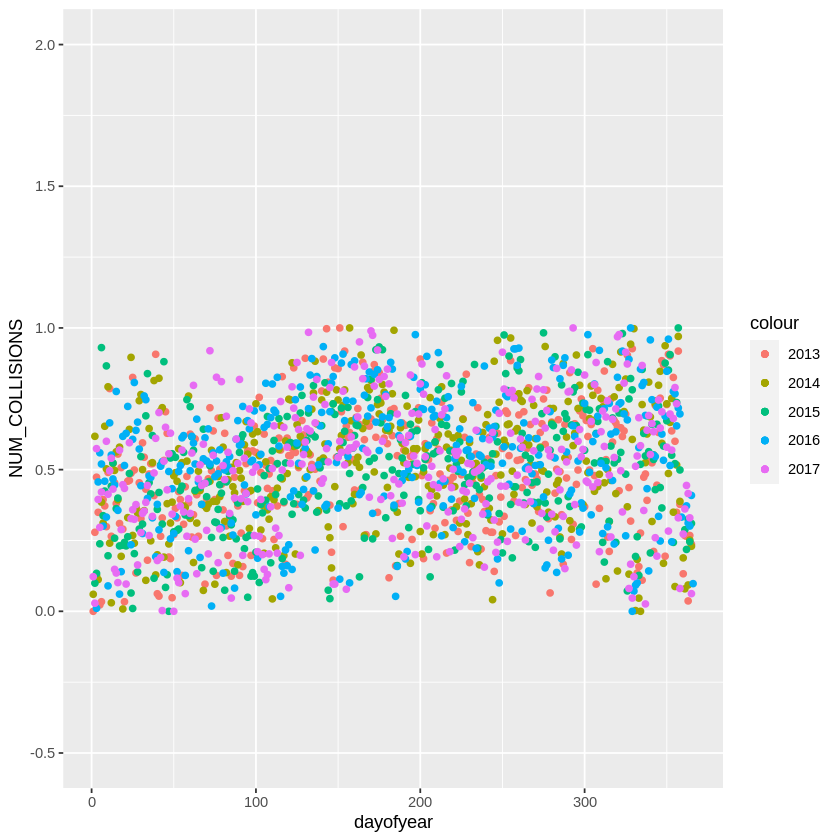

In [1269]:
plot7 <- ggplot() +
  geom_point(data = coll2013f, aes(dayofyear, NUM_COLLISIONS, color="2013")) +
  geom_point(data = coll2014f, aes(dayofyear, NUM_COLLISIONS, color="2014")) +
  geom_point(data = coll2015f, aes(dayofyear, NUM_COLLISIONS, color="2015")) +
  geom_point(data = coll2016f, aes(dayofyear, NUM_COLLISIONS, color="2016")) +
  geom_point(data = coll2017f, aes(dayofyear, NUM_COLLISIONS, color="2017"))

plot7 + ylim(-0.5,2)

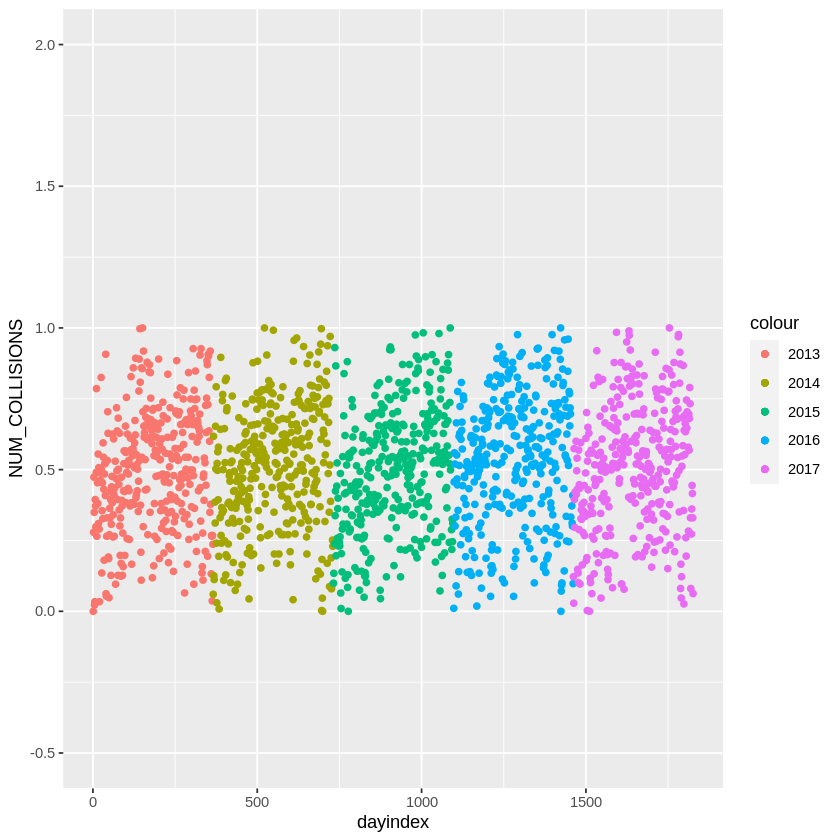

In [1270]:
plot8 <- ggplot() +
  geom_point(data = coll2013f, aes(dayindex, NUM_COLLISIONS, color="2013")) +
  geom_point(data = coll2014f, aes(dayindex, NUM_COLLISIONS, color="2014")) +
  geom_point(data = coll2015f, aes(dayindex, NUM_COLLISIONS, color="2015")) +
  geom_point(data = coll2016f, aes(dayindex, NUM_COLLISIONS, color="2016")) +
  geom_point(data = coll2017f, aes(dayindex, NUM_COLLISIONS, color="2017"))

  plot8 + ylim(-0.5,2)

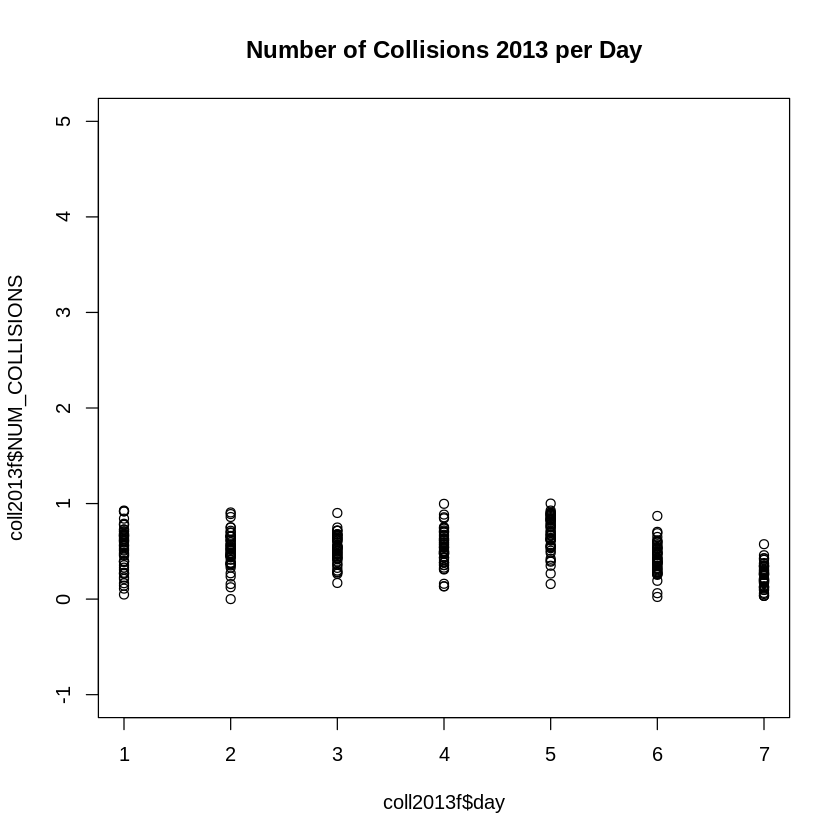

In [1271]:
plot(coll2013f$day, coll2013f$NUM_COLLISIONS, main = "Number of Collisions 2013 per Day", ylim = c(-1, 5))

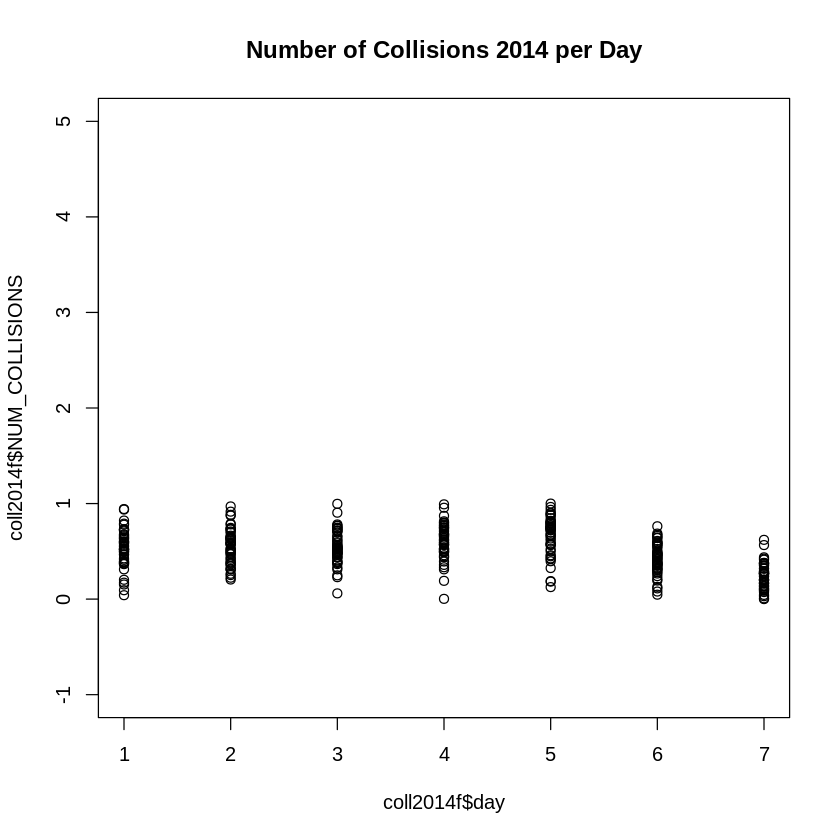

In [1272]:
plot(coll2014f$day, coll2014f$NUM_COLLISIONS, main = "Number of Collisions 2014 per Day", ylim = c(-1, 5))

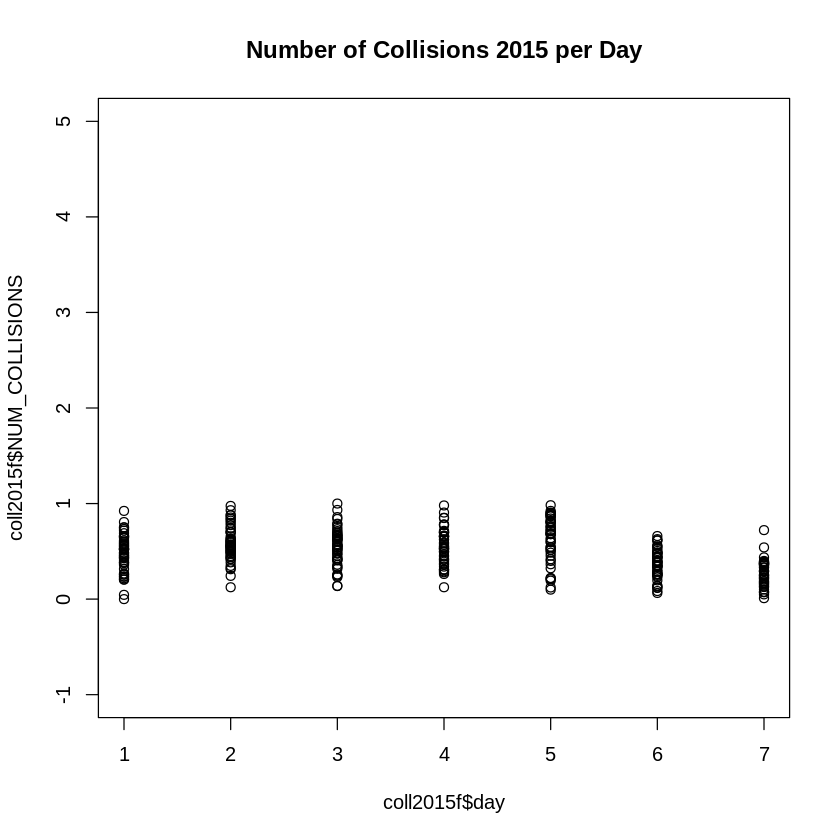

In [1273]:
plot(coll2015f$day, coll2015f$NUM_COLLISIONS, main = "Number of Collisions 2015 per Day", ylim = c(-1, 5))

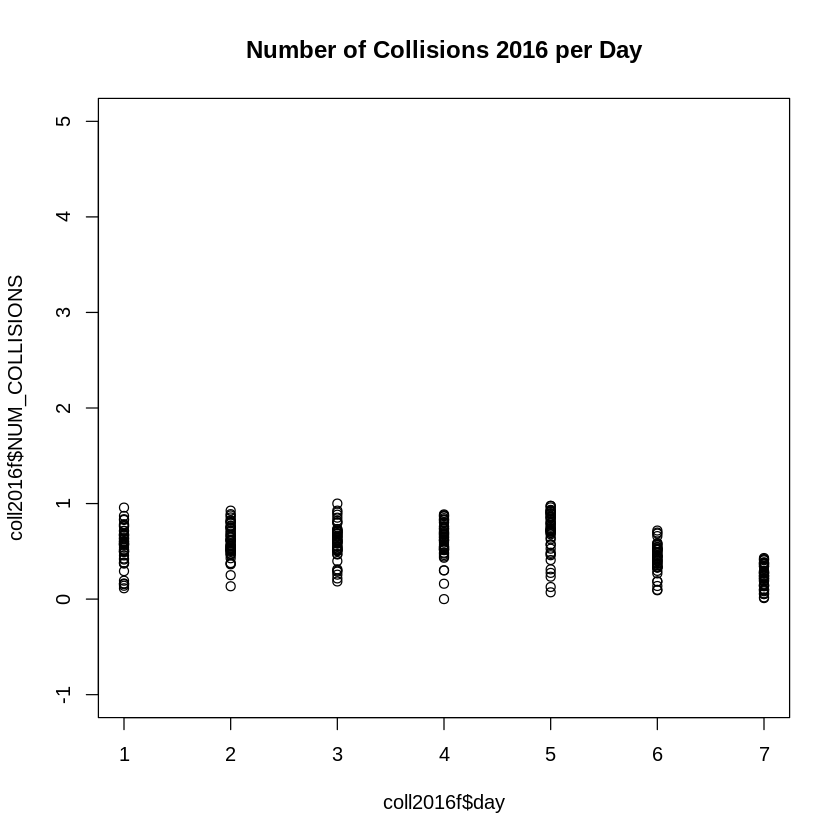

In [1274]:
plot(coll2016f$day, coll2016f$NUM_COLLISIONS, main = "Number of Collisions 2016 per Day", ylim = c(-1, 5))

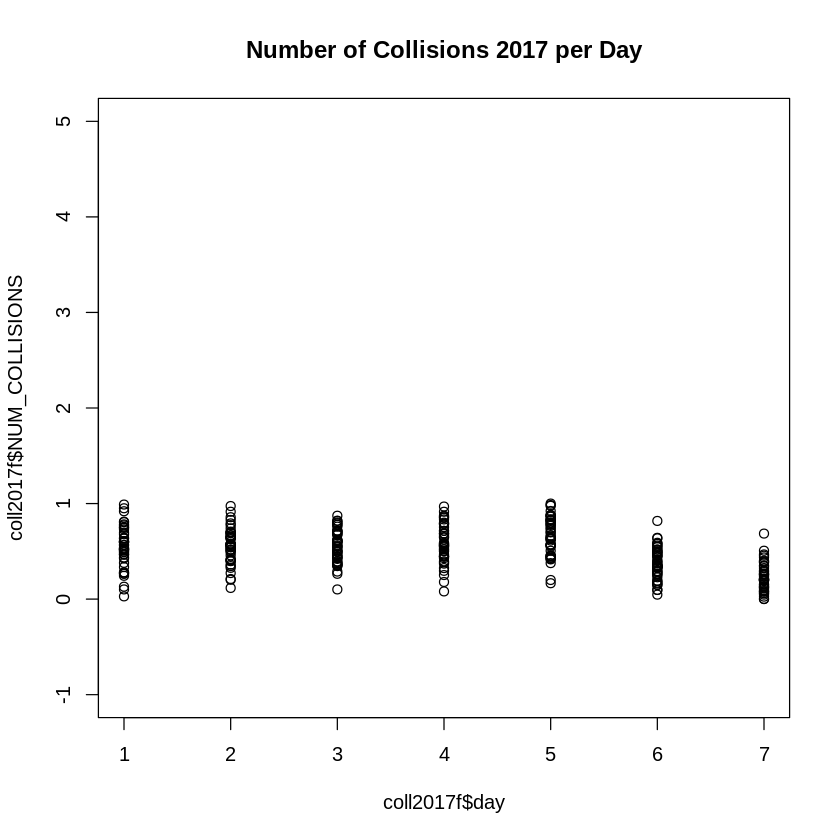

In [1275]:
plot(coll2017f$day, coll2017f$NUM_COLLISIONS, main = "Number of Collisions 2017 per Day", ylim = c(-1, 5))

In [1276]:
cor(coll2013f$day, coll2013f$NUM_COLLISIONS)
cor(coll2014f$day, coll2014f$NUM_COLLISIONS)
cor(coll2015f$day, coll2015f$NUM_COLLISIONS)
cor(coll2016f$day, coll2016f$NUM_COLLISIONS)
cor(coll2017f$day, coll2017f$NUM_COLLISIONS)

[1] -0.3094104

[1] -0.3320593

[1] -0.3122407

[1] -0.3875125

[1] -0.3858426

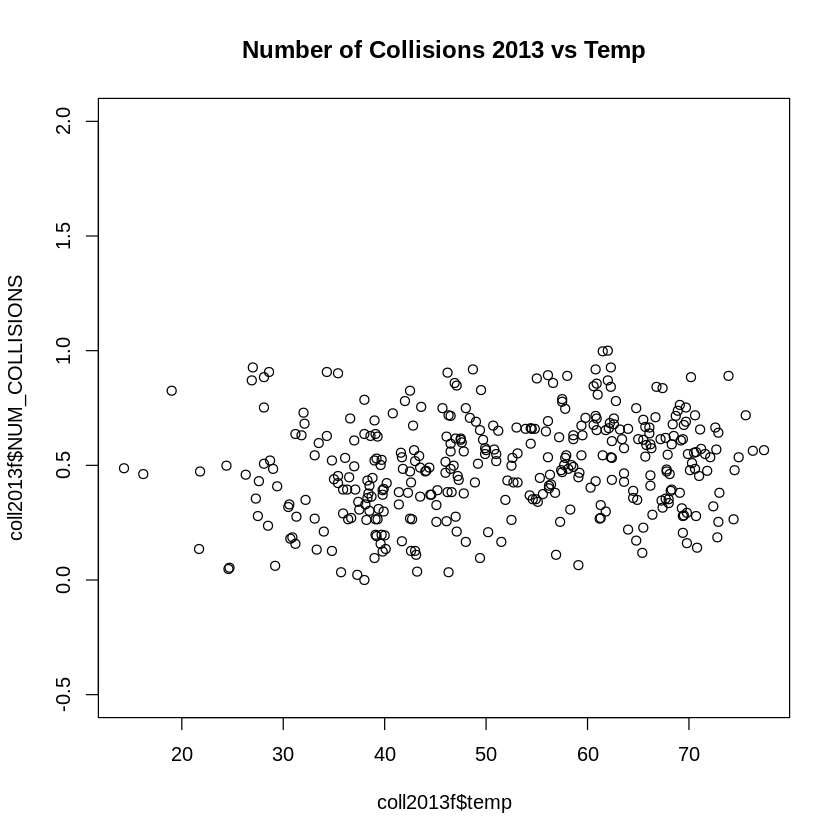

In [1277]:
plot(coll2013f$temp, coll2013f$NUM_COLLISIONS, main = "Number of Collisions 2013 vs Temp", ylim = c(-0.5, 2))

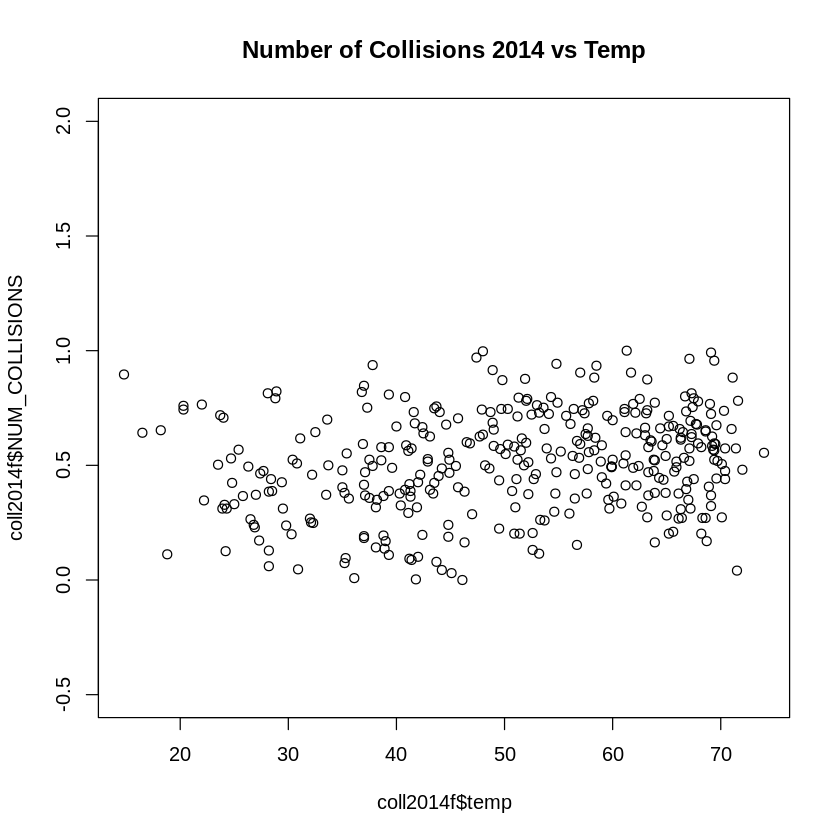

In [1278]:
plot(coll2014f$temp, coll2014f$NUM_COLLISIONS, main = "Number of Collisions 2014 vs Temp", ylim = c(-0.5, 2))

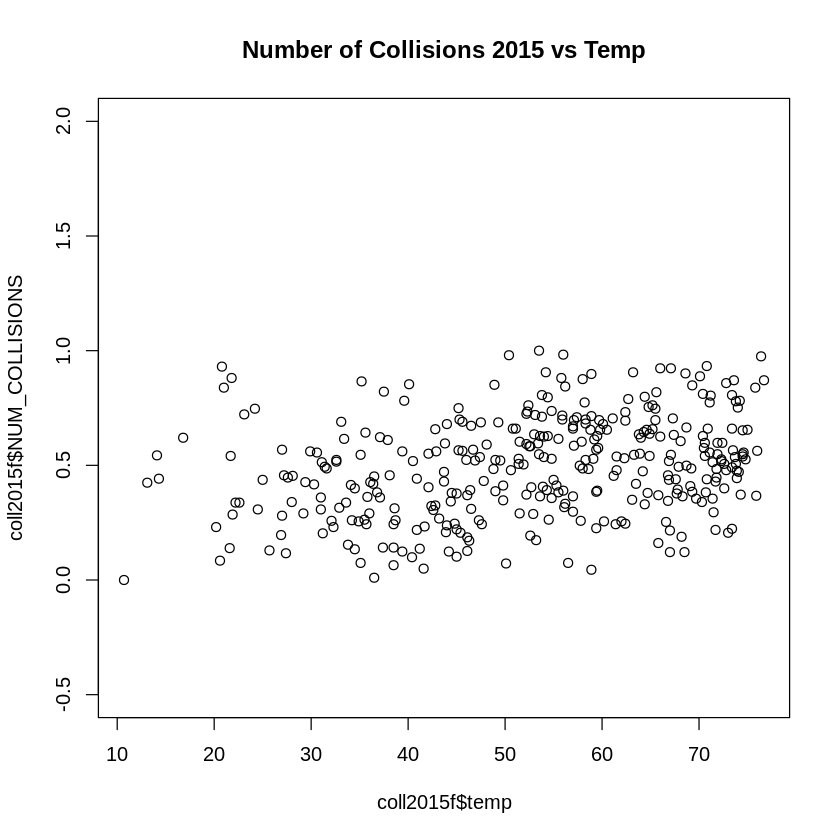

In [1279]:
plot(coll2015f$temp, coll2015f$NUM_COLLISIONS, main = "Number of Collisions 2015 vs Temp", ylim = c(-0.5, 2))

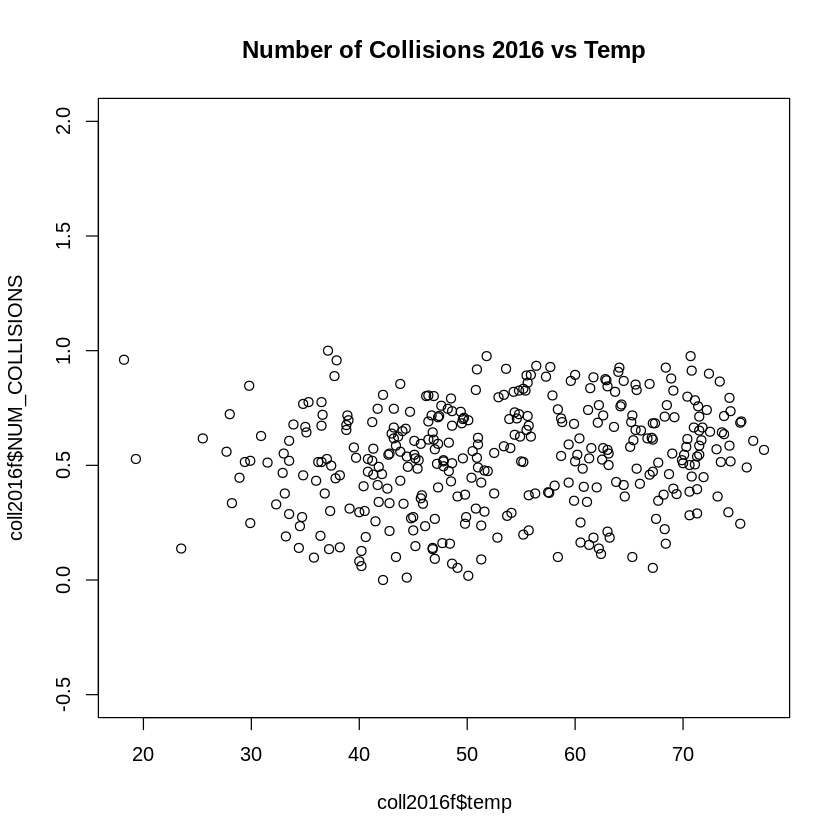

In [1280]:
plot(coll2016f$temp, coll2016f$NUM_COLLISIONS, main = "Number of Collisions 2016 vs Temp", ylim = c(-0.5, 2))

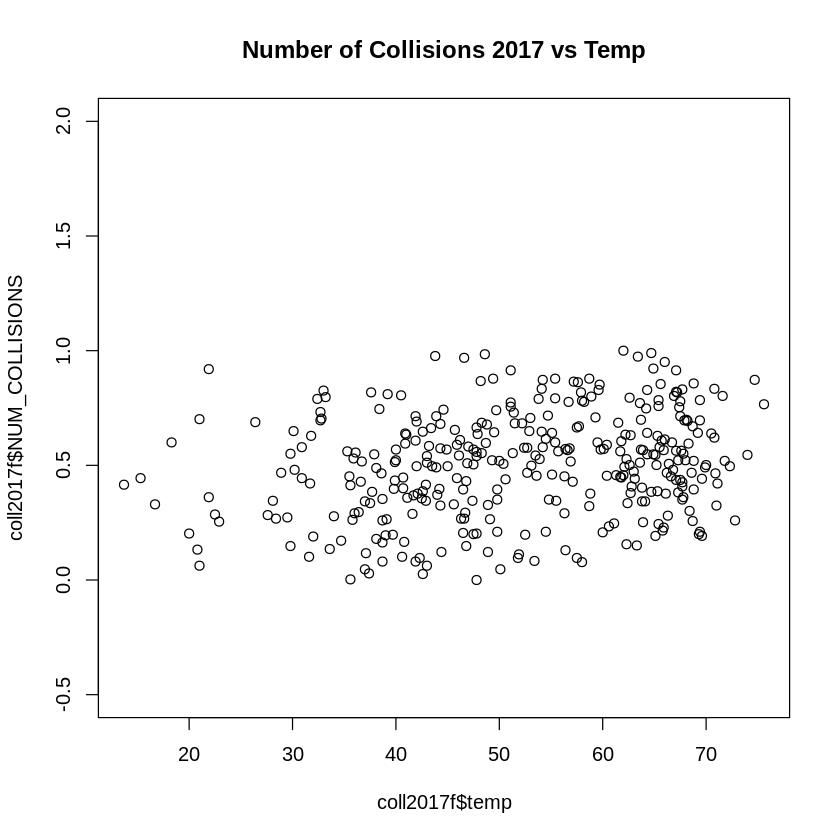

In [1281]:
plot(coll2017f$temp, coll2017f$NUM_COLLISIONS, main = "Number of Collisions 2017 vs Temp", ylim = c(-0.5, 2))

In [1282]:
cor(coll2013f$temp, coll2013f$NUM_COLLISIONS)
cor(coll2014f$temp, coll2014f$NUM_COLLISIONS)
cor(coll2015f$temp, coll2015f$NUM_COLLISIONS)
cor(coll2016f$temp, coll2016f$NUM_COLLISIONS)
cor(coll2017f$temp, coll2017f$NUM_COLLISIONS)

[1] 0.1998237

[1] 0.2224649

[1] 0.2879806

[1] 0.1705627

[1] 0.236272

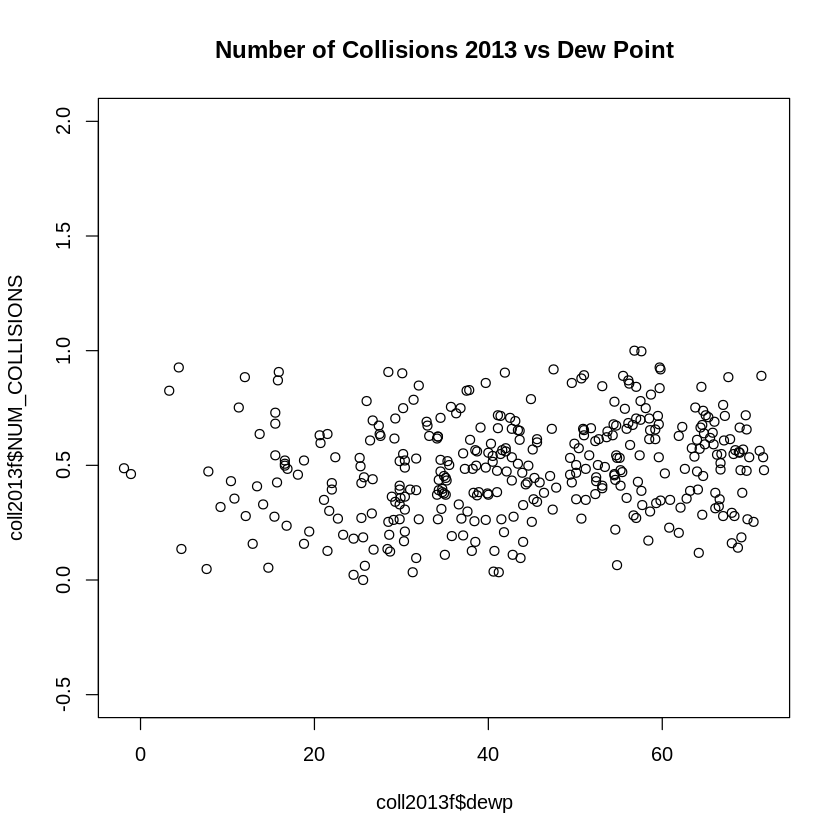

In [1283]:
plot(coll2013f$dewp, coll2013f$NUM_COLLISIONS, main = "Number of Collisions 2013 vs Dew Point", ylim = c(-0.5, 2))

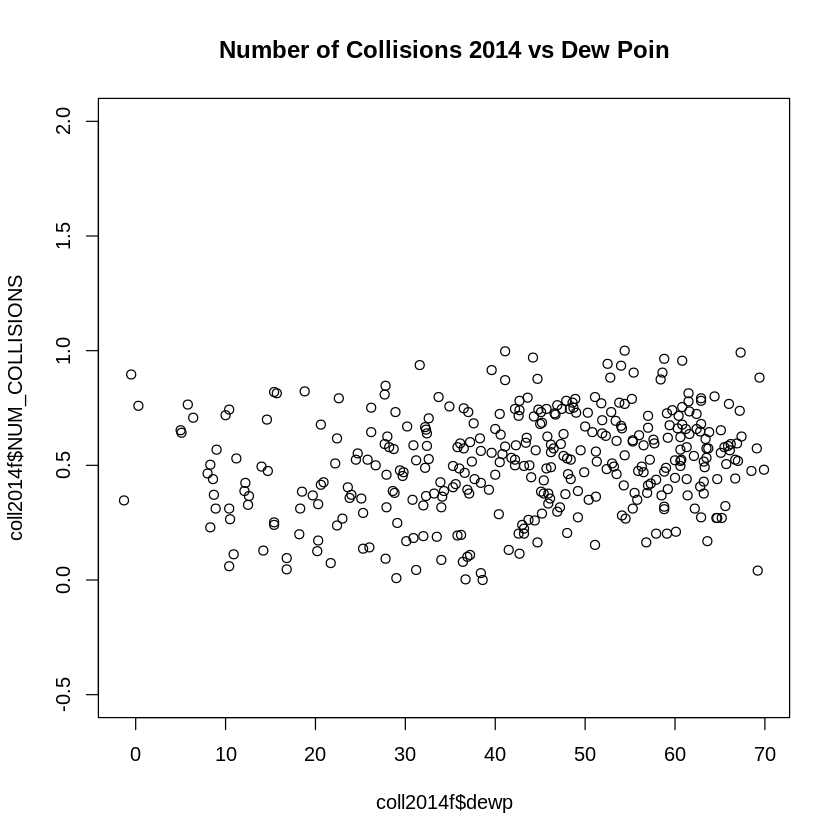

In [1284]:
plot(coll2014f$dewp, coll2014f$NUM_COLLISIONS, main = "Number of Collisions 2014 vs Dew Poin", ylim = c(-0.5, 2))

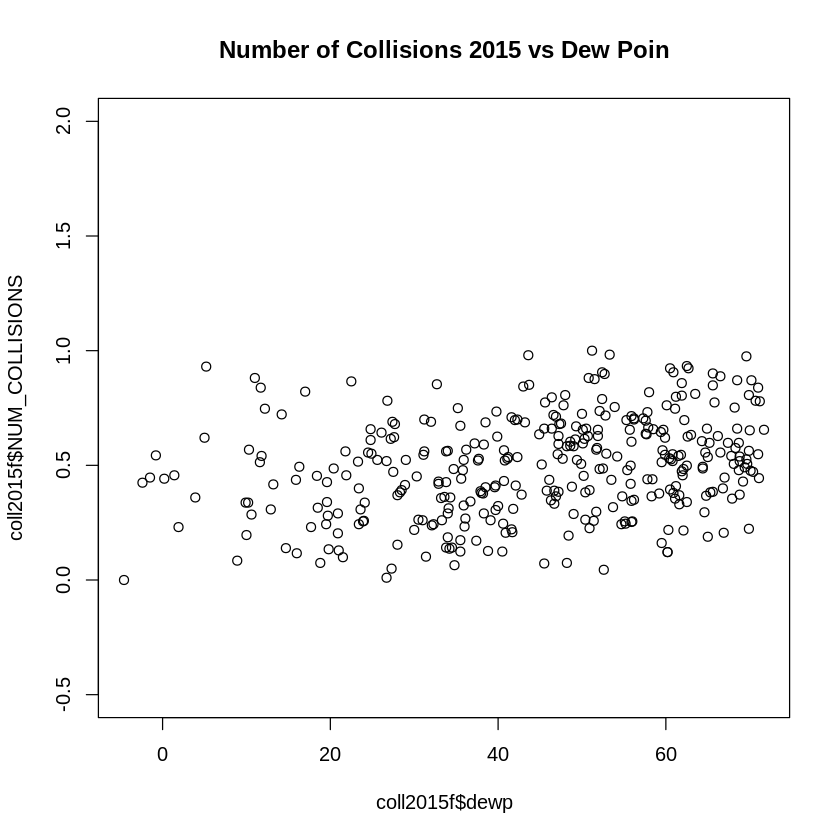

In [1285]:
plot(coll2015f$dewp, coll2015f$NUM_COLLISIONS, main = "Number of Collisions 2015 vs Dew Poin", ylim = c(-0.5, 2))

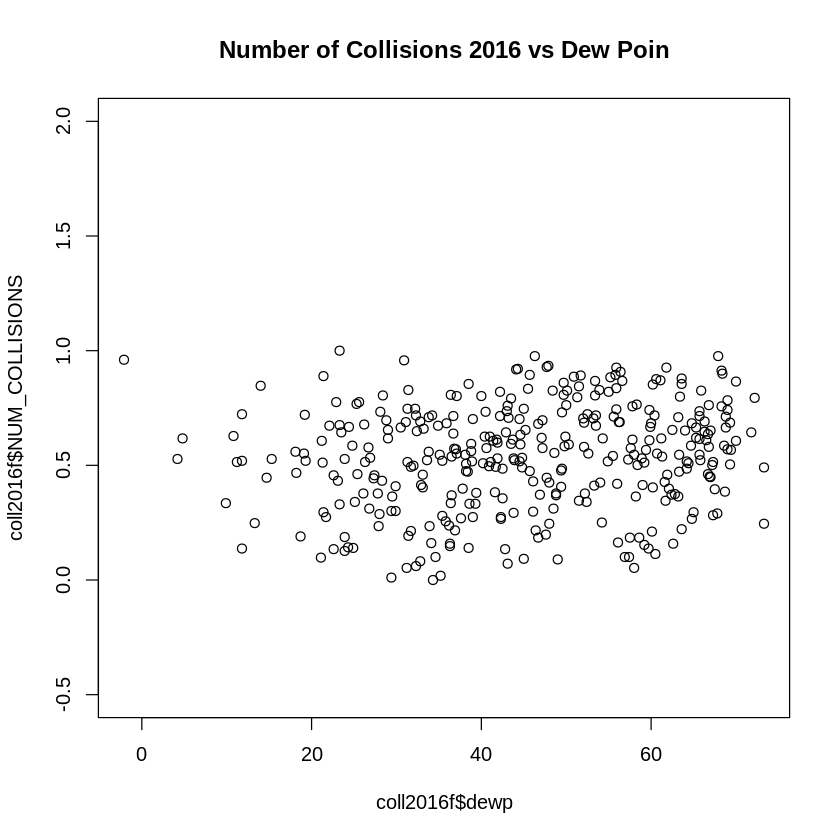

In [1286]:
plot(coll2016f$dewp, coll2016f$NUM_COLLISIONS, main = "Number of Collisions 2016 vs Dew Poin", ylim = c(-0.5, 2))

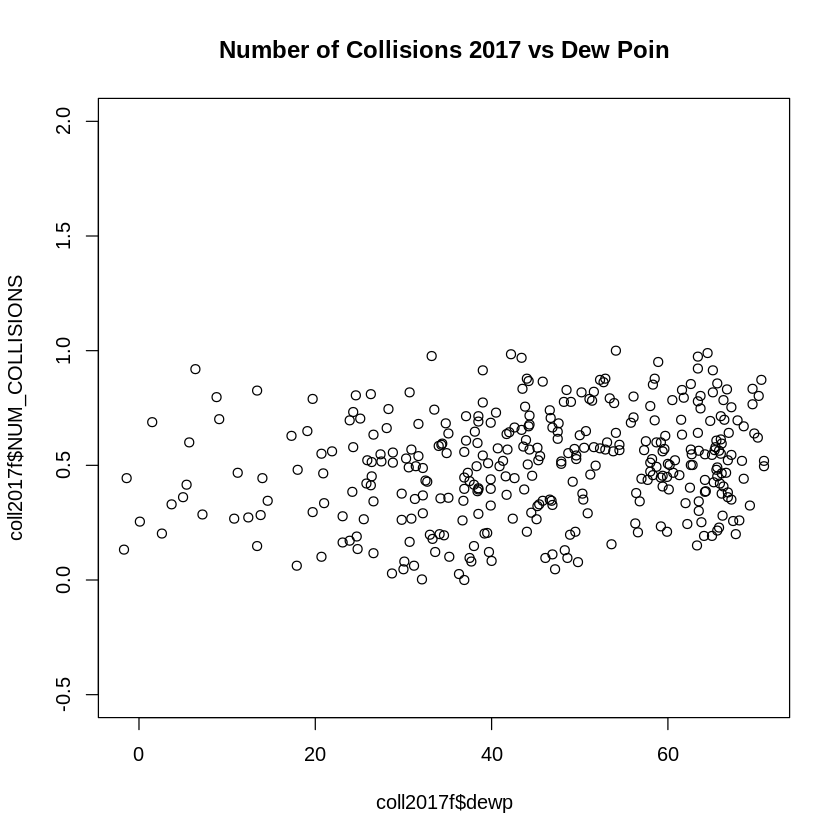

In [1287]:
plot(coll2017f$dewp, coll2017f$NUM_COLLISIONS, main = "Number of Collisions 2017 vs Dew Poin", ylim = c(-0.5, 2))

In [1288]:
cor(coll2013f$dewp, coll2013f$NUM_COLLISIONS)
cor(coll2014f$dewp, coll2014f$NUM_COLLISIONS)
cor(coll2015f$dewp, coll2015f$NUM_COLLISIONS)
cor(coll2016f$dewp, coll2016f$NUM_COLLISIONS)
cor(coll2017f$dewp, coll2017f$NUM_COLLISIONS)

[1] 0.1837217

[1] 0.2087753

[1] 0.2798569

[1] 0.1559632

[1] 0.2123771

###Data2

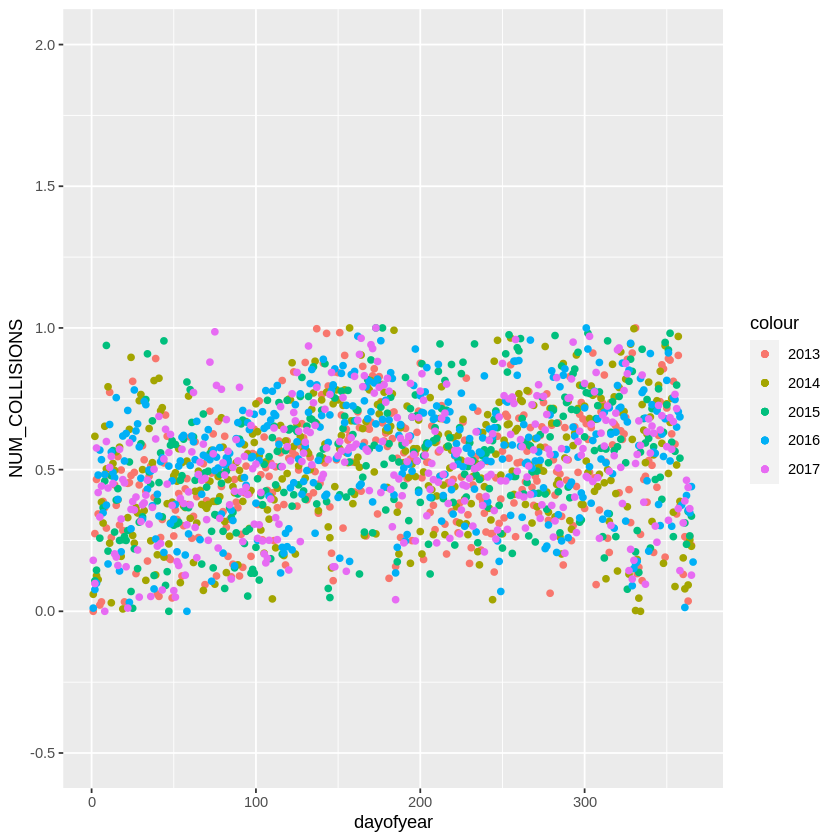

In [1289]:
plot9 <- ggplot() +
  geom_point(data = coll2013fx, aes(dayofyear, NUM_COLLISIONS, color="2013")) +
  geom_point(data = coll2014fx, aes(dayofyear, NUM_COLLISIONS, color="2014")) +
  geom_point(data = coll2015fx, aes(dayofyear, NUM_COLLISIONS, color="2015")) +
  geom_point(data = coll2016fx, aes(dayofyear, NUM_COLLISIONS, color="2016")) +
  geom_point(data = coll2017fx, aes(dayofyear, NUM_COLLISIONS, color="2017"))

plot9 + ylim(-0.5,2)

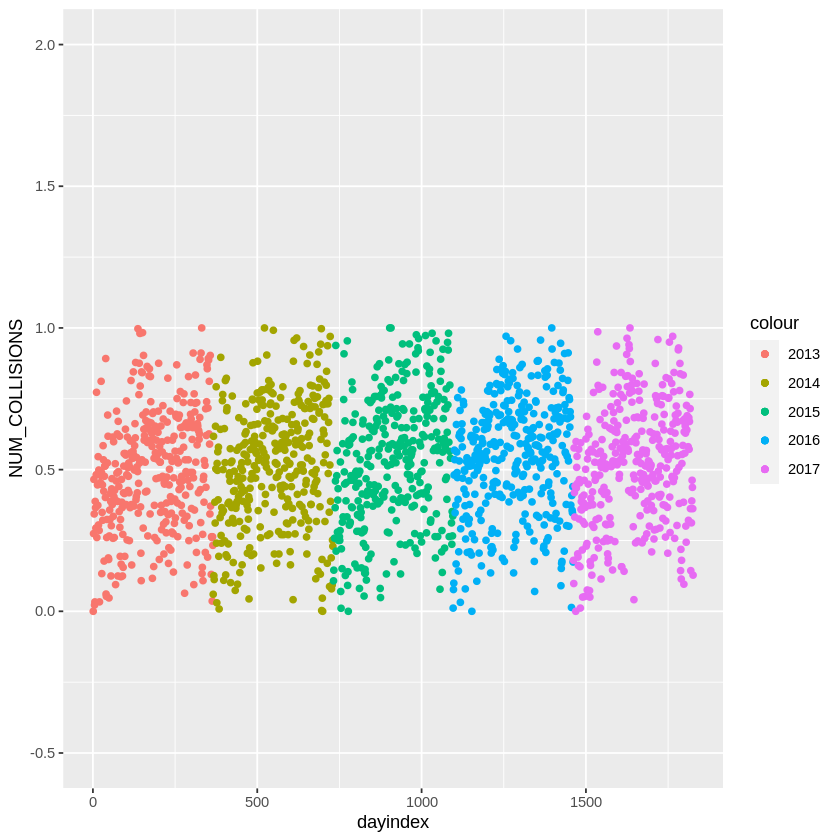

In [1290]:
plot10 <- ggplot() +
  geom_point(data = coll2013fx, aes(dayindex, NUM_COLLISIONS, color="2013")) +
  geom_point(data = coll2014fx, aes(dayindex, NUM_COLLISIONS, color="2014")) +
  geom_point(data = coll2015fx, aes(dayindex, NUM_COLLISIONS, color="2015")) +
  geom_point(data = coll2016fx, aes(dayindex, NUM_COLLISIONS, color="2016")) +
  geom_point(data = coll2017fx, aes(dayindex, NUM_COLLISIONS, color="2017"))

  plot10 + ylim(-0.5,2)

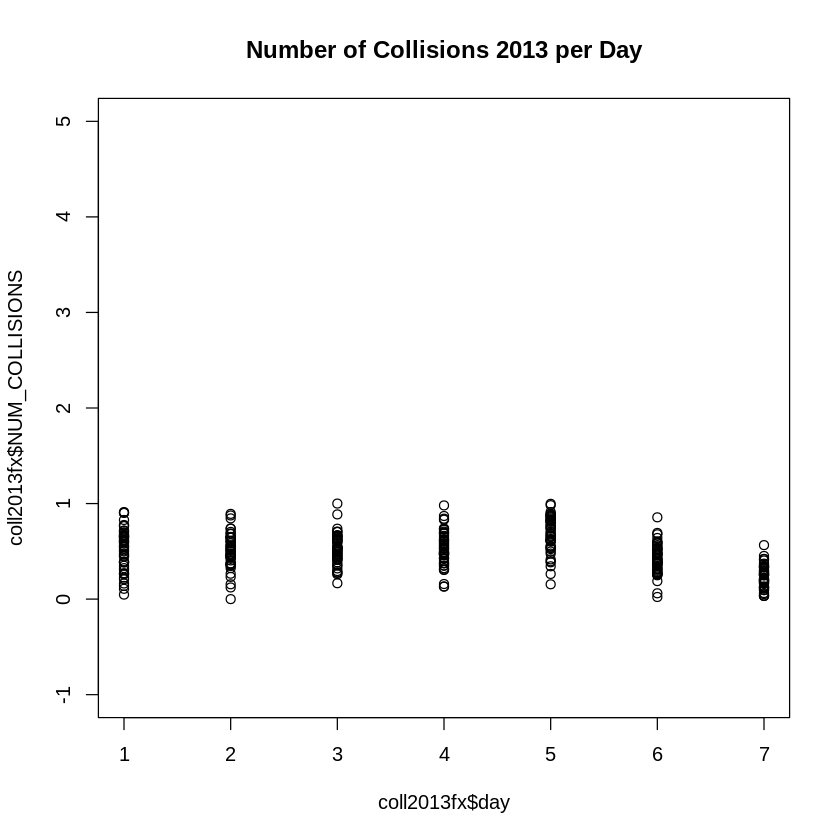

In [1291]:
plot(coll2013fx$day, coll2013fx$NUM_COLLISIONS, main = "Number of Collisions 2013 per Day", ylim = c(-1, 5))

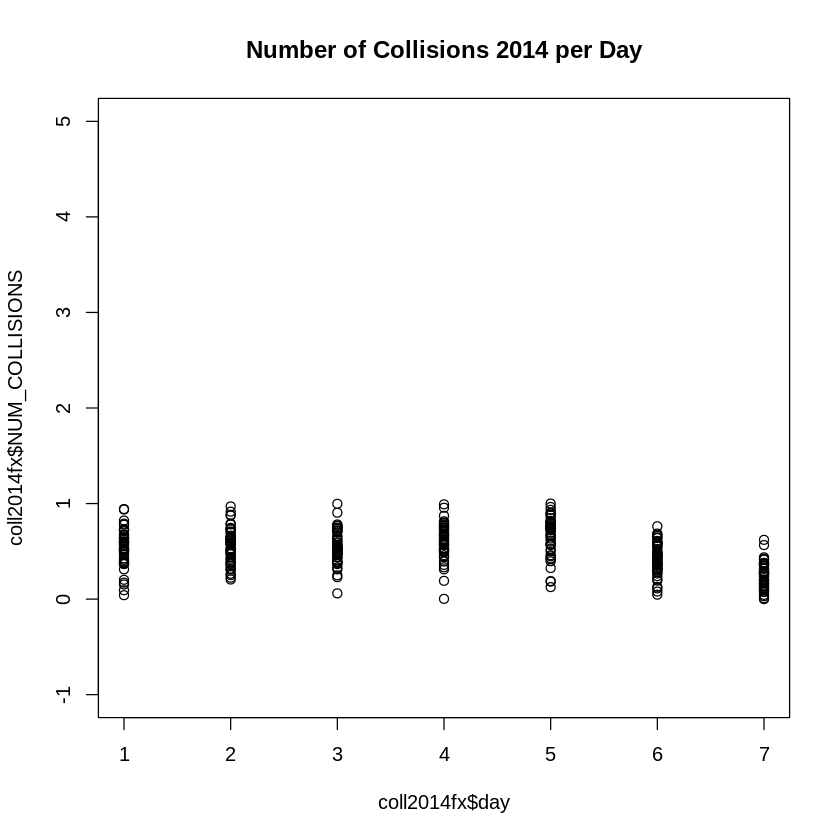

In [1292]:
plot(coll2014fx$day, coll2014fx$NUM_COLLISIONS, main = "Number of Collisions 2014 per Day", ylim = c(-1, 5))

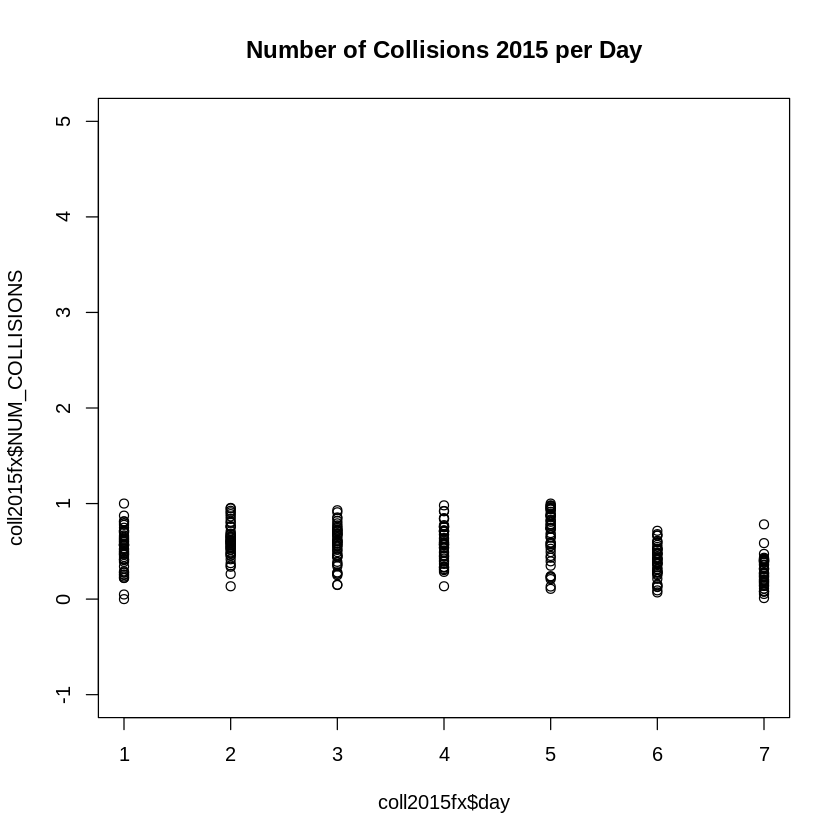

In [1293]:
plot(coll2015fx$day, coll2015fx$NUM_COLLISIONS, main = "Number of Collisions 2015 per Day", ylim = c(-1, 5))

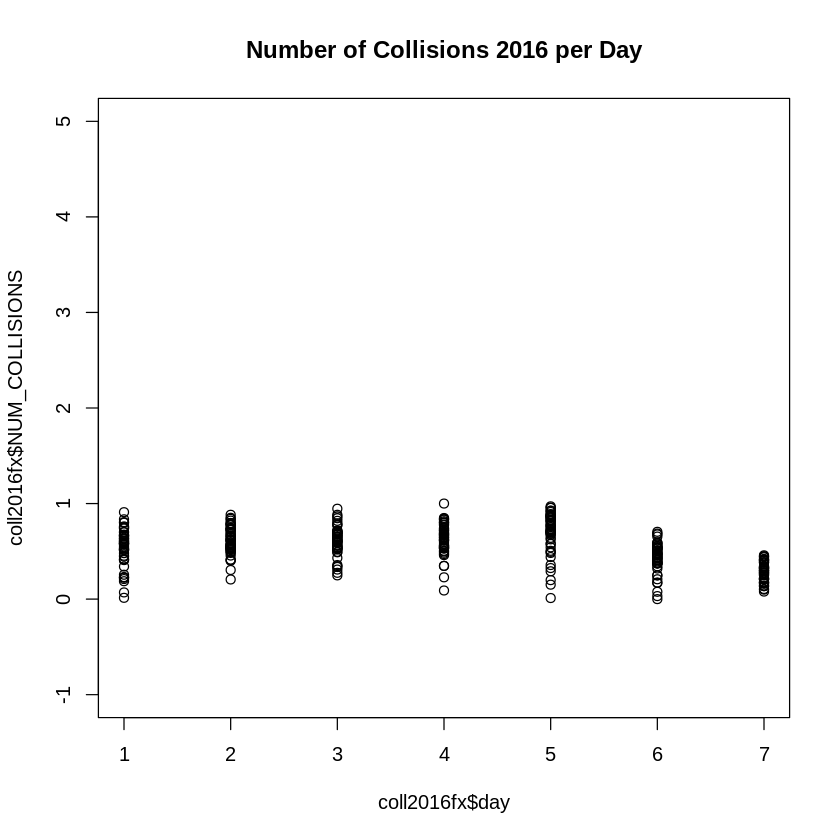

In [1294]:
plot(coll2016fx$day, coll2016fx$NUM_COLLISIONS, main = "Number of Collisions 2016 per Day", ylim = c(-1, 5))

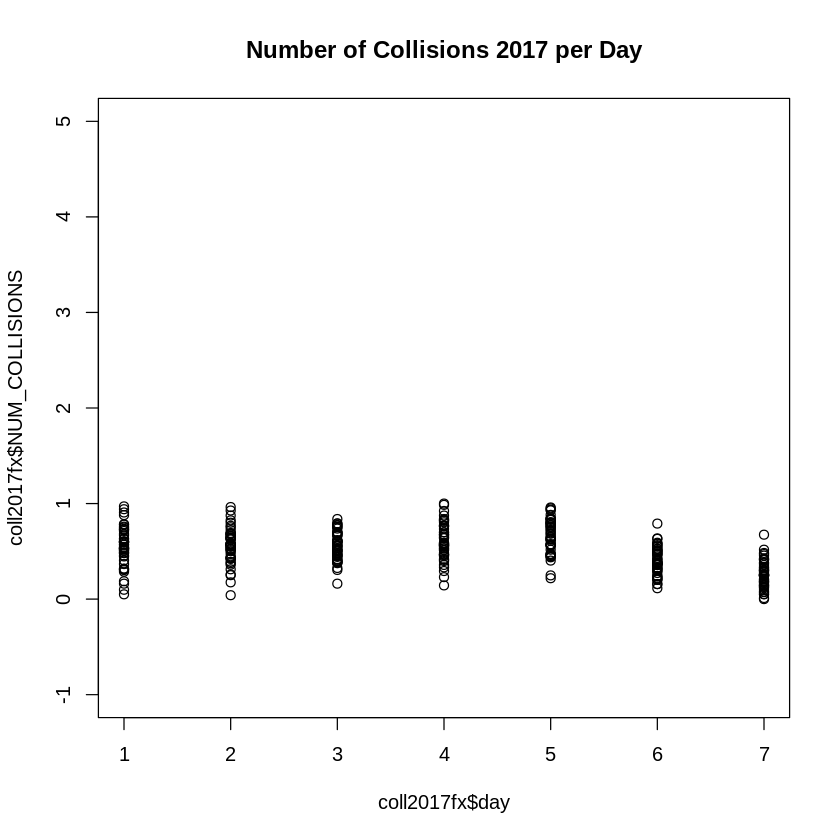

In [1295]:
plot(coll2017fx$day, coll2017fx$NUM_COLLISIONS, main = "Number of Collisions 2017 per Day", ylim = c(-1, 5))

In [1296]:
cor(coll2013fx$day, coll2013fx$NUM_COLLISIONS)
cor(coll2014fx$day, coll2014fx$NUM_COLLISIONS)
cor(coll2015fx$day, coll2015fx$NUM_COLLISIONS)
cor(coll2016fx$day, coll2016fx$NUM_COLLISIONS)
cor(coll2017fx$day, coll2017fx$NUM_COLLISIONS)

[1] -0.3040603

[1] -0.3320593

[1] -0.312761

[1] -0.3545784

[1] -0.3821322

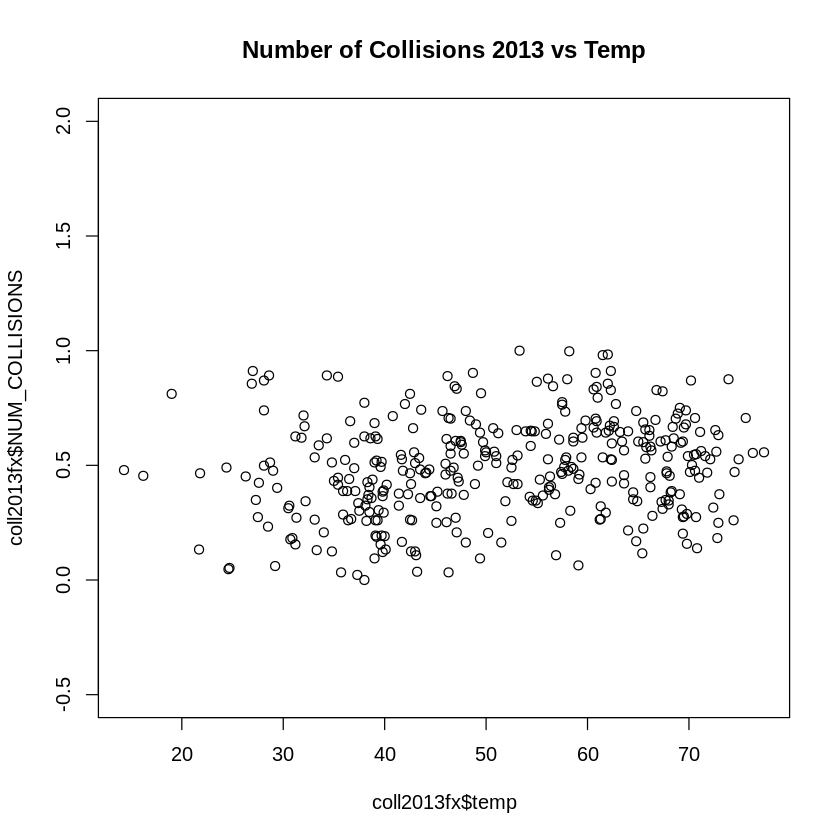

In [1297]:
plot(coll2013fx$temp, coll2013fx$NUM_COLLISIONS, main = "Number of Collisions 2013 vs Temp", ylim = c(-0.5, 2))

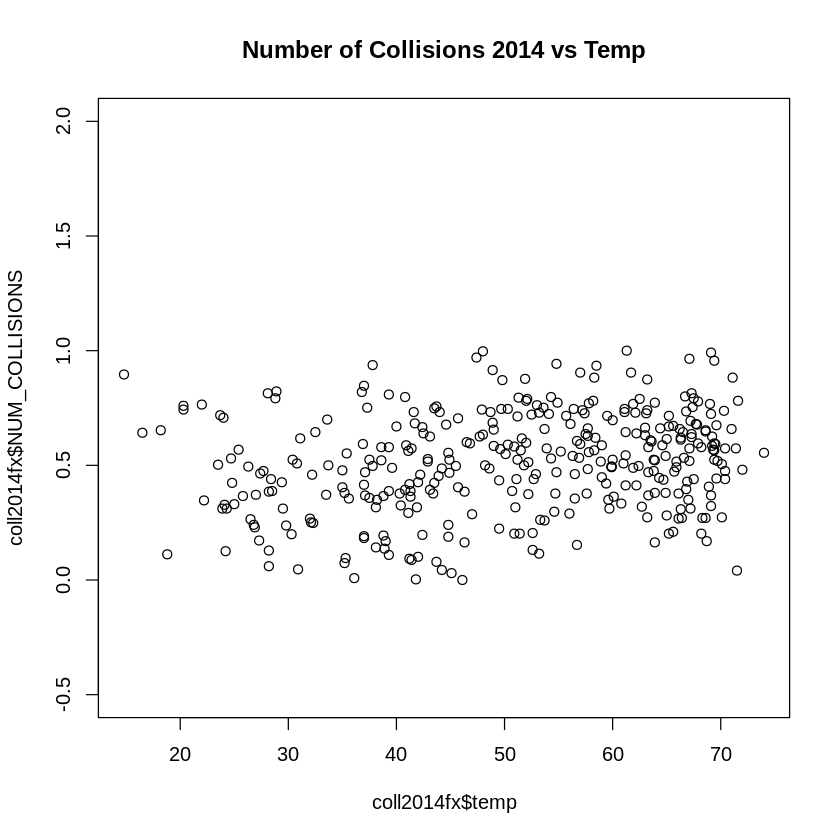

In [1298]:
plot(coll2014fx$temp, coll2014fx$NUM_COLLISIONS, main = "Number of Collisions 2014 vs Temp", ylim = c(-0.5, 2))

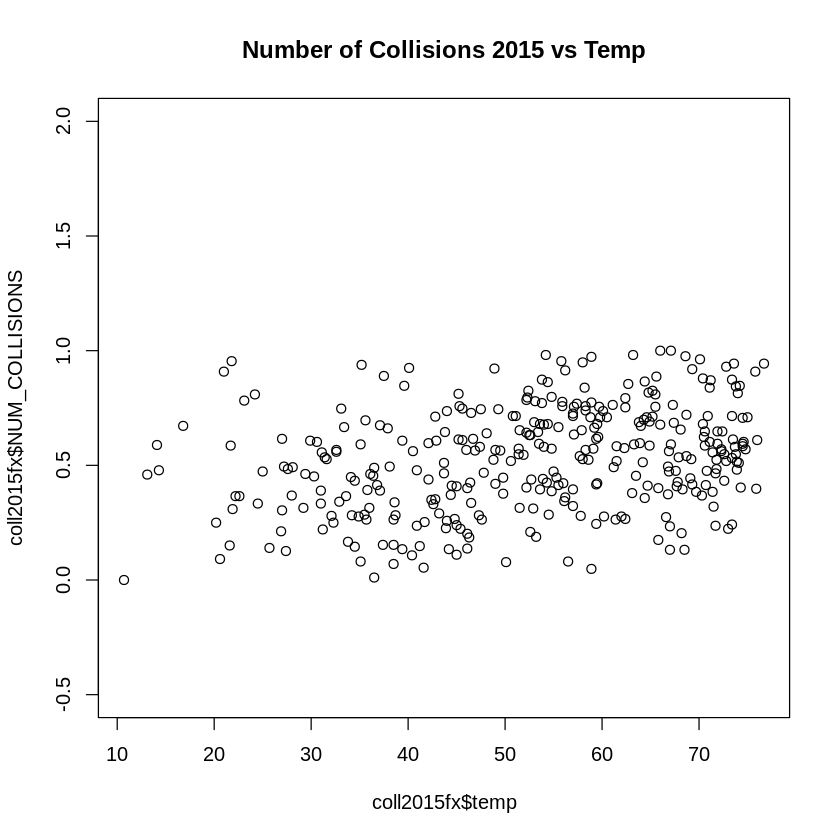

In [1299]:
plot(coll2015fx$temp, coll2015fx$NUM_COLLISIONS, main = "Number of Collisions 2015 vs Temp", ylim = c(-0.5, 2))

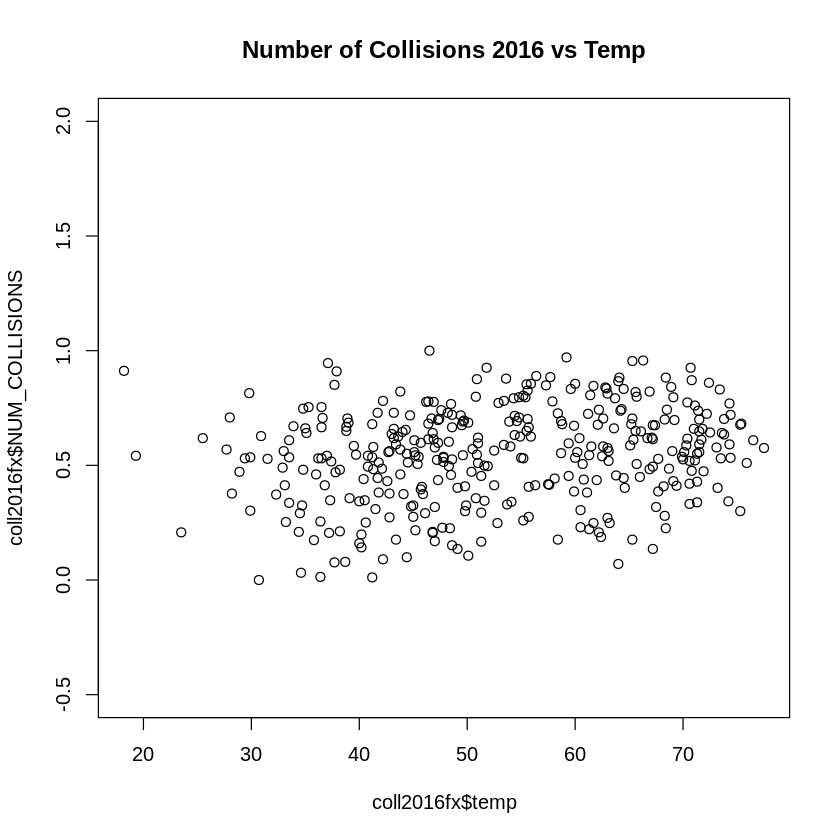

In [1300]:
plot(coll2016fx$temp, coll2016fx$NUM_COLLISIONS, main = "Number of Collisions 2016 vs Temp", ylim = c(-0.5, 2))

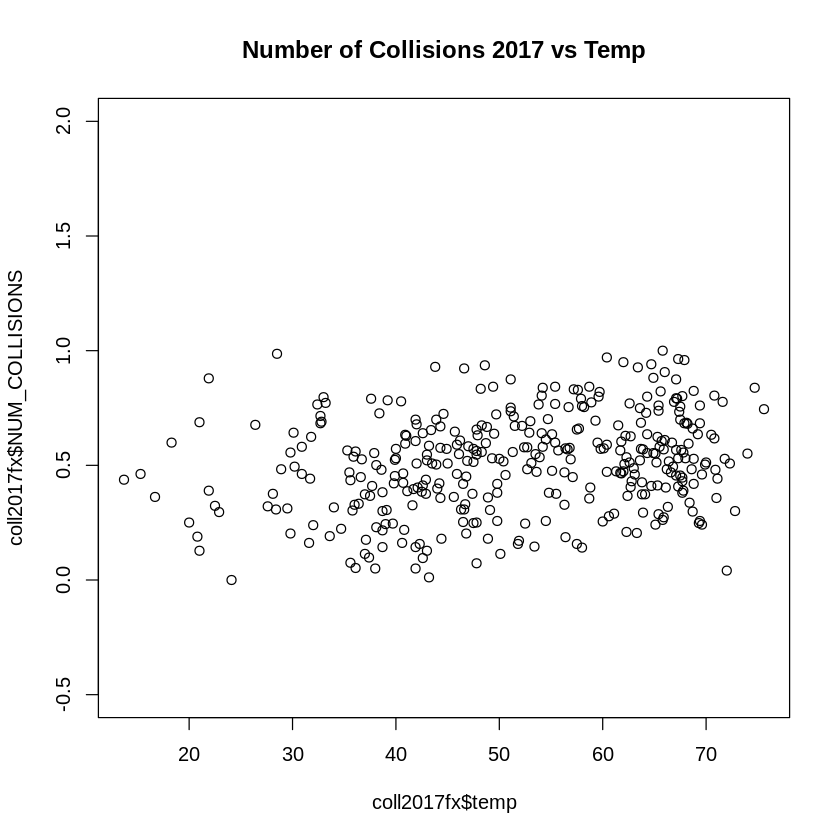

In [1301]:
plot(coll2017fx$temp, coll2017fx$NUM_COLLISIONS, main = "Number of Collisions 2017 vs Temp", ylim = c(-0.5, 2))

In [1302]:
cor(coll2013fx$temp, coll2013fx$NUM_COLLISIONS)
cor(coll2014fx$temp, coll2014fx$NUM_COLLISIONS)
cor(coll2015fx$temp, coll2015fx$NUM_COLLISIONS)
cor(coll2016fx$temp, coll2016fx$NUM_COLLISIONS)
cor(coll2017fx$temp, coll2017fx$NUM_COLLISIONS)

[1] 0.2006396

[1] 0.2224649

[1] 0.2984039

[1] 0.210545

[1] 0.2523307

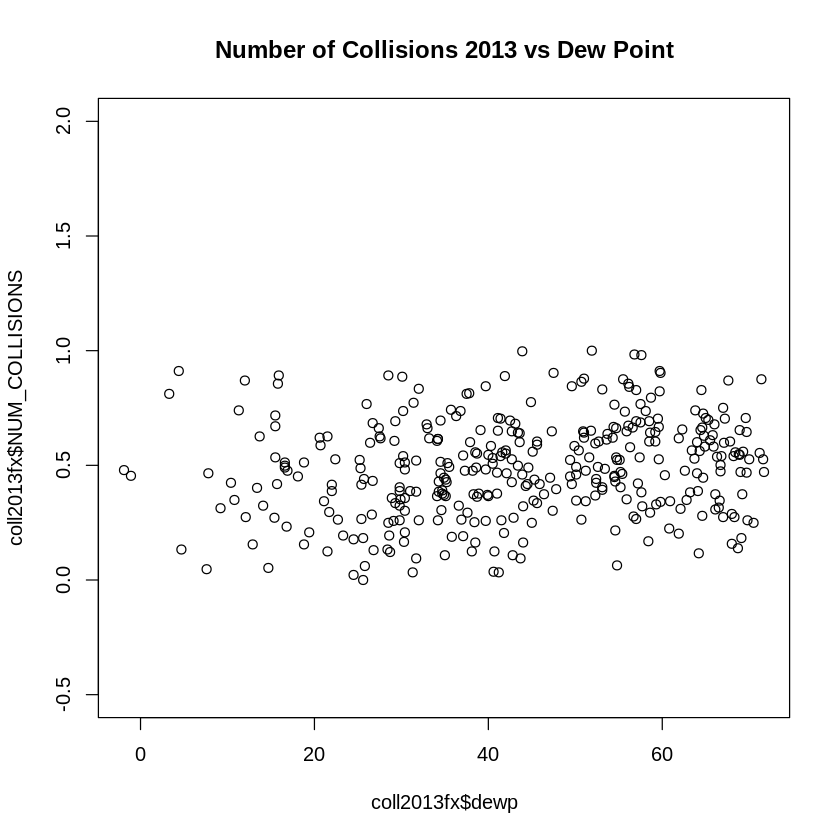

In [1303]:
plot(coll2013fx$dewp, coll2013fx$NUM_COLLISIONS, main = "Number of Collisions 2013 vs Dew Point", ylim = c(-0.5, 2))

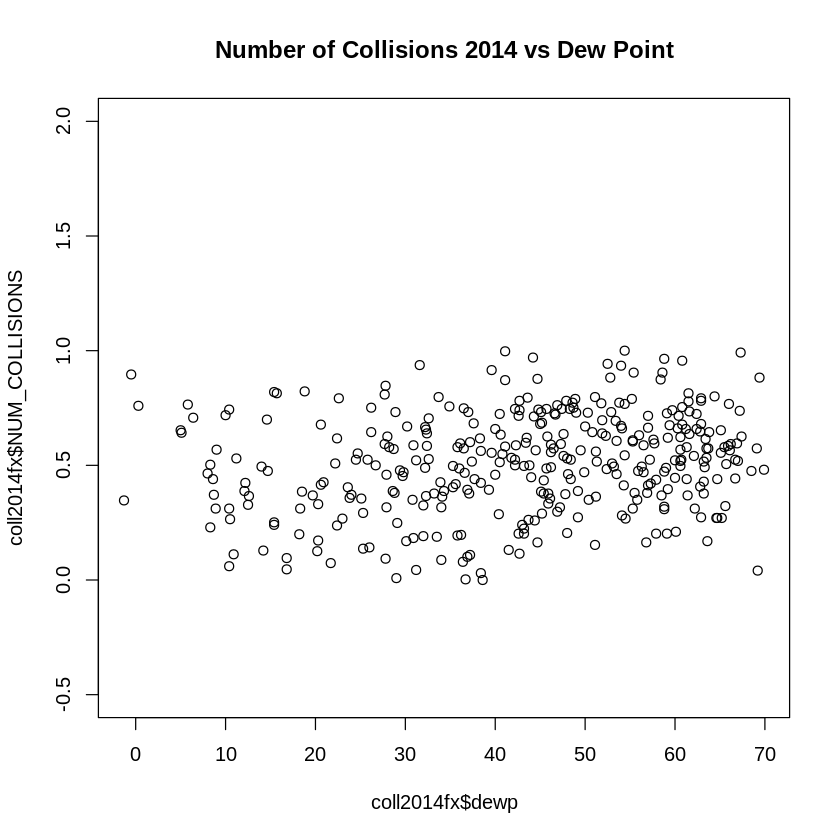

In [1304]:
plot(coll2014fx$dewp, coll2014fx$NUM_COLLISIONS, main = "Number of Collisions 2014 vs Dew Point", ylim = c(-0.5, 2))

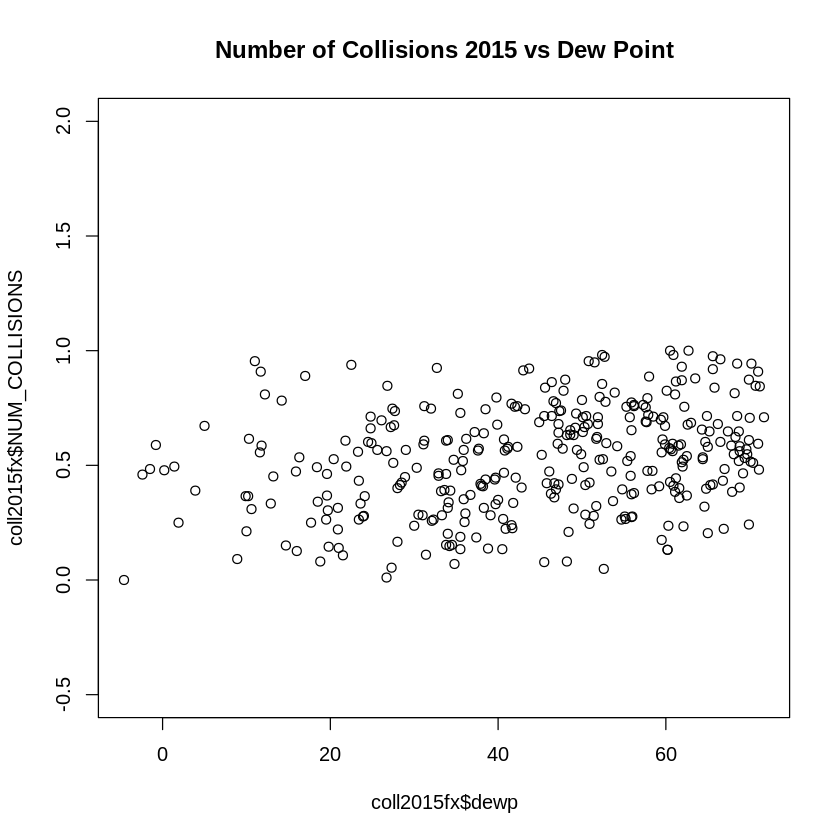

In [1305]:
plot(coll2015fx$dewp, coll2015fx$NUM_COLLISIONS, main = "Number of Collisions 2015 vs Dew Point", ylim = c(-0.5, 2))

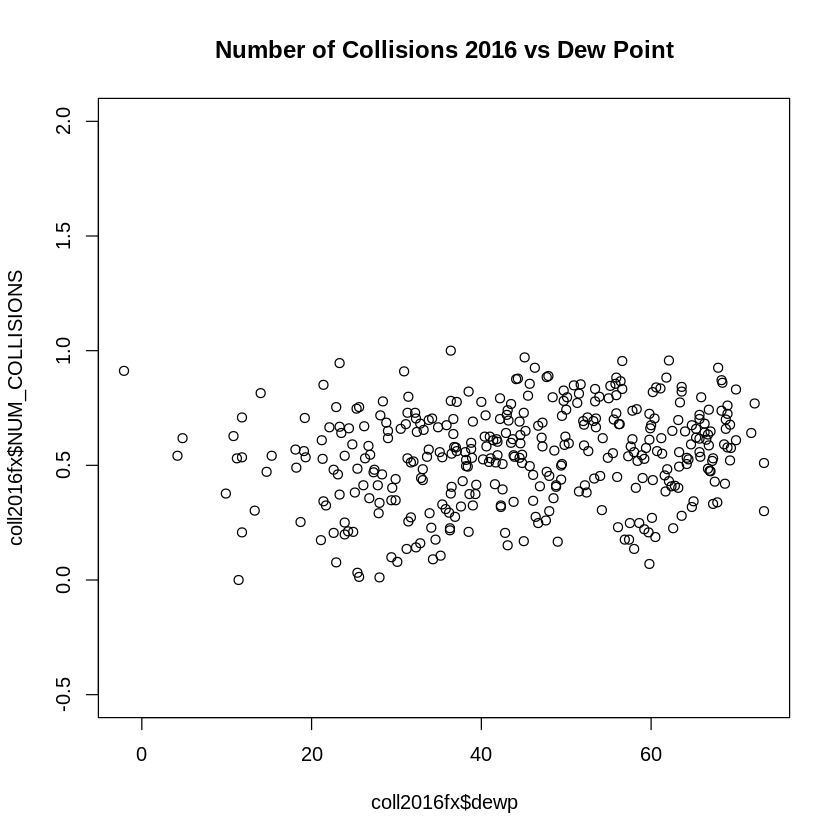

In [1306]:
plot(coll2016fx$dewp, coll2016fx$NUM_COLLISIONS, main = "Number of Collisions 2016 vs Dew Point", ylim = c(-0.5, 2))

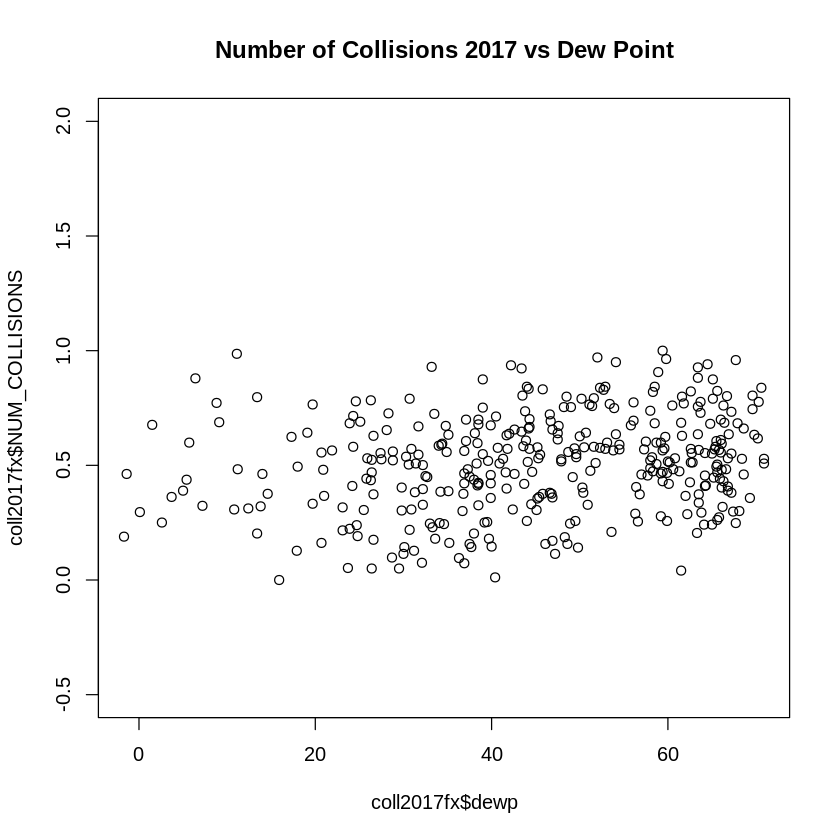

In [1307]:
plot(coll2017fx$dewp, coll2017fx$NUM_COLLISIONS, main = "Number of Collisions 2017 vs Dew Point", ylim = c(-0.5, 2))

In [1308]:
cor(coll2013f$dewp, coll2013f$NUM_COLLISIONS)
cor(coll2014f$dewp, coll2014f$NUM_COLLISIONS)
cor(coll2015f$dewp, coll2015f$NUM_COLLISIONS)
cor(coll2016f$dewp, coll2016f$NUM_COLLISIONS)
cor(coll2017f$dewp, coll2017f$NUM_COLLISIONS)

[1] 0.1837217

[1] 0.2087753

[1] 0.2798569

[1] 0.1559632

[1] 0.2123771

## Weekdays

Weekdays collisions increase Monday – Friday, then decrease Friday onwards. To make this more linear, we have created 2 new weekday columns with the order of the weekdays changed. This might seem strange, but weekdays are categorical data and therefore, as long as we are aware of which number equates to which day, we should have no issues.  

**weekday_sat** = starts with Saturday, Sunday, Monday, …  
**weekday_sun** = starts with Sunday, Saturday, Monday, …   

The weekdays are now in an ascending order for each year in both datasets and the correlation coefficients are significantly improved. This is especially true for the weekday_sun values.  


In [1309]:
coll2013g <- coll2013f %>%
  mutate(weekday_sat = day + 2,
         weekday_sun = day + 2) %>%
  select(weekday_sat, weekday_sun, everything())


In [1310]:
head(coll2013g)

,weekday_sat,weekday_sun,dayindex,dayofyear,day,year,mo,da,collision_date,temp,⋯,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
1,4,4,1,1,2,2013,1,1,2013-01-01,38.0,⋯,10.0,15.0,21.0,28.0,41.0,33.1,0.00,999.9,0,0.00000000
2,5,5,2,2,3,2013,1,2,2013-01-02,27.5,⋯,10.0,12.4,15.9,25.1,33.1,21.9,0.00,999.9,0,0.27887324
3,6,6,3,3,4,2013,1,3,2013-01-03,21.8,⋯,10.0,9.8,18.1,24.1,28.9,16.0,0.00,999.9,0,0.47323944
4,7,7,4,4,5,2013,1,4,2013-01-04,32.2,⋯,10.0,11.3,22.0,29.9,41.0,24.1,0.00,999.9,0,0.34929577
5,8,8,5,5,6,2013,1,5,2013-01-05,37.3,⋯,10.0,13.2,20.0,28.0,42.1,30.9,0.00,999.9,0,0.02253521
6,9,9,6,6,7,2013,1,6,2013-01-06,35.7,⋯,9.8,5.9,15.0,20.0,44.1,23.0,0.01,999.9,0,0.03380282


In [1311]:
coll2013g$weekday_sat[coll2013g$weekday_sat == 8] <- 1
coll2013g$weekday_sat[coll2013g$weekday_sat == 9] <- 2

coll2013g$weekday_sun[coll2013g$weekday_sun == 8] <- 2
coll2013g$weekday_sun[coll2013g$weekday_sun == 9] <- 1

In [1312]:
head(coll2013g)

,weekday_sat,weekday_sun,dayindex,dayofyear,day,year,mo,da,collision_date,temp,⋯,visib,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
1,4,4,1,1,2,2013,1,1,2013-01-01,38.0,⋯,10.0,15.0,21.0,28.0,41.0,33.1,0.00,999.9,0,0.00000000
2,5,5,2,2,3,2013,1,2,2013-01-02,27.5,⋯,10.0,12.4,15.9,25.1,33.1,21.9,0.00,999.9,0,0.27887324
3,6,6,3,3,4,2013,1,3,2013-01-03,21.8,⋯,10.0,9.8,18.1,24.1,28.9,16.0,0.00,999.9,0,0.47323944
4,7,7,4,4,5,2013,1,4,2013-01-04,32.2,⋯,10.0,11.3,22.0,29.9,41.0,24.1,0.00,999.9,0,0.34929577
5,1,2,5,5,6,2013,1,5,2013-01-05,37.3,⋯,10.0,13.2,20.0,28.0,42.1,30.9,0.00,999.9,0,0.02253521
6,2,1,6,6,7,2013,1,6,2013-01-06,35.7,⋯,9.8,5.9,15.0,20.0,44.1,23.0,0.01,999.9,0,0.03380282


In [1313]:
coll2014g <- coll2014f %>%
  mutate(weekday_sat = day + 2,
         weekday_sun = day + 2) %>%
  select(weekday_sat, weekday_sun, everything())

coll2014g$weekday_sat[coll2014g$weekday_sat == 8] <- 1
coll2014g$weekday_sat[coll2014g$weekday_sat == 9] <- 2
coll2014g$weekday_sun[coll2014g$weekday_sun == 8] <- 2
coll2014g$weekday_sun[coll2014g$weekday_sun == 9] <- 1

coll2015g <- coll2015f %>%
  mutate(weekday_sat = day + 2,
         weekday_sun = day + 2) %>%
  select(weekday_sat, weekday_sun, everything())

coll2015g$weekday_sat[coll2015g$weekday_sat == 8] <- 1
coll2015g$weekday_sat[coll2015g$weekday_sat == 9] <- 2
coll2015g$weekday_sun[coll2015g$weekday_sun == 8] <- 2
coll2015g$weekday_sun[coll2015g$weekday_sun == 9] <- 1

coll2016g <- coll2016f %>%
  mutate(weekday_sat = day + 2,
         weekday_sun = day + 2) %>%
  select(weekday_sat, weekday_sun, everything())

coll2016g$weekday_sat[coll2016g$weekday_sat == 8] <- 1
coll2016g$weekday_sat[coll2016g$weekday_sat == 9] <- 2
coll2016g$weekday_sun[coll2016g$weekday_sun == 8] <- 2
coll2016g$weekday_sun[coll2016g$weekday_sun == 9] <- 1

coll2017g <- coll2017f %>%
  mutate(weekday_sat = day + 2,
         weekday_sun = day + 2) %>%
  select(weekday_sat, weekday_sun, everything())

coll2017g$weekday_sat[coll2017g$weekday_sat == 8] <- 1
coll2017g$weekday_sat[coll2017g$weekday_sat == 9] <- 2
coll2017g$weekday_sun[coll2017g$weekday_sun == 8] <- 2
coll2017g$weekday_sun[coll2017g$weekday_sun == 9] <- 1

######### DATA2
coll2013gx <- coll2013fx %>%
  mutate(weekday_sat = day + 2,
         weekday_sun = day + 2) %>%
  select(weekday_sat, weekday_sun, everything())

coll2013gx$weekday_sat[coll2013gx$weekday_sat == 8] <- 1
coll2013gx$weekday_sat[coll2013gx$weekday_sat == 9] <- 2
coll2013gx$weekday_sun[coll2013gx$weekday_sun == 8] <- 2
coll2013gx$weekday_sun[coll2013gx$weekday_sun == 9] <- 1

coll2014gx <- coll2014fx %>%
  mutate(weekday_sat = day + 2,
         weekday_sun = day + 2) %>%
  select(weekday_sat, weekday_sun, everything())

coll2014gx$weekday_sat[coll2014gx$weekday_sat == 8] <- 1
coll2014gx$weekday_sat[coll2014gx$weekday_sat == 9] <- 2
coll2014gx$weekday_sun[coll2014gx$weekday_sun == 8] <- 2
coll2014gx$weekday_sun[coll2014gx$weekday_sun == 9] <- 1

coll2015gx <- coll2015fx %>%
  mutate(weekday_sat = day + 2,
         weekday_sun = day + 2) %>%
  select(weekday_sat, weekday_sun, everything())

coll2015gx$weekday_sat[coll2015gx$weekday_sat == 8] <- 1
coll2015gx$weekday_sat[coll2015gx$weekday_sat == 9] <- 2
coll2015gx$weekday_sun[coll2015gx$weekday_sun == 8] <- 2
coll2015gx$weekday_sun[coll2015gx$weekday_sun == 9] <- 1

coll2016gx <- coll2016fx %>%
  mutate(weekday_sat = day + 2,
         weekday_sun = day + 2) %>%
  select(weekday_sat, weekday_sun, everything())

coll2016gx$weekday_sat[coll2016gx$weekday_sat == 8] <- 1
coll2016gx$weekday_sat[coll2016gx$weekday_sat == 9] <- 2
coll2016gx$weekday_sun[coll2016gx$weekday_sun == 8] <- 2
coll2016gx$weekday_sun[coll2016gx$weekday_sun == 9] <- 1

coll2017gx <- coll2017fx %>%
  mutate(weekday_sat = day + 2,
         weekday_sun = day + 2) %>%
  select(weekday_sat, weekday_sun, everything())

coll2017gx$weekday_sat[coll2017gx$weekday_sat == 8] <- 1
coll2017gx$weekday_sat[coll2017gx$weekday_sat == 9] <- 2
coll2017gx$weekday_sun[coll2017gx$weekday_sun == 8] <- 2
coll2017gx$weekday_sun[coll2017gx$weekday_sun == 9] <- 1

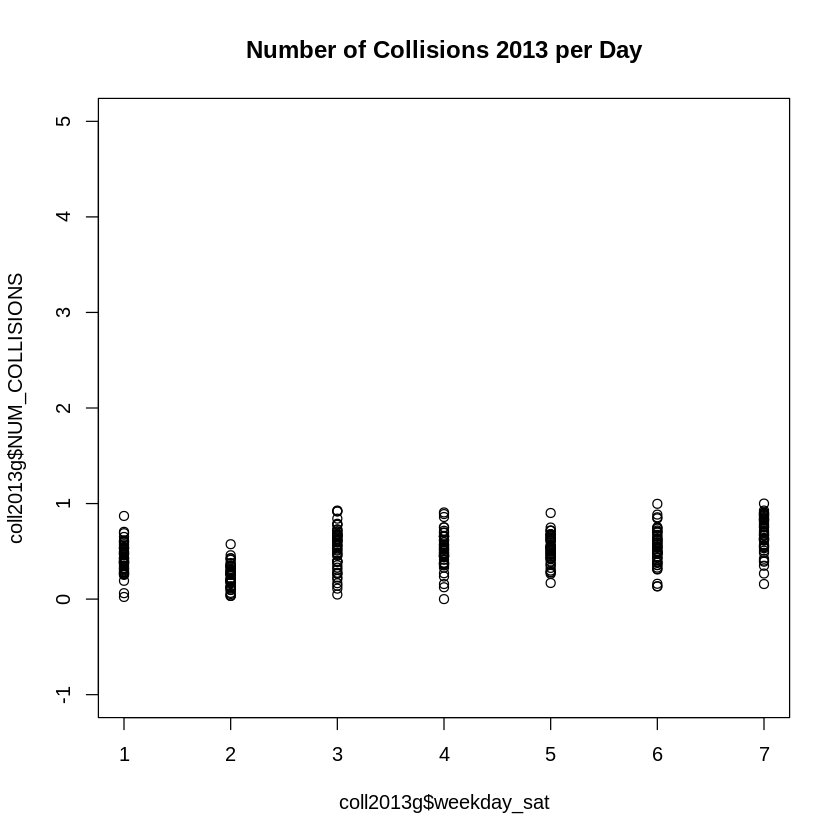

In [1314]:
plot(coll2013g$weekday_sat, coll2013g$NUM_COLLISIONS, main = "Number of Collisions 2013 per Day", ylim = c(-1, 5))

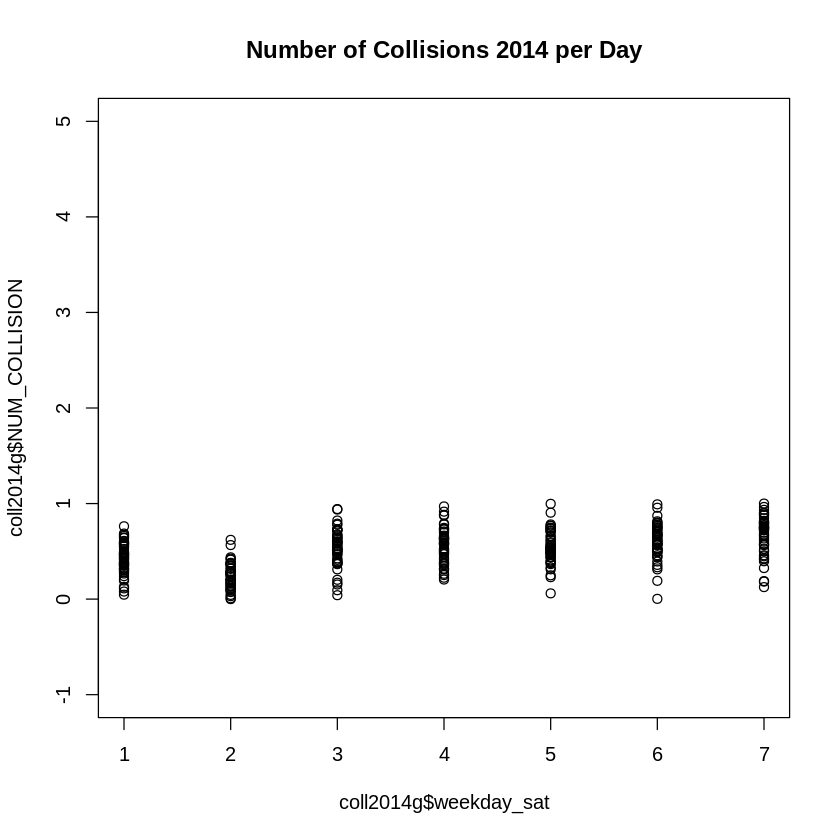

In [1315]:
plot(coll2014g$weekday_sat, coll2014g$NUM_COLLISION, main = "Number of Collisions 2014 per Day", ylim = c(-1, 5))

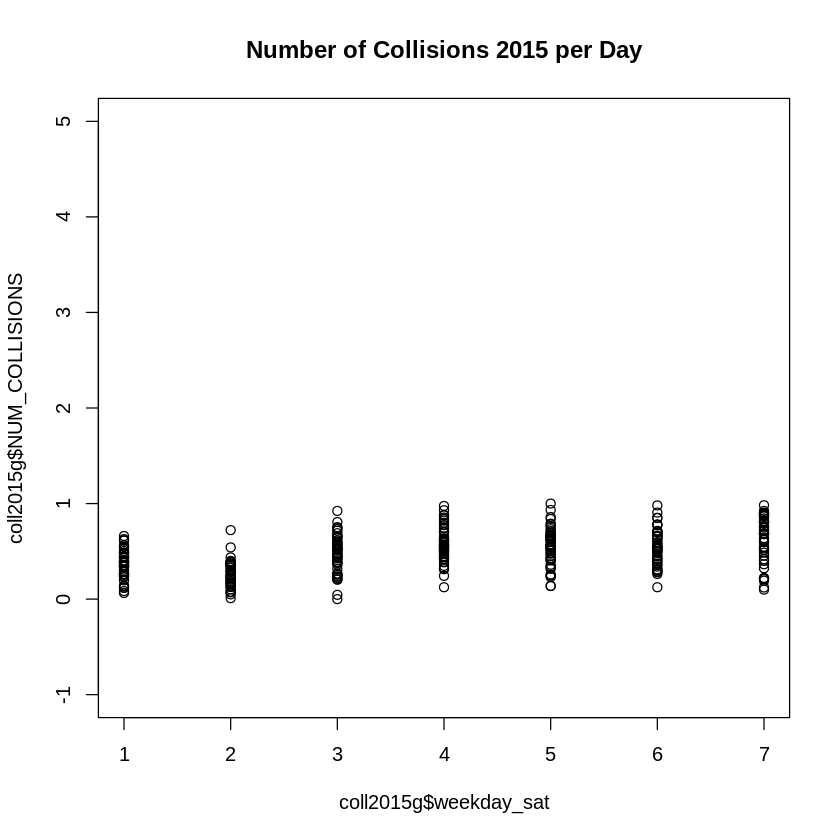

In [1316]:
plot(coll2015g$weekday_sat, coll2015g$NUM_COLLISIONS, main = "Number of Collisions 2015 per Day", ylim = c(-1, 5))

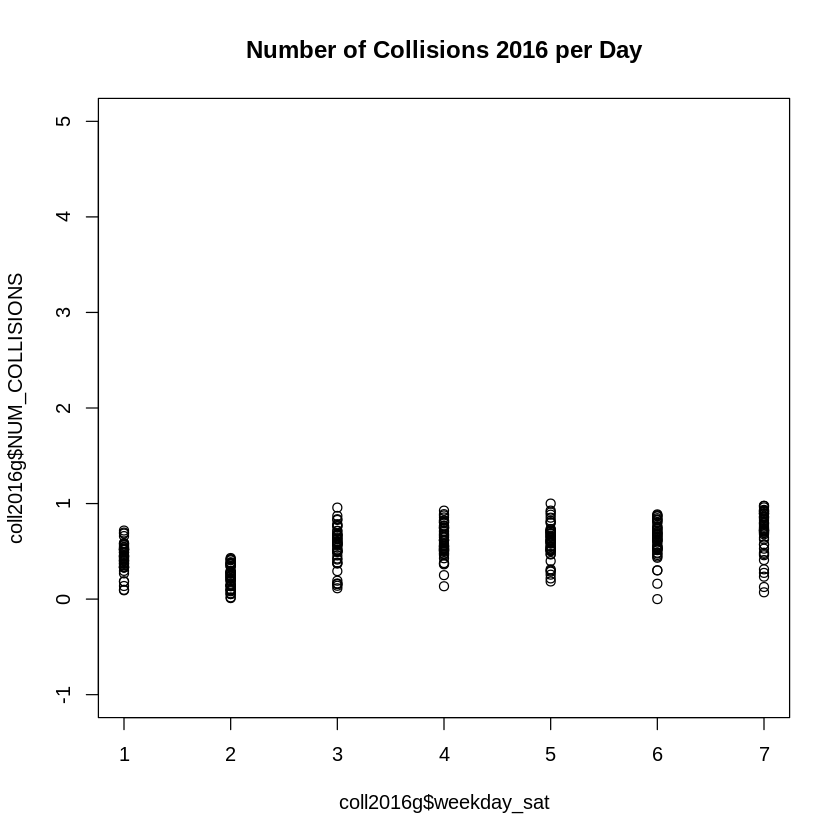

In [1317]:
plot(coll2016g$weekday_sat, coll2016g$NUM_COLLISIONS, main = "Number of Collisions 2016 per Day", ylim = c(-1, 5))

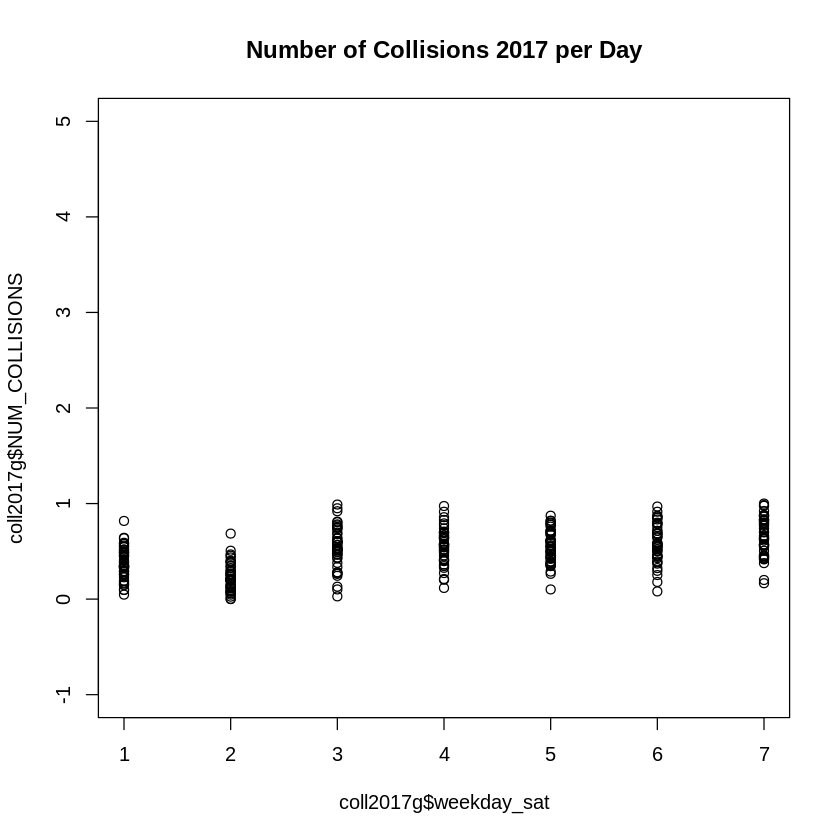

In [1318]:
plot(coll2017g$weekday_sat, coll2017g$NUM_COLLISIONS, main = "Number of Collisions 2017 per Day", ylim = c(-1, 5))

In [1319]:
cor(coll2013g$weekday_sat, coll2013g$NUM_COLLISIONS)
cor(coll2014g$weekday_sat, coll2014g$NUM_COLLISIONS)
cor(coll2015g$weekday_sat, coll2015g$NUM_COLLISIONS)
cor(coll2016g$weekday_sat, coll2016g$NUM_COLLISIONS)
cor(coll2017g$weekday_sat, coll2017g$NUM_COLLISIONS)

[1] 0.4525978

[1] 0.4775879

[1] 0.4576817

[1] 0.5126885

[1] 0.4995214

In [1320]:
cor(coll2013gx$weekday_sat, coll2013gx$NUM_COLLISIONS)
cor(coll2014gx$weekday_sat, coll2014gx$NUM_COLLISIONS)
cor(coll2015gx$weekday_sat, coll2015gx$NUM_COLLISIONS)
cor(coll2016gx$weekday_sat, coll2016gx$NUM_COLLISIONS)
cor(coll2017gx$weekday_sat, coll2017gx$NUM_COLLISIONS)

[1] 0.4572471

[1] 0.4775879

[1] 0.4569623

[1] 0.5210658

[1] 0.5013119

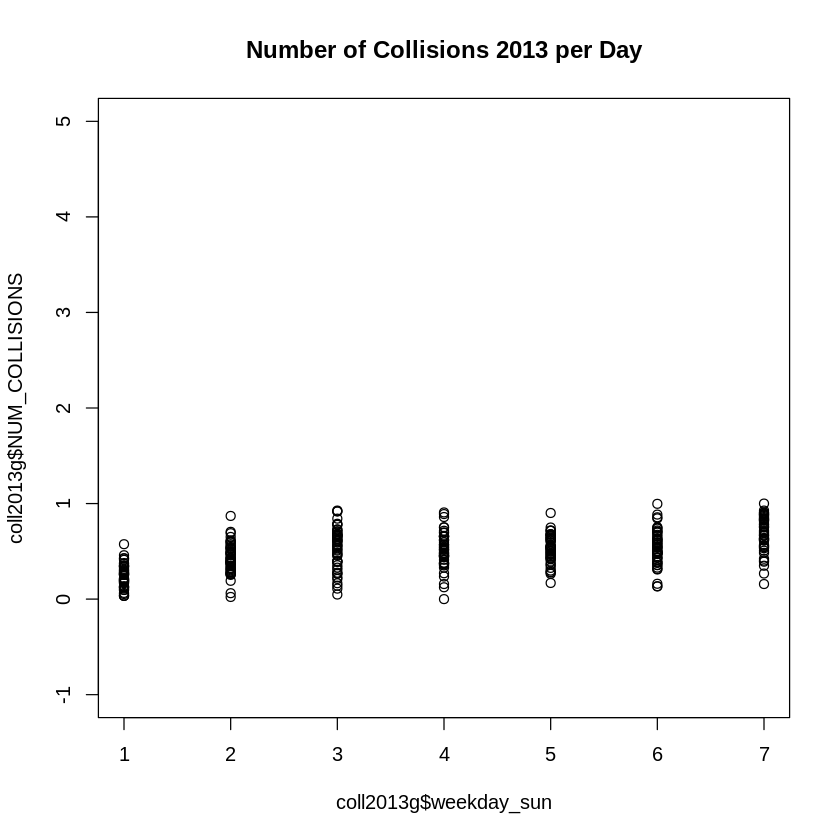

In [1321]:
plot(coll2013g$weekday_sun, coll2013g$NUM_COLLISIONS, main = "Number of Collisions 2013 per Day", ylim = c(-1, 5))

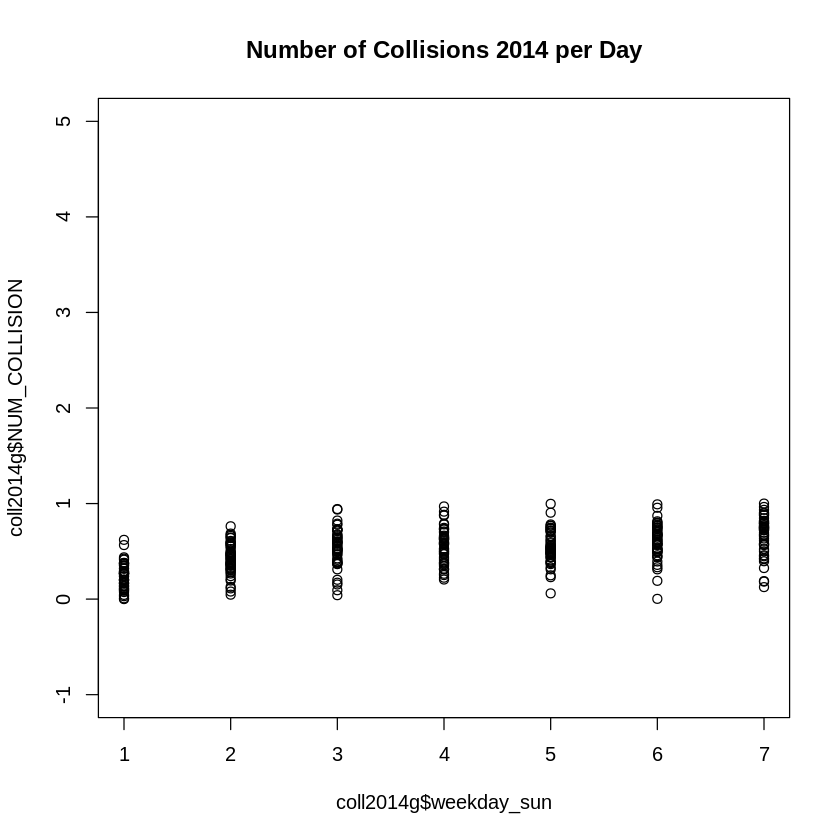

In [1322]:
plot(coll2014g$weekday_sun, coll2014g$NUM_COLLISION, main = "Number of Collisions 2014 per Day", ylim = c(-1, 5))

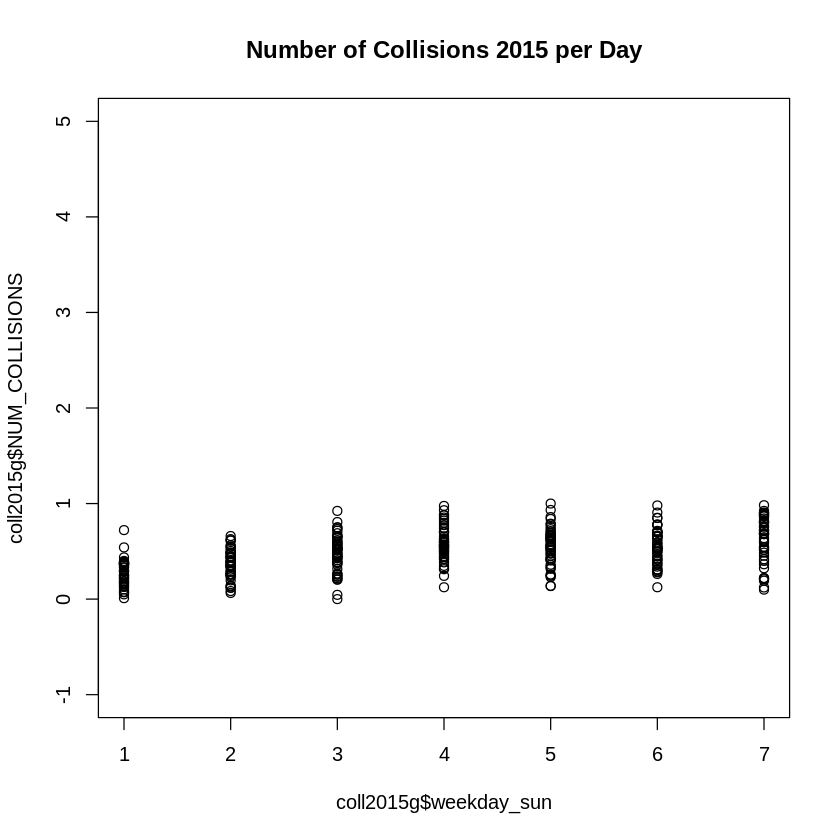

In [1323]:
plot(coll2015g$weekday_sun, coll2015g$NUM_COLLISIONS, main = "Number of Collisions 2015 per Day", ylim = c(-1, 5))

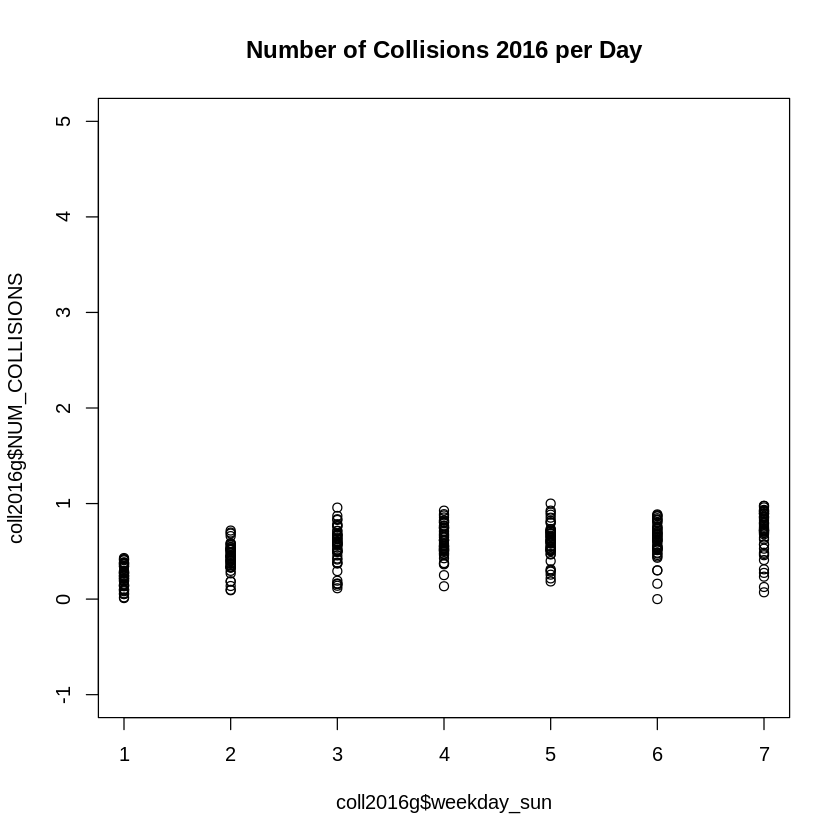

In [1324]:
plot(coll2016g$weekday_sun, coll2016g$NUM_COLLISIONS, main = "Number of Collisions 2016 per Day", ylim = c(-1, 5))

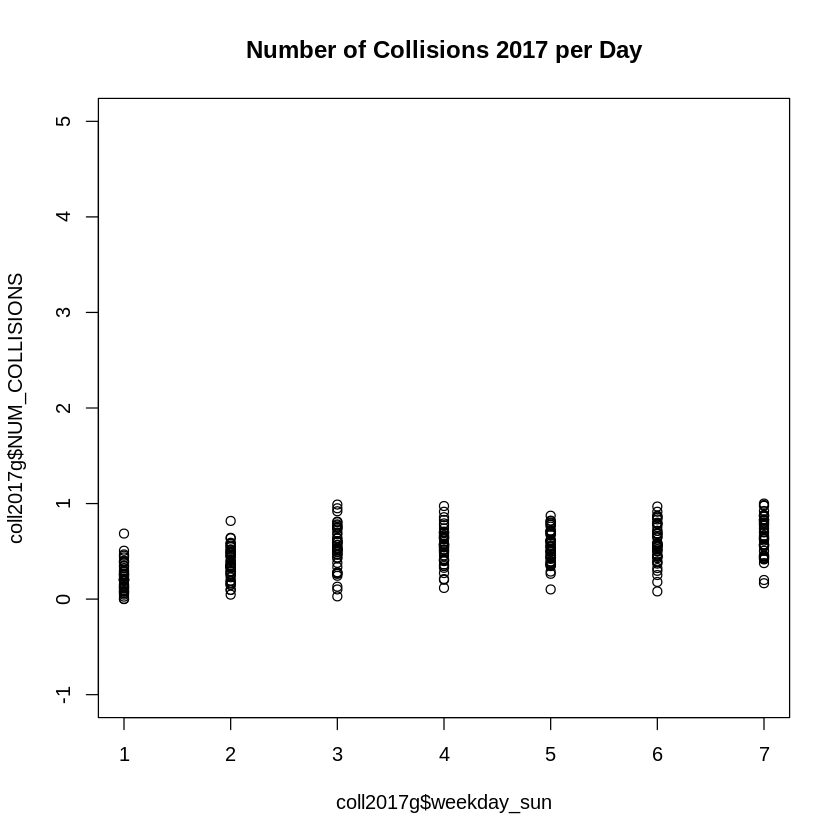

In [1325]:
plot(coll2017g$weekday_sun, coll2017g$NUM_COLLISIONS, main = "Number of Collisions 2017 per Day", ylim = c(-1, 5))

In [1326]:
cor(coll2013g$weekday_sun, coll2013g$NUM_COLLISIONS)
cor(coll2014g$weekday_sun, coll2014g$NUM_COLLISIONS)
cor(coll2015g$weekday_sun, coll2015g$NUM_COLLISIONS)
cor(coll2016g$weekday_sun, coll2016g$NUM_COLLISIONS)
cor(coll2017g$weekday_sun, coll2017g$NUM_COLLISIONS)

[1] 0.5169484

[1] 0.5361094

[1] 0.488501

[1] 0.5755724

[1] 0.5464129

In [1327]:
cor(coll2013gx$weekday_sun, coll2013gx$NUM_COLLISIONS)
cor(coll2014gx$weekday_sun, coll2014gx$NUM_COLLISIONS)
cor(coll2015gx$weekday_sun, coll2015gx$NUM_COLLISIONS)
cor(coll2016gx$weekday_sun, coll2016gx$NUM_COLLISIONS)
cor(coll2017gx$weekday_sun, coll2017gx$NUM_COLLISIONS)

[1] 0.5203086

[1] 0.5361094

[1] 0.4893752

[1] 0.5722182

[1] 0.5530739

## Amalgamation / Final Analysis

Now we amalgamate the years for each dataset back together and take a look at the final relationships.  

All variables correlations are noticeable improved from the start of our analysis and the plots far cleaner, especially the weekdays. The histogram and density plots for each dataset confirm normalization has been successful and we now have standard distribution of the data.  

  



###Data1

In [1328]:
nrow(coll2013g)
nrow(coll2014g)
nrow(coll2015g)
nrow(coll2016g)
nrow(coll2017g)

[1] 356

[1] 355

[1] 347

[1] 350

[1] 345

In [1329]:
colldataall <- rbind(coll2013g, coll2014g, coll2015g, coll2016g, coll2017g)

In [1330]:
nrow(colldataall)

[1] 1753

In [1331]:
summary(colldataall)

  weekday_sat     weekday_sun       dayindex        dayofyear    
 Min.   :1.000   Min.   :1.000   Min.   :   1.0   Min.   :  1.0  
 1st Qu.:2.000   1st Qu.:2.000   1st Qu.: 454.0   1st Qu.: 95.0  
 Median :4.000   Median :4.000   Median : 907.0   Median :186.0  
 Mean   :3.992   Mean   :3.997   Mean   : 908.8   Mean   :184.2  
 3rd Qu.:6.000   3rd Qu.:6.000   3rd Qu.:1363.0   3rd Qu.:274.0  
 Max.   :7.000   Max.   :7.000   Max.   :1826.0   Max.   :366.0  
                                                                 
      day             year            mo               da       
 Min.   :1.000   Min.   :2013   Min.   : 1.000   Min.   : 1.00  
 1st Qu.:2.000   1st Qu.:2014   1st Qu.: 4.000   1st Qu.: 8.00  
 Median :4.000   Median :2015   Median : 7.000   Median :16.00  
 Mean   :3.977   Mean   :2015   Mean   : 6.561   Mean   :15.71  
 3rd Qu.:6.000   3rd Qu.:2016   3rd Qu.:10.000   3rd Qu.:23.00  
 Max.   :7.000   Max.   :2017   Max.   :12.000   Max.   :31.00  
                 

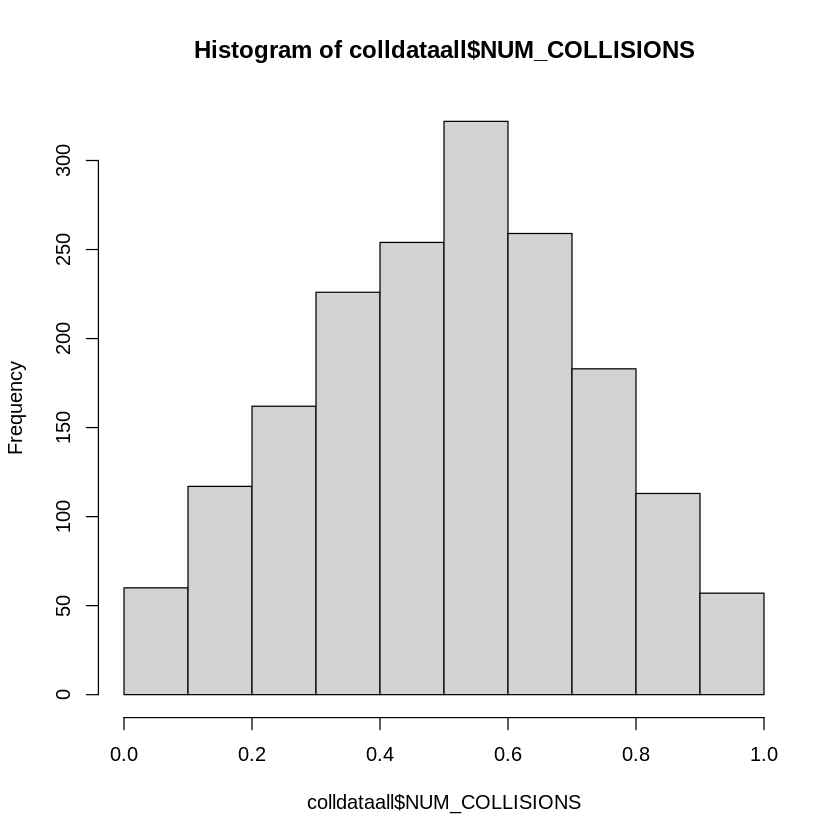

In [1332]:
hist(colldataall$NUM_COLLISIONS, breaks = 12)

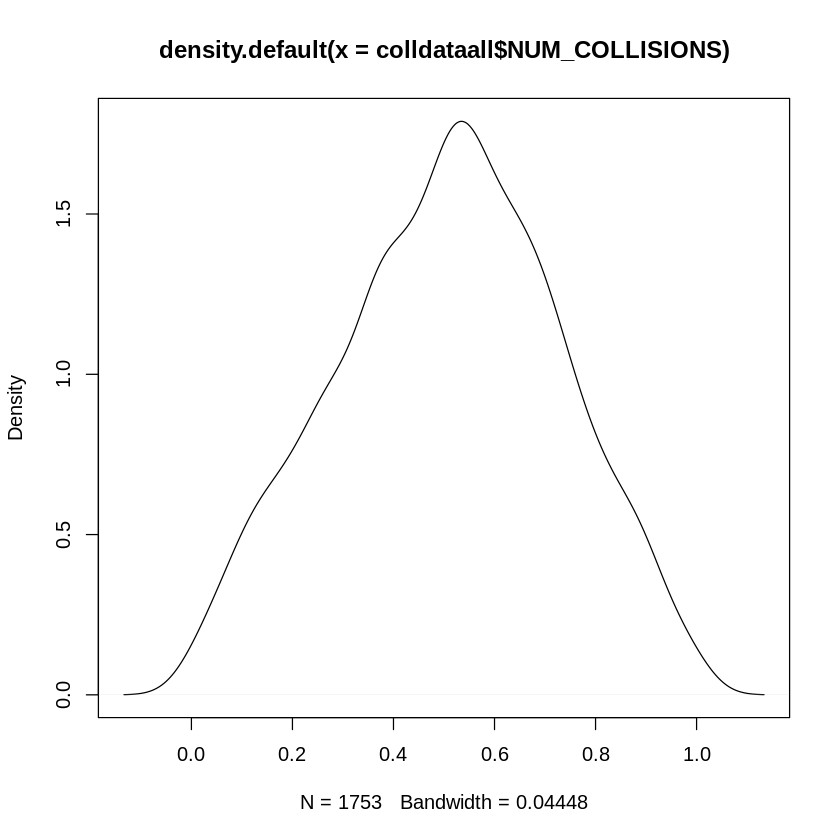

In [1333]:
plot(density(colldataall$NUM_COLLISIONS))

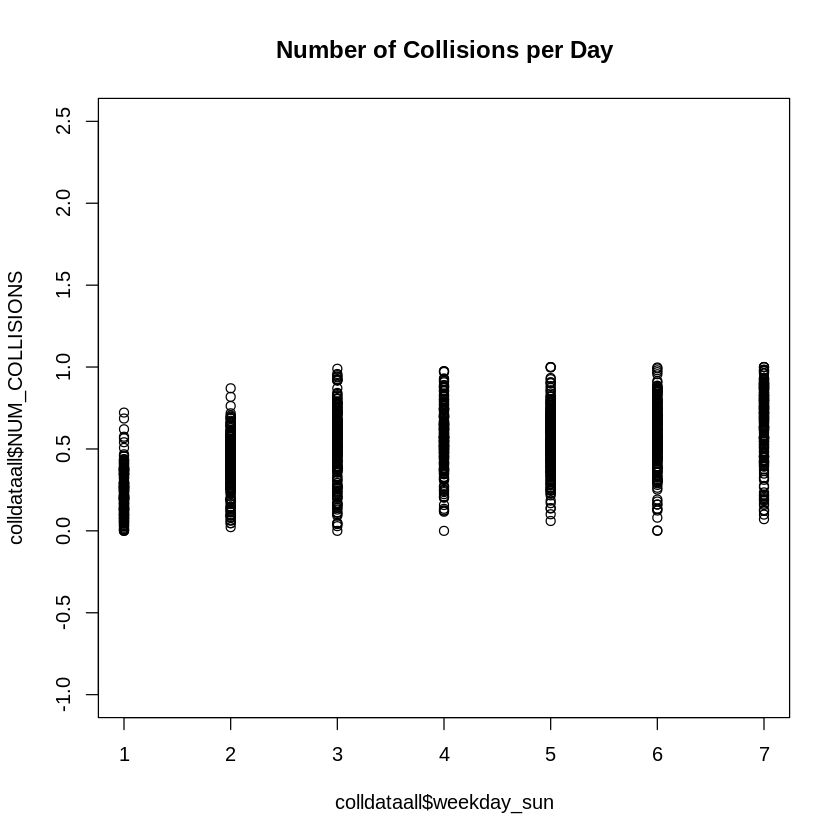

In [1334]:
plot(colldataall$weekday_sun, colldataall$NUM_COLLISIONS, main = "Number of Collisions per Day", ylim = c(-1, 2.5))

In [1335]:
cor(colldataall$weekday_sun, colldataall$NUM_COLLISIONS)

[1] 0.5317507

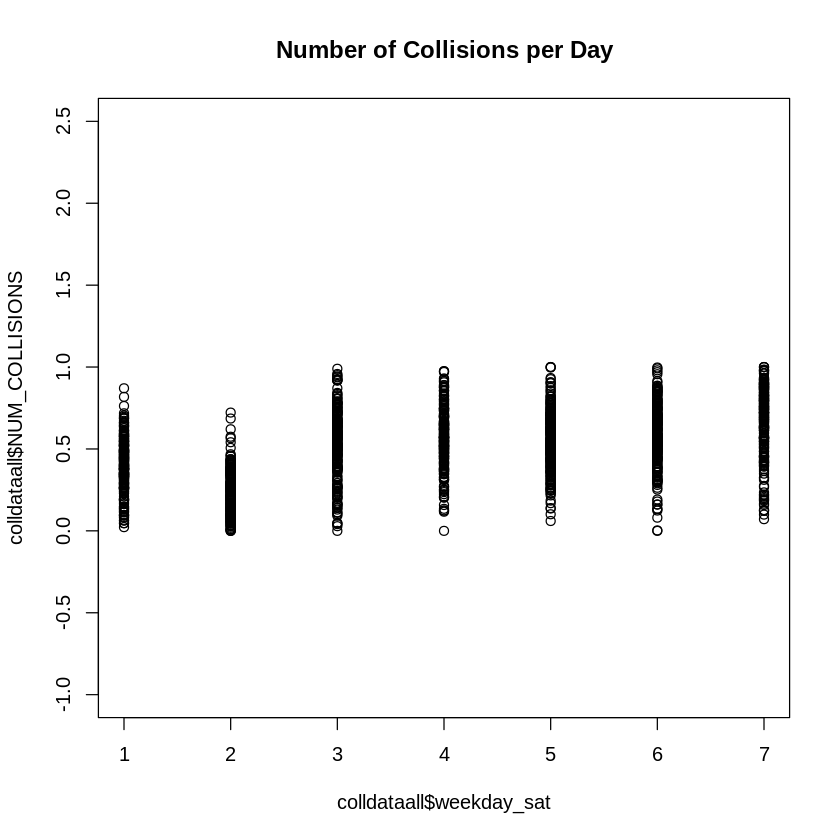

In [1336]:
plot(colldataall$weekday_sat, colldataall$NUM_COLLISIONS, main = "Number of Collisions per Day", ylim = c(-1, 2.5))

In [1337]:
cor(colldataall$weekday_sat, colldataall$NUM_COLLISIONS)

[1] 0.4790868

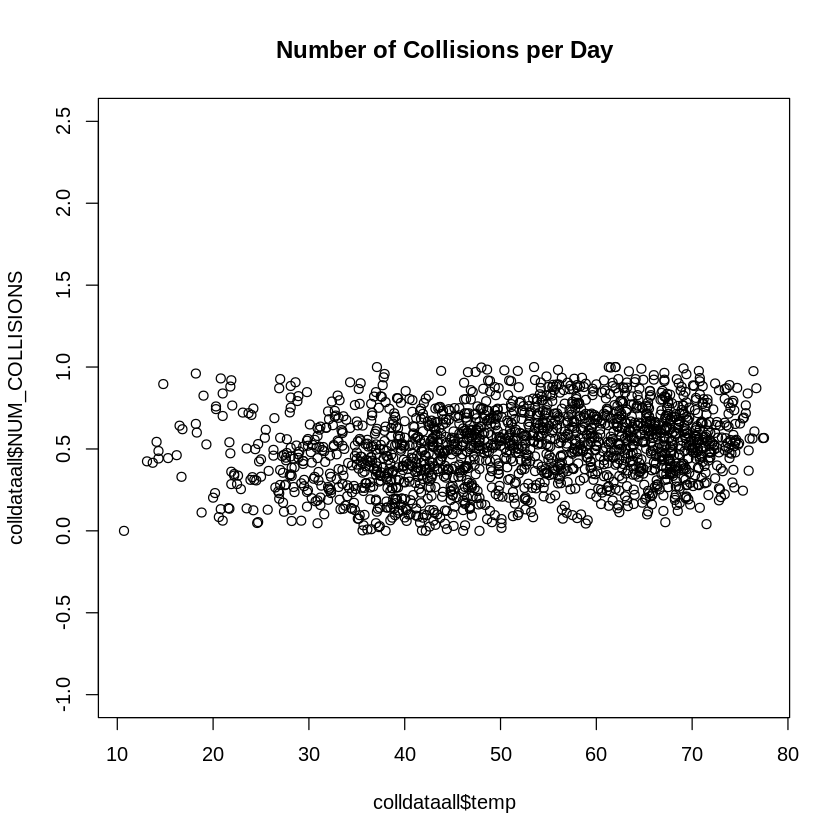

In [1338]:
plot(colldataall$temp, colldataall$NUM_COLLISIONS, main = "Number of Collisions per Day", ylim = c(-1, 2.5))

In [1339]:
cor(colldataall$temp, colldataall$NUM_COLLISIONS)

[1] 0.2253167

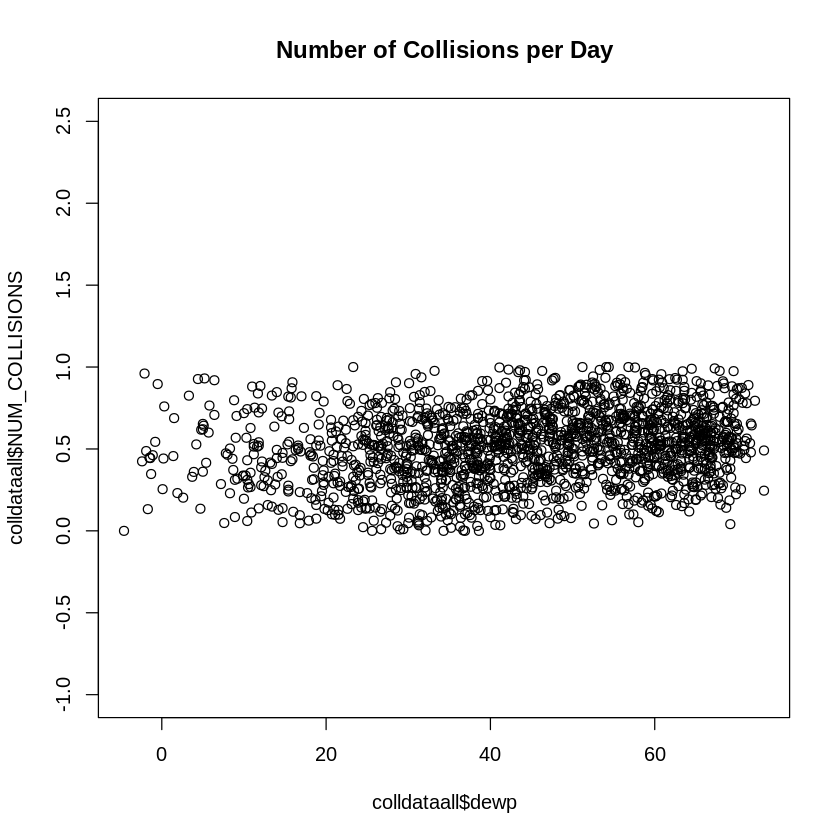

In [1340]:
plot(colldataall$dewp, colldataall$NUM_COLLISIONS, main = "Number of Collisions per Day", ylim = c(-1, 2.5))

In [1341]:
cor(colldataall$dewp, colldataall$NUM_COLLISIONS)

[1] 0.2088505

###Data2

In [1342]:
nrow(coll2013gx)
nrow(coll2014gx)
nrow(coll2015gx)
nrow(coll2016gx)
nrow(coll2017gx)

[1] 358

[1] 355

[1] 341

[1] 361

[1] 356

In [1343]:
colldataall2 <- rbind(coll2013gx, coll2014gx, coll2015gx, coll2016gx, coll2017gx)

In [1344]:
nrow(colldataall2)

[1] 1771

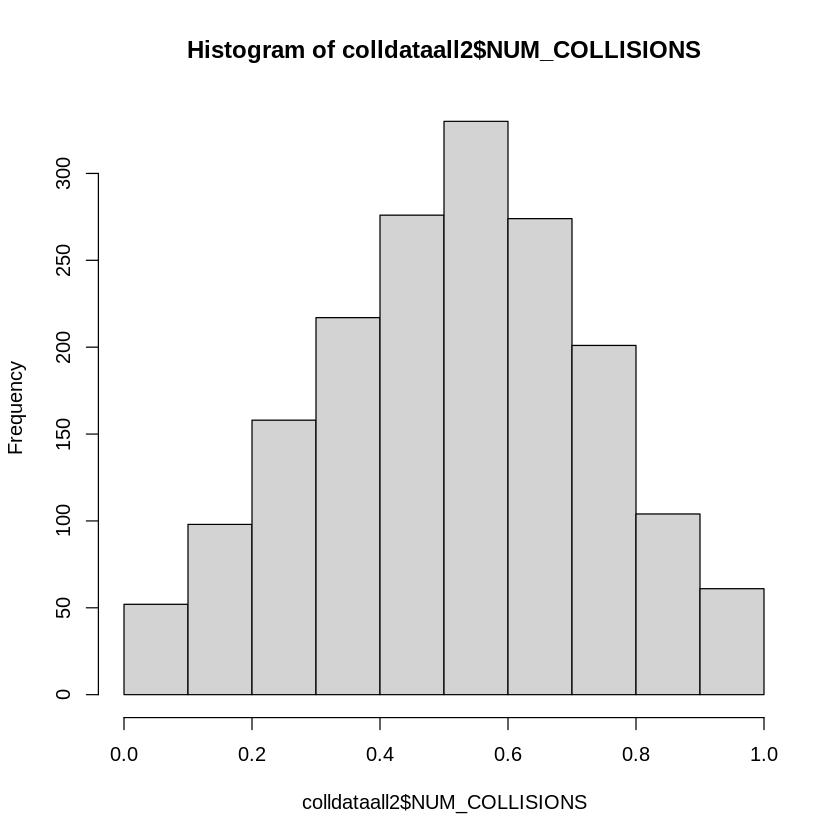

In [1345]:
hist(colldataall2$NUM_COLLISIONS, breaks = 12)

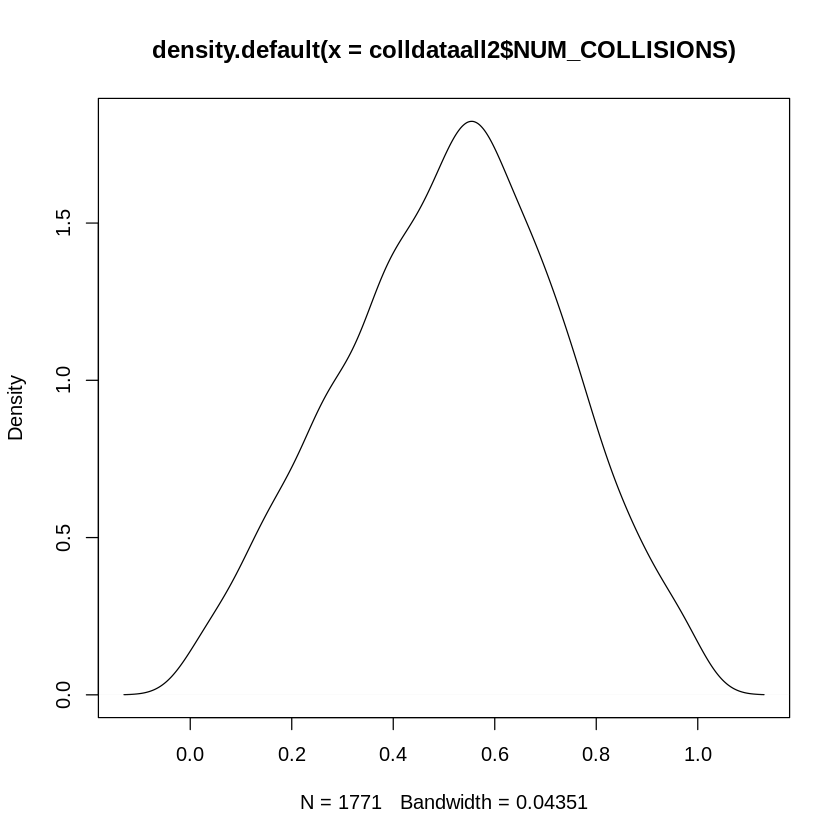

In [1346]:
plot(density(colldataall2$NUM_COLLISIONS))

In [1347]:
cor(colldataall2$weekday_sun, colldataall2$NUM_COLLISIONS)
cor(colldataall2$weekday_sat, colldataall2$NUM_COLLISIONS)
cor(colldataall2$temp, colldataall2$NUM_COLLISIONS)
cor(colldataall2$dewp, colldataall2$NUM_COLLISIONS)

[1] 0.5321481

[1] 0.4809279

[1] 0.2410504

[1] 0.2228878

##Seasonality

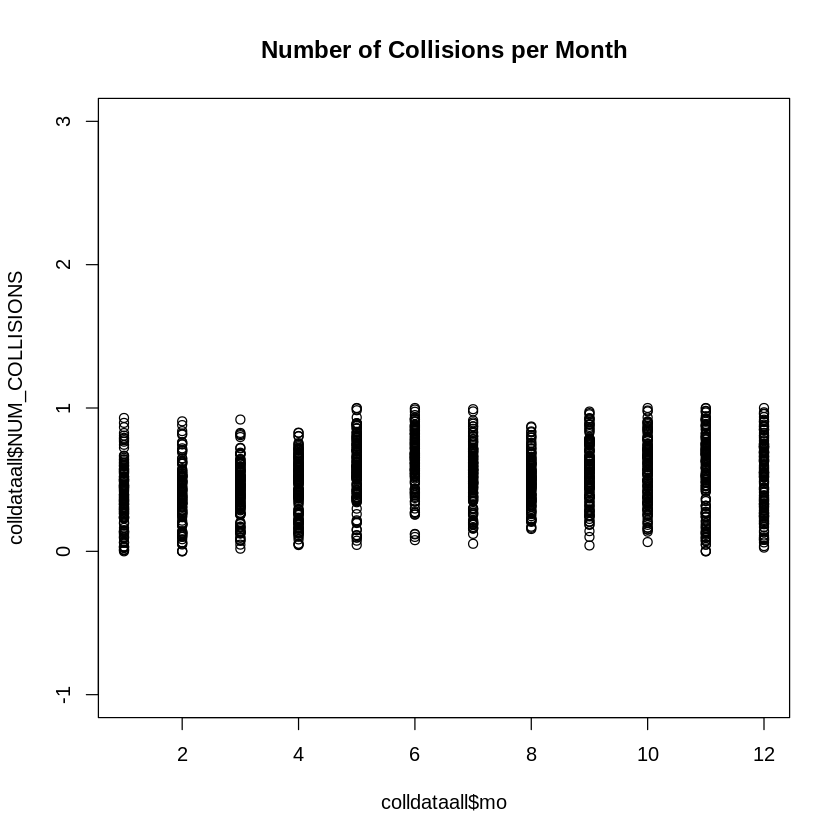

In [1348]:
plot(colldataall$mo, colldataall$NUM_COLLISIONS, main = "Number of Collisions per Month", ylim = c(-1, 3))

In [1349]:
cor(colldataall$mo, colldataall$NUM_COLLISIONS)
cor(colldataall2$mo, colldataall2$NUM_COLLISIONS)

[1] 0.2111186

[1] 0.2223644

Now that the outliers have been removed and data normalized, let us return to the issue of seasonality. Taking a look at the months, there is a relationship between this and number of collisions, but it is difficult to see the variation from month to month alone.  

Here we have added a seasons column spring - winter (1-4) and split the data into seasons to test the correlation for our 3 variables with these separate.  





In [1350]:
colldataall <- colldataall %>%
    mutate(season = case_when(mo == 1 ~ 4,
                              mo == 2 ~ 4,
                              mo == 3 ~ 1,
                              mo == 4 ~ 1,
                              mo == 5 ~ 1,
                              mo == 6 ~ 2,
                              mo == 7 ~ 2,
                              mo == 8 ~ 2,
                              mo == 9 ~ 3,
                              mo == 10 ~ 3,
                              mo == 11 ~ 3,
                              mo == 12 ~ 1))
                             

In [1351]:
colldataall2 <- colldataall2 %>%
    mutate(season = case_when(mo == 1 ~ 4,
                              mo == 2 ~ 4,
                              mo == 3 ~ 1,
                              mo == 4 ~ 1,
                              mo == 5 ~ 1,
                              mo == 6 ~ 2,
                              mo == 7 ~ 2,
                              mo == 8 ~ 2,
                              mo == 9 ~ 3,
                              mo == 10 ~ 3,
                              mo == 11 ~ 3,
                              mo == 12 ~ 1))

In [1352]:
colldataall

,weekday_sat,weekday_sun,dayindex,dayofyear,day,year,mo,da,collision_date,temp,⋯,wdsp,mxpsd,gust,max,min,prcp,sndp,fog,NUM_COLLISIONS,season
,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>
1,4,4,1,1,2,2013,1,1,2013-01-01,38.0,⋯,15.0,21.0,28.0,41.0,33.1,0.00,999.9,0,0.00000000,4
2,5,5,2,2,3,2013,1,2,2013-01-02,27.5,⋯,12.4,15.9,25.1,33.1,21.9,0.00,999.9,0,0.27887324,4
3,6,6,3,3,4,2013,1,3,2013-01-03,21.8,⋯,9.8,18.1,24.1,28.9,16.0,0.00,999.9,0,0.47323944,4
4,7,7,4,4,5,2013,1,4,2013-01-04,32.2,⋯,11.3,22.0,29.9,41.0,24.1,0.00,999.9,0,0.34929577,4
5,1,2,5,5,6,2013,1,5,2013-01-05,37.3,⋯,13.2,20.0,28.0,42.1,30.9,0.00,999.9,0,0.02253521,4
6,2,1,6,6,7,2013,1,6,2013-01-06,35.7,⋯,5.9,15.0,20.0,44.1,23.0,0.01,999.9,0,0.03380282,4
7,3,3,7,7,1,2013,1,7,2013-01-07,35.9,⋯,8.5,17.1,22.0,42.1,28.0,0.01,999.9,0,0.39436620,4
8,4,4,8,8,2,2013,1,8,2013-01-08,39.8,⋯,10.4,17.1,25.1,48.0,25.0,0.00,999.9,0,0.37183099,4
9,5,5,9,9,3,2013,1,9,2013-01-09,39.9,⋯,5.3,11.1,999.9,46.0,28.0,0.00,999.9,1,0.29859155,4


In [1353]:
spring <- filter(colldataall, season == 1)
summer <- filter(colldataall, season == 2)
autumn <- filter(colldataall, season == 3)
winter <- filter(colldataall, season == 4)

In [1354]:
spring2 <- filter(colldataall2, season == 1)
summer2 <- filter(colldataall2, season == 2)
autumn2 <- filter(colldataall2, season == 3)
winter2 <- filter(colldataall2, season == 4)

In [1355]:
cor(spring$temp, spring$NUM_COLLISIONS)
cor(summer$temp, summer$NUM_COLLISIONS)
cor(autumn$temp, autumn$NUM_COLLISIONS)
cor(winter$temp, winter$NUM_COLLISIONS)

[1] 0.2055953

[1] -0.04736547

[1] 0.07002028

[1] -0.1487342

In [1356]:
cor(spring2$temp, spring2$NUM_COLLISIONS)
cor(summer2$temp, summer2$NUM_COLLISIONS)
cor(autumn2$temp, autumn2$NUM_COLLISIONS)
cor(winter2$temp, winter2$NUM_COLLISIONS)

[1] 0.2127525

[1] -0.05534608

[1] 0.07787522

[1] -0.1356841

In [1357]:
cor(spring$dewp, spring$NUM_COLLISIONS)
cor(summer$dewp, summer$NUM_COLLISIONS)
cor(autumn$dewp, autumn$NUM_COLLISIONS)
cor(winter$dewp, winter$NUM_COLLISIONS)

[1] 0.1900548

[1] -0.02379362

[1] 0.04869012

[1] -0.1328684

In [1358]:
cor(spring2$dewp, spring2$NUM_COLLISIONS)
cor(summer2$dewp, summer2$NUM_COLLISIONS)
cor(autumn2$dewp, autumn2$NUM_COLLISIONS)
cor(winter2$dewp, winter2$NUM_COLLISIONS)

[1] 0.1899809

[1] -0.03926706

[1] 0.0561929

[1] -0.107211

The figures are worse split out with summer and winter having poor negative relationships across both weather criteria. There will be more factors here relating to whether people are less likely to catch a cab in very good or very bad weather.  

Weekdays improved slightly if split out.  



In [1359]:
cor(spring$weekday_sun, spring$NUM_COLLISIONS)
cor(summer$weekday_sun, summer$NUM_COLLISIONS)
cor(autumn$weekday_sun, autumn$NUM_COLLISIONS)
cor(winter$weekday_sun, winter$NUM_COLLISIONS)

[1] 0.5394277

[1] 0.5903917

[1] 0.5602134

[1] 0.5573047

In [1360]:
cor(spring2$weekday_sun, spring2$NUM_COLLISIONS)
cor(summer2$weekday_sun, summer2$NUM_COLLISIONS)
cor(autumn2$weekday_sun, autumn2$NUM_COLLISIONS)
cor(winter2$weekday_sun, winter2$NUM_COLLISIONS)

[1] 0.5375691

[1] 0.5846114

[1] 0.5572756

[1] 0.577374

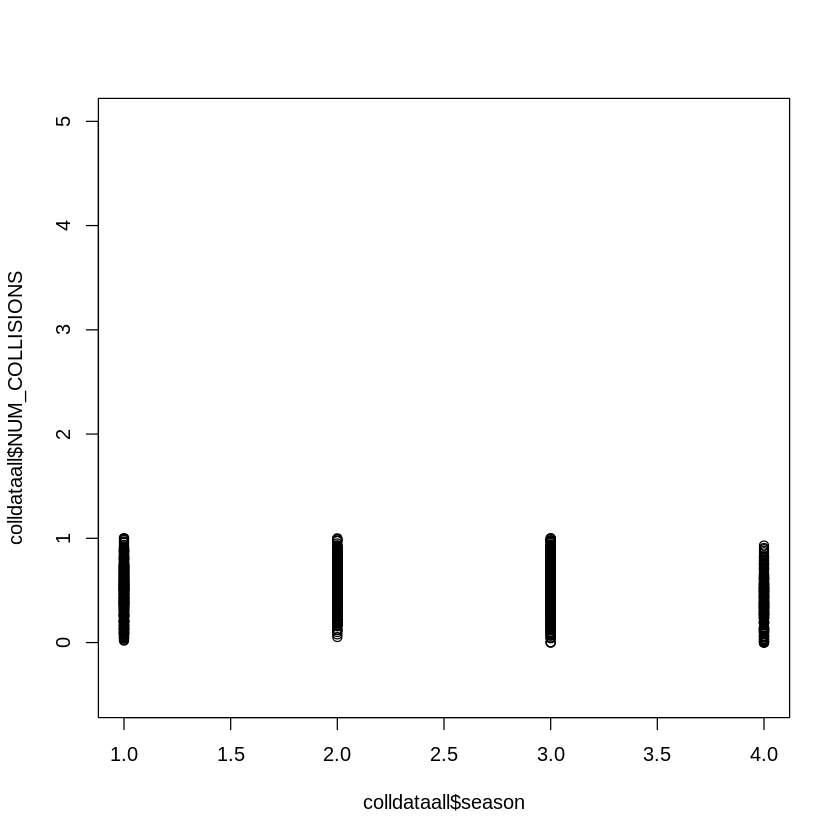

In [1361]:
plot(colldataall$season, colldataall$NUM_COLLISIONS, ylim = c(-0.5, 5))

In [1362]:
cor(colldataall$season, colldataall$NUM_COLLISIONS)

[1] -0.08041094

The annual distribution peaks around June/July. Even though there is higher variability in winter with some of the highest and lowest data points, in works out at the lowest number of collisions.  

Changing order from lowest to highest: Winter, Spring, Autumn, Summer, significantly improves the correlation for both datasets and we shall be taking this onward for our regression models.  



In [1379]:
testseas <- colldataall %>%
    mutate(season = case_when(season == 1 ~ 2,
                              season == 2 ~ 4,
                              season == 3 ~ 3,
                              season == 4 ~ 1))

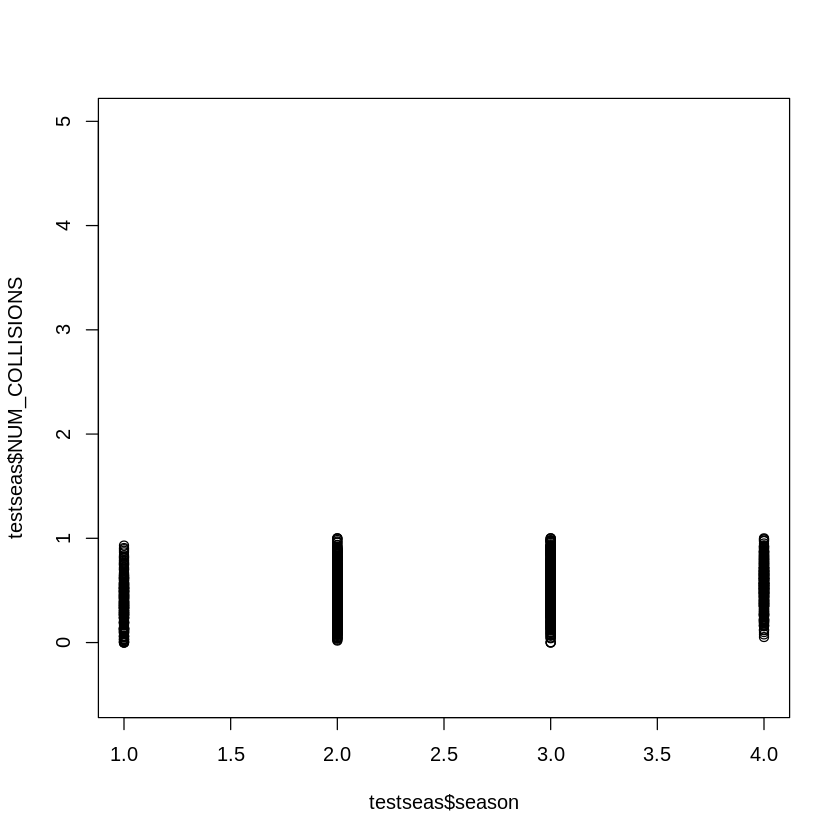

In [1380]:
plot(testseas$season, testseas$NUM_COLLISIONS, ylim = c(-0.5, 5))

In [1381]:
cor(testseas$season, testseas$NUM_COLLISIONS)

[1] 0.2267509

In [1382]:
testseas2 <- colldataall2 %>%
    mutate(season = case_when(season == 1 ~ 2,
                              season == 2 ~ 4,
                              season == 3 ~ 3,
                              season == 4 ~ 1))

In [1383]:
cor(testseas2$season, testseas2$NUM_COLLISIONS)

[1] 0.2440406

Prior to creating our regression model files, we shall replace the default values with 0.00, replace the snow values with the ones from our additional data, and extract a sample file of real examples to test our regression models.  


In [1384]:
testseas <- replace(testseas, testseas == 999.9, 0)
testseas <- replace(testseas, testseas == 99.99, 0)
testseas <- replace(testseas, testseas == 9999.9, 0)

testseas2 <- replace(testseas2, testseas2 == 999.9, 0)
testseas2 <- replace(testseas2, testseas2 == 99.99, 0)
testseas2 <- replace(testseas2, testseas2 == 9999.9, 0)

In [1385]:
snowcoll <- select(snowcoll, collision_date, sndp)

In [1386]:
head(snowcoll)

,collision_date,sndp
,<fct>,<dbl>
1,2012-07-26,0
2,2012-07-11,0
3,2012-07-19,0
4,2012-07-23,0
5,2012-07-14,0
6,2012-07-22,0


In [1387]:
testseas <- testseas %>%
 select(-sndp) %>%
 left_join(y = snowcoll, by = "collision_date")

In [1388]:
testseas2 <- testseas2 %>%
 select(-sndp) %>%
 left_join(y = snowcoll, by = "collision_date")

In [1389]:
tsample1 <- sample_n(testseas, 5)
# creating sample of 5

In [1390]:
tsample1

weekday_sat,weekday_sun,dayindex,dayofyear,day,year,mo,da,collision_date,temp,⋯,wdsp,mxpsd,gust,max,min,prcp,fog,NUM_COLLISIONS,season,sndp
<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
5,5,303,303,3,2013,10,30,2013-10-30,46.8,⋯,5.2,11.1,0.0,57.9,34.0,0.00,0,0.4985915,3,0.0
3,3,497,132,1,2014,5,12,2014-05-12,57.8,⋯,9.1,13.0,17.1,70.0,48.9,0.23,0,0.5573770,2,0.0
4,4,1541,80,2,2017,3,21,2017-03-21,39.9,⋯,7.9,11.1,0.0,50.0,34.0,0.00,0,0.5142857,2,0.0
3,3,413,48,1,2014,2,17,2014-02-17,24.3,⋯,13.1,19.0,28.0,32.0,19.0,0.00,0,0.3114754,1,9.1
7,7,1656,195,5,2017,7,14,2017-07-14,63.7,⋯,8.9,13.0,19.0,80.1,62.1,0.00,0,0.6987013,4,0.0


In [1391]:
nrow(testseas)

[1] 1753

In [1392]:
testseas <- filter(testseas, !(collision_date %in% unique(tsample1$collision_date)))
# removing these 5 entries from the dataset

In [1393]:
nrow(testseas)

[1] 1748

In [1394]:
nrow(testseas2)

[1] 1771

In [1395]:
tsample2 <- sample_n(testseas2, 5)
tsample2

weekday_sat,weekday_sun,dayindex,dayofyear,day,year,mo,da,collision_date,temp,⋯,wdsp,mxpsd,gust,max,min,prcp,fog,NUM_COLLISIONS,season,sndp
<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
1,2,1755,294,6,2017,10,21,2017-10-21,58.8,⋯,7.0,12.0,0,68.0,46.9,0.00,0,0.4031891,3,0.0
5,5,1472,11,3,2017,1,11,2017-01-11,45.0,⋯,15.1,27.0,34,50.0,28.9,0.33,0,0.5079727,1,1.2
5,5,786,56,3,2015,2,25,2015-02-25,29.9,⋯,12.4,20.0,27,33.8,23.0,0.02,0,0.6075269,1,2.0
4,4,603,238,2,2014,8,26,2014-08-26,63.0,⋯,3.5,8.9,0,72.0,53.1,0.00,0,0.6311475,4,0.0
6,6,927,197,4,2015,7,16,2015-07-16,67.3,⋯,16.6,22.0,28,82.0,60.1,0.00,0,0.7634409,4,0.0


In [1396]:
testseas2 <- filter(testseas2, !(collision_date %in% unique(tsample2$collision_date)))

In [1397]:
nrow(testseas2)

[1] 1766

In [1398]:
head(testseas)

,weekday_sat,weekday_sun,dayindex,dayofyear,day,year,mo,da,collision_date,temp,⋯,wdsp,mxpsd,gust,max,min,prcp,fog,NUM_COLLISIONS,season,sndp
,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<fct>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
1,4,4,1,1,2,2013,1,1,2013-01-01,38.0,⋯,15.0,21.0,28.0,41.0,33.1,0.00,0,0.00000000,1,0
2,5,5,2,2,3,2013,1,2,2013-01-02,27.5,⋯,12.4,15.9,25.1,33.1,21.9,0.00,0,0.27887324,1,0
3,6,6,3,3,4,2013,1,3,2013-01-03,21.8,⋯,9.8,18.1,24.1,28.9,16.0,0.00,0,0.47323944,1,0
4,7,7,4,4,5,2013,1,4,2013-01-04,32.2,⋯,11.3,22.0,29.9,41.0,24.1,0.00,0,0.34929577,1,0
5,1,2,5,5,6,2013,1,5,2013-01-05,37.3,⋯,13.2,20.0,28.0,42.1,30.9,0.00,0,0.02253521,1,0
6,2,1,6,6,7,2013,1,6,2013-01-06,35.7,⋯,5.9,15.0,20.0,44.1,23.0,0.01,0,0.03380282,1,0


Now we can select and export our linear regression model data.  



In [1399]:
lnrdata <- select(testseas, weekday_sun, season, temp, dewp, NUM_COLLISIONS)
lnrdata2 <- select(testseas2, weekday_sun, season, temp, dewp, NUM_COLLISIONS)

In [1400]:
head(lnrdata)
head(lnrdata2)

,weekday_sun,season,temp,dewp,NUM_COLLISIONS
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,4,1,38.0,25.6,0.00000000
2,5,1,27.5,12.1,0.27887324
3,6,1,21.8,7.8,0.47323944
4,7,1,32.2,21.1,0.34929577
5,2,1,37.3,24.5,0.02253521
6,1,1,35.7,31.3,0.03380282


,weekday_sun,season,temp,dewp,NUM_COLLISIONS
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,4,1,38.0,25.6,0.00000000
2,5,1,27.5,12.1,0.27423823
3,6,1,21.8,7.8,0.46537396
4,7,1,32.2,21.1,0.34349030
5,2,1,37.3,24.5,0.02216066
6,1,1,35.7,31.3,0.03324100


In [1401]:
write.csv(lnrdata, file="/content/lnrdata.csv")

In [1402]:
write.csv(lnrdata2, file="/content/lnrdata2.csv")

In [1403]:
write.csv(tsample1, file="/content/tsample1.csv")

In [1404]:
write.csv(tsample2, file="/content/tsample2.csv")

##DNN File

For the DNN we will use one hot encoding for our categorical data as per below.  We will apply this to the values for weekday_sun, month, and season and include the remaining data to the end file.  


###Data1

In [1405]:
colldataalldnn <- testseas

In [1406]:
colldataalldnn$mo[colldataalldnn$mo == 1] <- 'Jan'
colldataalldnn$mo[colldataalldnn$mo == 2] <- 'Feb'
colldataalldnn$mo[colldataalldnn$mo == 3] <- 'Mar'
colldataalldnn$mo[colldataalldnn$mo == 4] <- 'Apr'
colldataalldnn$mo[colldataalldnn$mo == 5] <- 'May'
colldataalldnn$mo[colldataalldnn$mo == 6] <- 'Jun'
colldataalldnn$mo[colldataalldnn$mo == 7] <- 'Jul'
colldataalldnn$mo[colldataalldnn$mo == 8] <- 'Aug'
colldataalldnn$mo[colldataalldnn$mo == 9] <- 'Sep'
colldataalldnn$mo[colldataalldnn$mo == 10] <- 'Oct'
colldataalldnn$mo[colldataalldnn$mo == 11] <- 'Nov'
colldataalldnn$mo[colldataalldnn$mo == 12] <- 'Dec'

In [1407]:
colldataalldnn$weekday_sun[colldataalldnn$weekday_sun == 1] <- 'Sun'
colldataalldnn$weekday_sun[colldataalldnn$weekday_sun == 2] <- 'Sat'
colldataalldnn$weekday_sun[colldataalldnn$weekday_sun == 3] <- 'Mon'
colldataalldnn$weekday_sun[colldataalldnn$weekday_sun == 4] <- 'Tue'
colldataalldnn$weekday_sun[colldataalldnn$weekday_sun == 5] <- 'Wed'
colldataalldnn$weekday_sun[colldataalldnn$weekday_sun == 6] <- 'Thu'
colldataalldnn$weekday_sun[colldataalldnn$weekday_sun == 7] <- 'Fri'

In [1408]:
colldataalldnn$season[colldataalldnn$season == 1] <- 'Winter'
colldataalldnn$season[colldataalldnn$season == 2] <- 'Spring'
colldataalldnn$season[colldataalldnn$season == 3] <- 'Autumn'
colldataalldnn$season[colldataalldnn$season == 4] <- 'Summer'


In [1409]:
head(colldataalldnn)
nrow(colldataalldnn)

,weekday_sat,weekday_sun,dayindex,dayofyear,day,year,mo,da,collision_date,temp,⋯,wdsp,mxpsd,gust,max,min,prcp,fog,NUM_COLLISIONS,season,sndp
,<dbl>,<chr>,<dbl>,<dbl>,<int>,<int>,<chr>,<int>,<fct>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<dbl>
1,4,Tue,1,1,2,2013,Jan,1,2013-01-01,38.0,⋯,15.0,21.0,28.0,41.0,33.1,0.00,0,0.00000000,Winter,0
2,5,Wed,2,2,3,2013,Jan,2,2013-01-02,27.5,⋯,12.4,15.9,25.1,33.1,21.9,0.00,0,0.27887324,Winter,0
3,6,Thu,3,3,4,2013,Jan,3,2013-01-03,21.8,⋯,9.8,18.1,24.1,28.9,16.0,0.00,0,0.47323944,Winter,0
4,7,Fri,4,4,5,2013,Jan,4,2013-01-04,32.2,⋯,11.3,22.0,29.9,41.0,24.1,0.00,0,0.34929577,Winter,0
5,1,Sat,5,5,6,2013,Jan,5,2013-01-05,37.3,⋯,13.2,20.0,28.0,42.1,30.9,0.00,0,0.02253521,Winter,0
6,2,Sun,6,6,7,2013,Jan,6,2013-01-06,35.7,⋯,5.9,15.0,20.0,44.1,23.0,0.01,0,0.03380282,Winter,0


[1] 1748

In [1410]:
months <- model.matrix(~0+colldataalldnn$mo)
head(months)
nrow(months)

,colldataalldnn$moApr,colldataalldnn$moAug,colldataalldnn$moDec,colldataalldnn$moFeb,colldataalldnn$moJan,colldataalldnn$moJul,colldataalldnn$moJun,colldataalldnn$moMar,colldataalldnn$moMay,colldataalldnn$moNov,colldataalldnn$moOct,colldataalldnn$moSep
1,0,0,0,0,1,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,0,0


[1] 1748

In [1411]:
colnames(months) <- c("Apr", "Aug", "Dec", "Feb", "Jan", "Jul", "Jun", "Mar", "May", "Nov", "Oct", "Sep")
head(months)

,Apr,Aug,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,Oct,Sep
1,0,0,0,0,1,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,0,0


In [1412]:
daysofweek <- model.matrix(~0+colldataalldnn$weekday_sun)
head(daysofweek)
nrow(daysofweek)

,colldataalldnn$weekday_sunFri,colldataalldnn$weekday_sunMon,colldataalldnn$weekday_sunSat,colldataalldnn$weekday_sunSun,colldataalldnn$weekday_sunThu,colldataalldnn$weekday_sunTue,colldataalldnn$weekday_sunWed
1,0,0,0,0,0,1,0
2,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0
4,1,0,0,0,0,0,0
5,0,0,1,0,0,0,0
6,0,0,0,1,0,0,0


[1] 1748

In [1413]:
colnames(daysofweek) <- c("Fri", "Mon", "Sat", "Sun", "Thu", "Tue", "Wed")
head(daysofweek)

,Fri,Mon,Sat,Sun,Thu,Tue,Wed
1,0,0,0,0,0,1,0
2,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0
4,1,0,0,0,0,0,0
5,0,0,1,0,0,0,0
6,0,0,0,1,0,0,0


In [1414]:
seasons <- model.matrix(~0+colldataalldnn$season)
head(seasons)
nrow(seasons)

,colldataalldnn$seasonAutumn,colldataalldnn$seasonSpring,colldataalldnn$seasonSummer,colldataalldnn$seasonWinter
1,0,0,0,1
2,0,0,0,1
3,0,0,0,1
4,0,0,0,1
5,0,0,0,1
6,0,0,0,1


[1] 1748

In [1415]:
colnames(seasons) <- c("Autumn", "Spring", "Summer", "Winter")
head(seasons)

,Autumn,Spring,Summer,Winter
1,0,0,0,1
2,0,0,0,1
3,0,0,0,1
4,0,0,0,1
5,0,0,0,1
6,0,0,0,1


In [1416]:
dnndata1 <- data.frame(months, daysofweek, seasons, colldataalldnn$mxpsd, colldataalldnn$dewp, colldataalldnn$prcp, colldataalldnn$gust, colldataalldnn$year, colldataalldnn$temp, colldataalldnn$wdsp, colldataalldnn$sndp, colldataalldnn$fog, colldataalldnn$NUM_COLLISIONS)

In [1417]:
colnames(dnndata1)[which(names(dnndata1) == "colldataalldnn.mxpsd")] <- "mxpsd"
colnames(dnndata1)[which(names(dnndata1) == "colldataalldnn.dewp")] <- "dewp"
colnames(dnndata1)[which(names(dnndata1) == "colldataalldnn.prcp")] <- "prcp"
colnames(dnndata1)[which(names(dnndata1) == "colldataalldnn.gust")] <- "gust"
colnames(dnndata1)[which(names(dnndata1) == "colldataalldnn.year")] <- "year"
colnames(dnndata1)[which(names(dnndata1) == "colldataalldnn.temp")] <- "temp"
colnames(dnndata1)[which(names(dnndata1) == "colldataalldnn.wdsp")] <- "wdsp"
colnames(dnndata1)[which(names(dnndata1) == "colldataalldnn.sndp")] <- "sndp"
colnames(dnndata1)[which(names(dnndata1) == "colldataalldnn.fog")] <- "fog"
colnames(dnndata1)[which(names(dnndata1) == "colldataalldnn.NUM_COLLISIONS")] <- "NUM_COLLISIONS"

In [1418]:
head(dnndata1)

,Apr,Aug,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,⋯,mxpsd,dewp,prcp,gust,year,temp,wdsp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
1,0,0,0,0,1,0,0,0,0,0,⋯,21.0,25.6,0.00,28.0,2013,38.0,15.0,0,0,0.00000000
2,0,0,0,0,1,0,0,0,0,0,⋯,15.9,12.1,0.00,25.1,2013,27.5,12.4,0,0,0.27887324
3,0,0,0,0,1,0,0,0,0,0,⋯,18.1,7.8,0.00,24.1,2013,21.8,9.8,0,0,0.47323944
4,0,0,0,0,1,0,0,0,0,0,⋯,22.0,21.1,0.00,29.9,2013,32.2,11.3,0,0,0.34929577
5,0,0,0,0,1,0,0,0,0,0,⋯,20.0,24.5,0.00,28.0,2013,37.3,13.2,0,0,0.02253521
6,0,0,0,0,1,0,0,0,0,0,⋯,15.0,31.3,0.01,20.0,2013,35.7,5.9,0,0,0.03380282


In [1419]:
write.csv(dnndata1, file="/content/dnndata1.csv")

###Data2

In [1420]:
colldataalldnn2 <- testseas2

In [1421]:
colldataalldnn2$mo[colldataalldnn2$mo == 1] <- 'Jan'
colldataalldnn2$mo[colldataalldnn2$mo == 2] <- 'Feb'
colldataalldnn2$mo[colldataalldnn2$mo == 3] <- 'Mar'
colldataalldnn2$mo[colldataalldnn2$mo == 4] <- 'Apr'
colldataalldnn2$mo[colldataalldnn2$mo == 5] <- 'May'
colldataalldnn2$mo[colldataalldnn2$mo == 6] <- 'Jun'
colldataalldnn2$mo[colldataalldnn2$mo == 7] <- 'Jul'
colldataalldnn2$mo[colldataalldnn2$mo == 8] <- 'Aug'
colldataalldnn2$mo[colldataalldnn2$mo == 9] <- 'Sep'
colldataalldnn2$mo[colldataalldnn2$mo == 10] <- 'Oct'
colldataalldnn2$mo[colldataalldnn2$mo == 11] <- 'Nov'
colldataalldnn2$mo[colldataalldnn2$mo == 12] <- 'Dec'

In [1422]:
colldataalldnn2$weekday_sun[colldataalldnn2$weekday_sun == 1] <- 'Sun'
colldataalldnn2$weekday_sun[colldataalldnn2$weekday_sun == 2] <- 'Sat'
colldataalldnn2$weekday_sun[colldataalldnn2$weekday_sun == 3] <- 'Mon'
colldataalldnn2$weekday_sun[colldataalldnn2$weekday_sun == 4] <- 'Tue'
colldataalldnn2$weekday_sun[colldataalldnn2$weekday_sun == 5] <- 'Wed'
colldataalldnn2$weekday_sun[colldataalldnn2$weekday_sun == 6] <- 'Thu'
colldataalldnn2$weekday_sun[colldataalldnn2$weekday_sun == 7] <- 'Fri'

In [1423]:
colldataalldnn2$season[colldataalldnn2$season == 1] <- 'Winter'
colldataalldnn2$season[colldataalldnn2$season == 2] <- 'Spring'
colldataalldnn2$season[colldataalldnn2$season == 3] <- 'Autumn'
colldataalldnn2$season[colldataalldnn2$season == 4] <- 'Summer'

In [1424]:
head(colldataalldnn2)
nrow(colldataalldnn2)

,weekday_sat,weekday_sun,dayindex,dayofyear,day,year,mo,da,collision_date,temp,⋯,wdsp,mxpsd,gust,max,min,prcp,fog,NUM_COLLISIONS,season,sndp
,<dbl>,<chr>,<dbl>,<dbl>,<int>,<int>,<chr>,<int>,<fct>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<dbl>
1,4,Tue,1,1,2,2013,Jan,1,2013-01-01,38.0,⋯,15.0,21.0,28.0,41.0,33.1,0.00,0,0.00000000,Winter,0
2,5,Wed,2,2,3,2013,Jan,2,2013-01-02,27.5,⋯,12.4,15.9,25.1,33.1,21.9,0.00,0,0.27423823,Winter,0
3,6,Thu,3,3,4,2013,Jan,3,2013-01-03,21.8,⋯,9.8,18.1,24.1,28.9,16.0,0.00,0,0.46537396,Winter,0
4,7,Fri,4,4,5,2013,Jan,4,2013-01-04,32.2,⋯,11.3,22.0,29.9,41.0,24.1,0.00,0,0.34349030,Winter,0
5,1,Sat,5,5,6,2013,Jan,5,2013-01-05,37.3,⋯,13.2,20.0,28.0,42.1,30.9,0.00,0,0.02216066,Winter,0
6,2,Sun,6,6,7,2013,Jan,6,2013-01-06,35.7,⋯,5.9,15.0,20.0,44.1,23.0,0.01,0,0.03324100,Winter,0


[1] 1766

In [1425]:
months2 <- model.matrix(~0+colldataalldnn2$mo)
head(months2)
nrow(months2)

,colldataalldnn2$moApr,colldataalldnn2$moAug,colldataalldnn2$moDec,colldataalldnn2$moFeb,colldataalldnn2$moJan,colldataalldnn2$moJul,colldataalldnn2$moJun,colldataalldnn2$moMar,colldataalldnn2$moMay,colldataalldnn2$moNov,colldataalldnn2$moOct,colldataalldnn2$moSep
1,0,0,0,0,1,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,0,0


[1] 1766

In [1426]:
colnames(months2) <- c("Apr", "Aug", "Dec", "Feb", "Jan", "Jul", "Jun", "Mar", "May", "Nov", "Oct", "Sep")
head(months2)

,Apr,Aug,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,Oct,Sep
1,0,0,0,0,1,0,0,0,0,0,0,0
2,0,0,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0,0
5,0,0,0,0,1,0,0,0,0,0,0,0
6,0,0,0,0,1,0,0,0,0,0,0,0


In [1427]:
daysofweek2 <- model.matrix(~0+colldataalldnn2$weekday_sun)
head(daysofweek2)
nrow(daysofweek2)

,colldataalldnn2$weekday_sunFri,colldataalldnn2$weekday_sunMon,colldataalldnn2$weekday_sunSat,colldataalldnn2$weekday_sunSun,colldataalldnn2$weekday_sunThu,colldataalldnn2$weekday_sunTue,colldataalldnn2$weekday_sunWed
1,0,0,0,0,0,1,0
2,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0
4,1,0,0,0,0,0,0
5,0,0,1,0,0,0,0
6,0,0,0,1,0,0,0


[1] 1766

In [1428]:
colnames(daysofweek2) <- c("Fri", "Mon", "Sat", "Sun", "Thu", "Tue", "Wed")
head(daysofweek2)

,Fri,Mon,Sat,Sun,Thu,Tue,Wed
1,0,0,0,0,0,1,0
2,0,0,0,0,0,0,1
3,0,0,0,0,1,0,0
4,1,0,0,0,0,0,0
5,0,0,1,0,0,0,0
6,0,0,0,1,0,0,0


In [1429]:
seasons2 <- model.matrix(~0+colldataalldnn2$season)
head(seasons2)
nrow(seasons2)

,colldataalldnn2$seasonAutumn,colldataalldnn2$seasonSpring,colldataalldnn2$seasonSummer,colldataalldnn2$seasonWinter
1,0,0,0,1
2,0,0,0,1
3,0,0,0,1
4,0,0,0,1
5,0,0,0,1
6,0,0,0,1


[1] 1766

In [1430]:
colnames(seasons2) <- c("Autumn", "Spring", "Summer", "Winter")
head(seasons2)

,Autumn,Spring,Summer,Winter
1,0,0,0,1
2,0,0,0,1
3,0,0,0,1
4,0,0,0,1
5,0,0,0,1
6,0,0,0,1


In [1431]:
dnndata2 <- data.frame(months2, daysofweek2, seasons2, colldataalldnn2$mxpsd, colldataalldnn2$dewp, colldataalldnn2$prcp, colldataalldnn2$gust, colldataalldnn2$year, colldataalldnn2$temp, colldataalldnn2$wdsp, colldataalldnn2$sndp, colldataalldnn2$fog, colldataalldnn2$NUM_COLLISIONS)

In [1432]:
colnames(dnndata2)[which(names(dnndata2) == "colldataalldnn2.mxpsd")] <- "mxpsd"
colnames(dnndata2)[which(names(dnndata2) == "colldataalldnn2.dewp")] <- "dewp"
colnames(dnndata2)[which(names(dnndata2) == "colldataalldnn2.prcp")] <- "prcp"
colnames(dnndata2)[which(names(dnndata2) == "colldataalldnn2.gust")] <- "gust"
colnames(dnndata2)[which(names(dnndata2) == "colldataalldnn2.year")] <- "year"
colnames(dnndata2)[which(names(dnndata2) == "colldataalldnn2.temp")] <- "temp"
colnames(dnndata2)[which(names(dnndata2) == "colldataalldnn2.wdsp")] <- "wdsp"
colnames(dnndata2)[which(names(dnndata2) == "colldataalldnn2.sndp")] <- "sndp"
colnames(dnndata2)[which(names(dnndata2) == "colldataalldnn2.fog")] <- "fog"
colnames(dnndata2)[which(names(dnndata2) == "colldataalldnn2.NUM_COLLISIONS")] <- "NUM_COLLISIONS"

In [1433]:
head(dnndata2)

,Apr,Aug,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,⋯,mxpsd,dewp,prcp,gust,year,temp,wdsp,sndp,fog,NUM_COLLISIONS
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
1,0,0,0,0,1,0,0,0,0,0,⋯,21.0,25.6,0.00,28.0,2013,38.0,15.0,0,0,0.00000000
2,0,0,0,0,1,0,0,0,0,0,⋯,15.9,12.1,0.00,25.1,2013,27.5,12.4,0,0,0.27423823
3,0,0,0,0,1,0,0,0,0,0,⋯,18.1,7.8,0.00,24.1,2013,21.8,9.8,0,0,0.46537396
4,0,0,0,0,1,0,0,0,0,0,⋯,22.0,21.1,0.00,29.9,2013,32.2,11.3,0,0,0.34349030
5,0,0,0,0,1,0,0,0,0,0,⋯,20.0,24.5,0.00,28.0,2013,37.3,13.2,0,0,0.02216066
6,0,0,0,0,1,0,0,0,0,0,⋯,15.0,31.3,0.01,20.0,2013,35.7,5.9,0,0,0.03324100


In [1434]:
write.csv(dnndata2, file="/content/dnndata2.csv")

# Conclusions  

We have ascertained reasonable relationships for linear regression models for weekdays, seasons, temperature and dew point. From our analysed and cleaned up data we have also created multiple output files for Deep Neural Network models. There are likely more complex relationships between the weather variables investigated in this report that cannot be determined via linear regression models.   


# References  

National Oceanic and Atmospheric Administration (NOAA)(2021) *Key to METAR Surface Weather Observations* [online]. Available from <https://www.ncdc.noaa.gov/orders/qclcd/ExplanationofCodes.htm> [26 February 2021]